# Final Project - Mingtao Gao

In [1]:
import lucem_illud #Special module written for this class

import requests
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm #Still for graphics
import matplotlib.colors # For nice colours
import wordcloud
import numpy as np
import scipy
import glob
import seaborn as sns
import sklearn.manifold
import itertools
import json
import urllib.parse
from bs4 import BeautifulSoup as bs
import spacy #comp-linguistics
import graphviz #displays the graphs
import gensim#For topic modeling

#These are from the standard library
import os.path
import zipfile
import subprocess
import io
import tempfile

#To process text data
import re
import time
import string
import statsmodels.formula.api as smf
from gensim import corpora, models
from collections import Counter
from selenium import webdriver
from webdriver_manager.chrome import ChromeDriverManager
from datetime import datetime
from langdetect import detect
from textblob import Word
import nltk
from nltk.corpus import stopwords
from nltk.sentiment.vader import SentimentIntensityAnalyzer

import sklearn
import sklearn.feature_extraction.text
import sklearn.pipeline
import sklearn.preprocessing
import sklearn.datasets
import sklearn.cluster
import sklearn.decomposition
import sklearn.metrics
import sklearn.naive_bayes
import sklearn.tree
import sklearn.ensemble
import sklearn.neural_network

import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

## Rretreiving and Preparing Text for Machines (W1)

### Scrape Instagram Posts

The code below aims to scrape Instagram data from a give hashtag. It generates a dataframe with all posts' information stored under a given hashtag. 

Reference:
https://medium.com/swlh/tutorial-web-scraping-instagrams-most-precious-resource-corgis-235bf0389b0c

In [2]:
import nltk
from nltk.corpus import stopwords
from nltk.sentiment.vader import SentimentIntensityAnalyzer

In [3]:
# This function is used to scrape posts links from a give hashtag
def scrape_hashtag(hashtag, num_posts):
    browser = webdriver.Chrome(ChromeDriverManager().install())
    browser.get('https://www.instagram.com/accounts/login/')
    time.sleep(30) #Time to log in for scraping
    browser.get('https://www.instagram.com/explore/tags/' + hashtag)
    Pagelength = browser.execute_script("window.scrollTo(0, document.body.scrollHeight);")
    links=[]
    
    # Repetitively scolling down and scraping new data until it reaches to num_posts
    while len(links) <= num_posts:
        source = browser.page_source
        data = bs(source, 'html.parser')
        body = data.find('body')
        script = body.find('article')
        
        # Scrape the link to the post under the hashtag
        for link in script.findAll('a'):
            if re.match("/p", link.get('href')):
                if 'https://www.instagram.com'+link.get('href') not in links:
                    links.append('https://www.instagram.com'+link.get('href'))
                    
        scroll_down = "window.scrollTo(0, document.body.scrollHeight);"
        browser.execute_script(scroll_down)
        time.sleep(3)  
        
    return links

In [4]:
# This function is used to generate dataframe from a list of post links
def scrape_post(post_lst, ins_data):
    browser = webdriver.Chrome(ChromeDriverManager().install())
    browser.get('https://www.instagram.com/accounts/login/')
    time.sleep(30) #Time to log in for scraping
    
    for i in range(len(post_lst)):
        info = {}
        browser.get(post_lst[i])
        time.sleep(2)
        source = browser.page_source
        soup = bs(source, "html.parser")
        scripts = soup.find_all("script")
        
        # If the post link does not contain the post anymore, skip the link
        if len(scripts) < 7:
            continue

        # Find the script that contains information related to the post and user
        for script in scripts:
            if script.text[:18] == "window._sharedData":
                break
                
        try:
            # Find out the information that we need from the script
            data = json.loads(script.contents[0][21:-1])
            if not data["entry_data"]["PostPage"][0]["graphql"]["shortcode_media"]:
                print('hii')
                continue
            image_data = data["entry_data"]["PostPage"][0]["graphql"]["shortcode_media"]
            info["timestamp"] = datetime.fromtimestamp(image_data["taken_at_timestamp"])
            info["caption"] = str(image_data["edge_media_to_caption"]["edges"][0]["node"]["text"])
            info["user"] = str(image_data["owner"]["username"])
            info["full_name"] = str(image_data["owner"]["full_name"])
            info["likes"] = image_data["edge_media_preview_like"]["count"]
            info["image_url"] = str(image_data["display_url"])
            info["dimensions"] = image_data["dimensions"]

            # Store the post location, but some posts do not have a location in script
            location = image_data["location"]
            if location:
                if location["address_json"]:
                    info["location"] = json.loads(location["address_json"])
                    info["country"] = info["location"]["country_code"]

            # Store tagged account that appeared in the post, some posts do not have
            tagged_account = []
            for edge in image_data["edge_media_to_tagged_user"]["edges"]:
                tagged_account.append(edge["node"]["user"]["username"])
            info["tagged_account"] = tagged_account

            # Add each link's data to the dictionary
            ins_data[i] = info
        except:
            continue
    return pd.DataFrame(ins_data).T

In [5]:
# Scrape post data under the hashtags. Note this block of code will run for a extremely long time.
# I have collected data earlier and saved them into csv, and commented the code to show the scraping process.

raw_links = scrape_hashtag("lululemon", 3000)
ins_data = scrape_post(raw_links, {})
ins_data.to_csv('Lululemon_Instagram.csv')

In [6]:
raw_links = scrape_hashtag("underarmour", 3000)
ins_data = scrape_post(raw_links, {})
ins_data.to_csv('UnderArmour_Instagram.csv')

### Scrape Twitter Posts

In [7]:
import tweepy as tw
consumer_key = "OEma2BDMR252S8QItXpJttqGD"
consumer_secret = "wK85Jhq67X0WY0e7UShVjeOJNOdG5x8Xv2RuqlCBoVMrzCgTpp"
access_token = "1248088175102300161-7X0wVvv8Jhf33ykwBozin4RnFCAxc5"
access_token_secret = "yXYiqKTDwGoLxgEyil9yJfqxDZr9cwt1zCqoVJIrbbkvE"

auth = tw.OAuthHandler(consumer_key, consumer_secret)
auth.set_access_token(access_token, access_token_secret)
api = tw.API(auth,wait_on_rate_limit=True)

In [8]:
# Scrape tweets with keyword Lululemon
tweets = tw.Cursor(api.search, q='lululemon', lang='en').items(5000)
tweet_details = [[tweet.created_at, tweet.text, tweet.user.screen_name, tweet.user.location,
                  tweet.retweet_count, tweet.favorite_count, tweet.entities['hashtags'], 
                  tweet.entities['user_mentions']] for tweet in tweets]
columns = ['time', 'text', 'user_name', 'user_location', 'retweet_cnt', 'favorite_cnt', 
           'hashtags', 'user_mentions']
df = pd.DataFrame(tweet_details, columns = columns)
df['hashtags'] = df['hashtags'].apply(lambda x: [dic['text'] for dic in x])
df['user_mentions'] = df['user_mentions'].apply(lambda x: [dic['screen_name'] for dic in x])
df['is_retweet'] = df['text'].apply(lambda x: x[:2] == 'RT')
df.to_csv('Lululemon_Twitter.csv')

In [9]:
# Scrape tweets with keyword UnderArmour
tweets = tw.Cursor(api.search, q='underarmour', lang='en').items(5000)
tweet_details = [[tweet.created_at, tweet.text, tweet.user.screen_name, tweet.user.location,
                  tweet.retweet_count, tweet.favorite_count, tweet.entities['hashtags'], 
                  tweet.entities['user_mentions']] for tweet in tweets]
columns = ['time', 'text', 'user_name', 'user_location', 'retweet_cnt', 'favorite_cnt', 
           'hashtags', 'user_mentions']
df = pd.DataFrame(tweet_details, columns = columns)
df['hashtags'] = df['hashtags'].apply(lambda x: [dic['text'] for dic in x])
df['user_mentions'] = df['user_mentions'].apply(lambda x: [dic['screen_name'] for dic in x])
df['is_retweet'] = df['text'].apply(lambda x: x[:2] == 'RT')
df.to_csv('UnderArmour_Twitter.csv')

### Scrape Reddit Posts

Reference: https://www.storybench.org/how-to-scrape-reddit-with-python/

In [10]:
CLIENT_ID = "F6gNbHvgpGFCsg"
SECRET_TOKEN = "aI6rgzVffEoA9_lNLz-wI4ul6uWx8w"
auth = requests.auth.HTTPBasicAuth('CLIENT_ID', 'SECRET_TOKEN')
data = {'grant_type': 'password', 'username': 'mingTG01', 'password': 'gMt0612!'}

In [11]:
import praw
reddit = praw.Reddit(client_id='F6gNbHvgpGFCsg', client_secret='aI6rgzVffEoA9_lNLz-wI4ul6uWx8w',
                     user_agent='gmt_project', username='mingTG01', password='gMt0612!')

In [12]:
def scrape_subreddit(subreddit, limit):
    subreddit = reddit.subreddit(subreddit)
    new_subreddit = subreddit.new(limit=limit)
    top_subreddit = subreddit.top(limit=limit)
    hot_subreddit = subreddit.hot(limit=limit)
    
    data_dict = { "title":[], "upvotes":[], "upvote_ratio":[], "url":[], "num_commns": [], 
                   "created": [], "body":[]}
    data_dict = extract_post(data_dict, new_subreddit)
    data_dict = extract_post(data_dict, top_subreddit)
    data_dict = extract_post(data_dict, hot_subreddit)
    data_df = pd.DataFrame(data_dict)
    data_df['created'] = data_df['created'].apply(lambda x: datetime.fromtimestamp(x))
    return data_df

def extract_post(data_dict, subreddit):
    for submission in subreddit:
        data_dict["title"].append(submission.title)
        data_dict["upvotes"].append(submission.score)
        data_dict["upvote_ratio"].append(submission.upvote_ratio)
        data_dict["url"].append(submission.url)
        data_dict["num_commns"].append(submission.num_comments)
        data_dict["created"].append(submission.created_utc)
        data_dict["body"].append(submission.selftext)
    return data_dict

In [13]:
df = scrape_subreddit('lululemon', 5000)
df.to_csv('Lululemon_Reddit.csv')

In [14]:
df = scrape_subreddit('underarmour', 5000)
df.to_csv('UnderArmour_Reddit.csv')

### Load Dataset

In [2]:
RDT_LULU = "Lululemon_Reddit"
RDT_UDAR = "UnderArmour_Reddit"
TWT_LULU = "Lululemon_Twitter"
TWT_UDAR = "UnderArmour_Twitter"
INS_LULU = "Lululemon_Instagram"
INS_UDAR = "UnderArmour_Instagram"

In [3]:
rdt_lulu = pd.read_csv("Lululemon_Reddit.csv")
rdt_udar = pd.read_csv("UnderArmour_Reddit.csv")
twt_lulu = pd.read_csv("Lululemon_Twitter.csv")
twt_udar = pd.read_csv("UnderArmour_Twitter.csv")
ins_lulu = pd.read_csv("Lululemon_Instagram.csv")
ins_udar = pd.read_csv("UnderArmour_Instagram.csv")

In [4]:
#Combine the title and body of Reddit posts
rdt_lulu['body'].replace(np.nan, "", inplace=True)
rdt_udar['body'].replace(np.nan, "", inplace=True)
rdt_lulu['text'] = rdt_lulu['title'] + rdt_lulu['body']
rdt_udar['text'] = rdt_udar['title'] + rdt_udar['body']
ins_lulu.rename(columns={'caption': 'text'}, inplace=True)
ins_udar.rename(columns={'caption': 'text'}, inplace=True)

In [5]:
#Drop nan and duplicate text
def drop_na_dup(df):
    df.drop(columns=['Unnamed: 0'], inplace=True)
    df.drop_duplicates(inplace=True)
    df.dropna(subset = ["text"], inplace=True)
    
drop_na_dup(rdt_lulu)
drop_na_dup(rdt_udar)
drop_na_dup(twt_lulu)
drop_na_dup(twt_udar)
drop_na_dup(ins_lulu)
drop_na_dup(ins_udar)

In [6]:
pd.DataFrame({'data': ['Lululemon_Reddit', 'UnderArmour_Reddit', 'Lululemon_Twitter', 'UnderArmour_Twitter',
                      'Lululemon_Instagram', 'UnderArmour_Instagram'],
              'shape': [rdt_lulu.shape, rdt_udar.shape, twt_lulu.shape, twt_udar.shape,
                       ins_lulu.shape, ins_udar.shape]})

,data,shape
0,Lululemon_Reddit,"(2667, 8)"
1,UnderArmour_Reddit,"(1967, 9)"
2,Lululemon_Twitter,"(5000, 9)"
3,UnderArmour_Twitter,"(2481, 9)"
4,Lululemon_Instagram,"(2395, 10)"
5,UnderArmour_Instagram,"(2442, 10)"


## Counting Words & Phrases (W2)

### Tokenize Dataset

In [7]:
def tokenize(df, size=2400):
    df = df[:size]
    df['tokenized_text'] = df['text'].apply(lambda x: lucem_illud.word_tokenize(x))
    df['word_counts'] = df['tokenized_text'].apply(lambda x: len(x))
    return df
    
rdt_lulu = tokenize(rdt_lulu)
rdt_udar = tokenize(rdt_udar)
twt_lulu = tokenize(twt_lulu)
twt_udar = tokenize(twt_udar)
ins_lulu = tokenize(ins_lulu)
ins_udar = tokenize(ins_udar)

### Words Count

In [8]:
from nltk.corpus import stopwords
stopwords = set(stopwords.words('english'))

def wordCounter(df, limit=5):
    tokens = []
    for token in df['tokenized_text']:
        tokens += token

    wordCounts = {}
    for word in df['tokenized_text'].sum():
        wLower = word.lower()
        if word not in stopwords:
            if word in wordCounts:
                wordCounts[word] += 1
            else:
                wordCounts[word] = 1
    
    wordFreq_lst = []
    for word, count in sorted(wordCounts.items(), key = lambda x : x[1], reverse = True)[:limit]:
        wordFreq_lst.append(word)
    
    wordCounts_df = {'word' : [], 'count' : []}
    for w, c in wordCounts.items():
        wordCounts_df['word'].append(w)
        wordCounts_df['count'].append(c)
    wordCounts_df = pd.DataFrame(wordCounts_df) 
    wordCounts_df.sort_values('count', ascending=False, inplace=True)
    return tokens, wordFreq_lst, wordCounts_df

In [9]:
token_RL, wordFreq_RL, wordsCount_RL = wordCounter(rdt_lulu)
token_RU, wordFreq_RU, wordsCount_RU = wordCounter(rdt_udar)
token_TL, wordFreq_TL, wordsCount_TL = wordCounter(twt_lulu)
token_TU, wordFreq_TU, wordsCount_TU = wordCounter(twt_udar)
token_IL, wordFreq_IL, wordsCount_IL = wordCounter(ins_lulu)
token_IU, wordFreq_IU, wordsCount_IU = wordCounter(ins_udar)

In [10]:
def normalize(df, words_freq, limit=5):
    df['normalized_tokens'] = df['tokenized_text'].apply(lambda x: lucem_illud.normalizeTokens(x, extra_stop=words_freq[:limit]))
    return df

rdt_lulu = normalize(rdt_lulu, wordFreq_RL)
rdt_udar = normalize(rdt_udar, wordFreq_RU)
twt_lulu = normalize(twt_lulu, wordFreq_TL)
twt_udar = normalize(twt_udar, wordFreq_TU)
ins_lulu = normalize(ins_lulu, wordFreq_IL)
ins_udar = normalize(ins_udar, wordFreq_IU)

In [11]:
rdt_lulu.head()

,body,created,num_commns,title,upvote_ratio,upvotes,url,text,tokenized_text,word_counts,normalized_tokens
0,Just curious because I've been buying LLL 'reg...,2021-03-09 16:03:56,0,When you buy LLL leggings that are a little to...,1.0,1,https://www.reddit.com/r/lululemon/comments/m1...,When you buy LLL leggings that are a little to...,"[When, you, buy, LLL, leggings, that, are, a, ...",60,"[buy, lll, legging, little, long, curious, hav..."
1,Which one do you prefer and why? Tia.\n\n[View...,2021-03-09 15:57:37,0,Which joggers? Sell me in the comments! Scuba ...,1.0,1,https://www.reddit.com/r/lululemon/comments/m1...,Which joggers? Sell me in the comments! Scuba ...,"[Which, joggers, Sell, me, in, the, comments, ...",23,"[jogger, sell, comment, scuba, vrs, ready, rul..."
2,Hi there - I have a relatively large head (\~2...,2021-03-09 15:57:31,0,Men - On The Fly Ball Cap vs Days Shade Ball Cap,1.0,1,https://www.reddit.com/r/lululemon/comments/m1...,Men - On The Fly Ball Cap vs Days Shade Ball C...,"[Men, On, The, Fly, Ball, Cap, vs, Days, Shade...",52,"[man, fly, ball, cap, vs, day, shade, ball, ca..."
3,,2021-03-09 15:45:00,5,Workout fit 💅🏼,0.8,6,https://www.reddit.com/gallery/m1fu41,Workout fit 💅🏼,"[Workout, fit, 💅, 🏼]",4,"[workout, fit, 💅, 🏼]"
4,Been eyeing that WU since it came out...... an...,2021-03-09 15:44:24,2,Anyone else like me patiently waiting for Marb...,1.0,2,https://www.reddit.com/r/lululemon/comments/m1...,Anyone else like me patiently waiting for Marb...,"[Anyone, else, like, me, patiently, waiting, f...",53,"[like, patiently, wait, marbel, dye, wu, lux, ..."


In [12]:
rdt_udar.head()

,Unnamed: 0,body,created,num_commns,title,upvote_ratio,upvotes,url,text,tokenized_text,word_counts,normalized_tokens
0,0,"I have tried to unsubscribe from UA emails, th...",2021-03-07 09:39:49,0,Anyone successfully unsubscribe from UA emails?,1.00,2,https://www.reddit.com/r/UnderArmour/comments/...,Anyone successfully unsubscribe from UA emails...,"[Anyone, successfully, unsubscribe, from, UA, ...",53,"[successfully, unsubscribe, ua, emails?i, try,..."
1,1,,2021-03-05 11:19:56,2,Guys I want to buy me the Guardian 2.0 Backpac...,1.00,4,https://www.reddit.com/r/UnderArmour/comments/...,Guys I want to buy me the Guardian 2.0 Backpac...,"[Guys, I, want, to, buy, me, the, Guardian, 2....",24,"[guy, want, buy, guardian, backpack, t, find, ..."
2,2,Dose under armour actually have a product test...,2021-03-05 11:18:13,1,Under armour testing,0.75,4,https://www.reddit.com/r/UnderArmour/comments/...,Under armour testingDose under armour actually...,"[Under, armour, testingDose, under, armour, ac...",20,"[armour, testingdose, armour, actually, produc..."
3,3,,2021-03-05 10:29:50,9,Under Armour Shoes falling apart after 6 month...,0.33,0,https://i.redd.it/8eun45gba8l61.jpg,Under Armour Shoes falling apart after 6 month...,"[Under, Armour, Shoes, falling, apart, after, ...",39,"[armour, shoe, fall, apart, month, wear, tear,..."
4,4,Can someone explain to me the Charged Cotton d...,2021-03-05 10:06:29,0,Charged Cotton Original formula,1.00,2,https://www.reddit.com/r/UnderArmour/comments/...,Charged Cotton Original formulaCan someone exp...,"[Charged, Cotton, Original, formulaCan, someon...",30,"[charge, cotton, original, formulacan, explain..."


In [13]:
twt_lulu.head()

,time,text,user_name,user_location,retweet_cnt,favorite_cnt,hashtags,user_mentions,is_retweet,tokenized_text,word_counts,normalized_tokens
0,2021-03-09 19:14:53,Check out this listing I just added to my #Pos...,JJbunni88,NaN,0,0,['Poshmark'],[],False,"[Check, out, this, listing, I, just, added, to...",21,"[check, list, add, poshmark, closet, wunder, h..."
1,2021-03-09 19:09:04,@lululemon sponsor me,EntoniReyes,NaN,0,0,[],['lululemon'],False,"[@lululemon, sponsor, me]",3,[sponsor]
2,2021-03-09 19:07:47,Check out this listing I just added to my #Pos...,alexandra__cari,"Fort Lauderdale, FL",0,0,['Poshmark'],[],False,"[Check, out, this, listing, I, just, added, to...",17,"[check, list, add, poshmark, closet, align, di..."
3,2021-03-09 19:01:51,@jackiepearl66 @calvinmcdonald @FastCompany @l...,getthemirror,United States,0,0,[],"['jackiepearl66', 'calvinmcdonald', 'FastCompa...",False,"[@jackiepearl66, @calvinmcdonald, @FastCompany...",17,"[@jackiepearl66, @calvinmcdonald, @fastcompany..."
4,2021-03-09 19:00:49,Check out this listing I just added to my #Pos...,JJbunni88,NaN,0,0,"['Poshmark', 'shopmycloset']",['Poshmarkapp'],False,"[Check, out, this, listing, I, just, added, to...",20,"[check, list, add, poshmark, closet, 🍋, energy..."


In [14]:
twt_udar.head()

,time,text,user_name,user_location,retweet_cnt,favorite_cnt,hashtags,user_mentions,is_retweet,tokenized_text,word_counts,normalized_tokens
0,2021-03-09 19:33:27,@Nickguy2014 @UnderArmour I saw them and fell ...,NotUrPixieBitch,rolling in it,0,0,[],"['Nickguy2014', 'UnderArmour']",False,"[@Nickguy2014, @UnderArmour, I, saw, them, and...",23,"[@nickguy2014, @underarmour, see, fall, love, ..."
1,2021-03-09 19:28:51,So good I had to share! Check out all the item...,Reggie25309809,NaN,0,0,"['poshmark', 'fashion']","['Poshmarkapp', 'FashionPlaza3']",False,"[So, good, I, had, to, share, Check, out, all,...",21,"[share, check, item, be, love, @poshmarkapp, @..."
2,2021-03-09 19:28:11,RT @ZackSnyder: @UnderArmour @MaranathaSports ...,JG202392020518,"Union City, NJ",4,0,[],"['ZackSnyder', 'UnderArmour', 'maranathasports']",True,"[RT, @ZackSnyder, @UnderArmour, @MaranathaSpor...",5,"[rt, @zacksnyder, @underarmour, @maranathaspor..."
3,2021-03-09 19:28:00,So good I had to share! Check out all the item...,NotaroCindy,NaN,0,0,"['poshmark', 'fashion', 'style', 'shopmycloset']",['Poshmarkapp'],False,"[So, good, I, had, to, share, Check, out, all,...",21,"[share, check, item, be, love, @poshmarkapp, p..."
4,2021-03-09 19:27:44,@PropBetGuy @KhanLocks @UnderArmour @Nike @adi...,DanRivera228,"Eugene, Oregon",0,0,[],"['PropBetGuy', 'KhanLocks', 'UnderArmour', 'Ni...",False,"[@PropBetGuy, @KhanLocks, @UnderArmour, @Nike,...",21,"[@propbetguy, @khanlocks, @underarmour, @nike,..."


In [15]:
ins_lulu.head()

,text,country,dimensions,full_name,image_url,likes,location,tagged_account,timestamp,user,tokenized_text,word_counts,normalized_tokens
0,Flashback to 2018 when I got to make this gian...,NaN,"{'height': 1350, 'width': 1080}",Learn To Weave | Jenell Flynn,https://instagram.ffxe1-1.fna.fbcdn.net/v/t51....,1221,NaN,[],2021-03-09 01:41:01,spruceandlinen,"[Flashback, to, 2018, when, I, got, to, make, ...",144,"[flashback, get, giant, custom, weave, store, ..."
1,This was me after waiting for my clothes to dr...,US,"{'height': 1248, 'width': 1080}",Joy Sun,https://instagram.ffxe1-1.fna.fbcdn.net/v/t51....,1450,"{'street_address': '', 'zip_code': '96792', 'c...","['lululemon', 'laneeight', 'welaapparel']",2021-03-07 14:51:25,liftwithjoy,"[This, was, me, after, waiting, for, my, cloth...",47,"[wait, clothe, dry, cause, play, catch, dog, t..."
2,"here’s to all the women of strength, both ment...",NaN,"{'height': 800, 'width': 640}",Katrina Brewer,https://instagram.ffxe1-1.fna.fbcdn.net/v/t51....,122,NaN,"['gymshark', 'lululemon', 'jorgeq']",2021-03-08 18:05:49,trinabeans28,"[here, ’s, to, all, the, women, of, strength, ...",31,"[woman, strength, mental, physical, inspire, e..."
3,happy Monday from me & all the kale stuck in m...,NaN,"{'height': 1350, 'width': 1080}",BRE SHEPPARD,https://instagram.ffxe1-1.fna.fbcdn.net/v/t51....,29781,NaN,"['freepeople', 'liketoknow.it', 'lululemon', '...",2021-03-08 22:21:58,bresheppard,"[happy, Monday, from, me, all, the, kale, stuc...",33,"[happy, monday, kale, stick, tooth, drink, smo..."
4,s o e x c i t e d 🎉\n\nto welcome our @navina...,CA,"{'height': 617, 'width': 1080}",Sarah Dawne 🌻,https://instagram.ffxe1-1.fna.fbcdn.net/v/t51....,186,"{'street_address': '#211, 316 Windermere Road ...","['lululemon', 'yegfitness', 'navina_yoga', 'ye...",2021-03-09 09:42:54,sarahdawneyoga,"[s, o, e, x, c, i, t, e, d, 🎉, to, welcome, ou...",130,"[s, o, e, x, c, t, e, have, 🎉, welcome, @navin..."


In [16]:
ins_udar.head()

,text,country,dimensions,full_name,image_url,likes,location,tagged_account,timestamp,user,tokenized_text,word_counts,normalized_tokens
0,.\n「UNDERARMOUR MAKES YOU BETTER」\n私らしく、前へ。\n#...,NaN,"{'height': 1350, 'width': 1080}",SÜMIRE,https://instagram.ffxe1-1.fna.fbcdn.net/v/t51....,1357,NaN,"['underarmourwomen', 'underarmourjp']",2021-03-09 06:06:55,12_sumiregram_26,"[UNDERARMOUR, MAKES, YOU, BETTER, 私らしく、前へ, und...",9,"[make, well, 私らしく、前へ, underarmourmakesyoubette..."
1,Flicka da wrist @stephencurry30 @currybrand \n...,NaN,"{'height': 1350, 'width': 1080}",rafaelaam,https://instagram.ffxe1-1.fna.fbcdn.net/v/t51....,5637,NaN,"['nba', 'stephencurry30', 'warriors', 'bleache...",2021-03-09 04:04:03,spidrawman,"[Flicka, da, wrist, @stephencurry30, @currybra...",7,"[flicka, da, wrist, @stephencurry30, @currybra..."
2,Shine even if you are surrounded by darkness ✨...,CA,"{'height': 1079, 'width': 1080}",𝕳𝖆𝖗𝖒𝖊𝖊𝖙 𝕶𝖆𝖚𝖗,https://instagram.ffxe1-1.fna.fbcdn.net/v/t51....,5988,"{'street_address': '', 'zip_code': '', 'city_n...","['fashionnova', 'underarmourwomen', 'madnecia'...",2021-03-09 00:10:15,hsodhi25,"[Shine, even, if, you, are, surrounded, by, da...",38,"[shine, surround, darkness, ✨, love, instagood..."
3,So happy to play next tournament with my new p...,NaN,"{'height': 1080, 'width': 1080}",Yumanky Sosa,https://instagram.ffxe1-1.fna.fbcdn.net/v/t51....,191,NaN,[],2021-03-09 18:05:37,yumanky,"[So, happy, to, play, next, tournament, with, ...",23,"[happy, play, tournament, new, paddle, tyson, ..."
4,2 PBs in a row 😃 God is so good and so faithfu...,ZA,"{'height': 719, 'width': 1080}",Kyla Jacobs,https://instagram.ffxe1-1.fna.fbcdn.net/v/t51....,184,"{'street_address': '', 'zip_code': '', 'city_n...","['underarmour', 'uarunning', 'nolene_conrad', ...",2021-03-09 01:58:29,kyla_jac0bs,"[2, PBs, in, a, row, 😃, God, is, so, good, and...",68,"[pbs, row, 😃, god, faithful, plan, purpose, th..."


In [17]:
df_lst = [rdt_lulu, rdt_udar, twt_lulu, twt_udar, ins_lulu, ins_udar]
title_lst = [RDT_LULU, RDT_UDAR, TWT_LULU, TWT_UDAR, INS_LULU, INS_UDAR]

### Frequently Used Hashtags

In [18]:
# This function is used to extract hashtags from the caption
def get_hashtags(text, order=False):
    tags = list([item.strip("#.,-\"\'&*^!") for item in text.split() if (item.startswith("#") and len(item) < 256)])
    return sorted(tags) if order else tags

# To display the most frequent hashtags appeared together with the hashtag studied in the captions
def get_most_freq_hashtag(df_list, title_list, n=20):
    for i in range(len(df_list)):
        # Create a list to store all hashtags used in captions
        hashtags = []
        for row in df_list[i].text:
            hashtags += get_hashtags(row)
        # Count the frequency of each hashtag and display the top 20 most frequent hashtags
        hashtag_freq = Counter(hashtags)
        top_n = hashtag_freq.most_common()[1:n+1]

        # Plot the most frequent hashtags that appeared with hashtag #pumpkinspicelatte
        word, frequency = zip(*top_n)
        indices = np.arange(len(top_n))
        plt.bar(indices, frequency)
        plt.xticks(indices, word, rotation='vertical')
        plt.title("Top {} Most Frequent Hashtags ({})".format(n, title_list[i]))
        plt.xlabel("hashtags")
        plt.ylabel("counts")
        plt.tight_layout()
        plt.show()
        print(top_n)

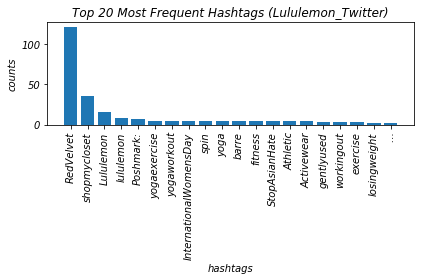

[('RedVelvet', 121), ('shopmycloset', 36), ('Lululemon', 16), ('lululemon', 8), ('Poshmark:', 7), ('yogaexercise', 5), ('yogaworkout', 5), ('InternationalWomensDay', 5), ('spin', 5), ('yoga', 5), ('barre', 5), ('fitness', 5), ('StopAsianHate', 5), ('Athletic', 5), ('Activewear', 4), ('gentlyused', 3), ('workingout', 3), ('exercise', 3), ('losingweight', 2), ('…', 2)]


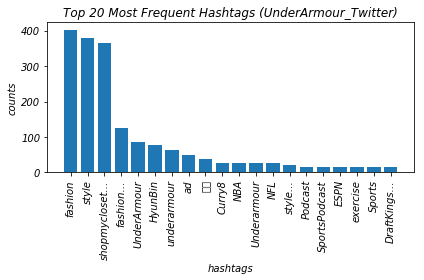

[('fashion', 403), ('style', 378), ('shopmycloset…', 364), ('fashion…', 125), ('UnderArmour', 86), ('HyunBin', 76), ('underarmour', 64), ('ad', 49), ('현빈', 39), ('Curry8', 27), ('NBA', 27), ('Underarmour', 26), ('NFL', 26), ('style…', 22), ('Podcast', 16), ('SportsPodcast', 16), ('ESPN', 16), ('exercise', 15), ('Sports', 15), ('DraftKings…', 15)]


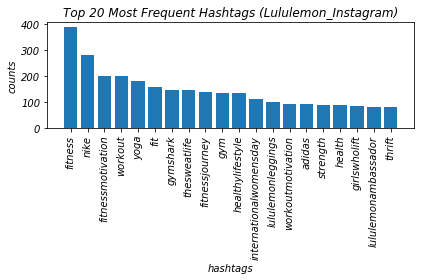

[('fitness', 388), ('nike', 282), ('fitnessmotivation', 202), ('workout', 201), ('yoga', 181), ('fit', 159), ('gymshark', 146), ('thesweatlife', 146), ('fitnessjourney', 137), ('gym', 135), ('healthylifestyle', 133), ('internationalwomensday', 112), ('lululemonleggings', 102), ('workoutmotivation', 94), ('adidas', 91), ('strength', 88), ('health', 87), ('girlswholift', 86), ('lululemonambassador', 82), ('thrift', 82)]


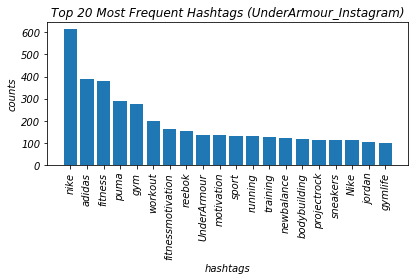

[('nike', 614), ('adidas', 391), ('fitness', 378), ('puma', 288), ('gym', 274), ('workout', 197), ('fitnessmotivation', 161), ('reebok', 154), ('UnderArmour', 137), ('motivation', 136), ('sport', 132), ('running', 130), ('training', 126), ('newbalance', 123), ('bodybuilding', 116), ('projectrock', 113), ('sneakers', 112), ('Nike', 111), ('jordan', 104), ('gymlife', 98)]


In [19]:
get_most_freq_hashtag(df_lst[2:], title_lst[2:])

### Sensitive Scores

In [20]:
# Function used to process captions by lemmatization and removing punctuations and most/least frequent words
# return the processed captions as pandas series
def processTextCalculateSentiment(df):
    # Remove all hashtags, punctuations, and stopwords
    captions = df['text'].apply(lambda x: " ".join(x.lower() for x in x.split()))
    captions = captions.apply(lambda x: ' '.join(re.sub("(#[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)"," ",x) for x in x.split()))
    captions = captions.apply(lambda x: " ".join(x for x in x.split() if x not in nltk.corpus.stopwords.words('english')))
    
    # Remove most 10 common words
    freq = pd.Series(' '.join(captions).split()).value_counts()[:10]
    captions = captions.apply(lambda x: " ".join(x for x in x.split() if x not in list(freq.index)))
    # Remove 10 least frequent words
    least_freq = pd.Series(' '.join(captions).split()).value_counts()[-10:]
    captions = captions.apply(lambda x: " ".join(x for x in x.split() if x not in list(freq.index)))

    # Lemmatization
    captions = captions.apply(lambda x: " ".join([Word(word).lemmatize() for word in x.split()]))
    captions.replace('', np.nan, inplace=True)
    captions.dropna(inplace=True)
    
    df['fully_proccessed_tokens'] = captions
    df['sentiment_score'] = df['fully_proccessed_tokens'].apply(lambda x: sentiment_score(str(x)))
    return df

# Function used to compute sentimental score from the input
def sentiment_score(text):
    sid = nltk.sentiment.vader.SentimentIntensityAnalyzer()
    return sid.polarity_scores(text)['compound']

In [21]:
def plotSentimentDistribution(df_list, title_list):
    for i in range(len(df_list)):
        df_list[i] = processTextCalculateSentiment(df_list[i])
        df_list[i]['sentiment_score'].hist()
        plt.xlabel('sentiment score')
        plt.ylabel('counts')
        plt.title('Sentiment Scores for ' + title_list[i])
        plt.show()

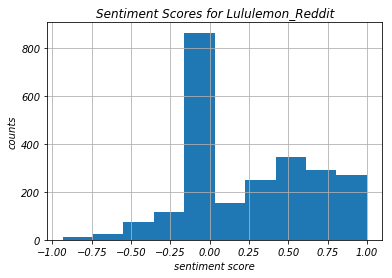

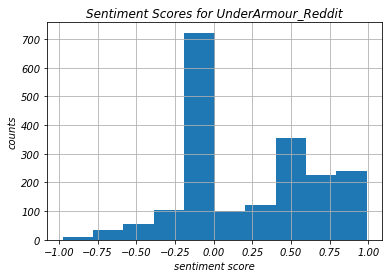

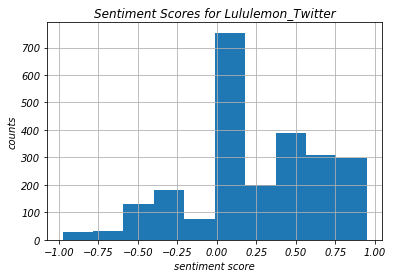

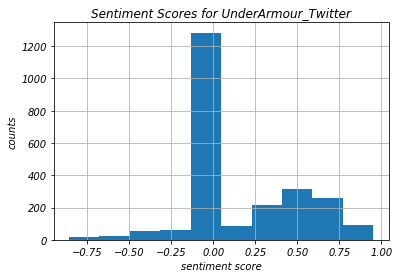

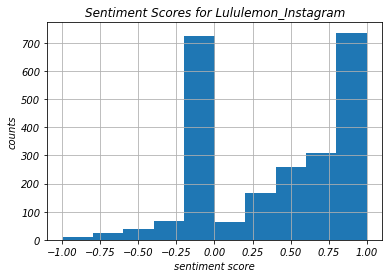

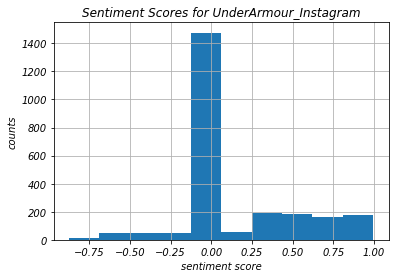

In [22]:
plotSentimentDistribution(df_lst, title_lst)

### Word Frequency Distribution

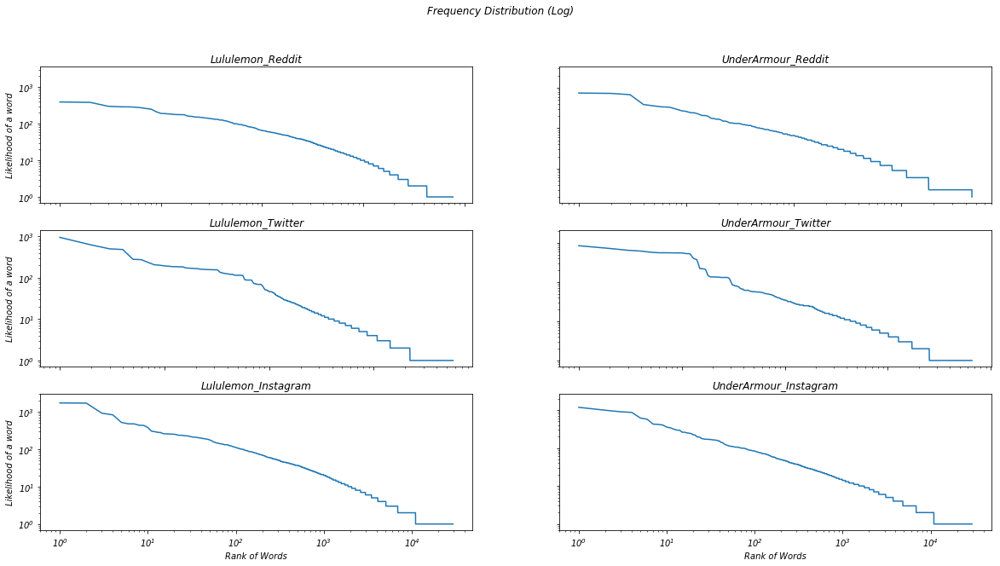

In [23]:
fig, axs = plt.subplots(3, 2, figsize=(20, 10))
fig.suptitle("Frequency Distribution (Log)")

axs[0, 0].plot(range(len(wordsCount_RL)), wordsCount_RL['count'])
axs[0, 0].set_title(RDT_LULU)
axs[0, 1].plot(range(len(wordsCount_RU)), wordsCount_RU['count'])
axs[0, 1].set_title(RDT_UDAR)

axs[1, 0].plot(range(len(wordsCount_TL)), wordsCount_TL['count'])
axs[1, 0].set_title(TWT_LULU)
axs[1, 1].plot(range(len(wordsCount_TU)), wordsCount_TU['count'])
axs[1, 1].set_title(TWT_UDAR)

axs[2, 0].plot(range(len(wordsCount_IL)), wordsCount_IL['count'])
axs[2, 0].set_title(INS_LULU)
axs[2, 1].plot(range(len(wordsCount_IU)), wordsCount_IU['count'])
axs[2, 1].set_title(INS_UDAR)

for ax in axs.flat:
    ax.set_yscale('log')
    ax.set_xscale('log')
    ax.set(xlabel='Rank of Words', ylabel='Likelihood of a word')
    
# Hide x labels and tick labels for top plots and y ticks for right plots.
for ax in axs.flat:
    ax.label_outer()

# set the spacing between subplots 
plt.show()

### Words Concordance

In [24]:
text = nltk.Text(token_TU) #Convert t_data into a Text class of nltk
CIndex = nltk.text.ConcordanceIndex(text) #Load the text into a ConcordanceIndex

In [25]:
# The surrounding words of 'enjoy'
CIndex.print_concordance('best')

Displaying 15 of 15 matches:
D0fc9B4 yo btw @UnderArmour makes the best masks do n't me @Richard_Strange @Che
//t.co/TeSlTcdDoi @UnderArmour is the best brand for apparel Definitively @Nike 
 apparel Definitively @Nike still the best shoes though The @byDVNLLN @UnderArmo
nderArmour @earnestMgraham @ZairaLily best javelin program in the nation RT @Ste
n it was feels like 9F but it was the best I ’ve felt on a run in awhile Celebra
A2 Here ’s our in crowd Move with our best sellers Available in store amp online
ucukcHO @TheRock got project 3s today best shoe Iv ever worn Thank you 🙌 UnderAr
derArmour I 've got them on right now best shoes in the market for sure BloodSwe
our family Always motivated to be the best in my craft and s ad The Under Armour
ail so you can cut down that personal best time Learn more about this elite new 
h no followers get sponsored Personal best run today 8:52 mil https://t.co/SpLVk
 so far from @UnderArmour What ’s the best one https://t.co/U82F7Tqv5c https://t

In [26]:
text.common_contexts(['fit'])

keep_under worst_possible strong_body fun_adventure n’t_my
loose_underarmour the_is


In [27]:
text.count('like')

55

In [28]:
# Make a plot to show each time a set of words occurs
list_of_words = ['love', 'hate', 'like', 'fit', 'worst', 'best', 'good']
token_lst = [token_RL, token_RU, token_TL, token_TU, token_IL, token_IU]
def plotWordsOccurance(token_list, title_list):
    for i in range(len(token_list)):
        text = nltk.Text(token_list[i])
        sns.reset_orig()
        nltk.draw.dispersion.dispersion_plot(text, list_of_words, 
                                             title="Word Occurances in {}".format(title_list[i]))
        sns.set()

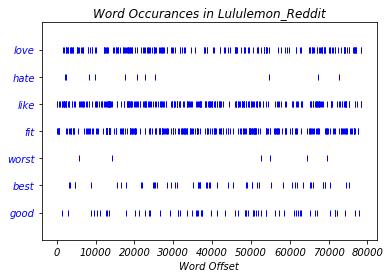

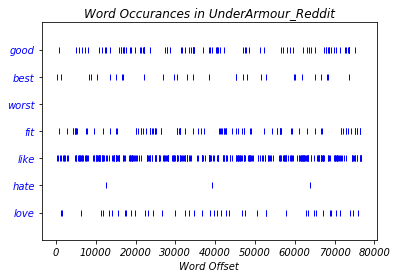

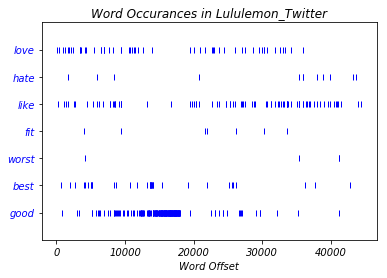

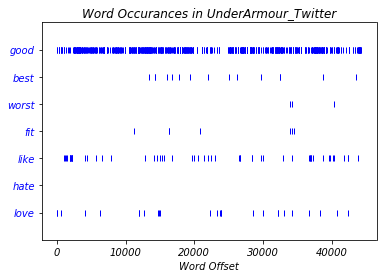

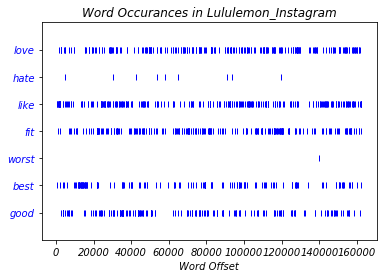

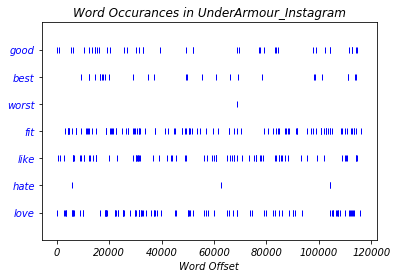

In [29]:
plotWordsOccurance(token_lst, title_lst)

### Word Distribution

#### (1) word frequency distribution (word lengths)

In [30]:
def wordDistributionLength(df_list, title_list, word_length, num_words=20):
    for i in range(len(df_list)):
        whcfdist = nltk.ConditionalFreqDist(((len(w), w) for w in df_list[i]['normalized_tokens'].sum()))
        whcfdist[word_length].plot(num_words, title=title_list[i])

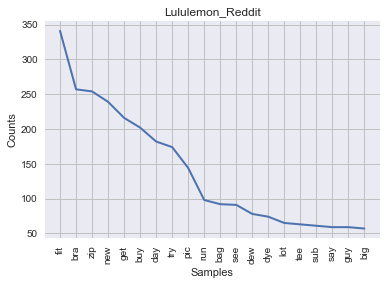

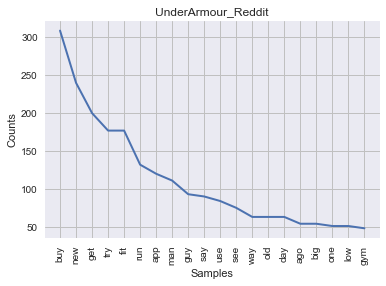

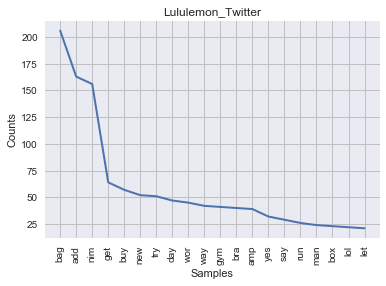

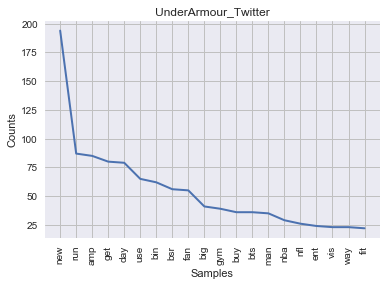

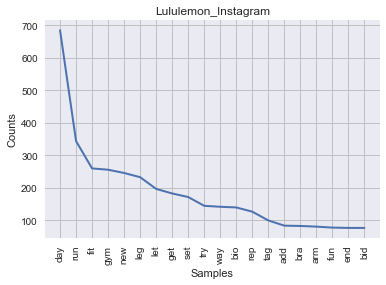

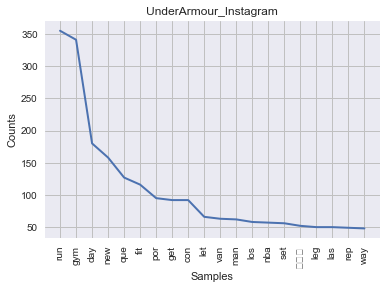

In [31]:
wordDistributionLength(df_lst, title_lst, 3)

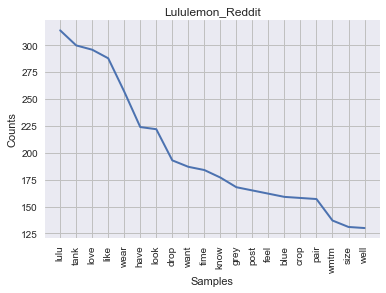

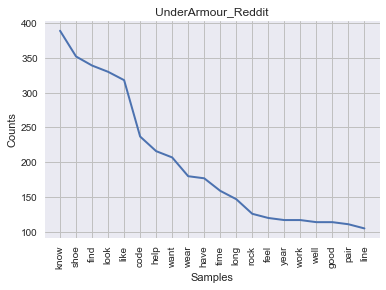

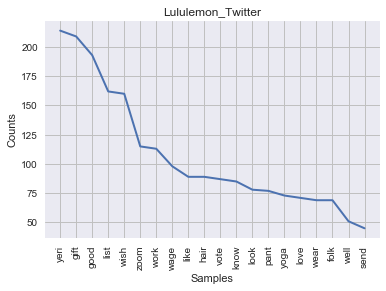

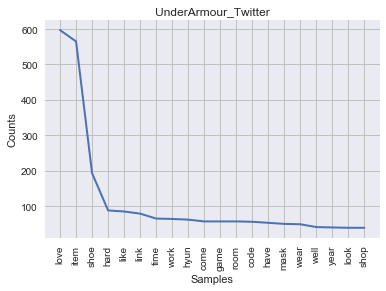

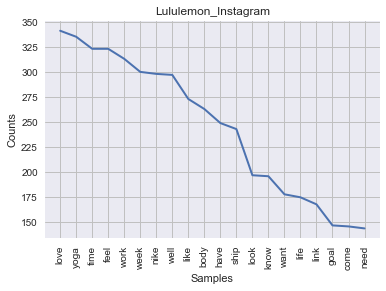

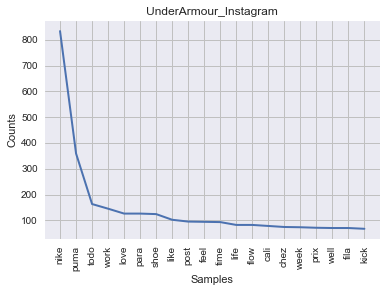

In [32]:
wordDistributionLength(df_lst, title_lst, 4)

#### (2) word frequency distribution (POS)

In [33]:
def wordDistributionPOS(df_list, title_list, pos, num_words=20):
    freqDict = {}
    for i in range(len(df_list)):
        df_list[i]['normalized_tokens_POS'] = [nltk.pos_tag(t) for t in df_list[i]['normalized_tokens']]
        POStoWord = nltk.ConditionalFreqDist((p, w) for w, p in df_list[i]['normalized_tokens_POS'].sum())
        POStoWord[pos].plot(num_words, title=title_list[i])
        freqDict[title_list[i]] = POStoWord[pos].most_common(10)
    return pd.DataFrame(freqDict)

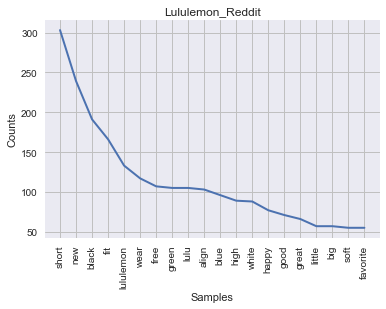

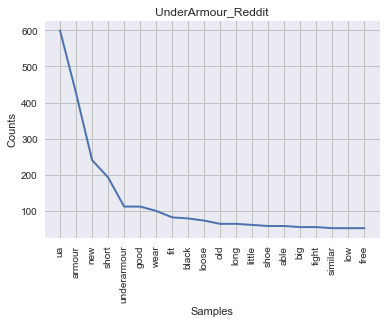

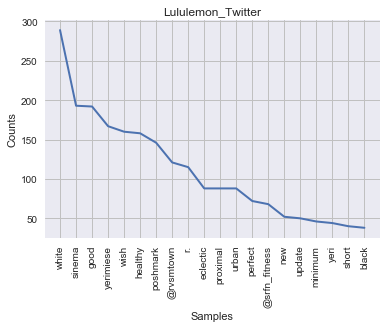

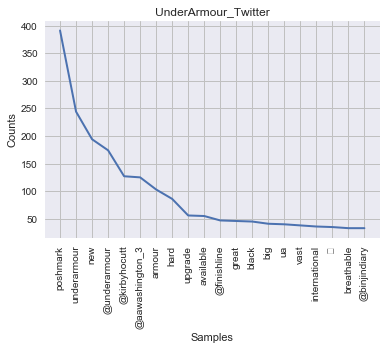

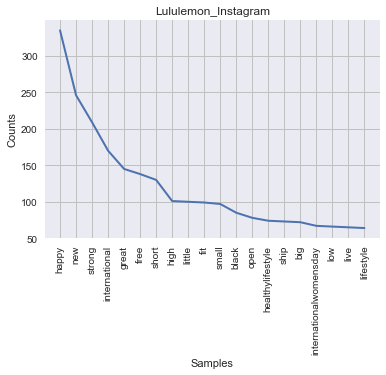

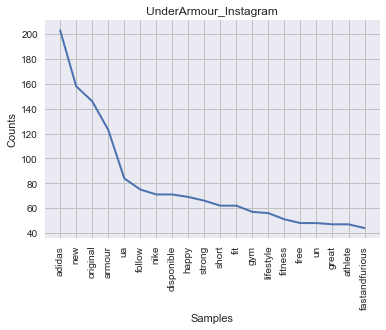

,Lululemon_Instagram,Lululemon_Reddit,Lululemon_Twitter,UnderArmour_Instagram,UnderArmour_Reddit,UnderArmour_Twitter
0,"(happy, 335)","(short, 303)","(white, 289)","(adidas, 203)","(ua, 600)","(poshmark, 391)"
1,"(new, 246)","(new, 239)","(sinema, 193)","(new, 158)","(armour, 426)","(underarmour, 244)"
2,"(strong, 209)","(black, 191)","(good, 192)","(original, 146)","(new, 240)","(new, 194)"
3,"(international, 170)","(fit, 166)","(yerimiese, 167)","(armour, 123)","(short, 192)","(@underarmour, 174)"
4,"(great, 145)","(lululemon, 133)","(wish, 160)","(ua, 84)","(underarmour, 111)","(@kirbyhocutt, 127)"
5,"(free, 138)","(wear, 117)","(healthy, 158)","(follow, 75)","(good, 111)","(@aawashington_3, 125)"
6,"(short, 130)","(free, 107)","(poshmark, 146)","(nike, 71)","(wear, 99)","(armour, 103)"
7,"(high, 101)","(green, 105)","(@rvsmtown, 121)","(disponible, 71)","(fit, 81)","(hard, 86)"
8,"(little, 100)","(lulu, 105)","(r., 115)","(happy, 69)","(black, 78)","(upgrade, 56)"
9,"(fit, 99)","(align, 103)","(eclectic, 88)","(strong, 66)","(loose, 72)","(available, 55)"


In [34]:
wordDistributionPOS(df_lst, title_lst, 'JJ')

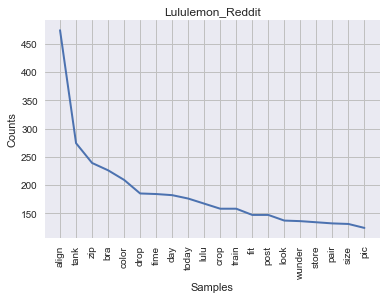

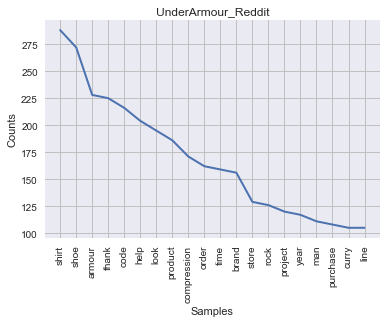

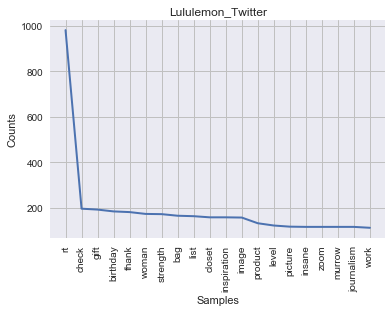

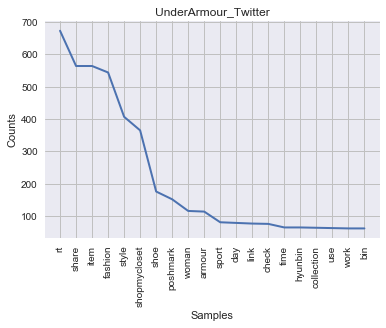

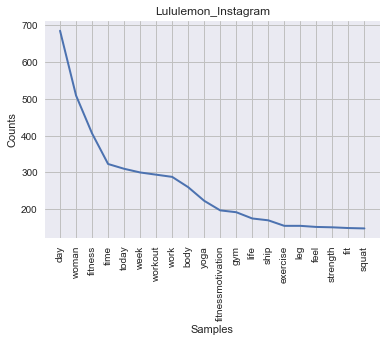

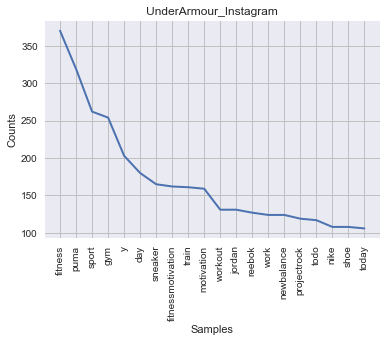

,Lululemon_Instagram,Lululemon_Reddit,Lululemon_Twitter,UnderArmour_Instagram,UnderArmour_Reddit,UnderArmour_Twitter
0,"(day, 685)","(align, 474)","(rt, 980)","(fitness, 370)","(shirt, 288)","(rt, 673)"
1,"(woman, 509)","(tank, 274)","(check, 195)","(puma, 319)","(shoe, 272)","(share, 564)"
2,"(fitness, 406)","(zip, 239)","(gift, 191)","(sport, 262)","(armour, 228)","(item, 564)"
3,"(time, 323)","(bra, 226)","(birthday, 183)","(gym, 254)","(thank, 225)","(fashion, 544)"
4,"(today, 310)","(color, 209)","(thank, 180)","(y, 203)","(code, 216)","(style, 407)"
5,"(week, 300)","(drop, 185)","(woman, 172)","(day, 180)","(help, 204)","(shopmycloset, 365)"
6,"(workout, 294)","(time, 184)","(strength, 171)","(sneaker, 165)","(look, 195)","(shoe, 176)"
7,"(work, 288)","(day, 182)","(bag, 164)","(fitnessmotivation, 162)","(product, 186)","(poshmark, 152)"
8,"(body, 260)","(today, 176)","(list, 162)","(train, 161)","(compression, 171)","(woman, 116)"
9,"(yoga, 223)","(lulu, 167)","(closet, 157)","(motivation, 159)","(order, 162)","(armour, 114)"


In [35]:
wordDistributionPOS(df_lst, title_lst, 'NN')

#### (3) conditional probability distribution (word length)

In [36]:
def wordProbDistribLength(df_list, title_list, word_length):
    most_common = {}
    for i in range(len(df_list)):
        whcfdist = nltk.ConditionalFreqDist(((len(w), w) for w in df_list[i]['normalized_tokens'].sum()))
        whcpdist = nltk.ConditionalProbDist(whcfdist, nltk.ELEProbDist)
        most_common_word = whcpdist[word_length].max()
        most_common[title_list[i]] = [most_common_word, whcpdist[word_length].prob(most_common_word)]
    return pd.DataFrame(most_common)

In [37]:
wordProbDistribLength(df_lst, title_lst, 5)

,Lululemon_Instagram,Lululemon_Reddit,Lululemon_Twitter,UnderArmour_Instagram,UnderArmour_Reddit,UnderArmour_Twitter
0,woman,align,white,sport,shirt,check
1,0.0375848,0.0794897,0.0768822,0.0285091,0.0523977,0.151926


In [39]:
wordProbDistribLength(df_lst, title_lst, 6)

,Lululemon_Instagram,Lululemon_Reddit,Lululemon_Twitter,UnderArmour_Instagram,UnderArmour_Reddit,UnderArmour_Twitter
0,strong,wunder,sinema,adidas,armour,armour
1,0.0205483,0.0315847,0.0861666,0.0532565,0.176089,0.124084


#### (4) conditional probability distribution (POS)

In [40]:
def wordProbDistribPOS(df_list, title_list, pos):
    most_common = {}
    for i in range(len(df_list)):
        df_list[i]['normalized_tokens_POS'] = [nltk.pos_tag(t) for t in df_list[i]['normalized_tokens']]
        POStoWord = nltk.ConditionalFreqDist((p, w) for w, p in df_list[i]['normalized_tokens_POS'].sum())
        whcpdist_POStoWord = nltk.ConditionalProbDist(POStoWord, nltk.ELEProbDist)
        most_common_word = whcpdist_POStoWord[pos].max()
        most_common[title_list[i]] = [most_common_word, whcpdist_POStoWord[pos].prob(most_common_word)]
    return pd.DataFrame(most_common)

In [41]:
wordProbDistribPOS(df_lst, title_lst, 'JJ')

,Lululemon_Instagram,Lululemon_Reddit,Lululemon_Twitter,UnderArmour_Instagram,UnderArmour_Reddit,UnderArmour_Twitter
0,happy,short,white,adidas,ua,poshmark
1,0.0176352,0.0329319,0.0564163,0.0146873,0.0723276,0.0845025


In [42]:
wordProbDistribPOS(df_lst, title_lst, 'NN')

,Lululemon_Instagram,Lululemon_Reddit,Lululemon_Twitter,UnderArmour_Instagram,UnderArmour_Reddit,UnderArmour_Twitter
0,day,align,rt,fitness,shirt,rt
1,0.0131321,0.0217386,0.0740028,0.00804779,0.0150085,0.0449374


#### (5) Word Cloud

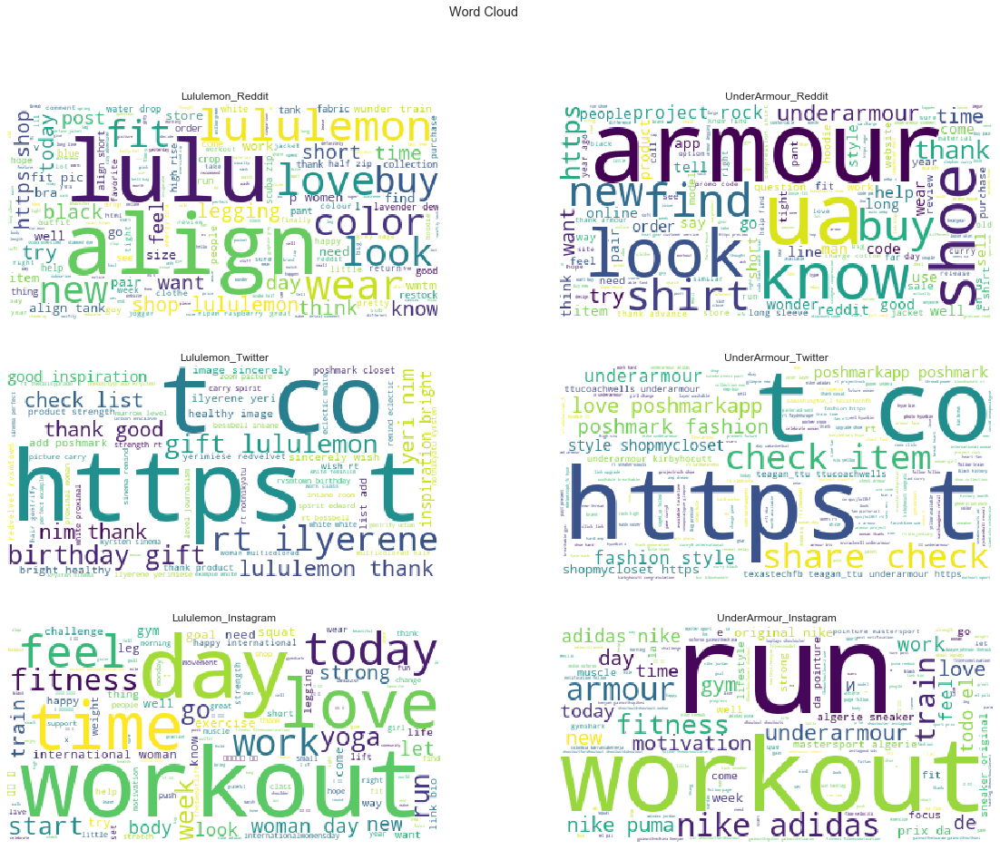

In [43]:
fig, axs = plt.subplots(3, 2, figsize=(20, 15))
fig.suptitle("Word Cloud")

wc_1 = wordcloud.WordCloud(background_color="white", max_words=500, mode='RGBA').generate(' '.join(rdt_lulu['normalized_tokens'].sum()))
axs[0, 0].imshow(wc_1)
axs[0, 0].set_title(RDT_LULU)
wc_2 = wordcloud.WordCloud(background_color="white", max_words=500, mode='RGBA').generate(' '.join(rdt_udar['normalized_tokens'].sum()))
axs[0, 1].imshow(wc_2)
axs[0, 1].set_title(RDT_UDAR)

wc_3 = wordcloud.WordCloud(background_color="white", max_words=500, mode='RGBA').generate(' '.join(twt_lulu['normalized_tokens'].sum()))
axs[1, 0].imshow(wc_3)
axs[1, 0].set_title(TWT_LULU)
wc_4 = wordcloud.WordCloud(background_color="white", max_words=500, mode='RGBA').generate(' '.join(twt_udar['normalized_tokens'].sum()))
axs[1, 1].imshow(wc_4)
axs[1, 1].set_title(TWT_UDAR)

wc_5 = wordcloud.WordCloud(background_color="white", max_words=500, mode='RGBA').generate(' '.join(ins_lulu['normalized_tokens'].sum()))
axs[2, 0].imshow(wc_5)
axs[2, 0].set_title(INS_LULU)
wc_6 = wordcloud.WordCloud(background_color="white", max_words=500, mode='RGBA').generate(' '.join(ins_udar['normalized_tokens'].sum()))
axs[2, 1].imshow(wc_6)
axs[2, 1].set_title(INS_UDAR)

for ax in axs.flat:
    ax.set_xticks([])
    ax.set_yticks([])

### Bigrams

In [44]:
def bigrams(df_list, title_list):
    bigram_measures = nltk.collocations.BigramAssocMeasures()
    bigram_dict = {}
    for i in range(len(df_list)):
        bigrams = nltk.collocations.BigramCollocationFinder.from_words(df_list[i]['normalized_tokens'].sum())
        bigram_dict[title_list[i]] = bigrams.score_ngrams(bigram_measures.student_t)[:10]
    return pd.DataFrame(bigram_dict)

In [45]:
bigrams(df_lst, title_lst)

,Lululemon_Instagram,Lululemon_Reddit,Lululemon_Twitter,UnderArmour_Instagram,UnderArmour_Reddit,UnderArmour_Twitter
0,"((➖, ➖), 13.35215930026631)","((align, tank), 11.077496398782685)","((rt, @ilyerene), 15.866040753208843)","((🆙, 🆙), 16.67712932723516)","((project, rock), 10.494288069609377)","((love, @poshmarkapp), 23.123918379879093)"
1,"((=, =), 12.58211993852162)","((fit, pic), 10.745383020645018)","((birthday, gift), 13.219653700749486)","((👥, 👥), 13.534336544891584)","(($, $), 6.8501027579016185)","((item, be), 23.117588009654355)"
2,"((woman, day), 12.50299910429818)","((water, drop), 10.043919873334202)","((gift, @.lululemon), 12.960914623155025)","((⚡, ⚡), 13.435973627225865)","((t, shirt), 6.625806264331552)","((be, love), 23.08781992042706)"
3,"((international, woman), 12.22009616411272)","((wunder, train), 9.887481372920618)","((@.lululemon, 🤍thank), 12.94339570163652)","((nike, adidas), 13.20785136697065)","((thank, advance), 6.427434642495926)","((share, check), 23.0660520051796)"
4,"((⁣, ⁣), 11.923537225467816)","((lavender, dew), 8.812723438671561)","((check, list), 12.53434383660049)","((❎, ❎), 12.703106506632556)","((year, ago), 6.216548582584991)","((check, item), 23.065028727112413)"
5,"((link, bio), 11.115099291375264)","((scuba, zip), 8.440523528285679)","((image, sincerely), 12.408406474770906)","((=, =), 12.377545177318401)","((long, sleeve), 6.197339147975939)","((poshmark, fashion), 22.459951545131506)"
6,"((happy, international), 10.339300470581966)","((half, zip), 7.938981950396053)","((inspiration, bright), 12.40788346501433)","((🔺, 🔻), 12.316523937054292)","((charge, cotton), 5.729759608614178)","((fashion, style), 19.594193548387096)"
7,"((👉, 🏼), 9.116122649900346)","((ripen, raspberry), 7.602668038431628)","((bright, healthy), 12.407360455257754)","((🔻, 🔺), 11.945582283230783)","((r, underarmour), 5.721829409726402)","((style, shopmycloset), 19.049010091974576)"
8,"((fitness, fitnessmotivation), 8.37708854699827)","((align, short), 7.530264616362145)","((healthy, image), 12.407360455257754)","((💨, 💨), 11.41984073665084)","((heat, gear), 5.458927596976912)","((@poshmarkapp, poshmark), 18.758481871313663)"
9,"(($, ship), 7.972729021563723)","((grey, sage), 7.373251404310315)","((good, inspiration), 12.388408056835154)","((🏀, 🏀), 10.277965283408788)","((underarmour, comment), 5.435500640199393)","((@teagan_ttu, @ttucoachwells), 11.43353275133..."


### 2. Trigrams

In [46]:
def trigrams(df_list, title_list):
    trigram_measures = nltk.collocations.TrigramAssocMeasures()
    trigram_dict = {}
    for i in range(len(df_list)):
        trigrams = nltk.collocations.TrigramCollocationFinder.from_words(df_list[i]['normalized_tokens'].sum())
        trigram_dict[title_list[i]] = trigrams.score_ngrams(trigram_measures.student_t)[:10]
    return pd.DataFrame(trigram_dict)

In [47]:
trigrams(df_lst, title_lst)

,Lululemon_Instagram,Lululemon_Reddit,Lululemon_Twitter,UnderArmour_Instagram,UnderArmour_Reddit,UnderArmour_Twitter
0,"((➖, ➖, ➖), 12.922795938989942)","((scuba, half, zip), 5.999554177086389)","((birthday, gift, @.lululemon), 13.07579504717...","((🆙, 🆙, 🆙), 16.431493877967846)","((r, underarmour, comment), 5.477183335023128)","((be, love, @poshmarkapp), 23.63176010658709)"
1,"((=, =, =), 12.328776776056579)","((scuba, oversized, zip), 5.290901468362073)","((gift, @.lululemon, 🤍thank), 13.03757331659295)","((👥, 👥, 👥), 13.26643342347102)","((black, friday, cyber), 3.4640971281323756)","((item, be, love), 23.631678675367933)"
2,"((international, woman, day), 12.082587049796665)","((view, poll](https://www.reddit.com, poll), 5...","((bright, healthy, image), 12.489456189230946)","((⚡, ⚡, ⚡), 13.038243796683807)","((coldgear, compression, tight), 3.46379667134...","((share, check, item), 23.631227836947303)"
3,"((happy, international, woman), 9.899220994875...","((blissful, bend, tank), 4.24260463153463)","((healthy, image, sincerely), 12.489456189230946)","((❎, ❎, ❎), 12.56975840409912)","(($, $, coupon), 3.4633416183292027)","((check, item, be), 23.630464879620085)"
4,"((⁣, ⁣, ⁣), 8.245879771163061)","((pace, rival, skirt), 3.87297934078844)","((inspiration, bright, healthy), 12.4894527289...","((🔻, 🔺, 🔻), 11.999851316088785)","((friday, cyber, monday), 2.999999003625476)","((poshmark, fashion, style), 19.991877920726516)"
5,"((สั่งสินค้า, cf, ใต้รูป), 7.615770626427509)","((city, adventurer, backpack), 3.87297164341806)","((good, inspiration, bright), 12.48933238477745)","((=, =, =), 11.618878407703392)","((tear, away, tag), 2.9999955163146397)","((fashion, style, shopmycloset), 19.3332952284..."
6,"((nike, adidas, puma), 6.782308279563961)","((international, woman, day), 3.8729662308779824)","((nim, thank, good), 12.48914217751076)","((🔺, 🔻, 🔺), 11.618803235182716)","((family, code, expire), 2.9999628921659256)","((@poshmarkapp, poshmark, fashion), 19.3275017..."
7,"((feria, feriamericana, feriazonanorte), 6.708...","((flow, y, bra), 3.8728591924993383)","((thank, good, inspiration), 12.489136704310207)","((💨, 💨, 💨), 10.488038247152666)","((cover, entire, shoe), 2.9999599172762736)","((love, @poshmarkapp, poshmark), 19.3263737096..."
8,"((nordelta, sanisidro, reciclado), 6.708202661...","((white, align, tank), 3.870192648902515)","((yeri, nim, thank), 12.489049274894143)","((🏀, 🏀, 🏀), 9.848831767216549)","((friend, family, code), 2.999956145287003)","((@texastechfb, @teagan_ttu, @ttucoachwells), ..."
9,"((paulacahendanvers, jackiesmith, paruolo), 6....","((ebb, street, tank), 3.7415814608493574)","((image, sincerely, wish), 12.449351196894018)","((mastersport, algerie, sneaker), 8.4261364395...","((project, rock, delta), 2.9999387229667467)","((@teagan_ttu, @ttucoachwells, @underarmour), ..."


### 3. Conditional Frequencies 

In [48]:
def ngrams(df_list, title_list, n):
    ngram_dict = {}
    for i in range(len(df_list)):
        Ngrams = nltk.ngrams(df_list[i]['normalized_tokens'].sum(), n)
        Counts = {}
        for ngram in list(Ngrams):
            if ngram in Counts.keys():
                Counts[ngram] += 1
            else:
                Counts[ngram] = 1
        Filtered = {}
        for key in Counts.keys():
            if Counts[key] < 2:
                pass
            else:
                Filtered[key] = Counts[key]

        # Transform the filtered dictionary into a list and sort it based on the collocation frequency
        sortFilter = [(k,Filtered[k])for k in sorted(Filtered, key=Filtered.get, reverse=True)]
        ngram_dict[title_list[i]] = sortFilter[:10]
    return pd.DataFrame(ngram_dict)

In [49]:
ngrams(df_lst, title_lst, 4)

,Lululemon_Instagram,Lululemon_Reddit,Lululemon_Twitter,UnderArmour_Instagram,UnderArmour_Reddit,UnderArmour_Twitter
0,"((➖, ➖, ➖, ➖), 155)","((city, adventurer, backpack, nano), 10)","((birthday, gift, @.lululemon, 🤍thank), 170)","((🆙, 🆙, 🆙, 🆙), 260)","((friend, family, code, expire), 9)","((share, check, item, be), 559)"
1,"((=, =, =, =), 145)","((p, bag, quilt, embrace), 10)","((yeri, nim, thank, good), 156)","((👥, 👥, 👥, 👥), 168)","((black, friday, cyber, monday), 9)","((check, item, be, love), 559)"
2,"((happy, international, woman, day), 95)","((heathered, core, ultra, light), 9)","((nim, thank, good, inspiration), 156)","((⚡, ⚡, ⚡, ⚡), 160)","((cleat, spike, problem, survey), 6)","((item, be, love, @poshmarkapp), 559)"
3,"((⁣, ⁣, ⁣, ⁣), 56)","((core, ultra, light, grey), 9)","((thank, good, inspiration, bright), 156)","((❎, ❎, ❎, ❎), 154)","((new, man, heatgear, armour), 6)","((be, love, @poshmarkapp, poshmark), 374)"
4,"((feria, feriamericana, feriazonanorte, cheap)...","((swift, speed, high, rise), 8)","((good, inspiration, bright, healthy), 156)","((🔺, 🔻, 🔺, 🔻), 135)","((man, heatgear, armour, legging), 6)","((love, @poshmarkapp, poshmark, fashion), 374)"
5,"((feriamericana, feriazonanorte, cheap, nordel...","((lavender, dew, align, tank), 7)","((inspiration, bright, healthy, image), 156)","((=, =, =, =), 130)","((ua, charge, cotton, shirt), 6)","((@poshmarkapp, poshmark, fashion, style), 374)"
6,"((feriazonanorte, cheap, nordelta, sanisidro),...","((🤦, 🏼‍, ♀, ️), 7)","((bright, healthy, image, sincerely), 156)","((🔻, 🔺, 🔻, 🔺), 126)","((hole, brand, new, pant), 6)","((poshmark, fashion, style, shopmycloset), 374)"
7,"((cheap, nordelta, sanisidro, reciclado), 45)","((scuba, oversized, half, zip), 7)","((rt, @ilyerene, yeri, nim), 155)","((🏀, 🏀, 🏀, 🏀), 91)","((nike, man, flex, weave), 6)","((@texastechfb, @teagan_ttu, @ttucoachwells, @..."
8,"((nordelta, sanisidro, reciclado, ropareciclad...","((energy, bra, long, line), 6)","((@ilyerene, yeri, nim, thank), 155)","((💨, 💨, 💨, 💨), 89)","((man, flex, weave, train), 6)","((@teagan_ttu, @ttucoachwells, @underarmour, @..."
9,"((sanisidro, reciclado, ropareciclada, primera...","((incognito, camo, multi, grey), 6)","((healthy, image, sincerely, wish), 155)","((mastersport, algerie, sneaker, original), 71)","((flex, weave, train, short), 6)","((@aawashington_3, @texastechfb, @teagan_ttu, ..."


### KL Divergence

In [50]:
# Count the occurences of "leave"
RL_words = set(rdt_lulu['normalized_tokens'].sum())
RU_words = set(rdt_udar['normalized_tokens'].sum())
TL_words = set(twt_lulu['normalized_tokens'].sum())
TU_words = set(twt_udar['normalized_tokens'].sum())
IL_words = set(ins_lulu['normalized_tokens'].sum())
IU_words = set(ins_udar['normalized_tokens'].sum())

overlapWords = RL_words & RU_words & TL_words & TU_words & IL_words & IU_words
overlapWordsDict = {word: index for index, word in enumerate(overlapWords)}

In [51]:
def makeProbsArray(dfColumn, overlapDict):
    words = dfColumn.sum()
    countList = [0] * len(overlapDict)
    for word in words:
        try:
            countList[overlapDict[word]] += 1
        except KeyError:
            #The word is not common so we skip it
            pass
    countArray = np.array(countList)
    return countArray / countArray.sum()

RLProbArray = makeProbsArray(rdt_lulu['normalized_tokens'], overlapWordsDict)
RUProbArray = makeProbsArray(rdt_udar['normalized_tokens'], overlapWordsDict)
TLProbArray = makeProbsArray(twt_lulu['normalized_tokens'], overlapWordsDict)
TUProbArray = makeProbsArray(twt_udar['normalized_tokens'], overlapWordsDict)
ILProbArray = makeProbsArray(ins_lulu['normalized_tokens'], overlapWordsDict)
IUProbArray = makeProbsArray(ins_udar['normalized_tokens'], overlapWordsDict)

In [52]:
# Calculate divergences
RL_RU_divergence = scipy.stats.entropy(RLProbArray, RUProbArray)
print("Reddit Lululemon & Reddit UnderArmour: {}".format(RL_RU_divergence))
TL_TU_divergence = scipy.stats.entropy(TLProbArray, TUProbArray)
print("Twitter Lululemon & Twitter UnderArmour: {}".format(TL_TU_divergence))
IL_IU_divergence = scipy.stats.entropy(ILProbArray, IUProbArray)
print("Instagram Lululemon & Instagram UnderArmour: {}\n".format(IL_IU_divergence))

RL_TL_divergence = scipy.stats.entropy(RLProbArray, TLProbArray)
print("Reddit Lululemon & Twitter Lululemon: {}".format(RL_TL_divergence))
TL_IL_divergence = scipy.stats.entropy(TLProbArray, ILProbArray)
print("Twitter Lululemon & Instagram Lululemon: {}".format(TL_IL_divergence))
RL_IL_divergence = scipy.stats.entropy(RLProbArray, ILProbArray)
print("Reddit Lululemon & Instagram Lululemon: {}\n".format(RL_IL_divergence))

RU_TU_divergence = scipy.stats.entropy(RUProbArray, TUProbArray)
print("Reddit UnderArmour & Twitter UnderArmour: {}".format(RU_TU_divergence))
TU_IU_divergence = scipy.stats.entropy(TUProbArray, IUProbArray)
print("Twitter UnderArmour & Instagram UnderArmour: {}".format(TU_IU_divergence))
RU_IU_divergence = scipy.stats.entropy(RUProbArray, IUProbArray)
print("Reddit UnderArmour & Instagram UnderArmour: {}".format(RU_IU_divergence))

Reddit Lululemon & Reddit UnderArmour: 0.5521874758747045
Twitter Lululemon & Twitter UnderArmour: 1.4441225598457157
Instagram Lululemon & Instagram UnderArmour: 0.3738385708360381

Reddit Lululemon & Twitter Lululemon: 0.8342771549597418
Twitter Lululemon & Instagram Lululemon: 1.0864648828473156
Reddit Lululemon & Instagram Lululemon: 0.5634016893546862

Reddit UnderArmour & Twitter UnderArmour: 0.8721559547178801
Twitter UnderArmour & Instagram UnderArmour: 1.1130034314751733
Reddit UnderArmour & Instagram UnderArmour: 0.8899031735036158


In [53]:
from IPython.display import display

# Elementwise calculation and see which words best distinguish the two corpora
def wordMostDistinguish(probArray_list, title_list, num_words=10):
    kl_df = pd.DataFrame(list(overlapWordsDict.keys()), columns = ['word'], index = list(overlapWordsDict.values()))
    kl_df = kl_df.sort_index()
    for i in range(len(probArray_list)):
        print(title_list[i])
        result = {}
        for j in range(len(probArray_list)):
            if (probArray_list[j] != probArray_list[i]).all():
                divergence_ew = scipy.special.kl_div(probArray_list[j], probArray_list[i])
                wd_df = kl_df
                wd_df['elementwise divergence'] = divergence_ew
                wd_df = wd_df.sort_values(by='elementwise divergence', ascending=False)[:num_words]
                wd_df[" vs. " + title_list[j]] = wd_df['word'] + ", " + wd_df['elementwise divergence'].astype(str)
                wd_df.drop(columns=['word', 'elementwise divergence'], inplace=True)
                wd_df.reset_index(drop=True, inplace=True)
                result.update(wd_df.to_dict())
        display(pd.DataFrame.from_dict(result))

In [54]:
probArray_lst = [RLProbArray, RUProbArray, TLProbArray, TUProbArray, ILProbArray, IUProbArray]
wordMostDistinguish(probArray_lst, title_lst)

Lululemon_Reddit


,vs. Lululemon_Instagram,vs. Lululemon_Twitter,vs. UnderArmour_Instagram,vs. UnderArmour_Reddit,vs. UnderArmour_Twitter
0,"fitness, 0.036585420948467555","strength, 0.062697288954847","nike, 0.23864208434003958","armour, 0.1888508417866237","check, 0.16767767128005673"
1,"nike, 0.026930017976992134","carry, 0.051652166185730215","adidas, 0.12964242224349184","shoe, 0.03367112270530541","share, 0.10281263361162694"
2,"woman, 0.020836835880828148","birthday, 0.0473453569831503","fitness, 0.08322030356330273","code, 0.024109104405996257","armour, 0.08751465990470438"
3,"workout, 0.020367830822233687","bright, 0.0467412579762824","armour, 0.059026000429430174","shirt, 0.018064393350883157","style, 0.07132036233215423"
4,"exercise, 0.011206041637645851","gift, 0.04462131638820064","motivation, 0.03625116511263537","project, 0.0178884292479229","item, 0.06111737213382737"
5,"zip, 0.010953938176369695","check, 0.04265365404200084","follow, 0.03391383896804169","compression, 0.013528342146593375","shoe, 0.03561284776745977"
6,"dm, 0.010737216398188566","level, 0.035019049088909675","sneaker, 0.03288045258897988","product, 0.012140578483774181","love, 0.03003751165070483"
7,"$, 0.010553379313659452","white, 0.032480224070829795","gym, 0.032248414733862","tank, 0.011664332996960233","be, 0.016874442095951698"
8,"strength, 0.010514303127822307","wish, 0.03067664949507287","sport, 0.03190168587449712","rock, 0.009870875242068117","x, 0.014806980710546603"
9,"motivation, 0.008472265478767211","closet, 0.02994839322737656","‍, 0.027889223564230157","app, 0.008599060855727007","follow, 0.014112685648606562"


UnderArmour_Reddit


,vs. Lululemon_Instagram,vs. Lululemon_Reddit,vs. Lululemon_Twitter,vs. UnderArmour_Instagram,vs. UnderArmour_Twitter
0,"armour, 0.040061717954614405","armour, 0.03992704151666535","white, 0.0904999346627015","nike, 0.1027563870644955","share, 0.16545056012806153"
1,"woman, 0.034643279771188265","tank, 0.02877386174977671","birthday, 0.0764091323352563","adidas, 0.0700430656607284","check, 0.15708149863648288"
2,"fitness, 0.025578156385817837","grey, 0.017011177677490743","bright, 0.06123953142261281","fitness, 0.06252370016568537","love, 0.10883282552697741"
3,"workout, 0.024978307846148056","zip, 0.015420943707717549","carry, 0.060167423890760324","y, 0.060971935903416596","item, 0.09337698988219005"
4,"day, 0.024113462380032837","pic, 0.013535505764192596","strength, 0.056506477931618636","follow, 0.047665904898862875","style, 0.04826825756545327"
5,"♀, 0.017605905579489947","color, 0.01337313345327329","closet, 0.0517776717367329","‍, 0.035733277241912643","be, 0.026293232938255345"
6,"body, 0.016722298805674156","shoe, 0.013243322645812756","list, 0.04590676184198721","♀, 0.03384726971435722","follow, 0.021601193910770033"
7,"strong, 0.014389469432199575","love, 0.013041332035187425","wish, 0.04513747737934812","motivation, 0.0327778980358179","x, 0.021051169316118945"
8,"international, 0.014218386901812053","blue, 0.011922002024622375","woman, 0.04088961455602685","gym, 0.028796087682361575","woman, 0.018185311435742195"
9,"exercise, 0.014104211493433017","drop, 0.011096882998238782","armour, 0.04018693276176932","sneaker, 0.02691384594354005","worker, 0.013955813552871439"


Lululemon_Twitter


,vs. Lululemon_Instagram,vs. Lululemon_Reddit,vs. UnderArmour_Instagram,vs. UnderArmour_Reddit,vs. UnderArmour_Twitter
0,"workout, 0.030446473619789905","fit, 0.03312225247087715","nike, 0.15837999681199963","armour, 0.2034434400653095","item, 0.18097190254302606"
1,"white, 0.02610533529944717","zip, 0.028205290057025365","adidas, 0.15836516940821696","code, 0.04118244070732085","share, 0.1805631731437188"
2,"body, 0.022371562745045998","train, 0.019112500376358164","armour, 0.06471329041177296","shoe, 0.03202268745476498","style, 0.1185710681415512"
3,"ship, 0.020081492332811934","carry, 0.017806278314816466","y, 0.04276392483320308","white, 0.02739275910530394","armour, 0.09530809290524675"
4,"carry, 0.019199837831090628","gift, 0.017471505725439228","fitness, 0.03631754239154199","compression, 0.02710905485061426","love, 0.0593778329654322"
5,"birthday, 0.017831719458631882","check, 0.017384238922418513","train, 0.0355694467560687","find, 0.01936410105840187","shoe, 0.03389642636743917"
6,"bag, 0.01679193404965111","white, 0.017362421655754648","follow, 0.03551552116544562","carry, 0.018622930847479666","white, 0.02262741195664538"
7,"+, 0.015877041256691093","drop, 0.017266647018127246","sneaker, 0.03486070116138976","birthday, 0.01860538582469204","check, 0.02061044181576722"
8,"gift, 0.015729706889561514","strength, 0.01678023419548545","workout, 0.02741708008613285","project, 0.01761633613640537","carry, 0.020121991243025102"
9,"day, 0.015227240473180269","birthday, 0.01659233804500199","run, 0.02718347887866602","check, 0.016663590250869147","bag, 0.019711073900054964"


UnderArmour_Twitter


,vs. Lululemon_Instagram,vs. Lululemon_Reddit,vs. Lululemon_Twitter,vs. UnderArmour_Instagram,vs. UnderArmour_Reddit
0,"check, 0.049372535541442726","check, 0.05277975779895952","carry, 0.0920800975514089","nike, 0.11653406158441444","check, 0.05180523523222156"
1,"item, 0.0412288079281302","share, 0.04030275812639551","bag, 0.06706485063057016","adidas, 0.0747869797865297","share, 0.0467103410571682"
2,"share, 0.03990906972944562","tank, 0.03311368725029987","bright, 0.05746473048285299","y, 0.05619704171925266","love, 0.04266162104497448"
3,"style, 0.030590706381076214","item, 0.031155046379239788","birthday, 0.05435329462970375","check, 0.052948006582790516","item, 0.03873423722506776"
4,"love, 0.025443953715349618","style, 0.028614446198264493","white, 0.05302379657764597","item, 0.0448798024176115","style, 0.02364428923024698"
5,"be, 0.021662206205178856","zip, 0.024424651341239514","strength, 0.05240241315653451","share, 0.04479247963784659","compression, 0.019666799775217993"
6,"ship, 0.021244680108248502","fit, 0.02161260759200087","wish, 0.04794240772866148","fitness, 0.04402868719108277","know, 0.01911743744848402"
7,"armour, 0.02113500722114237","armour, 0.021015098885709925","item, 0.04761560274292253","motivation, 0.03732624706343361","product, 0.01780145395301626"
8,"body, 0.01807613324878436","love, 0.019664684427772625","share, 0.047527099227718625","love, 0.030420577726730846","be, 0.017790980791042334"
9,"fitness, 0.016006846208942292","short, 0.019219342669818187","gift, 0.04687653148261349","style, 0.025743839050060585","find, 0.01439702378878783"


Lululemon_Instagram


,vs. Lululemon_Reddit,vs. Lululemon_Twitter,vs. UnderArmour_Instagram,vs. UnderArmour_Reddit,vs. UnderArmour_Twitter
0,"zip, 0.03217701986706944","white, 0.07643573462322943","armour, 0.06176108530483457","armour, 0.19587173710370379","check, 0.13567011544425397"
1,"tank, 0.014679098788223384","carry, 0.06841700414139014","adidas, 0.04948988552747895","compression, 0.0311634493099312","item, 0.10861520917093741"
2,"fitness, 0.012557976710018558","birthday, 0.06105489143332845","nike, 0.04679939947259367","shoe, 0.030482796843184945","share, 0.10037466052495307"
3,"buy, 0.011288930400552124","bright, 0.04686686161517002","y, 0.03189635912356517","shirt, 0.022416377740700585","armour, 0.09126335704806011"
4,"workout, 0.011135852793643014","bag, 0.04138976940397019","sneaker, 0.02733205487834738","buy, 0.021136966093659126","style, 0.08478535056982688"
5,"pair, 0.01093579931306155","wish, 0.04046629396044165","sport, 0.024128932000099523","product, 0.01681734417013639","love, 0.04301147136872019"
6,"grey, 0.010601701865568722","closet, 0.037982374533221515","shoe, 0.008889130623303421","woman, 0.013099091646360349","be, 0.03417516005590497"
7,"woman, 0.010293683062903595","gift, 0.03528316650606815","follow, 0.008354888257866306","find, 0.01303714449047549","shoe, 0.03229263773662538"
8,"blue, 0.009429645392630337","list, 0.032902158088752485","xl, 0.007653139222166076","day, 0.012689940618555122","worker, 0.021781387860997495"
9,"size, 0.009085477645960936","product, 0.03204591602082276","gym, 0.007510079024960396","project, 0.01266283641249356","fan, 0.013237244701355408"


UnderArmour_Instagram


,vs. Lululemon_Instagram,vs. Lululemon_Reddit,vs. Lululemon_Twitter,vs. UnderArmour_Reddit,vs. UnderArmour_Twitter
0,"nike, 0.026725962027149795","nike, 0.05089085022593326","carry, 0.06637706275352034","nike, 0.041116692510931224","check, 0.1696664469808574"
1,"adidas, 0.022971086080791268","zip, 0.04082872546140455","white, 0.06318718717593676","find, 0.02757548534941792","item, 0.14010137659138136"
2,"armour, 0.015287210254989499","tank, 0.038260612078638734","gift, 0.061147594172324994","adidas, 0.02691149514005666","share, 0.1397661640963797"
3,"y, 0.014630256236835396","adidas, 0.03176688217826714","birthday, 0.057675094301478394","fitness, 0.022530057382123228","style, 0.05671133340297764"
4,"sport, 0.011751832709952576","fitness, 0.024505734476603848","closet, 0.05380360257520146","buy, 0.02247247025477367","love, 0.05660307699285099"
5,"sneaker, 0.009742305260865357","drop, 0.018236357601912744","nike, 0.04748075425478703","compression, 0.022465963703853637","nike, 0.04320414831791913"
6,"ship, 0.006837752218478783","armour, 0.015174701275356578","bag, 0.045539787134031694","y, 0.01882545401229681","be, 0.04042938332805347"
7,"woman, 0.006014121195555955","gym, 0.01486266721481721","check, 0.04338019793868741","project, 0.016590915332725574","adidas, 0.0275879850076616"
8,"follow, 0.005545761908397534","pic, 0.014369576688909851","list, 0.04319532081825313","know, 0.015544918356178218","fitness, 0.01945207178921641"
9,"gym, 0.005439442392968546","sport, 0.013526958248657506","bright, 0.043113586695685546","product, 0.015028236953425415","y, 0.018403242741301507"


In [55]:
# Functions to calculate divergence and distances.
def kl_divergence(X, Y):
    P = X.copy()
    Q = Y.copy()
    P.columns = ['P']
    Q.columns = ['Q']
    df = Q.join(P).fillna(0)
    p = df.iloc[:,1]
    q = df.iloc[:,0]
    D_kl = scipy.stats.entropy(p, q)
    return D_kl

def chi2_divergence(X,Y):
    P = X.copy()
    Q = Y.copy()
    P.columns = ['P']
    Q.columns = ['Q']
    df = Q.join(P).fillna(0)
    p = df.iloc[:,1]
    q = df.iloc[:,0]
    return scipy.stats.chisquare(p, q).statistic

def Divergence(corpus1, corpus2, difference="KL"):
    """Difference parameter can equal KL, Chi2, or Wass"""
    freqP = nltk.FreqDist(corpus1)
    P = pd.DataFrame(list(freqP.values()), columns = ['frequency'], index = list(freqP.keys()))
    freqQ = nltk.FreqDist(corpus2)
    Q = pd.DataFrame(list(freqQ.values()), columns = ['frequency'], index = list(freqQ.keys()))
    if difference == "KL":
        return kl_divergence(P, Q)
    elif difference == "Chi2":
        return chi2_divergence(P, Q)
    elif difference == "KS":
        try:
            return scipy.stats.ks_2samp(P['frequency'], Q['frequency']).statistic
        except:
            return scipy.stats.ks_2samp(P['frequency'], Q['frequency'])
    elif difference == "Wasserstein":
        try:
            return scipy.stats.wasserstein_distance(P['frequency'], Q['frequency'], u_weights=None, v_weights=None).statistic
        except:
            return scipy.stats.wasserstein_distance(P['frequency'], Q['frequency'], u_weights=None, v_weights=None)

In [56]:
# Example of calculating KS distance.
Divergence(RUProbArray, RLProbArray, difference="KS")

0.06473408892763731

In [57]:
# Example of calculating Wasserstein distance.
Divergence(IUProbArray, ILProbArray, difference="Wasserstein")

2.640407470288624

### KL Distances

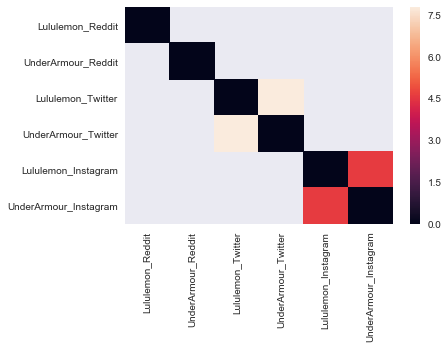

In [58]:
# Plot KL distances heatmap
L = []
for p in df_lst:
    l = []
    for q in df_lst:
        l.append(Divergence(p['text'],q['text'], difference = 'KL'))
    L.append(l)
M = np.array(L)
fig = plt.figure()
div = pd.DataFrame(M, columns = title_lst, index = title_lst)
ax = sns.heatmap(div)
plt.show()

### $\chi^2$ Divergence

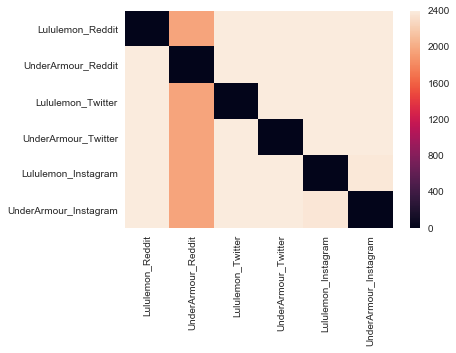

In [59]:
L = []
for p in df_lst:
    l = []
    for q in df_lst:
        l.append(Divergence(p['text'],q['text'], difference='Chi2'))
    L.append(l)
M = np.array(L)
fig = plt.figure()
div = pd.DataFrame(M, columns = title_lst, index = title_lst)
ax = sns.heatmap(div)
plt.show()

### KS Distance

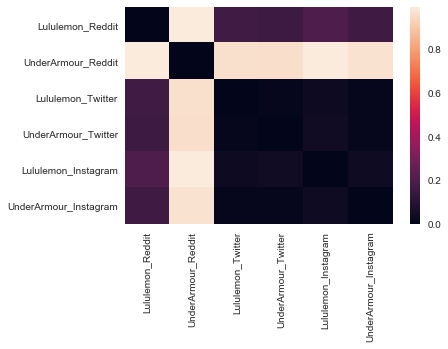

In [60]:
L = []
for p in df_lst:
    l = []
    for q in df_lst:
        l.append(Divergence(p['text'],q['text'], difference='KS'))
    L.append(l)
M = np.array(L)
fig = plt.figure()
div = pd.DataFrame(M, columns = title_lst, index = title_lst)
ax = sns.heatmap(div)
plt.show()

### Wasserstein Distance

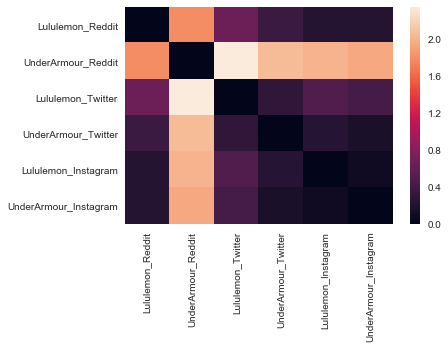

In [61]:
L = []
for p in df_lst:
    l = []
    for q in df_lst:
        l.append(Divergence(p['text'],q['text'], difference='Wasserstein'))
    L.append(l)
M = np.array(L)
fig = plt.figure()
div = pd.DataFrame(M, columns = title_lst, index = title_lst)
ax = sns.heatmap(div)
plt.show()

### Multidimensional Scaling

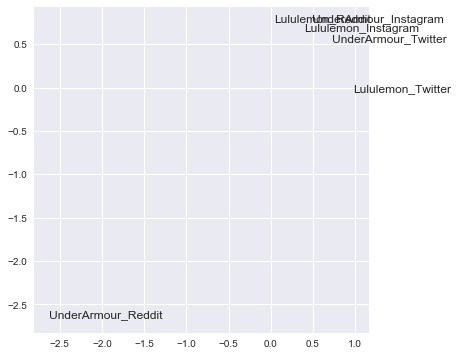

In [62]:
mds = sklearn.manifold.MDS()
pos = mds.fit(M).embedding_
x = pos[:,0]
y = pos[:,1]
fig, ax = plt.subplots(figsize = (6,6))
plt.plot(x, y, ' ')
for i, txt in enumerate(title_lst):
    ax.annotate(txt, (x[i],y[i]))

### Jensen-Shannon Divergence

In [63]:
# Calculate Jensen-Shannon Divergences
RL_RU_JSD = scipy.spatial.distance.jensenshannon(RLProbArray, RUProbArray)
print("Reddit Lululemon & Reddit UnderArmour: {}".format(RL_RU_JSD))
TL_TU_JSD = scipy.spatial.distance.jensenshannon(TLProbArray, TUProbArray)
print("Twitter Lululemon & Twitter UnderArmour: {}".format(TL_TU_JSD))
IL_IU_JSD = scipy.spatial.distance.jensenshannon(ILProbArray, IUProbArray)
print("Instagram Lululemon & Instagram UnderArmour: {}\n".format(IL_IU_JSD))

RL_TL_JSD = scipy.spatial.distance.jensenshannon(RLProbArray, TLProbArray)
print("Reddit Lululemon & Twitter Lululemon: {}".format(RL_TL_JSD))
TL_IL_JSD = scipy.spatial.distance.jensenshannon(TLProbArray, ILProbArray)
print("Twitter Lululemon & Instagram Lululemon: {}".format(TL_IL_JSD))
RL_IL_JSD = scipy.spatial.distance.jensenshannon(RLProbArray, ILProbArray)
print("Reddit Lululemon & Instagram Lululemon: {}\n".format(RL_IL_JSD))

RU_TU_JSD = scipy.spatial.distance.jensenshannon(RUProbArray, TUProbArray)
print("Reddit UnderArmour & Twitter UnderArmour: {}".format(RU_TU_JSD))
TU_IU_JSD = scipy.spatial.distance.jensenshannon(TUProbArray, IUProbArray)
print("Twitter UnderArmour & Instagram UnderArmour: {}".format(TU_IU_JSD))
RU_IU_JSD = scipy.spatial.distance.jensenshannon(RUProbArray, IUProbArray)
print("Reddit UnderArmour & Instagram UnderArmour: {}".format(RU_IU_JSD))

Reddit Lululemon & Reddit UnderArmour: 0.3505930472919715
Twitter Lululemon & Twitter UnderArmour: 0.5044441713375404
Instagram Lululemon & Instagram UnderArmour: 0.3077122233337333

Reddit Lululemon & Twitter Lululemon: 0.4333453659576515
Twitter Lululemon & Instagram Lululemon: 0.43776793693701277
Reddit Lululemon & Instagram Lululemon: 0.356545260632275

Reddit UnderArmour & Twitter UnderArmour: 0.450021273696839
Twitter UnderArmour & Instagram UnderArmour: 0.4525093992801888
Reddit UnderArmour & Instagram UnderArmour: 0.4479022669859284



## Discovering Patterns: Clusters & Topics (W6)


### Selecting Cluster Number

In [64]:
def getTFVects(df):
    TFVectorizer = sklearn.feature_extraction.text.TfidfVectorizer(max_df=0.50, max_features=1000, 
                                                           min_df=3, stop_words='english', norm='l2')
    TFVects = TFVectorizer.fit_transform(df['text'])
    return TFVectorizer, TFVects

In [65]:
def plotSilhouette_revised(n_clusters, X, reduced_data):
    
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize = (15,5))
    
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])
    clusterer = sklearn.cluster.KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)
    
    silhouette_avg = sklearn.metrics.silhouette_score(X, cluster_labels)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = sklearn.metrics.silhouette_samples(X, cluster_labels)

    y_lower = 10
    
    for i in range(n_clusters):
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        cmap = matplotlib.cm.get_cmap("nipy_spectral")
        color = cmap(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        y_lower = y_upper + 10
    
    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    cmap = matplotlib.cm.get_cmap("nipy_spectral")
    colors = cmap(float(i) / n_clusters)
    ax2.scatter(reduced_data[:, 0], reduced_data[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors)

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    projected_centers = pca.transform(centers)
    # Draw white circles at cluster centers
    ax2.scatter(projected_centers[:, 0], projected_centers[:, 1],
                marker='o', c="white", alpha=1, s=200)

    for i, c in enumerate(projected_centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1, s=50)

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("PC 1")
    ax2.set_ylabel("PC 2")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')
    plt.show()
    print("For n_clusters = {}, The average silhouette_score is : {:.3f}".format(n_clusters, silhouette_avg))

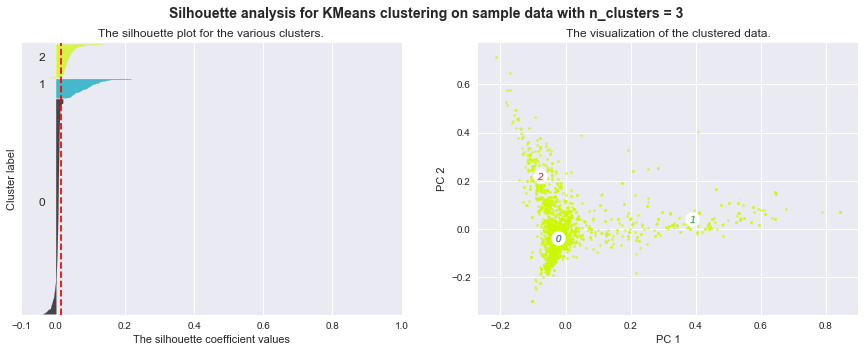

For n_clusters = 3, The average silhouette_score is : 0.014


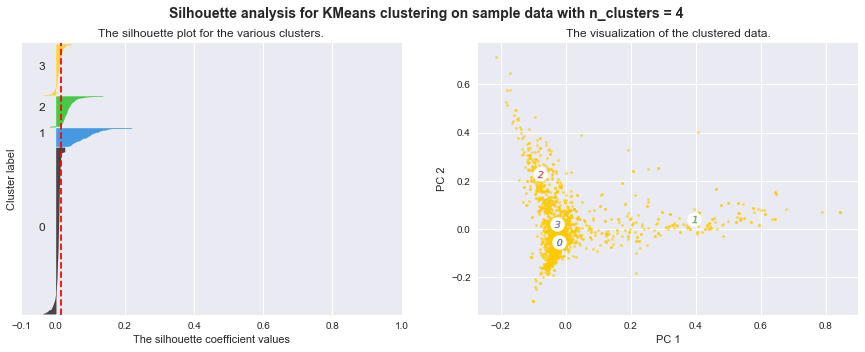

For n_clusters = 4, The average silhouette_score is : 0.016


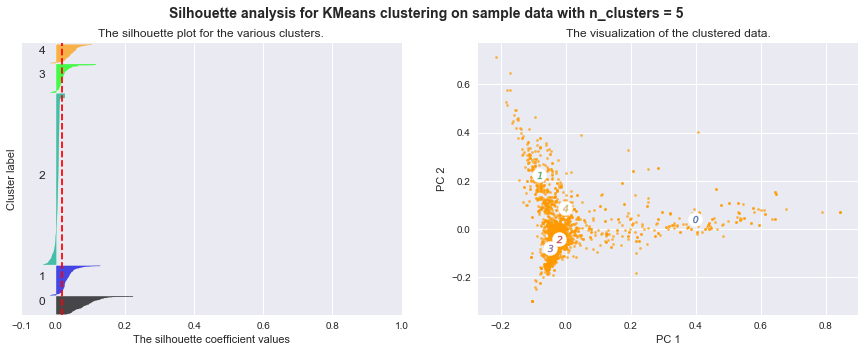

For n_clusters = 5, The average silhouette_score is : 0.017


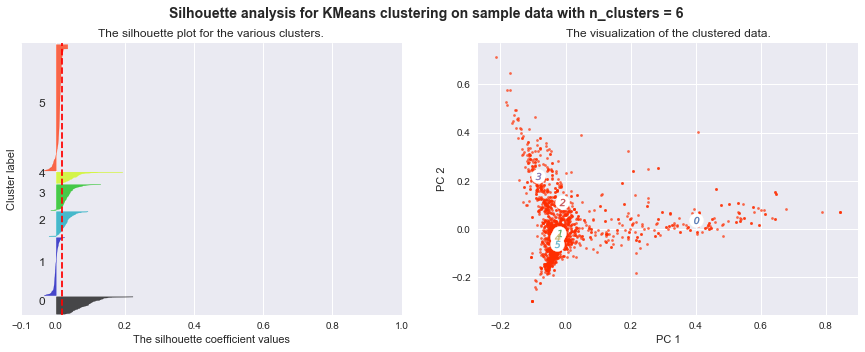

For n_clusters = 6, The average silhouette_score is : 0.018


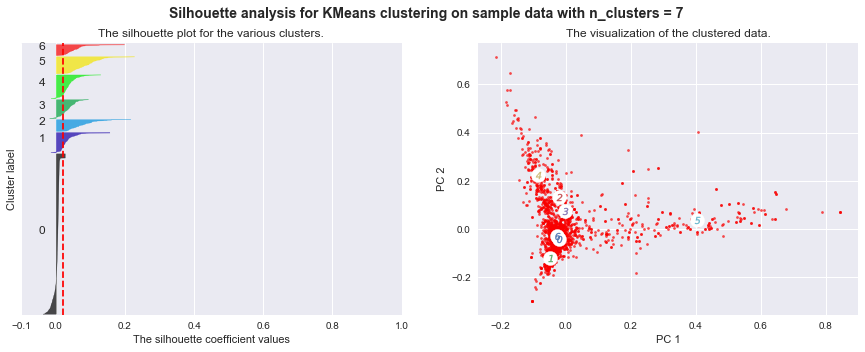

For n_clusters = 7, The average silhouette_score is : 0.021


In [66]:
cluster_num = [3, 4, 5, 6, 7]
RL_TFVectorizer, RL_TFVects = getTFVects(rdt_lulu)
for n in cluster_num:
    PCA = sklearn.decomposition.PCA
    pca = PCA(n_components=n).fit(RL_TFVects.toarray())
    reduced_data = pca.transform(RL_TFVects.toarray())
    X = RL_TFVects.toarray()
    plotSilhouette_revised(n, X, reduced_data)

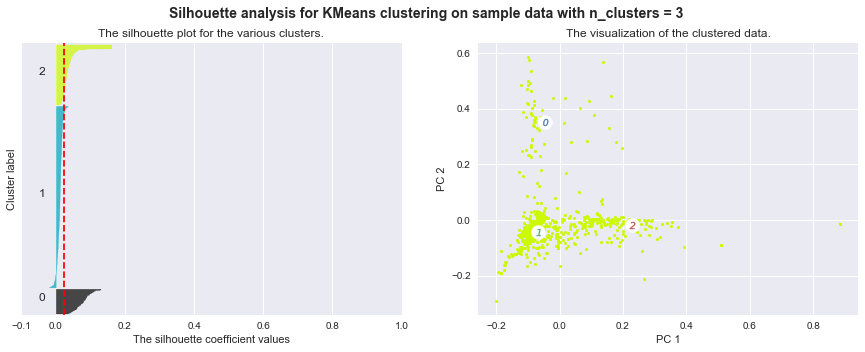

For n_clusters = 3, The average silhouette_score is : 0.024


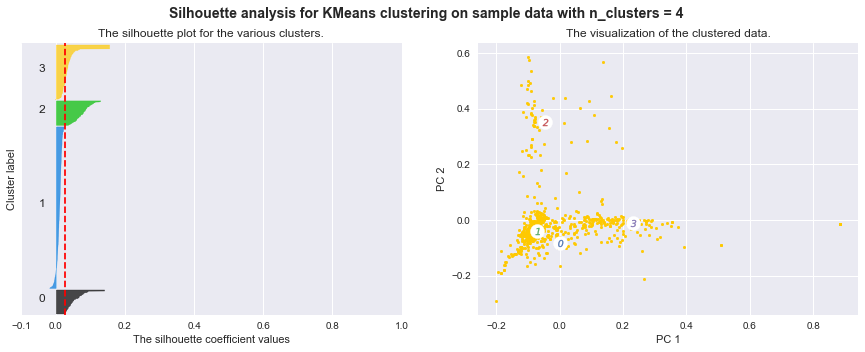

For n_clusters = 4, The average silhouette_score is : 0.026


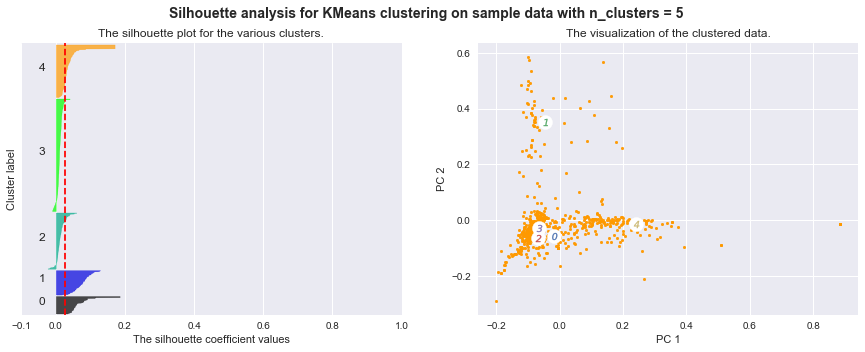

For n_clusters = 5, The average silhouette_score is : 0.027


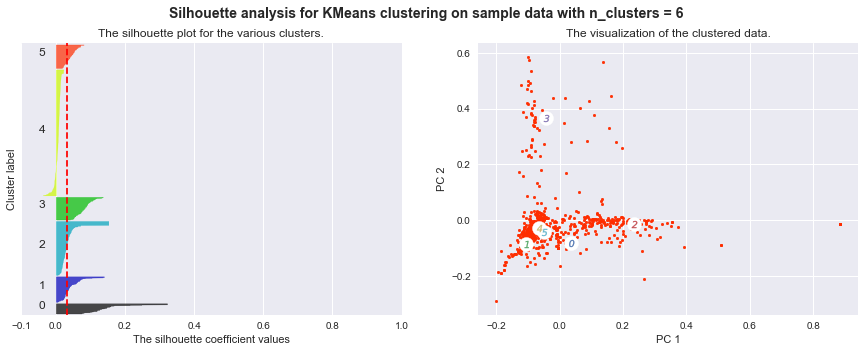

For n_clusters = 6, The average silhouette_score is : 0.032


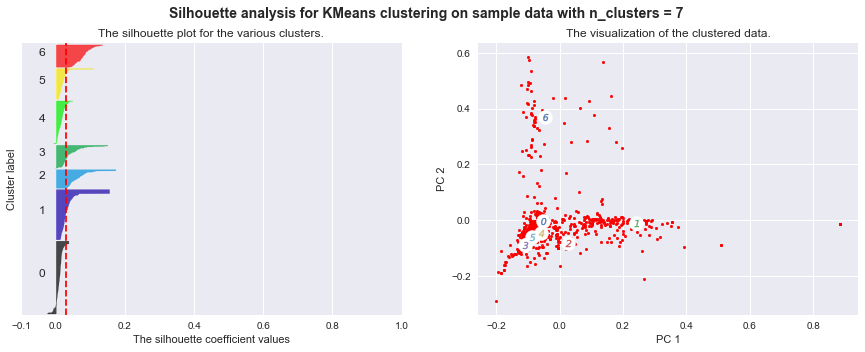

For n_clusters = 7, The average silhouette_score is : 0.030


In [67]:
RU_TFVectorizer, RU_TFVects = getTFVects(rdt_udar)
for n in cluster_num:
    PCA = sklearn.decomposition.PCA
    pca = PCA(n_components=n).fit(RU_TFVects.toarray())
    reduced_data = pca.transform(RU_TFVects.toarray())
    X = RU_TFVects.toarray()
    plotSilhouette_revised(n, X, reduced_data)

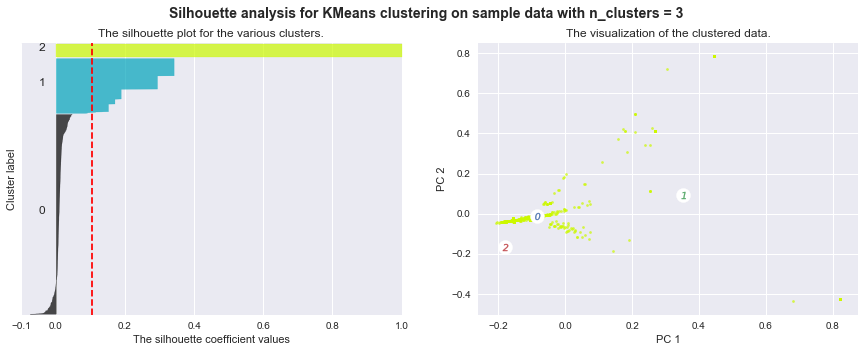

For n_clusters = 3, The average silhouette_score is : 0.105


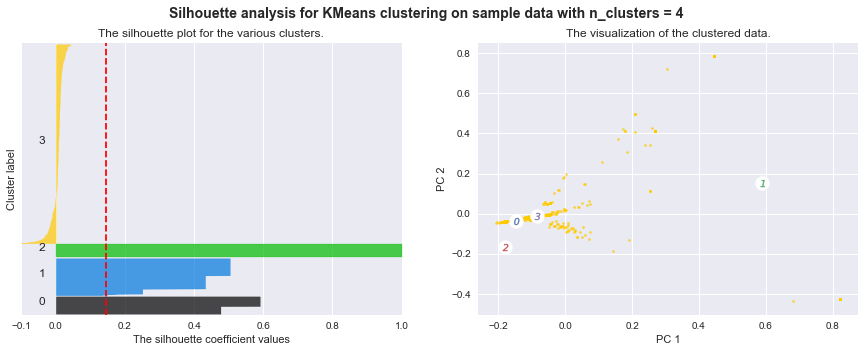

For n_clusters = 4, The average silhouette_score is : 0.146


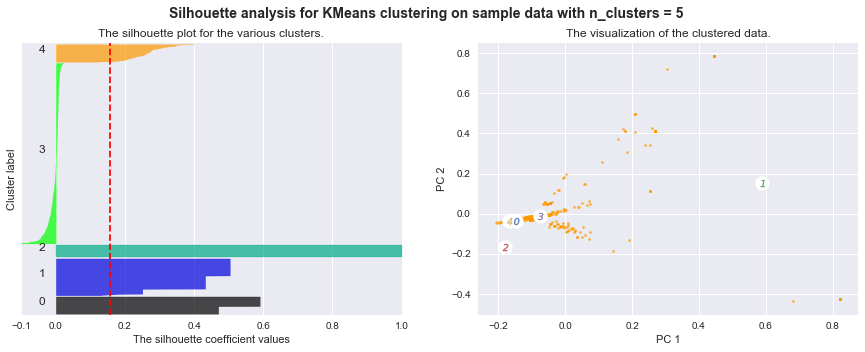

For n_clusters = 5, The average silhouette_score is : 0.157


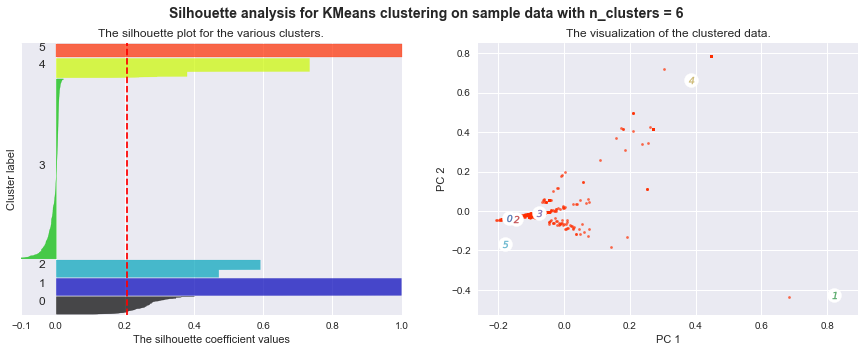

For n_clusters = 6, The average silhouette_score is : 0.206


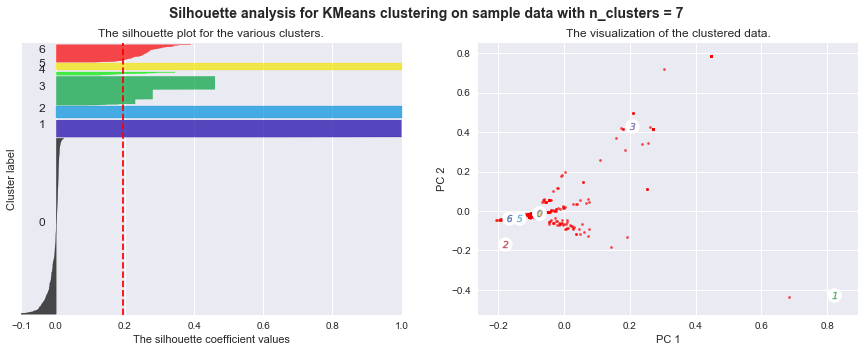

For n_clusters = 7, The average silhouette_score is : 0.195


In [68]:
TL_TFVectorizer, TL_TFVects = getTFVects(twt_lulu)
for n in cluster_num:
    PCA = sklearn.decomposition.PCA
    pca = PCA(n_components=n).fit(TL_TFVects.toarray())
    reduced_data = pca.transform(TL_TFVects.toarray())
    X = TL_TFVects.toarray()
    plotSilhouette_revised(n, X, reduced_data)

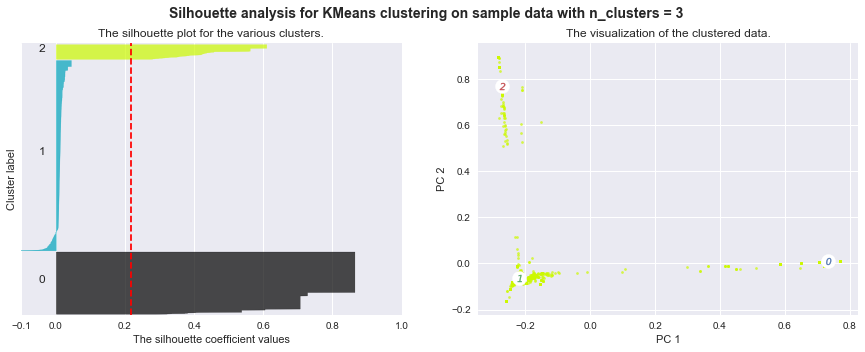

For n_clusters = 3, The average silhouette_score is : 0.218


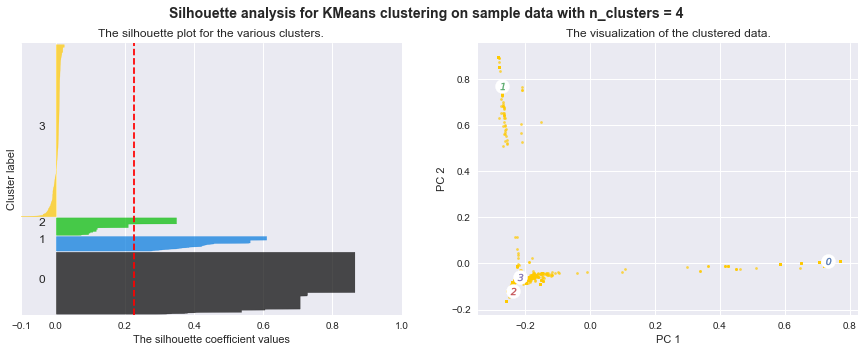

For n_clusters = 4, The average silhouette_score is : 0.226


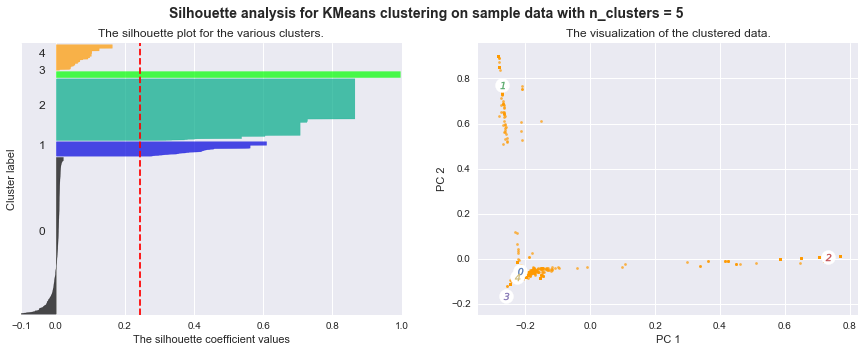

For n_clusters = 5, The average silhouette_score is : 0.242


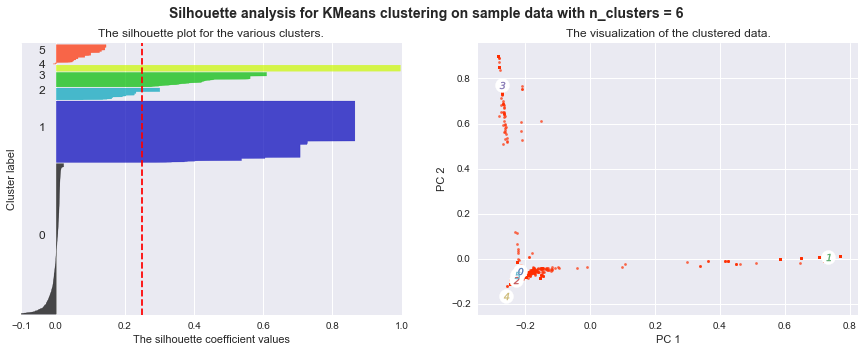

For n_clusters = 6, The average silhouette_score is : 0.249


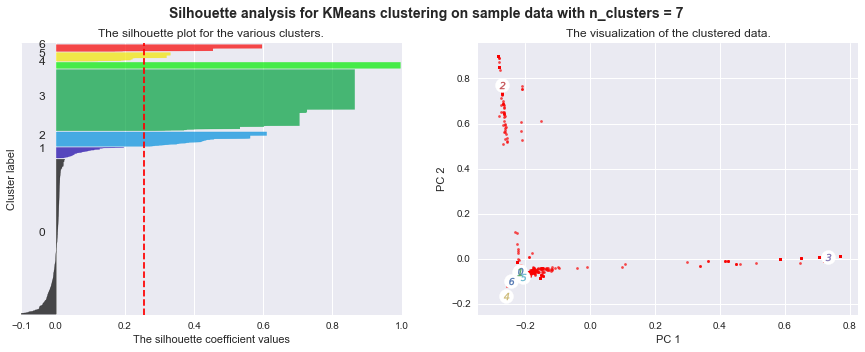

For n_clusters = 7, The average silhouette_score is : 0.256


In [69]:
TU_TFVectorizer, TU_TFVects = getTFVects(twt_udar)
for n in cluster_num:
    PCA = sklearn.decomposition.PCA
    pca = PCA(n_components=n).fit(TU_TFVects.toarray())
    reduced_data = pca.transform(TU_TFVects.toarray())
    X = TU_TFVects.toarray()
    plotSilhouette_revised(n, X, reduced_data)

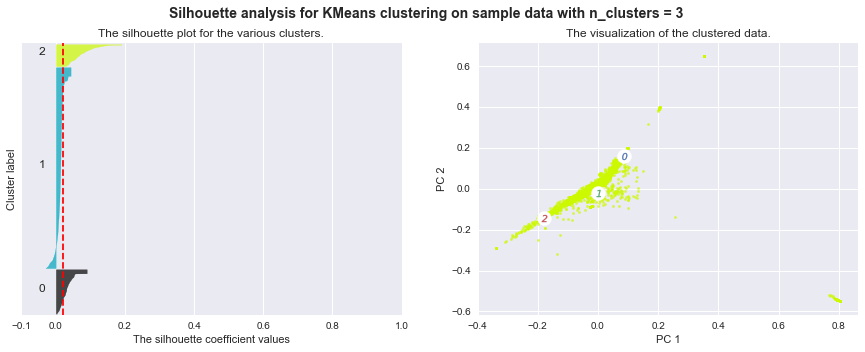

For n_clusters = 3, The average silhouette_score is : 0.021


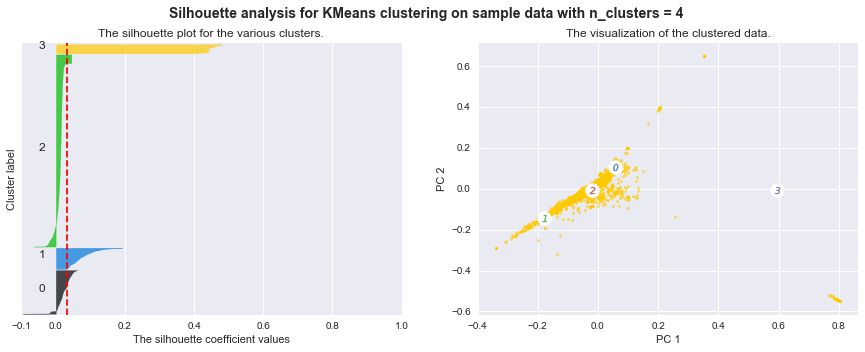

For n_clusters = 4, The average silhouette_score is : 0.033


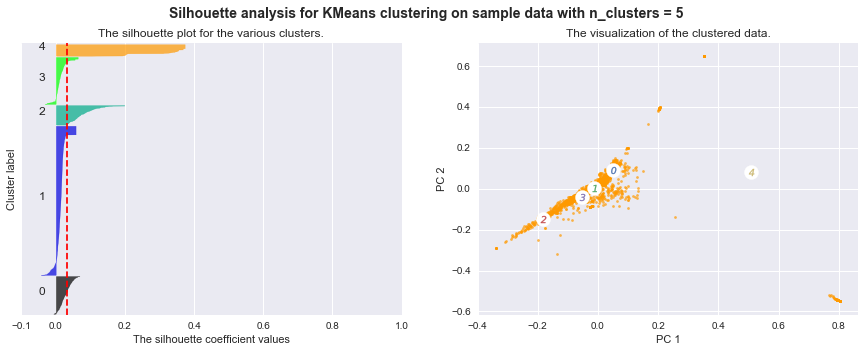

For n_clusters = 5, The average silhouette_score is : 0.034


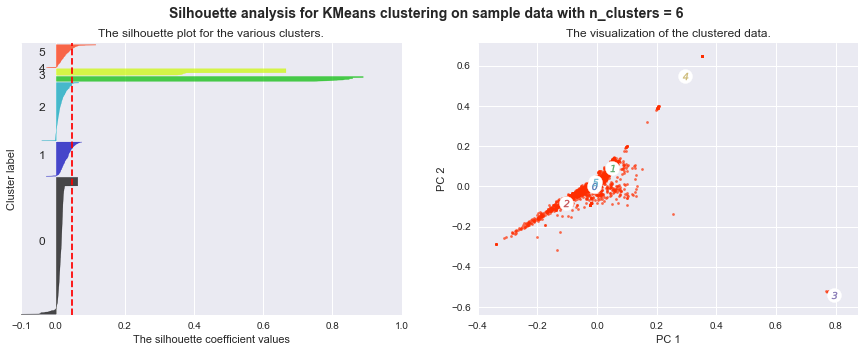

For n_clusters = 6, The average silhouette_score is : 0.046


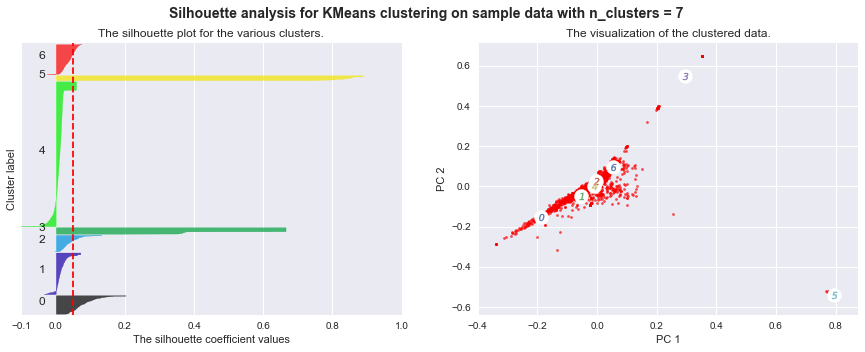

For n_clusters = 7, The average silhouette_score is : 0.050


In [70]:
IL_TFVectorizer, IL_TFVects = getTFVects(ins_lulu)
for n in cluster_num:
    PCA = sklearn.decomposition.PCA
    pca = PCA(n_components=n).fit(IL_TFVects.toarray())
    reduced_data = pca.transform(IL_TFVects.toarray())
    X = IL_TFVects.toarray()
    plotSilhouette_revised(n, X, reduced_data)

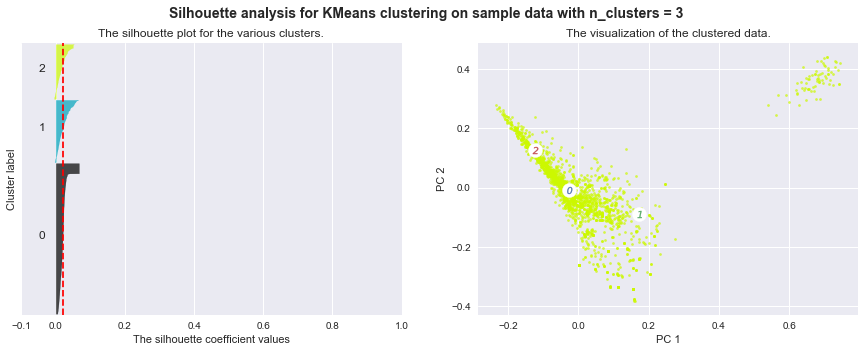

For n_clusters = 3, The average silhouette_score is : 0.020


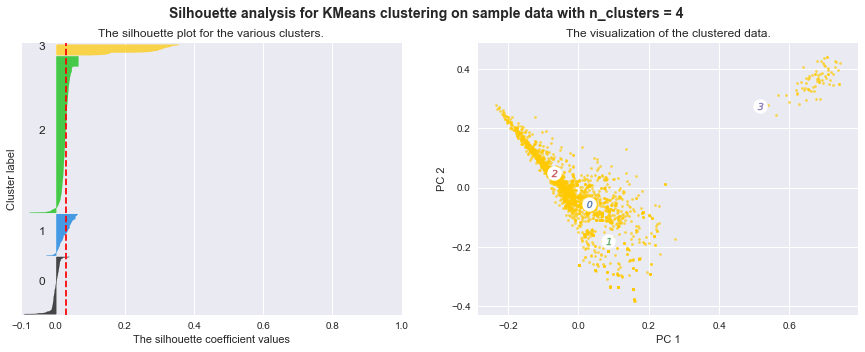

For n_clusters = 4, The average silhouette_score is : 0.030


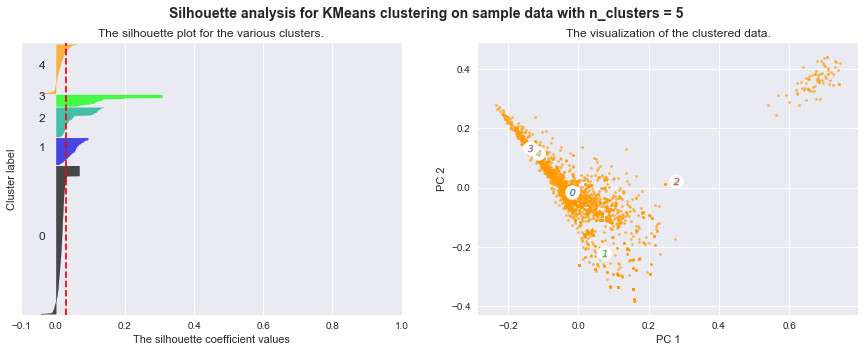

For n_clusters = 5, The average silhouette_score is : 0.030


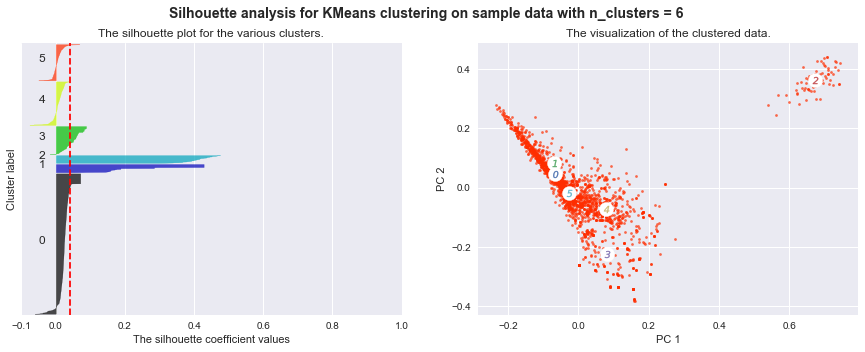

For n_clusters = 6, The average silhouette_score is : 0.041


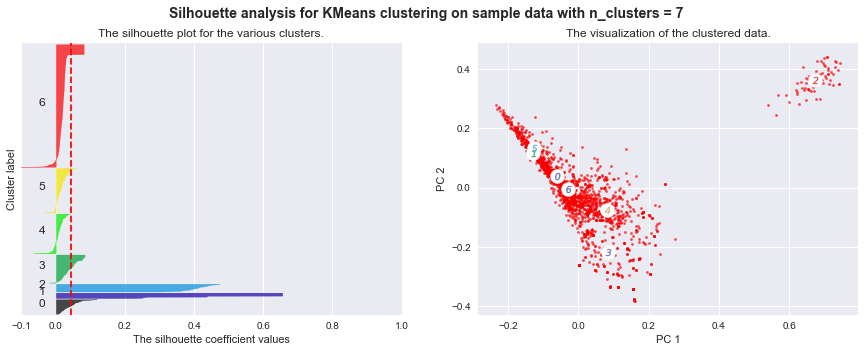

For n_clusters = 7, The average silhouette_score is : 0.043


In [71]:
IU_TFVectorizer, IU_TFVects = getTFVects(ins_udar)
for n in cluster_num:
    PCA = sklearn.decomposition.PCA
    pca = PCA(n_components=n).fit(IU_TFVects.toarray())
    reduced_data = pca.transform(IU_TFVects.toarray())
    X = IU_TFVects.toarray()
    plotSilhouette_revised(n, X, reduced_data)

6 is the best number of clusteres for Reddit Datasets and Twitter Lululemon. 5 for Twitter UA. 4 is the best number of clusters for Instagram Datasets. 

## Flat Clustering with $K$-means

In [72]:
colordict = {0: 'plum', 1: 'orange', 2: 'yellow', 3: 'green', 4: 'blue', 5: 'red', 6: 'purple'}
def kMeanClustering(df, n):
    TFVectorizer = sklearn.feature_extraction.text.TfidfVectorizer(max_df=0.50, max_features=1000, 
                                                           min_df=3, stop_words='english', norm='l2')
    TFVects = TFVectorizer.fit_transform(df['text'])
    km = sklearn.cluster.KMeans(n_clusters=n, init='k-means++')
    km.fit(TFVects.toarray())
    
    print("Evaluations")
    print("Homogeneity: {:0.3f}".format(sklearn.metrics.homogeneity_score(df['text'], km.labels_)))
    print("Completeness: {:0.3f}".format(sklearn.metrics.completeness_score(df['text'], km.labels_)))
    print("V-measure: {:0.3f}".format(sklearn.metrics.v_measure_score(df['text'], km.labels_)))
    print("Adjusted Rand Score: {:0.3f}\n".format(sklearn.metrics.adjusted_rand_score(df['text'], km.labels_)))
    
    # Distinguish features of the clusters
    print("Top terms per cluster:")
    terms = TFVectorizer.get_feature_names()
    order_centroids = km.cluster_centers_.argsort()[:, ::-1]
    for i in range(n):
        print("Cluster %d:" % i)
        for ind in order_centroids[i, :10]:
            print(' %s' % terms[ind])
        print('\n')
    
    df['kmeans_predictions'] = km.labels_
    colors = [colordict[c] for c in df['kmeans_predictions']]
    
    PCA = sklearn.decomposition.PCA
    pca = PCA(n_components=n).fit(TFVects.toarray())
    reduced_data = pca.transform(TFVects.toarray())
    components = pca.components_
    keyword_ids = list(set(order_centroids[:,:5].flatten()))
    words = [terms[i] for i in keyword_ids]
    x = components[:,keyword_ids][0,:]
    y = components[:,keyword_ids][1,:]
    
    fig = plt.figure(figsize = (16, 9))
    ax = fig.add_subplot(111)
    ax.set_frame_on(False)
    ax.scatter(reduced_data[:, 0], reduced_data[:, 1], color = colors, alpha = 0.3, label = colors)
    for i, word in enumerate(words):
        ax.annotate(word, (x[i],y[i]))   
    plt.xticks(())
    plt.yticks(())
    plt.title('True Classes')
    plt.show()
    return df

Evaluations
Homogeneity: 0.190
Completeness: 1.000
V-measure: 0.319
Adjusted Rand Score: 0.001

Top terms per cluster:
Cluster 0:
 fit
 today
 aligns
 size
 love
 blue
 pic
 color
 wmtm
 grey


Cluster 1:
 lulu
 wunder
 train
 trains
 bra
 size
 wmtm
 black
 blue
 25


Cluster 2:
 align
 tank
 shorts
 crop
 size
 fit
 pink
 21
 collection
 25


Cluster 3:
 drop
 water
 lavender
 dew
 size
 align
 track
 hr
 shorts
 pockets


Cluster 4:
 lululemon
 just
 don
 new
 like
 ve
 want
 time
 store
 items


Cluster 5:
 zip
 scuba
 oversized
 half
 xs
 black
 raspberry
 size
 grey
 restock




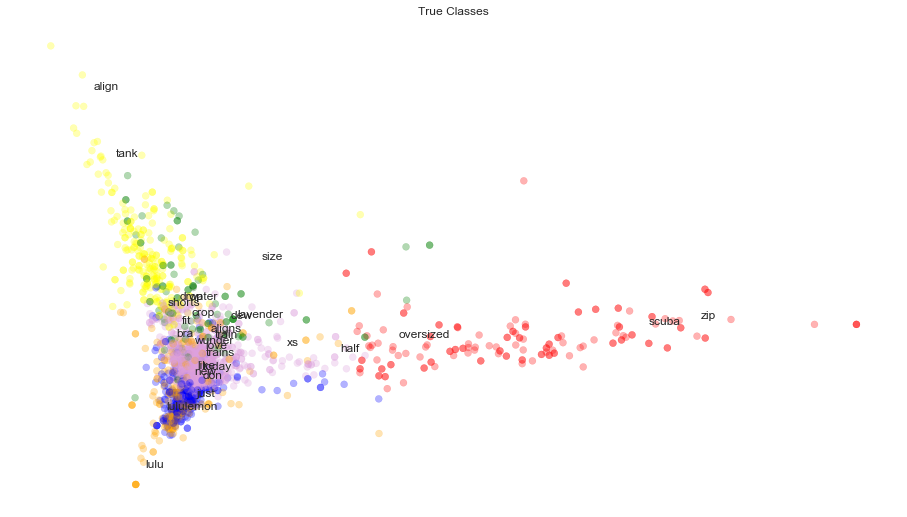

In [73]:
rdt_lulu = kMeanClustering(rdt_lulu, 6)

Evaluations
Homogeneity: 0.254
Completeness: 1.000
V-measure: 0.405
Adjusted Rand Score: 0.007

Top terms per cluster:
Cluster 0:
 https
 project
 com
 rock
 help
 survey
 www
 jacket
 imgur
 en


Cluster 1:
 40
 code
 codes
 100
 pm
 discount
 promo
 ambassador
 coupon
 thanks


Cluster 2:
 armour
 adidas
 brand
 nike
 uniforms
 kevin
 news
 says
 plank
 2020


Cluster 3:
 know
 does
 size
 shirt
 looking
 pants
 buy
 model
 ua
 want


Cluster 4:
 curry
 shoes
 new
 armour
 stephen
 ua
 shoe
 basketball
 underarmour
 low


Cluster 5:
 ua
 just
 shorts
 shirt
 like
 compression
 shirts
 coldgear
 ve
 shipping




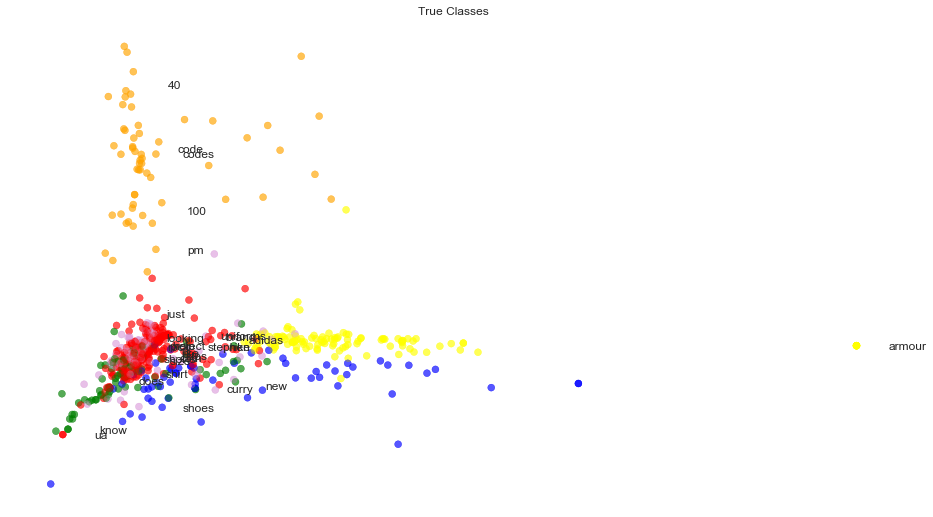

In [74]:
rdt_udar = kMeanClustering(rdt_udar, 6)

Evaluations
Homogeneity: 0.170
Completeness: 1.000
V-measure: 0.291
Adjusted Rand Score: 0.023

Top terms per cluster:
Cluster 0:
 white
 sinema
 proximal
 reminds
 eclectic
 enclaves
 multicolored
 gentrify
 urban
 notnikyatu


Cluster 1:
 birthday
 strength
 yerimiese
 gift
 products
 thank
 rvsmtown
 redvelvet
 ilyerene
 rt


Cluster 2:
 nim
 image
 bright
 sincerely
 inspiration
 healthy
 wish
 good
 yeri
 ilyerene


Cluster 3:
 https
 just
 bag
 srfn_fitness
 check
 rt
 closet
 poshmark
 listing
 added


Cluster 4:
 murrow
 insane
 journalism
 zoomed
 humbl
 edward
 picture
 spirit
 level
 bessbell


Cluster 5:
 leggings
 think
 love
 https
 just
 align
 added
 listing
 closet
 poshmark




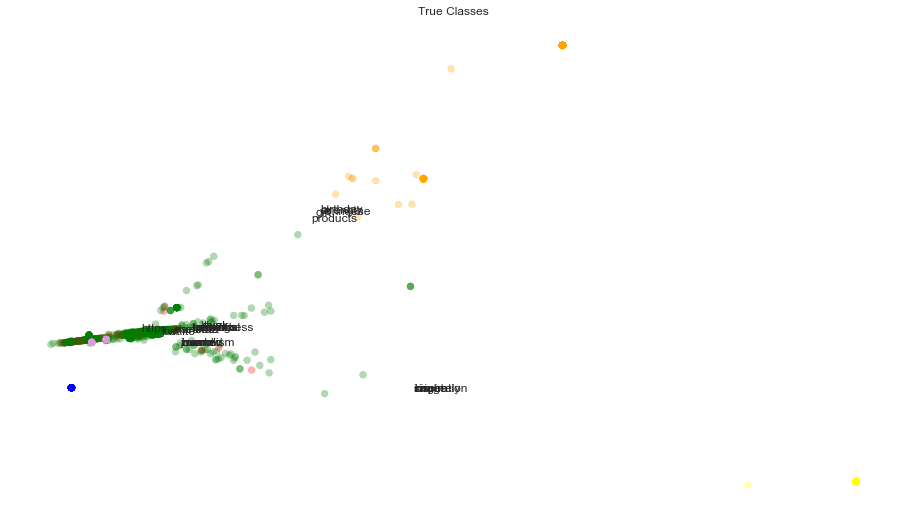

In [75]:
twt_lulu = kMeanClustering(twt_lulu, 6)

Evaluations
Homogeneity: 0.159
Completeness: 1.000
V-measure: 0.274
Adjusted Rand Score: 0.004

Top terms per cluster:
Cluster 0:
 share
 loving
 poshmarkapp
 items
 poshmark
 good
 check
 fashion
 style
 shopmycloset


Cluster 1:
 rt
 armour
 nike
 new
 therock
 just
 adidas
 shoes
 like
 today


Cluster 2:
 rt
 hyunbin
 women
 bin
 hyun
 armour
 finishline
 현빈
 vast
 ad


Cluster 3:
 shoe
 follow
 bsr
 hardest
 worker
 room
 upgrade
 click
 bloodsweatr
 link


Cluster 4:
 aawashington_3
 kirbyhocutt
 teagan_ttu
 ttucoachwells
 texastechfb
 congrats
 congratulations
 ashton
 welcome
 luck




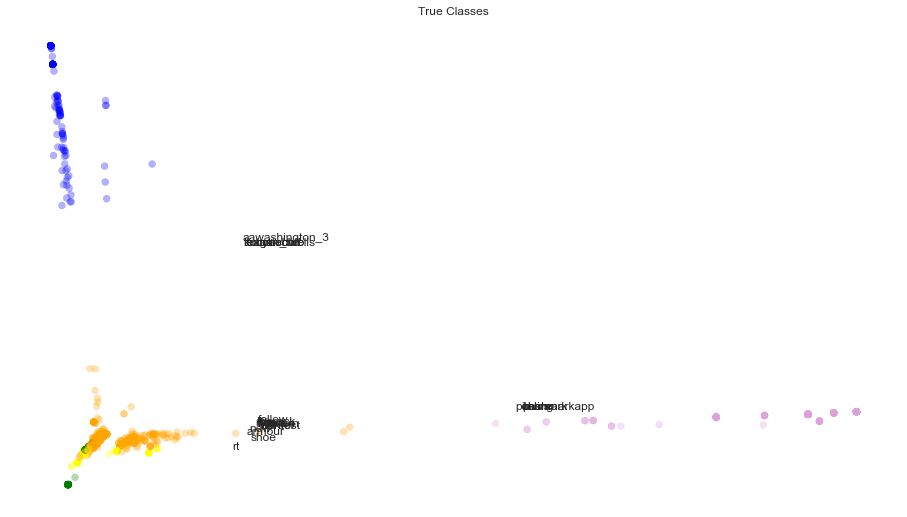

In [76]:
twt_udar = kMeanClustering(twt_udar, 5)

Evaluations
Homogeneity: 0.134
Completeness: 1.000
V-measure: 0.236
Adjusted Rand Score: 0.001

Top terms per cluster:
Cluster 0:
 yoga
 women
 day
 happy
 love
 just
 time
 today
 international
 run


Cluster 1:
 workout
 fitness
 gym
 fitnessmotivation
 fit
 fitnessjourney
 gymshark
 day
 leg
 squats


Cluster 2:
 nike
 rapsodia
 zara
 ginebra
 madewell
 ดว
 นเทจ
 อผ
 ายน
 besha


Cluster 3:
 size
 shipping
 00
 sold
 lulu
 thrift
 thrifting
 lululemonforsale
 bin
 free




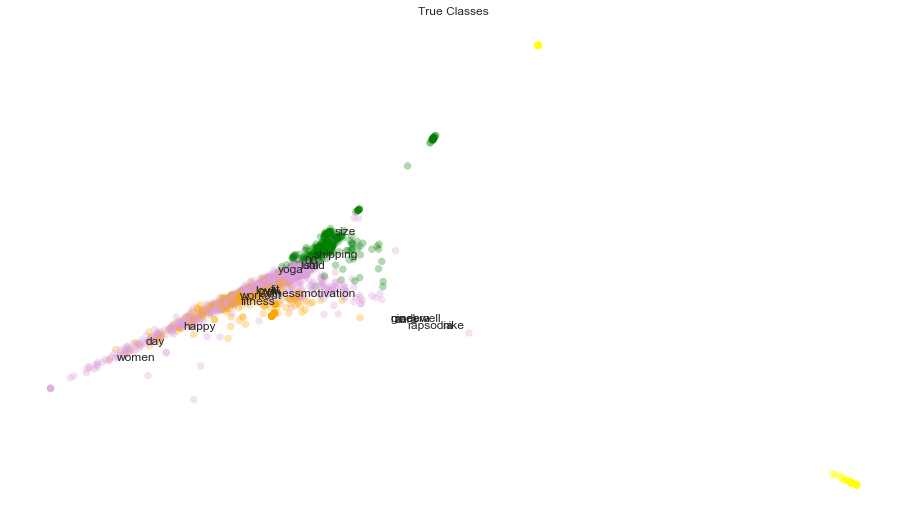

In [77]:
ins_lulu = kMeanClustering(ins_lulu, 4)

Evaluations
Homogeneity: 0.141
Completeness: 1.000
V-measure: 0.247
Adjusted Rand Score: 0.001

Top terms per cluster:
Cluster 0:
 chez
 mastersport
 prix
 algerie
 da
 sneakers
 original
 puma
 pointure
 disponible


Cluster 1:
 armour
 run
 running
 new
 day
 nike
 follow
 ua
 love
 work


Cluster 2:
 nike
 adidas
 puma
 reebok
 en
 newbalance
 jordan
 todo
 el
 whatsapp


Cluster 3:
 workout
 fitness
 gym
 training
 fitnessmotivation
 bodybuilding
 gymlife
 motivation
 fit
 gymmotivation




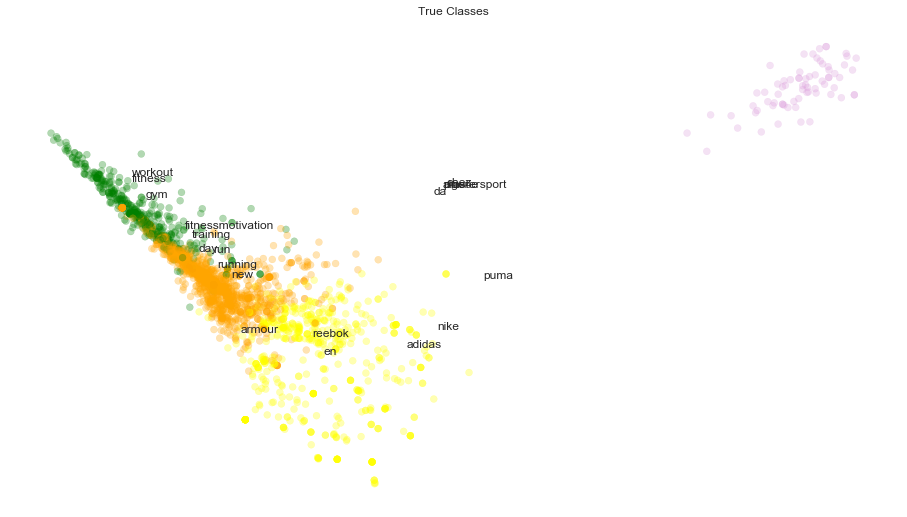

In [78]:
ins_udar = kMeanClustering(ins_udar, 4)

### Hierarchical Cluster

In [79]:
def getLinkageMatrix(TFVects):
    CoocMat = TFVects * TFVects.T
    CoocMat.setdiag(0)
    matrix = scipy.cluster.hierarchy.ward(CoocMat[:50, :50].toarray())
    return matrix

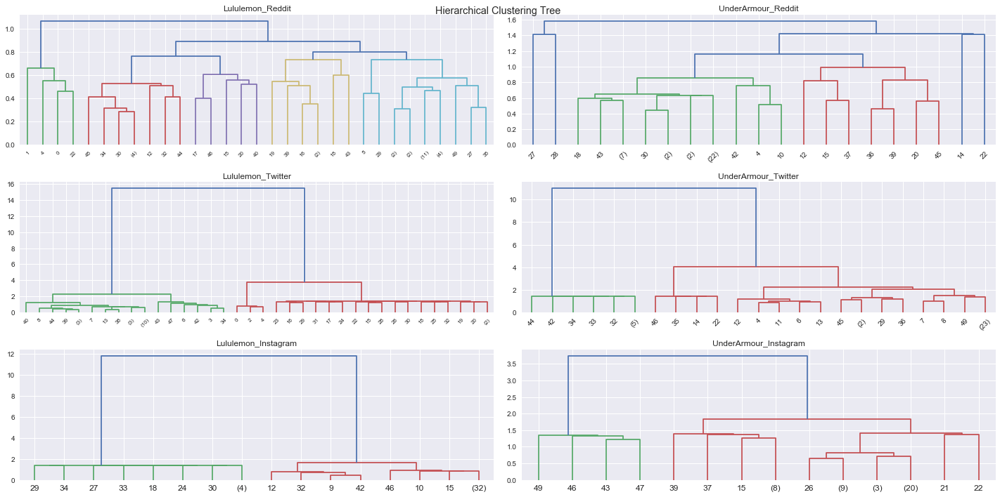

In [80]:
fig, axs = plt.subplots(3, 2, figsize=(20, 10))
fig.suptitle("Hierarchical Clustering Tree")

RL_matrix = getLinkageMatrix(RL_TFVects)
scipy.cluster.hierarchy.dendrogram(RL_matrix, p=6, truncate_mode='level', get_leaves=True, ax=axs[0, 0])
axs[0, 0].set_title(RDT_LULU)
RU_matrix = getLinkageMatrix(RU_TFVects)
scipy.cluster.hierarchy.dendrogram(RU_matrix, p=6, truncate_mode='level', get_leaves=True, ax=axs[0, 1])
axs[0, 1].set_title(RDT_UDAR)

TL_matrix = getLinkageMatrix(TL_TFVects)
scipy.cluster.hierarchy.dendrogram(TL_matrix, p=6, truncate_mode='level', get_leaves=True, ax=axs[1, 0])
axs[1, 0].set_title(TWT_LULU)
TU_matrix = getLinkageMatrix(TU_TFVects)
scipy.cluster.hierarchy.dendrogram(TU_matrix, p=5, truncate_mode='level', get_leaves=True, ax=axs[1, 1])
axs[1, 1].set_title(TWT_UDAR)

IL_matrix = getLinkageMatrix(IL_TFVects)
scipy.cluster.hierarchy.dendrogram(IL_matrix, p=4, truncate_mode='level', get_leaves=True, ax=axs[2, 0])
axs[2, 0].set_title(INS_LULU)
IU_matrix = getLinkageMatrix(IU_TFVects)
scipy.cluster.hierarchy.dendrogram(IU_matrix, p=4, truncate_mode='level', get_leaves=True, ax=axs[2, 1])
axs[2, 1].set_title(INS_UDAR)

fig.tight_layout()
plt.show()

In [81]:
def calculateWaldClustering(TFVects, title, n, df):
    CoocMat = TFVects * TFVects.T
    linkage_matrix_full = scipy.cluster.hierarchy.ward(CoocMat.toarray())
    hierarchicalClusters_full = scipy.cluster.hierarchy.fcluster(linkage_matrix_full, n, 'maxclust')
    print("Silhouetter score for " + title + " is " + 
          str(sklearn.metrics.silhouette_score(CoocMat, hierarchicalClusters_full)))
    df['wald_predictions'] = hierarchicalClusters_full
    return df

In [82]:
rdt_lulu = calculateWaldClustering(RL_TFVects, RDT_LULU, 6, rdt_lulu)

Silhouetter score for Lululemon_Reddit is 0.0881255038756018


In [83]:
rdt_udar = calculateWaldClustering(RU_TFVects, RDT_UDAR, 6, rdt_udar)

Silhouetter score for UnderArmour_Reddit is 0.09565320906566872


In [84]:
twt_lulu = calculateWaldClustering(TL_TFVects, TWT_LULU, 6, twt_lulu)

Silhouetter score for Lululemon_Twitter is 0.5296363982397223


In [85]:
twt_udar = calculateWaldClustering(TU_TFVects, TWT_UDAR, 5, twt_udar)

Silhouetter score for UnderArmour_Twitter is 0.6081191735207121


In [86]:
ins_lulu = calculateWaldClustering(IL_TFVects, INS_LULU, 4, ins_lulu)

Silhouetter score for Lululemon_Instagram is 0.17150466115158897


In [87]:
ins_udar = calculateWaldClustering(IU_TFVects, INS_UDAR, 4, ins_udar)

Silhouetter score for UnderArmour_Instagram is 0.12924553799868113


### Genism

In [88]:
def dropMissing(wordLst, vocab):
    return [w for w in wordLst if w in vocab]

rdt_lulu['reduced_tokens'] = rdt_lulu['normalized_tokens'].apply(lambda x: dropMissing(x, RL_TFVectorizer.vocabulary_.keys()))
twt_lulu['reduced_tokens'] = twt_lulu['normalized_tokens'].apply(lambda x: dropMissing(x, TL_TFVectorizer.vocabulary_.keys()))
ins_lulu['reduced_tokens'] = ins_lulu['normalized_tokens'].apply(lambda x: dropMissing(x, IL_TFVectorizer.vocabulary_.keys()))
rdt_udar['reduced_tokens'] = rdt_udar['normalized_tokens'].apply(lambda x: dropMissing(x, RU_TFVectorizer.vocabulary_.keys()))
twt_udar['reduced_tokens'] = twt_udar['normalized_tokens'].apply(lambda x: dropMissing(x, TU_TFVectorizer.vocabulary_.keys()))
ins_udar['reduced_tokens'] = ins_udar['normalized_tokens'].apply(lambda x: dropMissing(x, IU_TFVectorizer.vocabulary_.keys()))

In [89]:
def conductLDAModel(df, title):
    dictionary = gensim.corpora.Dictionary(df['reduced_tokens'])
    corpus = [dictionary.doc2bow(text) for text in df['reduced_tokens']]
    gensim.corpora.MmCorpus.serialize(title, corpus)
    mmcorpus = gensim.corpora.MmCorpus(title)
    lda = gensim.models.ldamodel.LdaModel(corpus=mmcorpus, id2word=dictionary, num_topics=10, alpha='auto', eta='auto')
    return dictionary, lda

In [90]:
RL_dict, RL_lda = conductLDAModel(rdt_lulu, RDT_LULU)
RU_dict, RU_lda = conductLDAModel(rdt_udar, RDT_LULU)
TL_dict, TL_lda = conductLDAModel(twt_lulu, TWT_LULU)
TU_dict, TU_lda = conductLDAModel(twt_udar, TWT_UDAR)
IL_dict, IL_lda = conductLDAModel(ins_lulu, INS_LULU)
IU_dict, IU_lda = conductLDAModel(ins_udar, INS_UDAR)

#### Reddit Lululemon

In [91]:
RL_ldaDF = pd.DataFrame({'upvotes' : rdt_lulu['upvotes'], 
                         'topics' : [RL_lda[RL_dict.doc2bow(l)] for l in rdt_lulu['reduced_tokens']]})
topicsProbDict = {i : [0] * len(RL_ldaDF) for i in range(RL_lda.num_topics)}

for index, topicTuples in enumerate(RL_ldaDF['topics']):
    for topicNum, prob in topicTuples:
        topicsProbDict[topicNum][index] = prob

for topicNum in range(RL_lda.num_topics):
    RL_ldaDF['topic_{}'.format(topicNum)] = topicsProbDict[topicNum]

RL_ldaDF.head()

,topics,upvotes,topic_0,topic_1,topic_2,topic_3,topic_4,topic_5,topic_6,topic_7,topic_8,topic_9
0,"[(0, 0.33433884), (1, 0.34009668), (6, 0.29722...",1,0.334339,0.340097,0.000000,0.000000,0.000000,0.00000,0.297220,0.000000,0.000000,0.000000
1,"[(0, 0.6224566), (2, 0.31239942)]",1,0.622457,0.000000,0.312399,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000
2,"[(3, 0.38745904), (8, 0.5674436)]",1,0.000000,0.000000,0.000000,0.387459,0.000000,0.00000,0.000000,0.000000,0.567444,0.000000
3,"[(0, 0.028382855), (1, 0.026984612), (2, 0.026...",6,0.028383,0.026985,0.026512,0.743947,0.030662,0.02687,0.027055,0.028608,0.033231,0.027747
4,"[(1, 0.15373594), (2, 0.2296209), (6, 0.5807867)]",2,0.000000,0.153736,0.229621,0.000000,0.000000,0.00000,0.580787,0.000000,0.000000,0.000000


In [92]:
RL_ldaDF.sort_values(by=['upvotes'], ascending=False, inplace=True)
RL_ldaDFV = RL_ldaDF[:10][['topic_%d' %x for x in range(10)]]
RL_ldaDFVisN = RL_ldaDF[:10][['upvotes']]
RL_ldaDFVis = RL_ldaDFV.values
RL_ldaDFVisNames = RL_ldaDFVisN.values

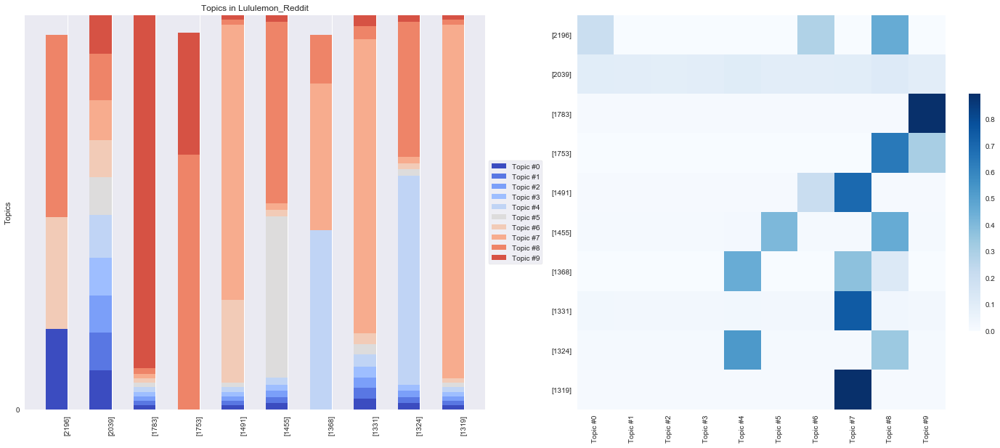

In [93]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(25, 10))

# Visualize as a stacked bar chart
N = 10
ind = np.arange(N)
K = RL_lda.num_topics  # N documents, K topics
ind = np.arange(N)  # the x-axis locations for the novels
width = 0.5  # the width of the bars
plots = []
height_cumulative = np.zeros(N)

for k in range(K):
    color = plt.cm.coolwarm(k/K, 1)
    if k == 0:
        p = ax1.bar(ind, RL_ldaDFVis[:, k], width, color=color)
    else:
        p = ax1.bar(ind, RL_ldaDFVis[:, k], width, bottom=height_cumulative, color=color)
    height_cumulative += RL_ldaDFVis[:, k]
    plots.append(p)
    
ax1.set_ylim((0, 1))  # proportions sum to 1, so the height of the stacked bars is 1
ax1.set_ylabel('Topics')

ax1.set_title('Topics in ' + RDT_LULU)
ax1.set_xticks(ind+width/2)
ax1.set_xticklabels(RL_ldaDFVisNames, rotation='vertical')

ax1.set_yticks(np.arange(0, 1, 10))
topic_labels = ['Topic #{}'.format(k) for k in range(K)]
ax1.legend([p[0] for p in plots], topic_labels, loc='center left', frameon=True,  bbox_to_anchor = (1, .5))
ax1.figure.show()

ax2.pcolor(RL_ldaDFVis, norm=None, cmap='Blues')
ax2.set_yticks(np.arange(RL_ldaDFVis.shape[0])+0.5)
ax2.set_yticklabels(RL_ldaDFVisNames);
ax2.set_xticks(np.arange(RL_ldaDFVis.shape[1])+0.5)
ax2.set_xticklabels(topic_labels, rotation=90);
ax2.invert_yaxis()
fig.colorbar(ax2.pcolormesh(RL_ldaDFVis, norm=None, cmap='Blues'), ax=ax2, shrink=0.6)

plt.show()

In [94]:
topicsDict = {}
for topicNum in range(RL_lda.num_topics):
    topicWords = [w for w, p in RL_lda.show_topic(topicNum)]
    topicsDict['Topic_{}'.format(topicNum)] = topicWords

wordRanksDF = pd.DataFrame(topicsDict)
wordRanksDF

,Topic_0,Topic_1,Topic_2,Topic_3,Topic_4,Topic_5,Topic_6,Topic_7,Topic_8,Topic_9
0,bra,love,drop,fit,align,try,lulu,new,align,black
1,today,blue,align,free,zip,fit,feel,like,tank,tank
2,align,buy,water,love,drop,know,time,store,wunder,new
3,zip,color,pocket,color,scuba,bra,work,post,train,crop
4,love,want,short,tee,lavender,lab,like,align,short,love
5,scuba,think,dye,happy,dew,train,great,today,fit,wear
6,crop,wear,comment,fast,color,day,fit,bra,grey,zip
7,short,time,wmtm,workout,water,tight,start,scuba,zip,jacket
8,interview,short,new,cates,wear,like,think,look,scuba,like
9,wear,lulu,fabric,legging,train,thank,hope,fit,pink,fit


In [500]:
RL_ldaDFV = RL_ldaDF[-10:][['topic_%d' %x for x in range(10)]]
RL_ldaDFVisN = RL_ldaDF[-10:][['upvotes']]
RL_ldaDFVis = RL_ldaDFV.values
RL_ldaDFVisNames = RL_ldaDFVisN.values

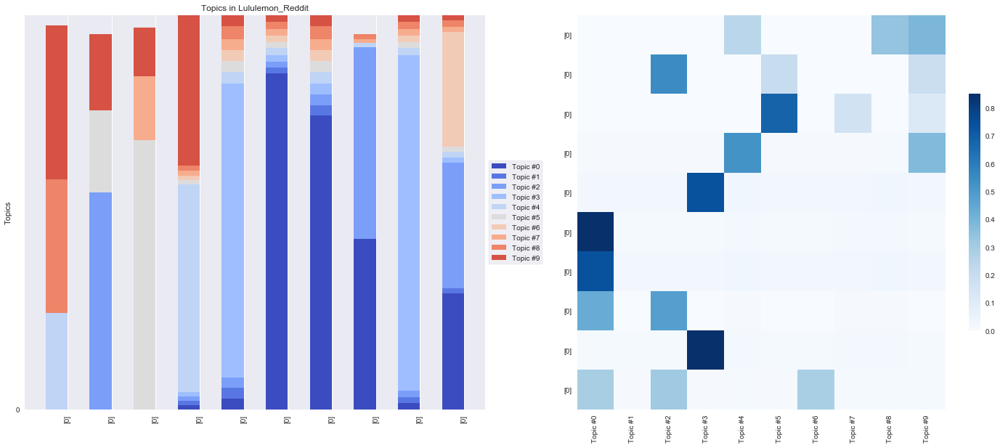

In [501]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(25, 10))

# Visualize as a stacked bar chart
N = 10
ind = np.arange(N)
K = RL_lda.num_topics  # N documents, K topics
ind = np.arange(N)  # the x-axis locations for the novels
width = 0.5  # the width of the bars
plots = []
height_cumulative = np.zeros(N)

for k in range(K):
    color = plt.cm.coolwarm(k/K, 1)
    if k == 0:
        p = ax1.bar(ind, RL_ldaDFVis[:, k], width, color=color)
    else:
        p = ax1.bar(ind, RL_ldaDFVis[:, k], width, bottom=height_cumulative, color=color)
    height_cumulative += RL_ldaDFVis[:, k]
    plots.append(p)
    
ax1.set_ylim((0, 1))  # proportions sum to 1, so the height of the stacked bars is 1
ax1.set_ylabel('Topics')

ax1.set_title('Topics in ' + RDT_LULU)
ax1.set_xticks(ind+width/2)
ax1.set_xticklabels(RL_ldaDFVisNames, rotation='vertical')

ax1.set_yticks(np.arange(0, 1, 10))
topic_labels = ['Topic #{}'.format(k) for k in range(K)]
ax1.legend([p[0] for p in plots], topic_labels, loc='center left', frameon=True,  bbox_to_anchor = (1, .5))
ax1.figure.show()

ax2.pcolor(RL_ldaDFVis, norm=None, cmap='Blues')
ax2.set_yticks(np.arange(RL_ldaDFVis.shape[0])+0.5)
ax2.set_yticklabels(RL_ldaDFVisNames);
ax2.set_xticks(np.arange(RL_ldaDFVis.shape[1])+0.5)
ax2.set_xticklabels(topic_labels, rotation=90);
ax2.invert_yaxis()
fig.colorbar(ax2.pcolormesh(RL_ldaDFVis, norm=None, cmap='Blues'), ax=ax2, shrink=0.6)

plt.show()

#### Reddit UnderArmour

In [95]:
RU_ldaDF = pd.DataFrame({'upvotes' : rdt_udar['upvotes'], 
                         'topics' : [RU_lda[RU_dict.doc2bow(l)] for l in rdt_udar['reduced_tokens']]})
topicsProbDict = {i : [0] * len(RU_ldaDF) for i in range(RU_lda.num_topics)}

for index, topicTuples in enumerate(RU_ldaDF['topics']):
    for topicNum, prob in topicTuples:
        topicsProbDict[topicNum][index] = prob

for topicNum in range(RU_lda.num_topics):
    RU_ldaDF['topic_{}'.format(topicNum)] = topicsProbDict[topicNum]

RU_ldaDF.head()

,topics,upvotes,topic_0,topic_1,topic_2,topic_3,topic_4,topic_5,topic_6,topic_7,topic_8,topic_9
0,"[(0, 0.9441724)]",2,0.944172,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,"[(0, 0.013631426), (1, 0.5670613), (2, 0.01321...",4,0.013631,0.567061,0.013212,0.01176,0.013041,0.331146,0.012984,0.012355,0.012687,0.012122
2,"[(0, 0.013631555), (1, 0.012152535), (2, 0.886...",4,0.013632,0.012153,0.886848,0.01176,0.013041,0.012417,0.012984,0.012356,0.012687,0.012122
3,"[(2, 0.9396079)]",0,0.000000,0.000000,0.939608,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,"[(4, 0.93441916)]",2,0.000000,0.000000,0.000000,0.00000,0.934419,0.000000,0.000000,0.000000,0.000000,0.000000


In [96]:
RU_ldaDF.sort_values(by=['upvotes'], ascending=False, inplace=True)
RU_ldaDFV = RU_ldaDF[:10][['topic_%d' %x for x in range(10)]]
RU_ldaDFVisN = RU_ldaDF[:10][['upvotes']]
RU_ldaDFVis = RU_ldaDFV.values
RU_ldaDFVisNames = RU_ldaDFVisN.values

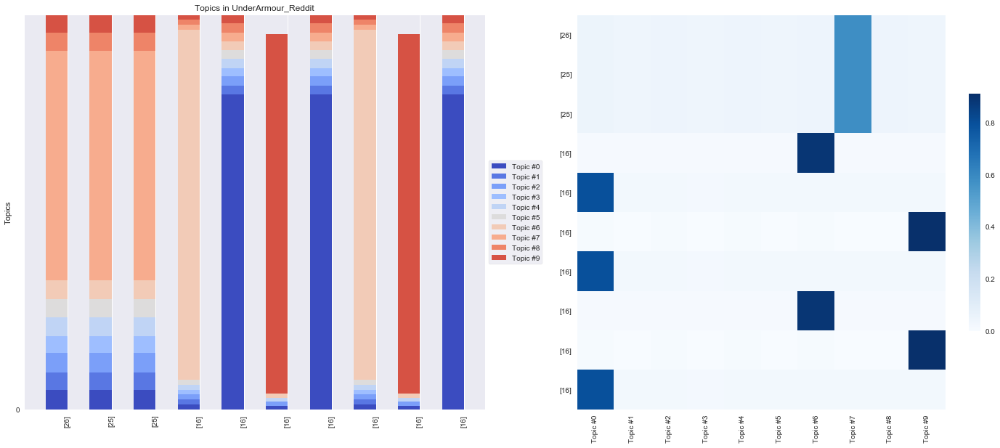

In [97]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(25, 10))

# Visualize as a stacked bar chart
N = 10
ind = np.arange(N)
K = RU_lda.num_topics  # N documents, K topics
ind = np.arange(N)  # the x-axis locations for the novels
width = 0.5  # the width of the bars
plots = []
height_cumulative = np.zeros(N)

for k in range(K):
    color = plt.cm.coolwarm(k/K, 1)
    if k == 0:
        p = ax1.bar(ind, RU_ldaDFVis[:, k], width, color=color)
    else:
        p = ax1.bar(ind, RU_ldaDFVis[:, k], width, bottom=height_cumulative, color=color)
    height_cumulative += RU_ldaDFVis[:, k]
    plots.append(p)
    
ax1.set_ylim((0, 1))  # proportions sum to 1, so the height of the stacked bars is 1
ax1.set_ylabel('Topics')

ax1.set_title('Topics in ' + RDT_UDAR)
ax1.set_xticks(ind+width/2)
ax1.set_xticklabels(RU_ldaDFVisNames, rotation='vertical')

ax1.set_yticks(np.arange(0, 1, 10))
topic_labels = ['Topic #{}'.format(k) for k in range(K)]
ax1.legend([p[0] for p in plots], topic_labels, loc='center left', frameon=True,  bbox_to_anchor = (1, .5))
ax1.figure.show()

ax2.pcolor(RU_ldaDFVis, norm=None, cmap='Blues')
ax2.set_yticks(np.arange(RU_ldaDFVis.shape[0])+0.5)
ax2.set_yticklabels(RU_ldaDFVisNames);
ax2.set_xticks(np.arange(RU_ldaDFVis.shape[1])+0.5)
ax2.set_xticklabels(topic_labels, rotation=90);
ax2.invert_yaxis()
fig.colorbar(ax2.pcolormesh(RU_ldaDFVis, norm=None, cmap='Blues'), ax=ax2, shrink=0.6)

plt.show()

In [98]:
topicsDict = {}
for topicNum in range(RU_lda.num_topics):
    topicWords = [w for w, p in RU_lda.show_topic(topicNum)]
    topicsDict['Topic_{}'.format(topicNum)] = topicWords

wordRanksDF = pd.DataFrame(topicsDict)
wordRanksDF

,Topic_0,Topic_1,Topic_2,Topic_3,Topic_4,Topic_5,Topic_6,Topic_7,Topic_8,Topic_9
0,code,rock,armour,ua,ua,ua,armour,armour,know,shirt
1,shoe,project,ua,armour,armour,look,buy,ua,compression,ua
2,armour,ua,shoe,like,know,new,ua,short,look,armour
3,thank,armour,order,look,store,shirt,like,product,armour,like
4,know,help,purchase,try,look,armour,short,new,shirt,buy
5,buy,buy,card,vs,help,underarmour,man,sell,like,product
6,ua,thank,look,factory,order,want,new,kevin,ua,help
7,shirt,product,gift,know,long,like,shoe,like,fit,run
8,want,know,like,month,brand,shoe,look,work,use,new
9,time,want,try,product,shirt,thank,help,help,app,shoe


In [502]:
RU_ldaDFV = RU_ldaDF[-10:][['topic_%d' %x for x in range(10)]]
RU_ldaDFVisN = RU_ldaDF[-10:][['upvotes']]
RU_ldaDFVis = RU_ldaDFV.values
RU_ldaDFVisNames = RU_ldaDFVisN.values

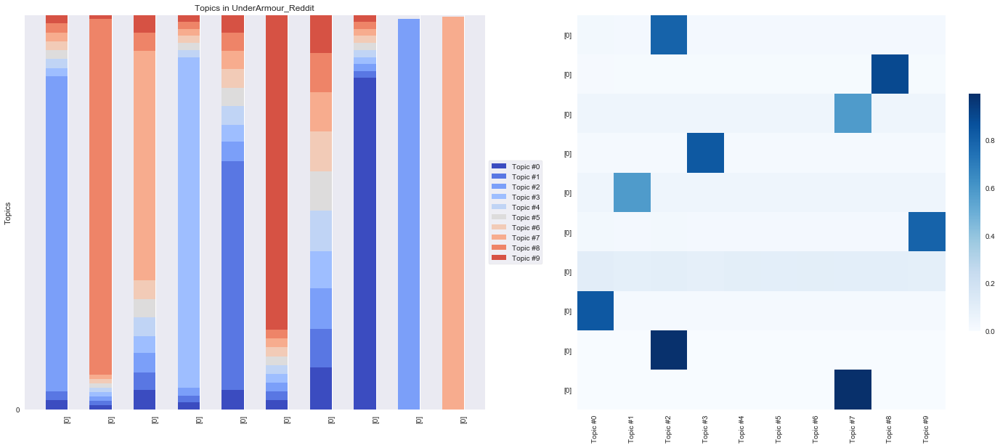

In [503]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(25, 10))

# Visualize as a stacked bar chart
N = 10
ind = np.arange(N)
K = RU_lda.num_topics  # N documents, K topics
ind = np.arange(N)  # the x-axis locations for the novels
width = 0.5  # the width of the bars
plots = []
height_cumulative = np.zeros(N)

for k in range(K):
    color = plt.cm.coolwarm(k/K, 1)
    if k == 0:
        p = ax1.bar(ind, RU_ldaDFVis[:, k], width, color=color)
    else:
        p = ax1.bar(ind, RU_ldaDFVis[:, k], width, bottom=height_cumulative, color=color)
    height_cumulative += RU_ldaDFVis[:, k]
    plots.append(p)
    
ax1.set_ylim((0, 1))  # proportions sum to 1, so the height of the stacked bars is 1
ax1.set_ylabel('Topics')

ax1.set_title('Topics in ' + RDT_UDAR)
ax1.set_xticks(ind+width/2)
ax1.set_xticklabels(RU_ldaDFVisNames, rotation='vertical')

ax1.set_yticks(np.arange(0, 1, 10))
topic_labels = ['Topic #{}'.format(k) for k in range(K)]
ax1.legend([p[0] for p in plots], topic_labels, loc='center left', frameon=True,  bbox_to_anchor = (1, .5))
ax1.figure.show()

ax2.pcolor(RU_ldaDFVis, norm=None, cmap='Blues')
ax2.set_yticks(np.arange(RU_ldaDFVis.shape[0])+0.5)
ax2.set_yticklabels(RU_ldaDFVisNames);
ax2.set_xticks(np.arange(RU_ldaDFVis.shape[1])+0.5)
ax2.set_xticklabels(topic_labels, rotation=90);
ax2.invert_yaxis()
fig.colorbar(ax2.pcolormesh(RU_ldaDFVis, norm=None, cmap='Blues'), ax=ax2, shrink=0.6)

plt.show()

#### Twitter Lululemon

In [99]:
TL_ldaDF = pd.DataFrame({'favorite_cnt' : twt_lulu['favorite_cnt'], 
                         'topics' : [TL_lda[TL_dict.doc2bow(l)] for l in twt_lulu['reduced_tokens']]})
topicsProbDict = {i : [0] * len(TL_ldaDF) for i in range(TL_lda.num_topics)}

for index, topicTuples in enumerate(TL_ldaDF['topics']):
    for topicNum, prob in topicTuples:
        topicsProbDict[topicNum][index] = prob

for topicNum in range(TL_lda.num_topics):
    TL_ldaDF['topic_{}'.format(topicNum)] = topicsProbDict[topicNum]

TL_ldaDF.head()

,favorite_cnt,topics,topic_0,topic_1,topic_2,topic_3,topic_4,topic_5,topic_6,topic_7,topic_8,topic_9
0,0,"[(2, 0.91643864), (3, 0.010152104)]",0.000000,0.000000,0.916439,0.010152,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0,"[(0, 0.042195544), (1, 0.046972662), (2, 0.043...",0.042196,0.046973,0.043499,0.049289,0.043164,0.043479,0.044157,0.047870,0.594728,0.044645
2,0,"[(0, 0.013172517), (1, 0.014664021), (2, 0.715...",0.013173,0.014664,0.715049,0.015387,0.171776,0.013573,0.013785,0.014944,0.013712,0.013937
3,0,"[(0, 0.042194527), (1, 0.04697153), (2, 0.0434...",0.042195,0.046972,0.043499,0.049288,0.593977,0.043478,0.044156,0.047869,0.043923,0.044644
4,0,"[(1, 0.0109113045), (2, 0.90576017), (3, 0.011...",0.000000,0.010911,0.905760,0.011449,0.010027,0.010100,0.010257,0.011120,0.010203,0.010371


In [100]:
TL_ldaDF.sort_values(by=['favorite_cnt'], ascending=False, inplace=True)
TL_ldaDFV = TL_ldaDF[:10][['topic_%d' %x for x in range(10)]]
TL_ldaDFVisN = TL_ldaDF[:10][['favorite_cnt']]
TL_ldaDFVis = TL_ldaDFV.values
TL_ldaDFVisNames = TL_ldaDFVisN.values

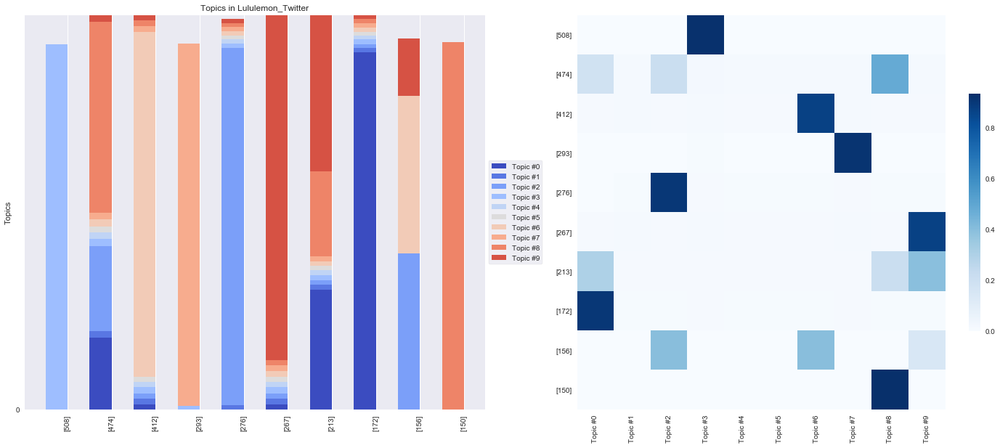

In [101]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(25, 10))

# Visualize as a stacked bar chart
N = 10
ind = np.arange(N)
K = TL_lda.num_topics  # N documents, K topics
ind = np.arange(N)  # the x-axis locations for the novels
width = 0.5  # the width of the bars
plots = []
height_cumulative = np.zeros(N)

for k in range(K):
    color = plt.cm.coolwarm(k/K, 1)
    if k == 0:
        p = ax1.bar(ind, TL_ldaDFVis[:, k], width, color=color)
    else:
        p = ax1.bar(ind, TL_ldaDFVis[:, k], width, bottom=height_cumulative, color=color)
    height_cumulative += TL_ldaDFVis[:, k]
    plots.append(p)
    
ax1.set_ylim((0, 1))  # proportions sum to 1, so the height of the stacked bars is 1
ax1.set_ylabel('Topics')

ax1.set_title('Topics in ' + TWT_LULU)
ax1.set_xticks(ind+width/2)
ax1.set_xticklabels(TL_ldaDFVisNames, rotation='vertical')

ax1.set_yticks(np.arange(0, 1, 10))
topic_labels = ['Topic #{}'.format(k) for k in range(K)]
ax1.legend([p[0] for p in plots], topic_labels, loc='center left', frameon=True,  bbox_to_anchor = (1, .5))
ax1.figure.show()

ax2.pcolor(TL_ldaDFVis, norm=None, cmap='Blues')
ax2.set_yticks(np.arange(TL_ldaDFVis.shape[0])+0.5)
ax2.set_yticklabels(TL_ldaDFVisNames);
ax2.set_xticks(np.arange(TL_ldaDFVis.shape[1])+0.5)
ax2.set_xticklabels(topic_labels, rotation=90);
ax2.invert_yaxis()
fig.colorbar(ax2.pcolormesh(TL_ldaDFVis, norm=None, cmap='Blues'), ax=ax2, shrink=0.6)

plt.show()

In [102]:
topicsDict = {}
for topicNum in range(TL_lda.num_topics):
    topicWords = [w for w, p in TL_lda.show_topic(topicNum)]
    topicsDict['Topic_{}'.format(topicNum)] = topicWords

wordRanksDF = pd.DataFrame(topicsDict)
wordRanksDF

,Topic_0,Topic_1,Topic_2,Topic_3,Topic_4,Topic_5,Topic_6,Topic_7,Topic_8,Topic_9
0,rt,white,check,white,rt,rt,rt,rt,rt,bag
1,bag,rt,closet,rt,legging,carry,gift,try,bag,rt
2,gift,work,poshmark,sinema,prod,spirit,birthday,bag,vote,wage
3,birthday,sinema,add,woman,new,level,yerimiese,look,carry,carry
4,strength,perfect,nice,kyrsten,bag,edward,strength,luxury,minimum,minimum
5,yerimiese,krysten,rt,gentrify,wear,journalism,redvelvet,woman,know,bring
6,minimum,vibes,big,hair,need,murrow,product,sell,think,way
7,curtsy,class,yoga,eclectic,want,insane,person,notion,sinema,sinema
8,cost,intersectionality,send,urban,wage,picture,afford,forward,bc,cake
9,wage,example,cool,multicolored,hear,humbl,sale,unattainable,woman,lady


In [504]:
TL_ldaDFV = TL_ldaDF[-10:][['topic_%d' %x for x in range(10)]]
TL_ldaDFVisN = TL_ldaDF[-10:][['favorite_cnt']]
TL_ldaDFVis = TL_ldaDFV.values
TL_ldaDFVisNames = TL_ldaDFVisN.values

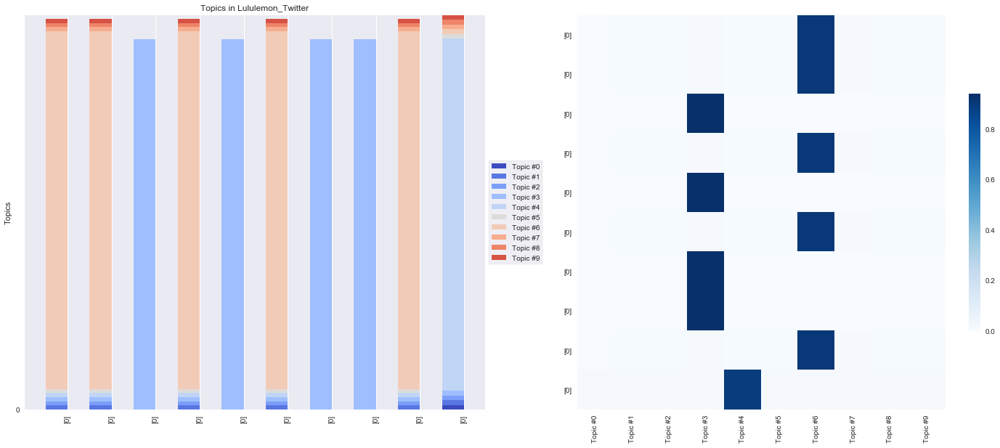

In [505]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(25, 10))

# Visualize as a stacked bar chart
N = 10
ind = np.arange(N)
K = TL_lda.num_topics  # N documents, K topics
ind = np.arange(N)  # the x-axis locations for the novels
width = 0.5  # the width of the bars
plots = []
height_cumulative = np.zeros(N)

for k in range(K):
    color = plt.cm.coolwarm(k/K, 1)
    if k == 0:
        p = ax1.bar(ind, TL_ldaDFVis[:, k], width, color=color)
    else:
        p = ax1.bar(ind, TL_ldaDFVis[:, k], width, bottom=height_cumulative, color=color)
    height_cumulative += TL_ldaDFVis[:, k]
    plots.append(p)
    
ax1.set_ylim((0, 1))  # proportions sum to 1, so the height of the stacked bars is 1
ax1.set_ylabel('Topics')

ax1.set_title('Topics in ' + TWT_LULU)
ax1.set_xticks(ind+width/2)
ax1.set_xticklabels(TL_ldaDFVisNames, rotation='vertical')

ax1.set_yticks(np.arange(0, 1, 10))
topic_labels = ['Topic #{}'.format(k) for k in range(K)]
ax1.legend([p[0] for p in plots], topic_labels, loc='center left', frameon=True,  bbox_to_anchor = (1, .5))
ax1.figure.show()

ax2.pcolor(TL_ldaDFVis, norm=None, cmap='Blues')
ax2.set_yticks(np.arange(TL_ldaDFVis.shape[0])+0.5)
ax2.set_yticklabels(TL_ldaDFVisNames);
ax2.set_xticks(np.arange(TL_ldaDFVis.shape[1])+0.5)
ax2.set_xticklabels(topic_labels, rotation=90);
ax2.invert_yaxis()
fig.colorbar(ax2.pcolormesh(TL_ldaDFVis, norm=None, cmap='Blues'), ax=ax2, shrink=0.6)

plt.show()

#### Twitter UnderArmour

In [103]:
TU_ldaDF = pd.DataFrame({'favorite_cnt' : twt_udar['favorite_cnt'], 
                         'topics' : [TU_lda[TU_dict.doc2bow(l)] for l in twt_udar['reduced_tokens']]})
topicsProbDict = {i : [0] * len(TU_ldaDF) for i in range(TU_lda.num_topics)}

for index, topicTuples in enumerate(TU_ldaDF['topics']):
    for topicNum, prob in topicTuples:
        topicsProbDict[topicNum][index] = prob

for topicNum in range(TU_lda.num_topics):
    TU_ldaDF['topic_{}'.format(topicNum)] = topicsProbDict[topicNum]

TU_ldaDF.head()

,favorite_cnt,topics,topic_0,topic_1,topic_2,topic_3,topic_4,topic_5,topic_6,topic_7,topic_8,topic_9
0,0,"[(0, 0.01672999), (1, 0.0191411), (2, 0.205926...",0.016730,0.019141,0.205926,0.017217,0.015924,0.016766,0.017760,0.235069,0.438487,0.016980
1,0,"[(0, 0.013869515), (1, 0.015868124), (2, 0.013...",0.013870,0.015868,0.013332,0.014274,0.013201,0.013899,0.014723,0.014074,0.872682,0.014077
2,0,"[(0, 0.04386102), (1, 0.050185427), (2, 0.0421...",0.043861,0.050185,0.042160,0.045139,0.041748,0.043954,0.587117,0.044509,0.056811,0.044515
3,0,"[(0, 0.010335818), (1, 0.01182521), (3, 0.0106...",0.010336,0.011825,0.000000,0.010637,0.000000,0.010358,0.010972,0.010488,0.905121,0.010490
4,0,"[(0, 0.5844321), (1, 0.05018061), (2, 0.042159...",0.584432,0.050181,0.042160,0.045137,0.041747,0.043953,0.046560,0.044507,0.056809,0.044514


In [104]:
TU_ldaDF.sort_values(by=['favorite_cnt'], ascending=False, inplace=True)
TU_ldaDFV = TU_ldaDF[:10][['topic_%d' %x for x in range(10)]]
TU_ldaDFVisN = TU_ldaDF[:10][['favorite_cnt']]
TU_ldaDFVis = TU_ldaDFV.values
TU_ldaDFVisNames = TU_ldaDFVisN.values

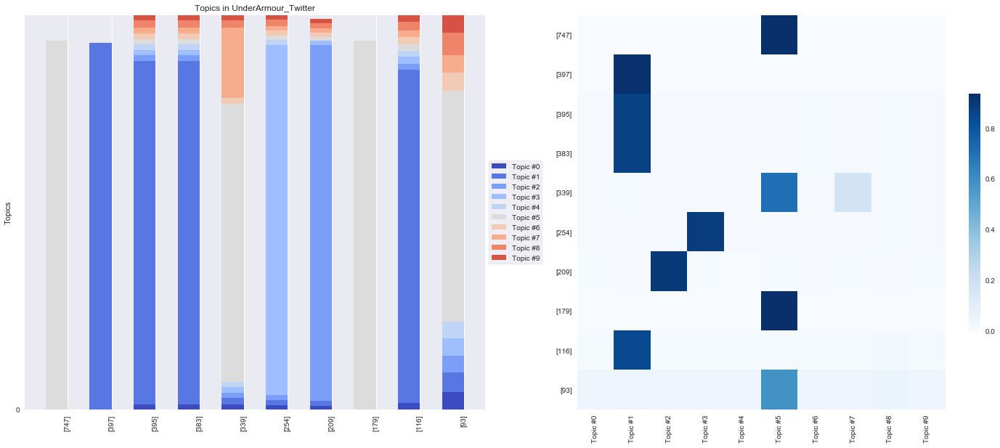

In [105]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(25, 10))

# Visualize as a stacked bar chart
N = 10
ind = np.arange(N)
K = TU_lda.num_topics  # N documents, K topics
ind = np.arange(N)  # the x-axis locations for the novels
width = 0.5  # the width of the bars
plots = []
height_cumulative = np.zeros(N)

for k in range(K):
    color = plt.cm.coolwarm(k/K, 1)
    if k == 0:
        p = ax1.bar(ind, TU_ldaDFVis[:, k], width, color=color)
    else:
        p = ax1.bar(ind, TU_ldaDFVis[:, k], width, bottom=height_cumulative, color=color)
    height_cumulative += TU_ldaDFVis[:, k]
    plots.append(p)
    
ax1.set_ylim((0, 1))  # proportions sum to 1, so the height of the stacked bars is 1
ax1.set_ylabel('Topics')

ax1.set_title('Topics in ' + TWT_UDAR)
ax1.set_xticks(ind+width/2)
ax1.set_xticklabels(TU_ldaDFVisNames, rotation='vertical')

ax1.set_yticks(np.arange(0, 1, 10))
topic_labels = ['Topic #{}'.format(k) for k in range(K)]
ax1.legend([p[0] for p in plots], topic_labels, loc='center left', frameon=True,  bbox_to_anchor = (1, .5))
ax1.figure.show()

ax2.pcolor(TU_ldaDFVis, norm=None, cmap='Blues')
ax2.set_yticks(np.arange(TU_ldaDFVis.shape[0])+0.5)
ax2.set_yticklabels(TU_ldaDFVisNames);
ax2.set_xticks(np.arange(TU_ldaDFVis.shape[1])+0.5)
ax2.set_xticklabels(topic_labels, rotation=90);
ax2.invert_yaxis()
fig.colorbar(ax2.pcolormesh(TU_ldaDFVis, norm=None, cmap='Blues'), ax=ax2, shrink=0.6)

plt.show()

In [106]:
topicsDict = {}
for topicNum in range(TU_lda.num_topics):
    topicWords = [w for w, p in TU_lda.show_topic(topicNum)]
    topicsDict['Topic_{}'.format(topicNum)] = topicWords

wordRanksDF = pd.DataFrame(topicsDict)
wordRanksDF

,Topic_0,Topic_1,Topic_2,Topic_3,Topic_4,Topic_5,Topic_6,Topic_7,Topic_8,Topic_9
0,yes,congrats,mask,armour,rt,rt,follow,rt,love,check
1,rt,rt,sport,rt,fo,curry,rt,team,check,rt
2,know,amp,breathable,luck,coach,new,train,wear,share,armour
3,like,thank,rt,code,oh,retail,time,run,poshmark,golf
4,run,work,check,use,ready,shoe,like,game,fashion,new
5,team,football,armour,available,year,ad,fan,let,style,cap
6,ua,happy,buy,volleyball,today,lady,nfl,sweet,shopmycloset,love
7,make,season,pair,ad,fashion,need,nba,shoutout,rt,share
8,happen,big,fantastic,rock,love,available,tweet,jacket,new,poshmark
9,shoe,day,gym,high,series,use,new,tonight,hoodie,fashion


In [506]:
TU_ldaDFV = TU_ldaDF[-10:][['topic_%d' %x for x in range(10)]]
TU_ldaDFVisN = TU_ldaDF[-10:][['favorite_cnt']]
TU_ldaDFVis = TU_ldaDFV.values
TU_ldaDFVisNames = TU_ldaDFVisN.values

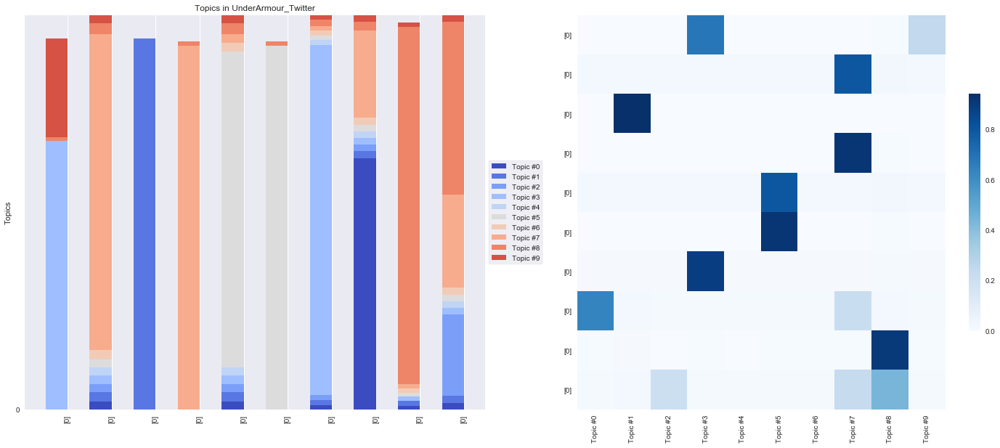

In [507]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(25, 10))

# Visualize as a stacked bar chart
N = 10
ind = np.arange(N)
K = TU_lda.num_topics  # N documents, K topics
ind = np.arange(N)  # the x-axis locations for the novels
width = 0.5  # the width of the bars
plots = []
height_cumulative = np.zeros(N)

for k in range(K):
    color = plt.cm.coolwarm(k/K, 1)
    if k == 0:
        p = ax1.bar(ind, TU_ldaDFVis[:, k], width, color=color)
    else:
        p = ax1.bar(ind, TU_ldaDFVis[:, k], width, bottom=height_cumulative, color=color)
    height_cumulative += TU_ldaDFVis[:, k]
    plots.append(p)
    
ax1.set_ylim((0, 1))  # proportions sum to 1, so the height of the stacked bars is 1
ax1.set_ylabel('Topics')

ax1.set_title('Topics in ' + TWT_UDAR)
ax1.set_xticks(ind+width/2)
ax1.set_xticklabels(TU_ldaDFVisNames, rotation='vertical')

ax1.set_yticks(np.arange(0, 1, 10))
topic_labels = ['Topic #{}'.format(k) for k in range(K)]
ax1.legend([p[0] for p in plots], topic_labels, loc='center left', frameon=True,  bbox_to_anchor = (1, .5))
ax1.figure.show()

ax2.pcolor(TU_ldaDFVis, norm=None, cmap='Blues')
ax2.set_yticks(np.arange(TU_ldaDFVis.shape[0])+0.5)
ax2.set_yticklabels(TU_ldaDFVisNames);
ax2.set_xticks(np.arange(TU_ldaDFVis.shape[1])+0.5)
ax2.set_xticklabels(topic_labels, rotation=90);
ax2.invert_yaxis()
fig.colorbar(ax2.pcolormesh(TU_ldaDFVis, norm=None, cmap='Blues'), ax=ax2, shrink=0.6)

plt.show()

#### Instagram Lululemon

In [107]:
IL_ldaDF = pd.DataFrame({'likes' : ins_lulu['likes'], 
                         'topics' : [IL_lda[IL_dict.doc2bow(l)] for l in ins_lulu['reduced_tokens']]})
topicsProbDict = {i : [0] * len(IL_ldaDF) for i in range(IL_lda.num_topics)}

for index, topicTuples in enumerate(IL_ldaDF['topics']):
    for topicNum, prob in topicTuples:
        topicsProbDict[topicNum][index] = prob

for topicNum in range(IL_lda.num_topics):
    IL_ldaDF['topic_{}'.format(topicNum)] = topicsProbDict[topicNum]

IL_ldaDF.head()

,likes,topics,topic_0,topic_1,topic_2,topic_3,topic_4,topic_5,topic_6,topic_7,topic_8,topic_9
0,1221,"[(7, 0.96949196)]",0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.969492,0.000000,0.00000
1,1450,"[(0, 0.01067633), (2, 0.0105171185), (4, 0.160...",0.010676,0.000000,0.010517,0.0,0.160655,0.546896,0.010356,0.012133,0.219587,0.01052
2,122,"[(7, 0.9355791)]",0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.935579,0.000000,0.00000
3,29781,"[(0, 0.69518965), (1, 0.23282549), (7, 0.01075...",0.695190,0.232825,0.000000,0.0,0.000000,0.000000,0.000000,0.010750,0.000000,0.00000
4,186,"[(4, 0.67478925), (8, 0.29726836)]",0.000000,0.000000,0.000000,0.0,0.674789,0.000000,0.000000,0.000000,0.297268,0.00000


In [108]:
IL_ldaDF.sort_values(by=['likes'], ascending=False, inplace=True)
IL_ldaDFV = IL_ldaDF[:10][['topic_%d' %x for x in range(10)]]
IL_ldaDFVisN = IL_ldaDF[:10][['likes']]
IL_ldaDFVis = IL_ldaDFV.values
IL_ldaDFVisNames = IL_ldaDFVisN.values

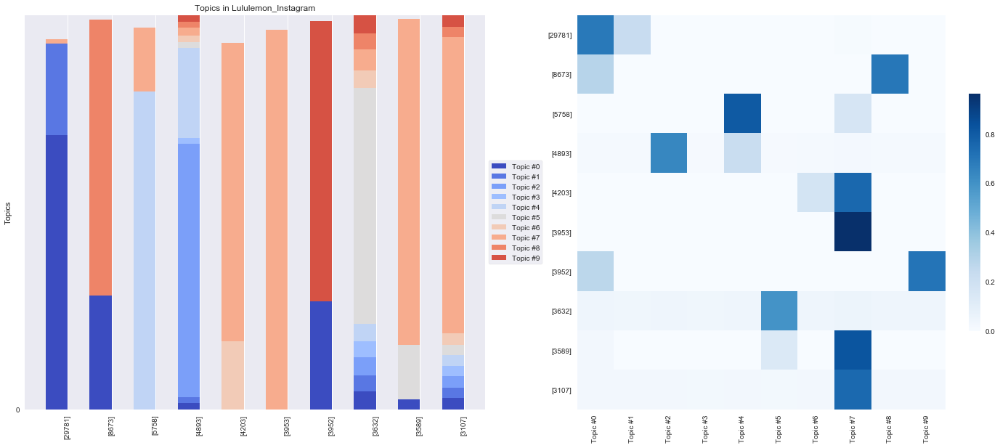

In [109]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(25, 10))

# Visualize as a stacked bar chart
N = 10
ind = np.arange(N)
K = IL_lda.num_topics  # N documents, K topics
ind = np.arange(N)  # the x-axis locations for the novels
width = 0.5  # the width of the bars
plots = []
height_cumulative = np.zeros(N)

for k in range(K):
    color = plt.cm.coolwarm(k/K, 1)
    if k == 0:
        p = ax1.bar(ind, IL_ldaDFVis[:, k], width, color=color)
    else:
        p = ax1.bar(ind, IL_ldaDFVis[:, k], width, bottom=height_cumulative, color=color)
    height_cumulative += IL_ldaDFVis[:, k]
    plots.append(p)
    
ax1.set_ylim((0, 1))  # proportions sum to 1, so the height of the stacked bars is 1
ax1.set_ylabel('Topics')

ax1.set_title('Topics in ' + INS_LULU)
ax1.set_xticks(ind+width/2)
ax1.set_xticklabels(IL_ldaDFVisNames, rotation='vertical')

ax1.set_yticks(np.arange(0, 1, 10))
topic_labels = ['Topic #{}'.format(k) for k in range(K)]
ax1.legend([p[0] for p in plots], topic_labels, loc='center left', frameon=True,  bbox_to_anchor = (1, .5))
ax1.figure.show()

ax2.pcolor(IL_ldaDFVis, norm=None, cmap='Blues')
ax2.set_yticks(np.arange(IL_ldaDFVis.shape[0])+0.5)
ax2.set_yticklabels(IL_ldaDFVisNames);
ax2.set_xticks(np.arange(IL_ldaDFVis.shape[1])+0.5)
ax2.set_xticklabels(topic_labels, rotation=90);
ax2.invert_yaxis()
fig.colorbar(ax2.pcolormesh(IL_ldaDFVis, norm=None, cmap='Blues'), ax=ax2, shrink=0.6)

plt.show()

In [110]:
topicsDict = {}
for topicNum in range(IL_lda.num_topics):
    topicWords = [w for w, p in IL_lda.show_topic(topicNum)]
    topicsDict['Topic_{}'.format(topicNum)] = topicWords

wordRanksDF = pd.DataFrame(topicsDict)
wordRanksDF

,Topic_0,Topic_1,Topic_2,Topic_3,Topic_4,Topic_5,Topic_6,Topic_7,Topic_8,Topic_9
0,workout,week,run,yoga,fitness,look,workout,day,workout,ship
1,today,new,lululemonforsale,posture,yoga,love,fitness,woman,garagegym,woman
2,day,ship,mile,요가,sunday,like,fit,fitness,legging,press
3,squat,today,ship,recovery,post,new,fitnessmotivation,feel,love,day
4,happy,feel,thrift,yogapractice,workout,work,yyc,time,available,lulu
5,week,green,bid,fitness,class,buy,local,happy,fitness,price
6,work,like,luluforsale,룰루레몬,legging,thing,price,workout,stretch,tank
7,rep,usa,lululemonleggings,pilates,sundayfunday,thank,set,work,pilates,available
8,set,summer,nike,운동하는여자,giveaway,know,day,love,lulu,new
9,body,brandymelville,lulu,post,like,self,workoutmotivation,body,gym,thrifting


In [508]:
IL_ldaDFV = IL_ldaDF[-10:][['topic_%d' %x for x in range(10)]]
IL_ldaDFVisN = IL_ldaDF[-10:][['likes']]
IL_ldaDFVis = IL_ldaDFV.values
IL_ldaDFVisNames = IL_ldaDFVisN.values

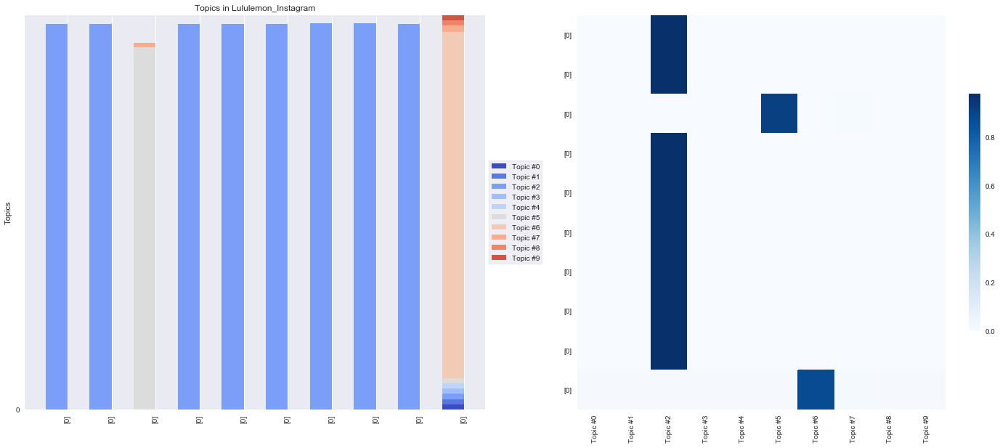

In [509]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(25, 10))

# Visualize as a stacked bar chart
N = 10
ind = np.arange(N)
K = IL_lda.num_topics  # N documents, K topics
ind = np.arange(N)  # the x-axis locations for the novels
width = 0.5  # the width of the bars
plots = []
height_cumulative = np.zeros(N)

for k in range(K):
    color = plt.cm.coolwarm(k/K, 1)
    if k == 0:
        p = ax1.bar(ind, IL_ldaDFVis[:, k], width, color=color)
    else:
        p = ax1.bar(ind, IL_ldaDFVis[:, k], width, bottom=height_cumulative, color=color)
    height_cumulative += IL_ldaDFVis[:, k]
    plots.append(p)
    
ax1.set_ylim((0, 1))  # proportions sum to 1, so the height of the stacked bars is 1
ax1.set_ylabel('Topics')

ax1.set_title('Topics in ' + INS_LULU)
ax1.set_xticks(ind+width/2)
ax1.set_xticklabels(IL_ldaDFVisNames, rotation='vertical')

ax1.set_yticks(np.arange(0, 1, 10))
topic_labels = ['Topic #{}'.format(k) for k in range(K)]
ax1.legend([p[0] for p in plots], topic_labels, loc='center left', frameon=True,  bbox_to_anchor = (1, .5))
ax1.figure.show()

ax2.pcolor(IL_ldaDFVis, norm=None, cmap='Blues')
ax2.set_yticks(np.arange(IL_ldaDFVis.shape[0])+0.5)
ax2.set_yticklabels(IL_ldaDFVisNames);
ax2.set_xticks(np.arange(IL_ldaDFVis.shape[1])+0.5)
ax2.set_xticklabels(topic_labels, rotation=90);
ax2.invert_yaxis()
fig.colorbar(ax2.pcolormesh(IL_ldaDFVis, norm=None, cmap='Blues'), ax=ax2, shrink=0.6)

plt.show()

#### Instagram UnderArmour

In [111]:
IU_ldaDF = pd.DataFrame({'likes' : ins_udar['likes'], 
                         'topics' : [IU_lda[IU_dict.doc2bow(l)] for l in ins_udar['reduced_tokens']]})
topicsProbDict = {i : [0] * len(IU_ldaDF) for i in range(IU_lda.num_topics)}

for index, topicTuples in enumerate(IU_ldaDF['topics']):
    for topicNum, prob in topicTuples:
        topicsProbDict[topicNum][index] = prob

for topicNum in range(IU_lda.num_topics):
    IU_ldaDF['topic_{}'.format(topicNum)] = topicsProbDict[topicNum]

IU_ldaDF.head()

,likes,topics,topic_0,topic_1,topic_2,topic_3,topic_4,topic_5,topic_6,topic_7,topic_8,topic_9
0,1357,"[(0, 0.01963856), (1, 0.6119287), (2, 0.020960...",0.019639,0.611929,0.020960,0.020437,0.214823,0.019926,0.021415,0.023465,0.022241,0.025165
1,5637,"[(0, 0.02658652), (1, 0.028497545), (2, 0.0283...",0.026587,0.028498,0.028376,0.027667,0.029096,0.734838,0.028992,0.031767,0.030111,0.034068
2,5988,"[(0, 0.57993317), (1, 0.35189223)]",0.579933,0.351892,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,191,"[(0, 0.5499309), (1, 0.010289535), (2, 0.01024...",0.549931,0.010290,0.010246,0.000000,0.364691,0.000000,0.010468,0.011471,0.010872,0.012303
4,184,"[(1, 0.2448264), (2, 0.19320284), (9, 0.509452...",0.000000,0.244826,0.193203,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.509453


In [112]:
IU_ldaDF.sort_values(by=['likes'], ascending=False, inplace=True)
IU_ldaDFV = IU_ldaDF[:10][['topic_%d' %x for x in range(10)]]
IU_ldaDFVisN = IU_ldaDF[:10][['likes']]
IU_ldaDFVis = IU_ldaDFV.values
IU_ldaDFVisNames = IU_ldaDFVisN.values

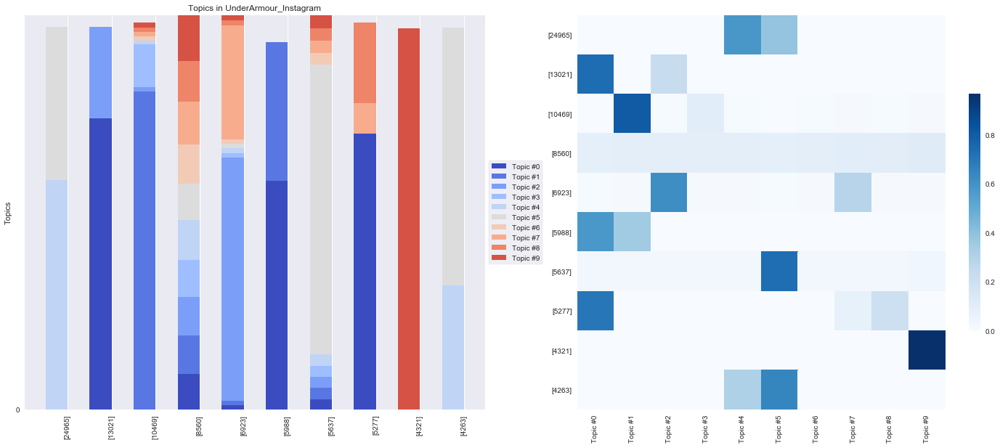

In [113]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(25, 10))

# Visualize as a stacked bar chart
N = 10
ind = np.arange(N)
K = IU_lda.num_topics  # N documents, K topics
ind = np.arange(N)  # the x-axis locations for the novels
width = 0.5  # the width of the bars
plots = []
height_cumulative = np.zeros(N)

for k in range(K):
    color = plt.cm.coolwarm(k/K, 1)
    if k == 0:
        p = ax1.bar(ind, IU_ldaDFVis[:, k], width, color=color)
    else:
        p = ax1.bar(ind, IU_ldaDFVis[:, k], width, bottom=height_cumulative, color=color)
    height_cumulative += IU_ldaDFVis[:, k]
    plots.append(p)
    
ax1.set_ylim((0, 1))  # proportions sum to 1, so the height of the stacked bars is 1
ax1.set_ylabel('Topics')

ax1.set_title('Topics in ' + INS_UDAR)
ax1.set_xticks(ind+width/2)
ax1.set_xticklabels(IU_ldaDFVisNames, rotation='vertical')

ax1.set_yticks(np.arange(0, 1, 10))
topic_labels = ['Topic #{}'.format(k) for k in range(K)]
ax1.legend([p[0] for p in plots], topic_labels, loc='center left', frameon=True,  bbox_to_anchor = (1, .5))
ax1.figure.show()

ax2.pcolor(IU_ldaDFVis, norm=None, cmap='Blues')
ax2.set_yticks(np.arange(IU_ldaDFVis.shape[0])+0.5)
ax2.set_yticklabels(IU_ldaDFVisNames);
ax2.set_xticks(np.arange(IU_ldaDFVis.shape[1])+0.5)
ax2.set_xticklabels(topic_labels, rotation=90);
ax2.invert_yaxis()
fig.colorbar(ax2.pcolormesh(IU_ldaDFVis, norm=None, cmap='Blues'), ax=ax2, shrink=0.6)

plt.show()

In [114]:
topicsDict = {}
for topicNum in range(IU_lda.num_topics):
    topicWords = [w for w, p in IU_lda.show_topic(topicNum)]
    topicsDict['Topic_{}'.format(topicNum)] = topicWords

wordRanksDF = pd.DataFrame(topicsDict)
wordRanksDF

,Topic_0,Topic_1,Topic_2,Topic_3,Topic_4,Topic_5,Topic_6,Topic_7,Topic_8,Topic_9
0,gym,woman,nacional,colores,cm,curry,nike,todo,compras,nike
1,fitness,day,nike,lunes,emprendedores,sepatubasketmurah,adidas,en,nike,fitness
2,train,workout,sobre,sport,se,nike,todo,calidad,ropaamericana,adidas
3,bodybuilding,fitness,mile,nike,nike,sport,el,zapatos,actualización,run
4,follow,squat,adidas,adidas,explore,ua,puma,gym,adidas,workout
5,motivation,cardio,que,sobre,armour,new,colombia,polerones,deportivo,fitnessmotivation
6,nike,gym,special,fitness,xl,os,santiago,diseños,nueva,recicla
7,workout,way,fitness,original,run,flow,medellin,whatsapp,sobre,ropareciclada
8,therock,thank,run,en,por,sepatubasket,instachile,moda,por,gym
9,projectrock,press,pedido,disponible,xxl,line,sus,deportivos,las,train


In [510]:
IU_ldaDFV = IU_ldaDF[-10:][['topic_%d' %x for x in range(10)]]
IU_ldaDFVisN = IU_ldaDF[-10:][['likes']]
IU_ldaDFVis = IU_ldaDFV.values
IU_ldaDFVisNames = IU_ldaDFVisN.values

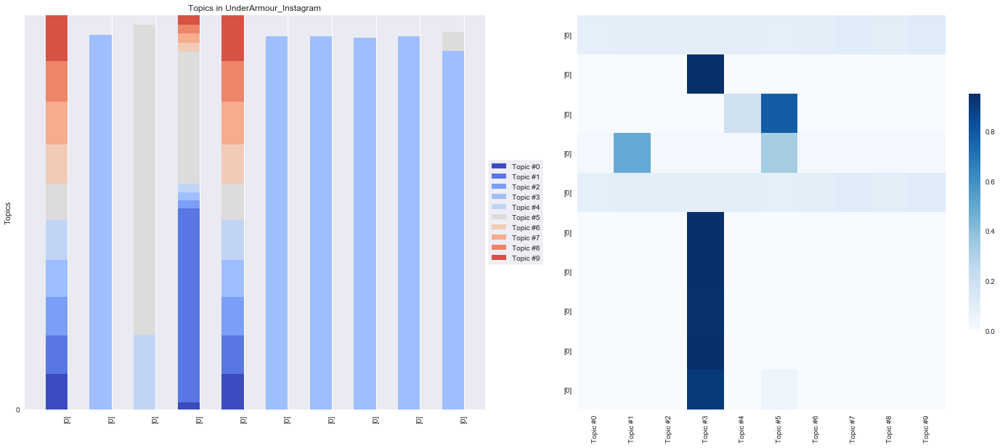

In [511]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(25, 10))

# Visualize as a stacked bar chart
N = 10
ind = np.arange(N)
K = IU_lda.num_topics  # N documents, K topics
ind = np.arange(N)  # the x-axis locations for the novels
width = 0.5  # the width of the bars
plots = []
height_cumulative = np.zeros(N)

for k in range(K):
    color = plt.cm.coolwarm(k/K, 1)
    if k == 0:
        p = ax1.bar(ind, IU_ldaDFVis[:, k], width, color=color)
    else:
        p = ax1.bar(ind, IU_ldaDFVis[:, k], width, bottom=height_cumulative, color=color)
    height_cumulative += IU_ldaDFVis[:, k]
    plots.append(p)
    
ax1.set_ylim((0, 1))  # proportions sum to 1, so the height of the stacked bars is 1
ax1.set_ylabel('Topics')

ax1.set_title('Topics in ' + INS_UDAR)
ax1.set_xticks(ind+width/2)
ax1.set_xticklabels(IU_ldaDFVisNames, rotation='vertical')

ax1.set_yticks(np.arange(0, 1, 10))
topic_labels = ['Topic #{}'.format(k) for k in range(K)]
ax1.legend([p[0] for p in plots], topic_labels, loc='center left', frameon=True,  bbox_to_anchor = (1, .5))
ax1.figure.show()

ax2.pcolor(IU_ldaDFVis, norm=None, cmap='Blues')
ax2.set_yticks(np.arange(IU_ldaDFVis.shape[0])+0.5)
ax2.set_yticklabels(IU_ldaDFVisNames);
ax2.set_xticks(np.arange(IU_ldaDFVis.shape[1])+0.5)
ax2.set_xticklabels(topic_labels, rotation=90);
ax2.invert_yaxis()
fig.colorbar(ax2.pcolormesh(IU_ldaDFVis, norm=None, cmap='Blues'), ax=ax2, shrink=0.6)

plt.show()

### NLTK Topic Modeling

In [115]:
def get_wordnet_pos(word):
    tag = nltk.pos_tag([word])[0][1][0].upper()
    tag_dict = {"J": nltk.corpus.wordnet.ADJ,
                "N": nltk.corpus.wordnet.NOUN,
                "V": nltk.corpus.wordnet.VERB,
                "R": nltk.corpus.wordnet.ADV}

    return tag_dict.get(tag, nltk.corpus.wordnet.NOUN)

def get_lemmas(text):
    stop = nltk.corpus.stopwords.words('english') + list(string.punctuation)
    tokens = [i for i in nltk.word_tokenize(text.lower()) if i not in stop]
    lemmas = [nltk.stem.WordNetLemmatizer().lemmatize(t, get_wordnet_pos(t)) for t in tokens]
    return lemmas

def make_bigrams(lemmas, min_count=5):
    bigram = models.Phrases(lemmas, min_count)
    bigram_mod = models.phrases.Phraser(bigram)
    return [bigram_mod[doc] for doc in lemmas]

def make_bag_words(lemmas):
    dictionary = corpora.Dictionary([i for i in lemmas])
    bow_corpus = [dictionary.doc2bow(text) for text in lemmas]
    return dictionary, bow_corpus

In [116]:
def nltkTopicModeling(df_list, title_list, num_topics=3, num_words=20):
    for i in range(len(df_list)):
        print("Topic Modeling for " + title_list[i])
        text = df_list[i].text.apply(get_lemmas)
        dic, bow = make_bag_words(make_bigrams(text))
        model = models.ldamodel.LdaModel(bow, num_topics=num_topics, id2word=dic, passes=20, iterations=400)
        print(model.print_topics(num_words=num_words))
        print("\n")

In [117]:
nltkTopicModeling(df_lst, title_lst)

Topic Modeling for Lululemon_Reddit
[(0, '0.030*"’" + 0.012*"http" + 0.011*"4" + 0.009*"6" + 0.009*"love" + 0.008*"wmtm" + 0.008*"lulu" + 0.008*"new" + 0.007*"tank" + 0.007*"get" + 0.007*"”" + 0.007*"..." + 0.006*"align" + 0.006*"8" + 0.006*"today" + 0.006*"day" + 0.005*"size" + 0.005*"wear" + 0.005*"2" + 0.005*"short"'), (1, '0.031*"’" + 0.008*"legging" + 0.007*"get" + 0.007*"lululemon" + 0.007*"look" + 0.007*"size" + 0.006*"n\'t" + 0.006*"one" + 0.006*"would" + 0.006*"try" + 0.006*"like" + 0.006*"go" + 0.005*"love" + 0.005*"new" + 0.005*"store" + 0.005*"bra" + 0.005*"fit" + 0.005*"want" + 0.005*"\'s" + 0.004*"also"'), (2, '0.022*"’" + 0.011*"black" + 0.009*"size" + 0.009*"zip" + 0.009*"get" + 0.007*"lulu" + 0.007*"full_zip" + 0.007*"lavender_dew" + 0.006*"aligns" + 0.006*"1/2_zip" + 0.006*"align" + 0.006*"today" + 0.006*"scuba_1/2" + 0.006*"color" + 0.005*"love" + 0.005*"4" + 0.005*"wear" + 0.005*"water_drop" + 0.005*"fit" + 0.005*"short"')]


Topic Modeling for UnderArmour_Reddit
[(

## Classification (W4)

In [118]:
labels = ["not_popular", "most_popular"]
num_labels = 2
rdt_lulu['popularity'] = pd.to_numeric(rdt_lulu['upvotes'])
rdt_lulu['category'] = pd.qcut(rdt_lulu['popularity'], num_labels, labels=labels)
rdt_udar['popularity'] = pd.to_numeric(rdt_udar['upvotes'])
rdt_udar['category'] = pd.qcut(rdt_udar['popularity'], num_labels, labels=labels)

twt_lulu['popularity'] = pd.to_numeric(twt_lulu['favorite_cnt']) + pd.to_numeric(twt_lulu['retweet_cnt'])
twt_lulu['category'] = pd.qcut(twt_lulu['popularity'], num_labels, labels=labels)
twt_udar['popularity'] = pd.to_numeric(twt_udar['favorite_cnt']) + pd.to_numeric(twt_udar['retweet_cnt'])
twt_udar['category'] = pd.qcut(twt_udar['popularity'].rank(method="first"), num_labels, labels=labels)

ins_lulu['popularity'] = pd.to_numeric(ins_lulu['likes'])
ins_lulu['category'] = pd.qcut(ins_lulu['popularity'], 2, labels=labels, duplicates="drop")
ins_udar['popularity'] = pd.to_numeric(ins_udar['likes'])
ins_udar['category'] = pd.qcut(ins_udar['popularity'], 2, labels=labels, duplicates="drop")

## 1. Reddit Lululemon

In [119]:
# Turn the training dataset into a tf-idf matrix
TFVectorizer = sklearn.feature_extraction.text.TfidfVectorizer(max_df=100, min_df=2, stop_words='english', norm='l2')
TFVects = TFVectorizer.fit_transform(rdt_lulu['text'])
rdt_lulu['vect'] = [np.array(v).flatten() for v in TFVects.todense()]

In [120]:
# split the dataset into training data and testing data
holdBackFraction = .2
RL_dfTrain, RL_dfTest = lucem_illud.trainTestSplit(rdt_lulu, holdBackFraction=holdBackFraction)

### 1a. Logistic Classification

In [121]:
# Implement PCA
pca = sklearn.decomposition.PCA()
reduced_data = pca.fit_transform(np.stack(RL_dfTrain['vect'], axis=0))
RL_dfTrain['pca'] = [r for r in reduced_data]

In [122]:
# Logistic classfication without dimension reduction
logistic_full = sklearn.linear_model.LogisticRegression()
logistic_full.fit(np.stack(RL_dfTrain['vect'], axis=0), RL_dfTrain['category'])
# Training data
print(logistic_full.score(np.stack(RL_dfTrain['vect'], axis=0), RL_dfTrain['category']))
# Testing data
print(logistic_full.score(np.stack(RL_dfTest['vect'], axis=0), RL_dfTest['category']))

0.9135416666666667
0.7625


In [123]:
lucem_illud.evaluateClassifier(logistic_full, RL_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.763811,0.718980,0.2375,0.802752,0.711382
most_popular,0.763811,0.684628,0.2375,0.729008,0.816239


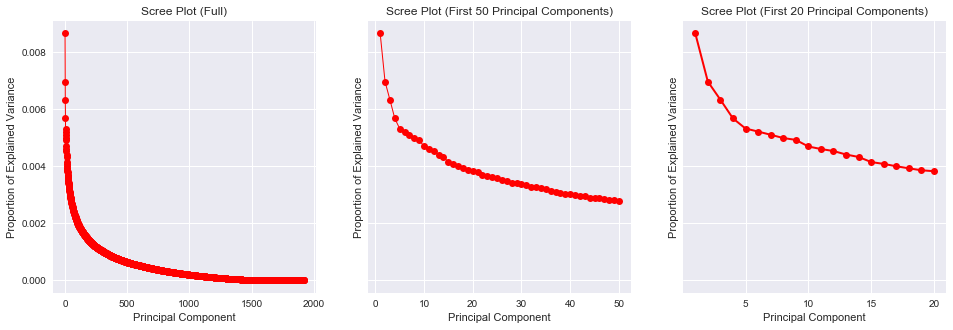

In [124]:
# Optimal number of principle components
n = len(RL_dfTrain)
# Initialize
fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize = (16, 5), sharey=True)
# 1
eigen_vals = np.arange(n) + 1
ax1.plot(eigen_vals, pca.explained_variance_ratio_, 'ro-', linewidth=1)
ax1.set_title('Scree Plot (Full)')
ax1.set_xlabel('Principal Component')
ax1.set_ylabel('Proportion of Explained Variance')
# 2
eigen_vals = np.arange(50) + 1
ax2.plot(eigen_vals, pca.explained_variance_ratio_[:50], 'ro-', linewidth=1)
ax2.set_title('Scree Plot (First 50 Principal Components)')
ax2.set_xlabel('Principal Component')
ax2.set_ylabel('Proportion of Explained Variance')
# 3
eigen_vals = np.arange(20) + 1
ax3.plot(eigen_vals, pca.explained_variance_ratio_[:20], 'ro-', linewidth=2)
ax3.set_title('Scree Plot (First 20 Principal Components)')
ax3.set_xlabel('Principal Component')
ax3.set_ylabel('Proportion of Explained Variance')
# Plot
plt.show()

According to the elbow point, I'll choose the first 10 principal components as my covariates.

In [125]:
RL_dfTrain['pca_reduced_10'] = RL_dfTrain['pca'].apply(lambda x: x[:10])

In [126]:
# Fit a logistic regression
logistic = sklearn.linear_model.LogisticRegression()
logistic.fit(np.stack(RL_dfTrain['pca_reduced_10'], axis=0), RL_dfTrain['category'])
# Performance on the training dataset
logistic.score(np.stack(RL_dfTrain['pca_reduced_10'], axis=0), RL_dfTrain['category'])

0.6364583333333333

In [127]:
# Apply the model on testing dataset

#Create vectors
TFVects_test = TFVectorizer.transform(RL_dfTest['text'])
RL_dfTest['vect'] = [np.array(v).flatten() for v in TFVects_test.todense()]

#PCA
reduced_data_test = pca.transform(np.stack(RL_dfTest['vect'], axis=0))
RL_dfTest['pca'] = [r for r in reduced_data_test]
RL_dfTest['pca_reduced_10'] = RL_dfTest['pca'].apply(lambda x: x[:10])

#Test
logistic.score(np.stack(RL_dfTest['pca_reduced_10'], axis=0), RL_dfTest['category'])

0.58125

In [128]:
# With panelty
logistic_l2= sklearn.linear_model.LogisticRegression(penalty='l2')
logistic_l2.fit(np.stack(RL_dfTrain['vect'], axis=0), RL_dfTrain['category'])

# Training data
print('Training: ', logistic_l2.score(np.stack(RL_dfTrain['vect'], axis=0), RL_dfTrain['category']))

# Testing data
print('Testing: ', logistic_l2.score(np.stack(RL_dfTest['vect'], axis=0), RL_dfTest['category']))

Training:  0.9135416666666667
Testing:  0.7625


In [129]:
lucem_illud.evaluateClassifier(logistic_l2, RL_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.763811,0.718980,0.2375,0.802752,0.711382
most_popular,0.763811,0.684628,0.2375,0.729008,0.816239


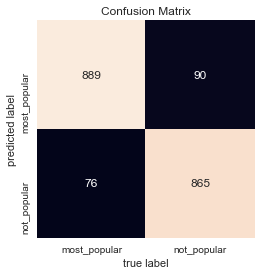

In [130]:
# Confusion Matrix for Training Data
RL_dfTest['logistic_penalty_predict'] = logistic_l2.predict(np.stack(RL_dfTest['vect'], axis=0))
lucem_illud.plotConfusionMatrix(logistic_l2, RL_dfTrain)

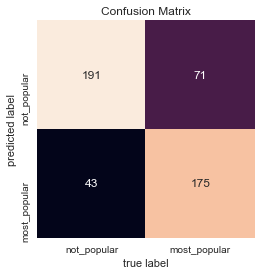

In [131]:
# Confusion Matrix for Testing Data
lucem_illud.plotConfusionMatrix(logistic_l2, RL_dfTest)

In [132]:
print('Accuracy: ', sklearn.metrics.accuracy_score(RL_dfTest['category'], RL_dfTest['logistic_penalty_predict']))
print('Precision: ', sklearn.metrics.precision_score(RL_dfTest['category'], RL_dfTest['logistic_penalty_predict'], average = 'weighted'))
print('Recall: ', sklearn.metrics.recall_score(RL_dfTest['category'], RL_dfTest['logistic_penalty_predict'], average = 'weighted'))
print('F-measures: ', sklearn.metrics.f1_score(RL_dfTest['category'], RL_dfTest['logistic_penalty_predict'], average = 'weighted'))

Accuracy:  0.7625
Precision:  0.7668017718327614
Recall:  0.7625
F-measures:  0.762037680756396


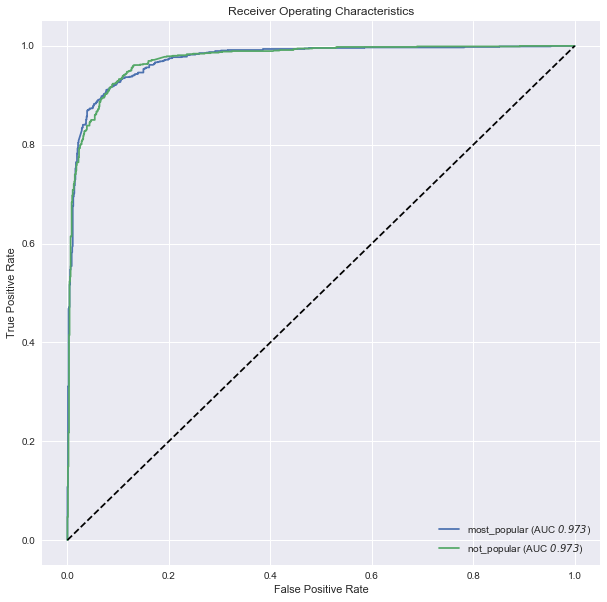

In [133]:
# ROC for Training Data
lucem_illud.plotMultiROC(logistic_l2, RL_dfTrain)

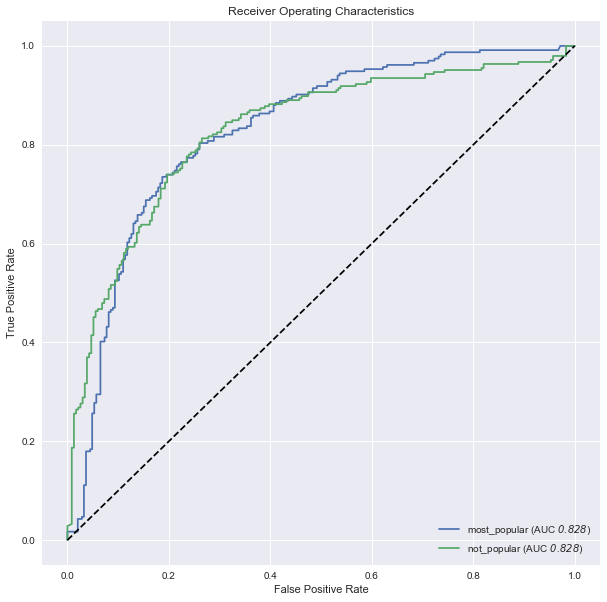

In [134]:
# ROC for Testing Data
lucem_illud.plotMultiROC(logistic_l2, RL_dfTest)

### 1b. Multinomial Naïve Bayes Classification

In [135]:
# Train the model
MultinomialNB = sklearn.naive_bayes.MultinomialNB()
MultinomialNB.fit(np.stack(RL_dfTrain['vect'], axis = 0), RL_dfTrain['category'])

RL_dfTrain['nb_predict'] = MultinomialNB.predict(np.stack(RL_dfTrain['vect'], axis=0))
RL_dfTest['nb_predict'] = MultinomialNB.predict(np.stack(RL_dfTest['vect'], axis=0))
print("Training score:")
print(MultinomialNB.score(np.stack(RL_dfTrain['vect'], axis=0), RL_dfTrain['category']))
print("Testing:")
print(MultinomialNB.score(np.stack(RL_dfTest['vect'], axis=0), RL_dfTest['category']))

Training score:
0.9072916666666667
Testing:
0.7541666666666667


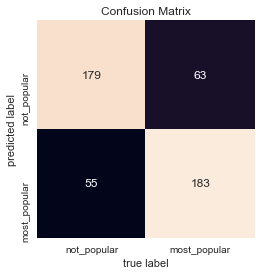

In [136]:
lucem_illud.plotConfusionMatrix(MultinomialNB, RL_dfTest)

In [137]:
print('Accuracy: ', sklearn.metrics.accuracy_score(RL_dfTest['category'], RL_dfTest['nb_predict']))
print('Precision: ', sklearn.metrics.precision_score(RL_dfTest['category'], RL_dfTest['nb_predict'], average='weighted'))
print('Recall: ', sklearn.metrics.recall_score(RL_dfTest['category'], RL_dfTest['nb_predict'], average='weighted'))
print('F-measures: ', sklearn.metrics.f1_score(RL_dfTest['category'], RL_dfTest['nb_predict'], average='weighted'))

Accuracy:  0.7541666666666667
Precision:  0.7546539690256268
Recall:  0.7541666666666667
F-measures:  0.7542008125564277


The performance of this classifier is still unsatisfactory.

In [138]:
lucem_illud.metrics.evaluateClassifier(MultinomialNB, RL_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.75443,0.703242,0.245833,0.768908,0.743902
most_popular,0.75443,0.680399,0.245833,0.739669,0.764957


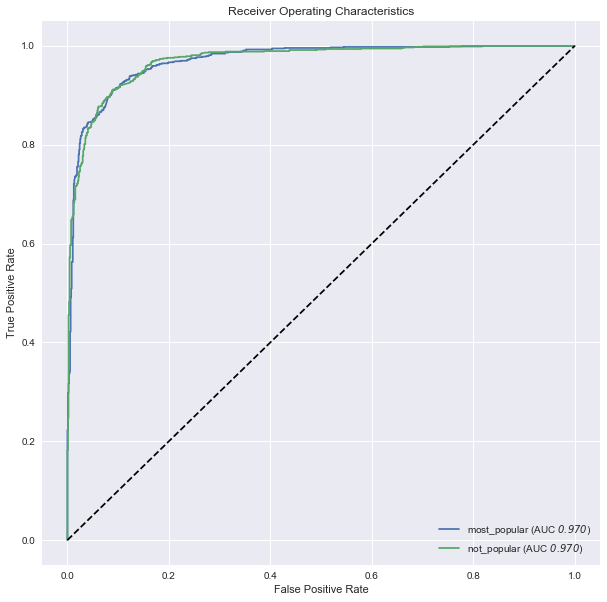

In [139]:
# ROC visualization on training dataset
lucem_illud.plotMultiROC(MultinomialNB, RL_dfTrain)

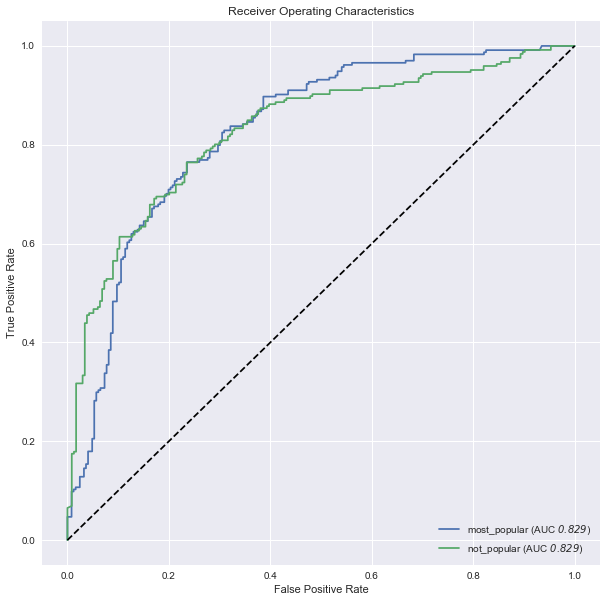

In [140]:
# ROC visualization on testing dataset
lucem_illud.plotMultiROC(MultinomialNB, RL_dfTest)

### 1c. Decision Tree

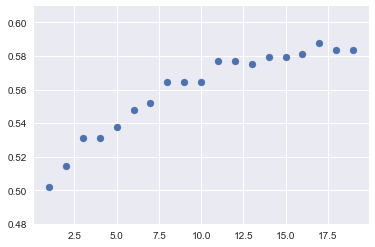

In [141]:
depthvec = []
scorevec = []
for i in range(1,20):
    tree2 = sklearn.tree.DecisionTreeClassifier(max_depth=i,random_state=0)
    tree2.fit(np.stack(RL_dfTrain['vect'], axis =0), RL_dfTrain['category'])
    score = sklearn.metrics.accuracy_score(RL_dfTest['category'], tree2.predict(np.stack(RL_dfTest['vect'], axis = 0)))
    depthvec.append(i)
    scorevec.append(score)
plt.scatter(depthvec,scorevec)
plt.show()

From the plot above, we can find the optimal layers of the decision tree. So we can choose 11 layers.

In [142]:
clf_tree = sklearn.tree.DecisionTreeClassifier(max_depth=11,random_state=0)
clf_tree.fit(np.stack(RL_dfTrain['vect'], axis =0), RL_dfTrain['category'])

RL_dfTest['decision_tree_predict'] = clf_tree.predict(np.stack(RL_dfTest['vect'], axis=0))

In [143]:
lucem_illud.evaluateClassifier(clf_tree, RL_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.585626,0.577554,0.422917,0.779221,0.243902
most_popular,0.585626,0.534759,0.422917,0.538462,0.927350


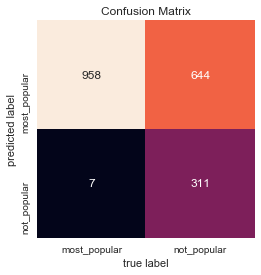

In [144]:
# Confusion Matrix for training dataset
lucem_illud.plotConfusionMatrix(clf_tree, RL_dfTrain)

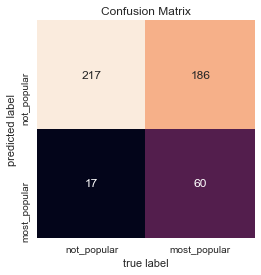

In [145]:
# Confusion Matrix for testing dataset
lucem_illud.plotConfusionMatrix(clf_tree, RL_dfTest)

In [146]:
print('Accuracy: ', sklearn.metrics.accuracy_score(RL_dfTest['category'], RL_dfTest['decision_tree_predict']))
print('Precision: ', sklearn.metrics.precision_score(RL_dfTest['category'], RL_dfTest['decision_tree_predict'], average='weighted'))
print('Recall: ', sklearn.metrics.recall_score(RL_dfTest['category'], RL_dfTest['decision_tree_predict'], average='weighted'))
print('F-measures: ', sklearn.metrics.f1_score(RL_dfTest['category'],RL_dfTest['decision_tree_predict'], average='weighted'))

Accuracy:  0.5770833333333333
Precision:  0.6618506493506494
Recall:  0.5770833333333333
F-measures:  0.5225453339230428


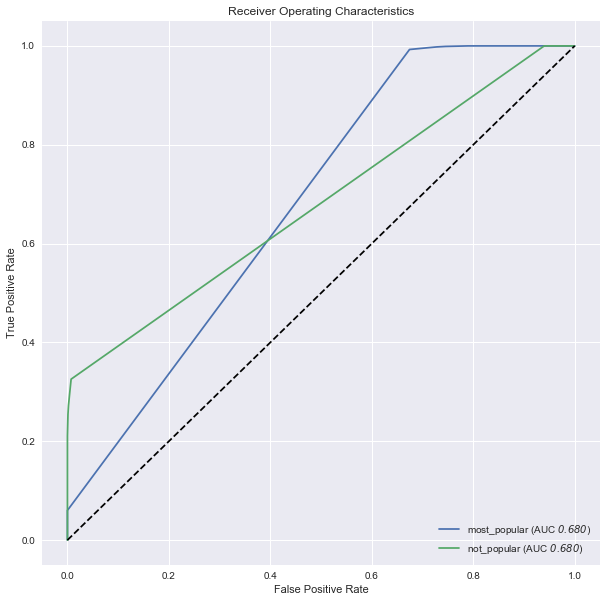

In [147]:
# ROC for training dataset
lucem_illud.plotMultiROC(clf_tree, RL_dfTrain)

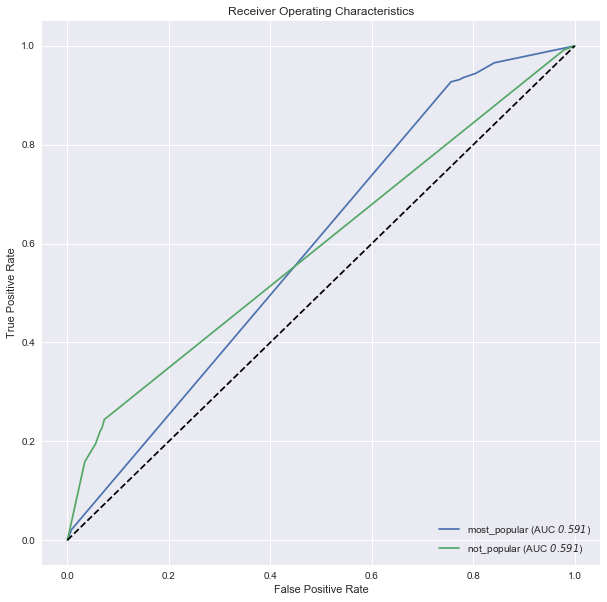

In [148]:
# ROC for testing dataset
lucem_illud.plotMultiROC(clf_tree, RL_dfTest)

The decision tree is still non-ideal.

### 1d. Bagging Trees

In [149]:
tree = sklearn.tree.DecisionTreeClassifier(max_depth=10)
bag = sklearn.ensemble.BaggingClassifier(tree, n_estimators=100, max_samples=0.8, random_state=1)
bag.fit(np.stack(RL_dfTrain['vect'], axis =0), RL_dfTrain['category'])
RL_dfTest['random_forest_predict'] = bag.predict(np.stack(RL_dfTest['vect'], axis=0))

In [150]:
print('Accuracy Score: ', sklearn.metrics.accuracy_score(RL_dfTest['category'], RL_dfTest['random_forest_predict']))
print('Precision Score: ', sklearn.metrics.precision_score(RL_dfTest['category'], RL_dfTest['random_forest_predict'], average = 'weighted'))
print('Recall: ', sklearn.metrics.recall_score(RL_dfTest['category'], RL_dfTest['random_forest_predict'], average = 'weighted'))
print('F1 Score: ', sklearn.metrics.f1_score(RL_dfTest['category'], RL_dfTest['random_forest_predict'], average = 'weighted'))

Accuracy Score:  0.6291666666666667
Precision Score:  0.6853766738458658
Recall:  0.6291666666666667
F1 Score:  0.6037862305479755


In [151]:
lucem_illud.evaluateClassifier(bag, RL_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.635606,0.616704,0.370833,0.788136,0.378049
most_popular,0.635606,0.567749,0.370833,0.577348,0.893162


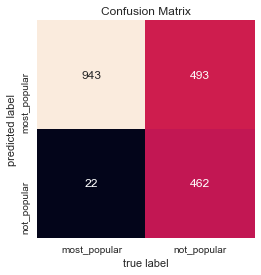

In [152]:
# Confusion Matrix with training dataset
lucem_illud.plotConfusionMatrix(bag, RL_dfTrain)

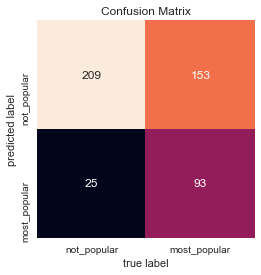

In [153]:
# Confusion Matrix with testing dataset
lucem_illud.plotConfusionMatrix(bag, RL_dfTest)

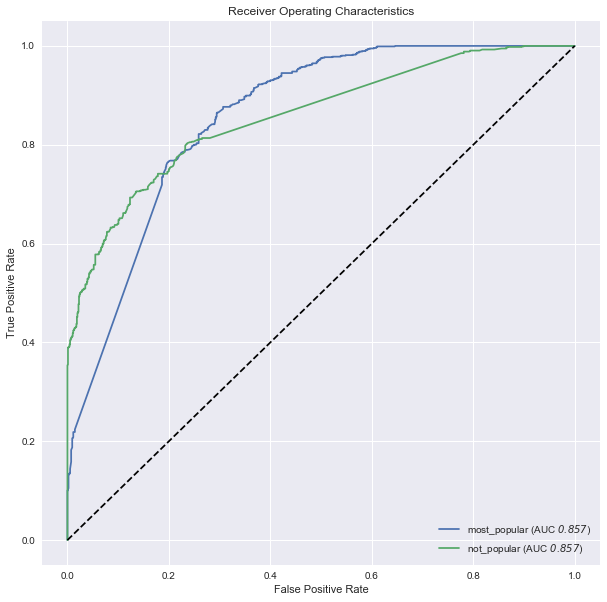

In [154]:
# ROC for training dataset
lucem_illud.plotMultiROC(bag, RL_dfTrain)

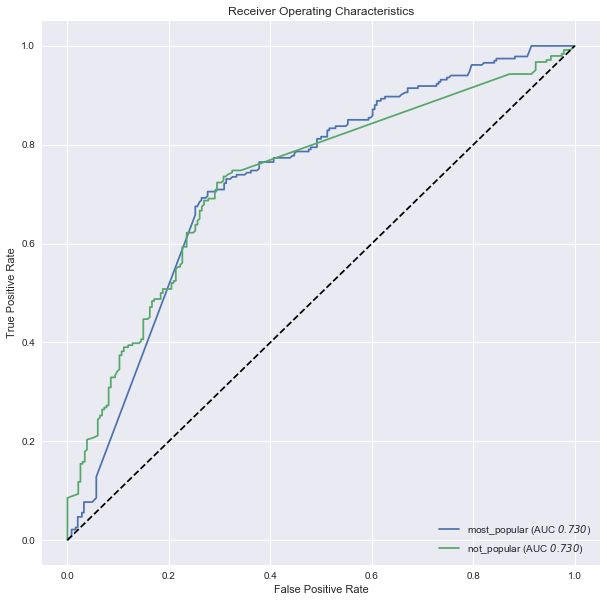

In [155]:
# ROC for testing dataset
lucem_illud.plotMultiROC(bag, RL_dfTest)

### 1e. Random Forest

In [156]:
clf_rf = sklearn.ensemble.RandomForestClassifier()
clf_rf.fit(np.stack(RL_dfTrain['vect'], axis =0), RL_dfTrain['category'])
RL_dfTest['rf_not_bagging'] = clf_rf.predict(np.stack(RL_dfTest['vect'], axis=0))

In [157]:
print('Accuracy: ', sklearn.metrics.accuracy_score(RL_dfTest['category'], RL_dfTest['rf_not_bagging']))
print('Precision: ', sklearn.metrics.precision_score(RL_dfTest['category'], RL_dfTest['rf_not_bagging'], average='weighted'))
print('Recall: ', sklearn.metrics.recall_score(RL_dfTest['category'], RL_dfTest['rf_not_bagging'], average='weighted'))
print('F1 Score: ', sklearn.metrics.f1_score(RL_dfTest['category'], RL_dfTest['rf_not_bagging'], average='weighted'))

Accuracy:  0.7791666666666667
Precision:  0.7836481896491351
Recall:  0.7791666666666667
F1 Score:  0.7787367908787542


In [158]:
lucem_illud.evaluateClassifier(clf_rf, RL_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.780488,0.737051,0.220833,0.821101,0.727642
most_popular,0.780488,0.701479,0.220833,0.744275,0.833333


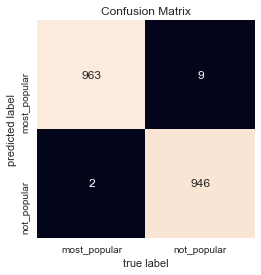

In [159]:
# Confusion Matrix for training dataset
lucem_illud.plotConfusionMatrix(clf_rf, RL_dfTrain)

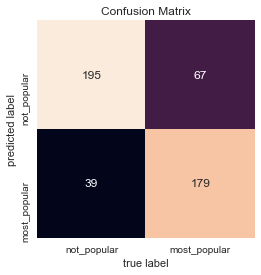

In [160]:
# Confusion Matrix for testing dataset
lucem_illud.plotConfusionMatrix(clf_rf, RL_dfTest)

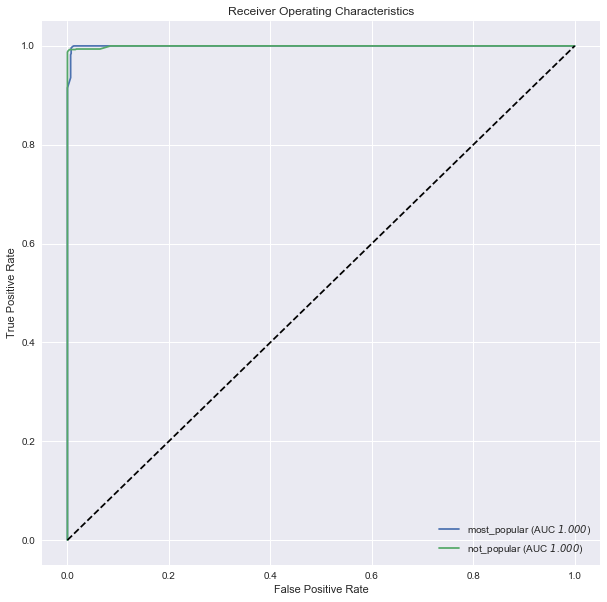

In [161]:
# ROC for training dataset
lucem_illud.plotMultiROC(clf_rf, RL_dfTrain)

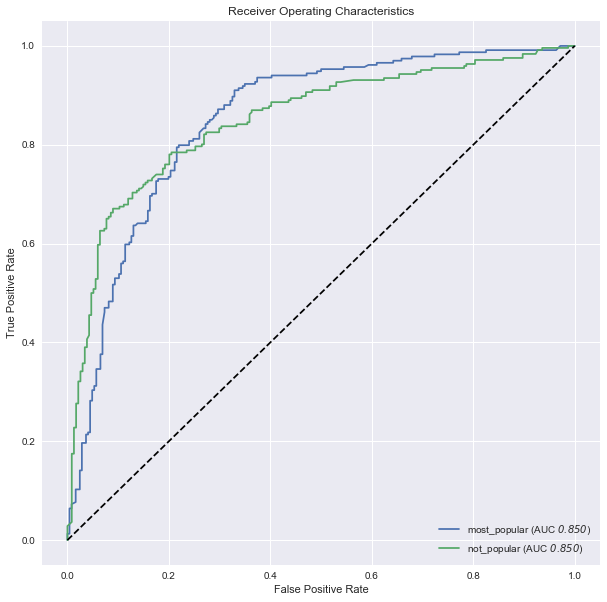

In [162]:
# ROC for testing dataset
lucem_illud.plotMultiROC(clf_rf, RL_dfTest)

### 1f. K-Nearest Neighbors

In [163]:
n_neighbors = 5
weights="uniform"
clf_knn = sklearn.neighbors.KNeighborsClassifier(n_neighbors, weights=weights)
clf_knn.fit(np.stack(RL_dfTrain['vect'], axis = 0), RL_dfTrain['category'])
RL_dfTest['knn_predict'] = clf_knn.predict(np.stack(RL_dfTest['vect'], axis=0))

In [164]:
print('Accuracy: ', sklearn.metrics.accuracy_score(RL_dfTest['category'], RL_dfTest['knn_predict']))
print('Precision: ', sklearn.metrics.precision_score(RL_dfTest['category'], RL_dfTest['knn_predict'], average='weighted'))
print('Recall: ', sklearn.metrics.recall_score(RL_dfTest['category'], RL_dfTest['knn_predict'], average='weighted'))
print('F1 Score: ', sklearn.metrics.f1_score(RL_dfTest['category'], RL_dfTest['knn_predict'], average='weighted'))

Accuracy:  0.5291666666666667
Precision:  0.592982922046086
Recall:  0.5291666666666667
F1 Score:  0.4510470154043646


In [165]:
lucem_illud.evaluateClassifier(clf_knn, RL_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.53867,0.537852,0.470833,0.672414,0.158537
most_popular,0.53867,0.507694,0.470833,0.509479,0.918803


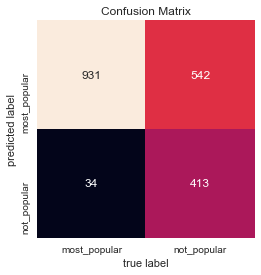

In [166]:
# Confusion Matrix with training dataset
lucem_illud.plotConfusionMatrix(clf_knn, RL_dfTrain)

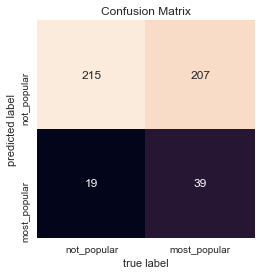

In [167]:
# Confusion Matrix with testing dataset
lucem_illud.plotConfusionMatrix(clf_knn, RL_dfTest)

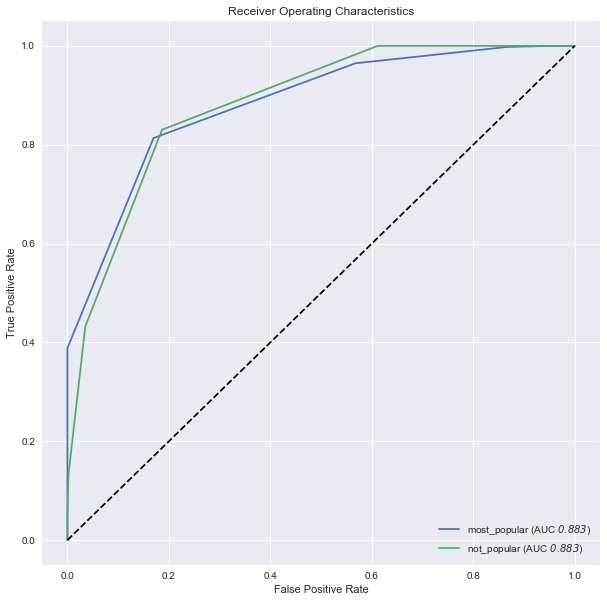

In [168]:
# ROC for training dataset
lucem_illud.plotMultiROC(clf_knn, RL_dfTrain)

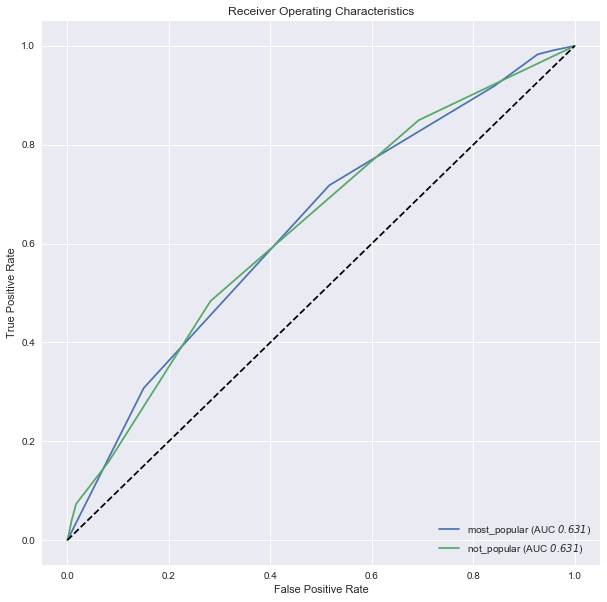

In [169]:
# ROC for testing dataset
lucem_illud.plotMultiROC(clf_knn, RL_dfTest)

However, we find that KNN does not have a good performance on classification and it may be caused the initial value of k selection.

### 1g. SVM

In [170]:
# Linear kernel
clf_svm = sklearn.svm.SVC(kernel='linear', probability = False)
clf_svm.fit(np.stack(RL_dfTrain['vect'], axis=0), RL_dfTrain['category'])
RL_dfTest['svm_predict'] = clf_svm.predict(np.stack(RL_dfTest['vect'], axis=0))

In [171]:
print('Accuracy Score: ', sklearn.metrics.accuracy_score(RL_dfTest['category'], RL_dfTest['svm_predict']))
print('Precision Score: ', sklearn.metrics.precision_score(RL_dfTest['category'], RL_dfTest['svm_predict'], average = 'weighted'))
print('Recall: ', sklearn.metrics.recall_score(RL_dfTest['category'], RL_dfTest['svm_predict'], average = 'weighted'))
print('F1 Score: ', sklearn.metrics.f1_score(RL_dfTest['category'], RL_dfTest['svm_predict'], average = 'weighted'))

Accuracy Score:  0.75625
Precision Score:  0.7583445787118455
Recall:  0.75625
F1 Score:  0.7561092636888922


In [172]:
lucem_illud.evaluateClassifier(clf_svm, RL_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.757088,0.709053,0.24375,0.784141,0.723577
most_popular,0.757088,0.680189,0.24375,0.731225,0.790598


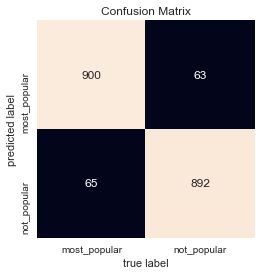

In [173]:
# Confusion Matrix for training dataset
lucem_illud.plotConfusionMatrix(clf_svm, RL_dfTrain)

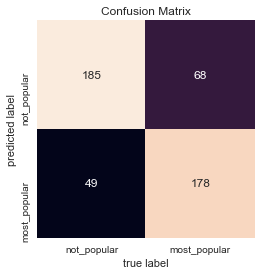

In [174]:
# Confusion Matrix with testing dataset
lucem_illud.plotConfusionMatrix(clf_svm, RL_dfTest)

### 1h. Simple Neural Nets

In [175]:
clf_nn = sklearn.neural_network.MLPClassifier()
clf_nn.fit(np.stack(RL_dfTrain['vect'], axis=0), RL_dfTrain['category'])
RL_dfTest['nn_predict'] = clf_nn.predict(np.stack(RL_dfTest['vect'], axis=0))

In [176]:
print('Accuracy: ', sklearn.metrics.accuracy_score(RL_dfTest['category'], RL_dfTest['nn_predict']))
print('Precision: ', sklearn.metrics.precision_score(RL_dfTest['category'], RL_dfTest['nn_predict'], average='weighted'))
print('Recall: ', sklearn.metrics.recall_score(RL_dfTest['category'], RL_dfTest['nn_predict'], average='weighted'))
print('F1 Score: ', sklearn.metrics.f1_score(RL_dfTest['category'], RL_dfTest['nn_predict'], average='weighted'))

Accuracy:  0.76875
Precision:  0.7688101809127476
Recall:  0.76875
F1 Score:  0.768616299844809


In [177]:
lucem_illud.evaluateClassifier(clf_nn, RL_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.768241,0.713044,0.23125,0.766798,0.788618
most_popular,0.768241,0.699463,0.23125,0.770925,0.747863


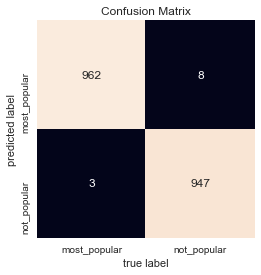

In [178]:
# Confusion Matrix with training dataset
lucem_illud.plotConfusionMatrix(clf_nn, RL_dfTrain)

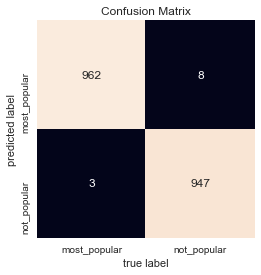

In [179]:
# Confusion Matrix with testing dataset
lucem_illud.plotConfusionMatrix(clf_nn, RL_dfTrain)

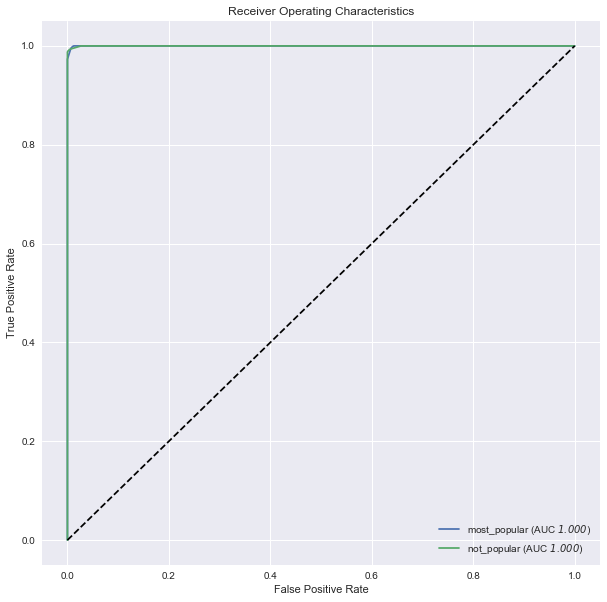

In [180]:
# ROC for training dataset
lucem_illud.plotMultiROC(clf_nn, RL_dfTrain)

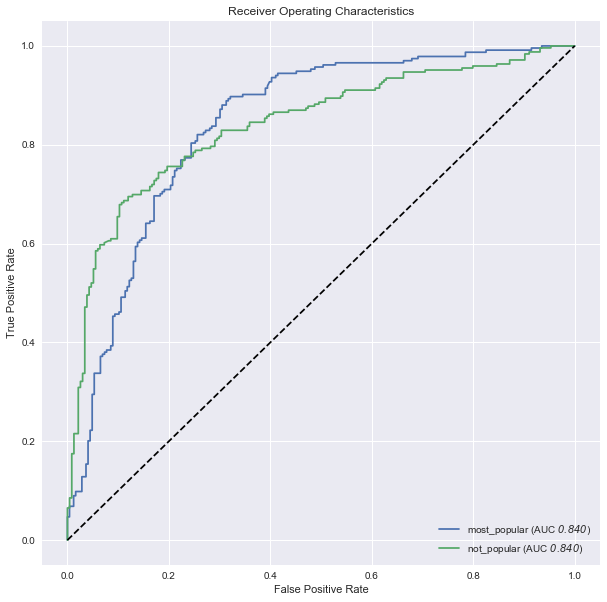

In [181]:
# ROC for Testing dataset
lucem_illud.plotMultiROC(clf_nn, RL_dfTest)

## 2. Reddit UnderArmour

In [182]:
# Turn the training dataset into a tf-idf matrix
TFVectorizer = sklearn.feature_extraction.text.TfidfVectorizer(max_df=100, min_df=2, stop_words='english', norm='l2')
TFVects = TFVectorizer.fit_transform(rdt_udar['text'])
rdt_udar['vect'] = [np.array(v).flatten() for v in TFVects.todense()]

In [183]:
# split the dataset into training data and testing data
holdBackFraction = .2
RU_dfTrain, RU_dfTest = lucem_illud.trainTestSplit(rdt_udar, holdBackFraction=holdBackFraction)

### 2a. Logistic Classification

In [184]:
# Implement PCA
pca = sklearn.decomposition.PCA()
reduced_data = pca.fit_transform(np.stack(RU_dfTrain['vect'], axis=0))
RU_dfTrain['pca'] = [r for r in reduced_data]

In [185]:
# Logistic classfication without dimension reduction
logistic_full = sklearn.linear_model.LogisticRegression()
logistic_full.fit(np.stack(RU_dfTrain['vect'], axis=0), RU_dfTrain['category'])
# Training data
print(logistic_full.score(np.stack(RU_dfTrain['vect'], axis=0), RU_dfTrain['category']))
# Testing data
print(logistic_full.score(np.stack(RU_dfTest['vect'], axis=0), RU_dfTest['category']))

0.9409148665819568
0.8244274809160306


In [186]:
lucem_illud.evaluateClassifier(logistic_full, RU_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.7898,0.785662,0.175573,0.793706,0.957806
most_popular,0.7898,0.713810,0.175573,0.906542,0.621795


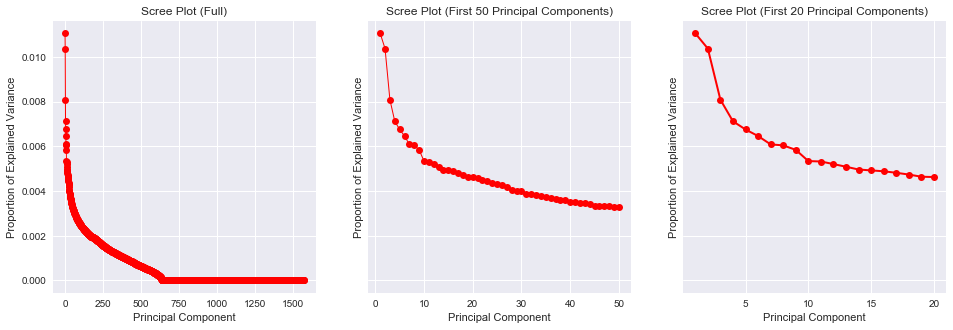

In [187]:
# Optimal number of principle components
n = len(RU_dfTrain)
# Initialize
fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize = (16, 5), sharey=True)
# 1
eigen_vals = np.arange(n) + 1
ax1.plot(eigen_vals, pca.explained_variance_ratio_, 'ro-', linewidth=1)
ax1.set_title('Scree Plot (Full)')
ax1.set_xlabel('Principal Component')
ax1.set_ylabel('Proportion of Explained Variance')
# 2
eigen_vals = np.arange(50) + 1
ax2.plot(eigen_vals, pca.explained_variance_ratio_[:50], 'ro-', linewidth=1)
ax2.set_title('Scree Plot (First 50 Principal Components)')
ax2.set_xlabel('Principal Component')
ax2.set_ylabel('Proportion of Explained Variance')
# 3
eigen_vals = np.arange(20) + 1
ax3.plot(eigen_vals, pca.explained_variance_ratio_[:20], 'ro-', linewidth=2)
ax3.set_title('Scree Plot (First 20 Principal Components)')
ax3.set_xlabel('Principal Component')
ax3.set_ylabel('Proportion of Explained Variance')
# Plot
plt.show()

According to the elbow point, I'll choose the first 10 principal components as my covariates.

In [188]:
RU_dfTrain['pca_reduced_10'] = RU_dfTrain['pca'].apply(lambda x: x[:10])

In [189]:
# Fit a logistic regression
logistic = sklearn.linear_model.LogisticRegression()
logistic.fit(np.stack(RU_dfTrain['pca_reduced_10'], axis=0), RU_dfTrain['category'])
# Performance on the training dataset
logistic.score(np.stack(RU_dfTrain['pca_reduced_10'], axis=0), RU_dfTrain['category'])

0.613722998729352

In [190]:
# Apply the model on testing dataset

#Create vectors
TFVects_test = TFVectorizer.transform(RU_dfTest['text'])
RU_dfTest['vect'] = [np.array(v).flatten() for v in TFVects_test.todense()]

#PCA
reduced_data_test = pca.transform(np.stack(RU_dfTest['vect'], axis=0))
RU_dfTest['pca'] = [r for r in reduced_data_test]
RU_dfTest['pca_reduced_10'] = RU_dfTest['pca'].apply(lambda x: x[:10])

#Test
logistic.score(np.stack(RU_dfTest['pca_reduced_10'], axis=0), RU_dfTest['category'])

0.6183206106870229

In [191]:
# With panelty
logistic_l2= sklearn.linear_model.LogisticRegression(penalty='l2')
logistic_l2.fit(np.stack(RU_dfTrain['vect'], axis=0), RU_dfTrain['category'])

# Training data
print('Training: ', logistic_l2.score(np.stack(RU_dfTrain['vect'], axis=0), RU_dfTrain['category']))

# Testing data
print('Testing: ', logistic_l2.score(np.stack(RU_dfTest['vect'], axis=0), RU_dfTest['category']))

Training:  0.9409148665819568
Testing:  0.8244274809160306


In [192]:
lucem_illud.evaluateClassifier(logistic_l2, RU_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.7898,0.785662,0.175573,0.793706,0.957806
most_popular,0.7898,0.713810,0.175573,0.906542,0.621795


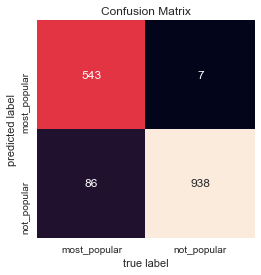

In [193]:
# Confusion Matrix for Training Data
RU_dfTest['logistic_penalty_predict'] = logistic_l2.predict(np.stack(RU_dfTest['vect'], axis=0))
lucem_illud.plotConfusionMatrix(logistic_l2, RU_dfTrain)

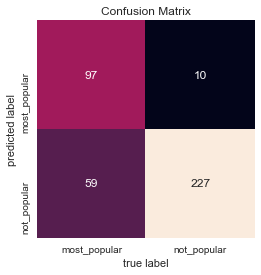

In [194]:
# Confusion Matrix for Testing Data
lucem_illud.plotConfusionMatrix(logistic_l2, RU_dfTest)

In [195]:
print('Accuracy: ', sklearn.metrics.accuracy_score(RU_dfTest['category'], RU_dfTest['logistic_penalty_predict']))
print('Precision: ', sklearn.metrics.precision_score(RU_dfTest['category'], RU_dfTest['logistic_penalty_predict'], average = 'weighted'))
print('Recall: ', sklearn.metrics.recall_score(RU_dfTest['category'], RU_dfTest['logistic_penalty_predict'], average = 'weighted'))
print('F-measures: ', sklearn.metrics.f1_score(RU_dfTest['category'], RU_dfTest['logistic_penalty_predict'], average = 'weighted'))

Accuracy:  0.8244274809160306
Precision:  0.8384960619746952
Recall:  0.8244274809160306
F-measures:  0.8162965824975406


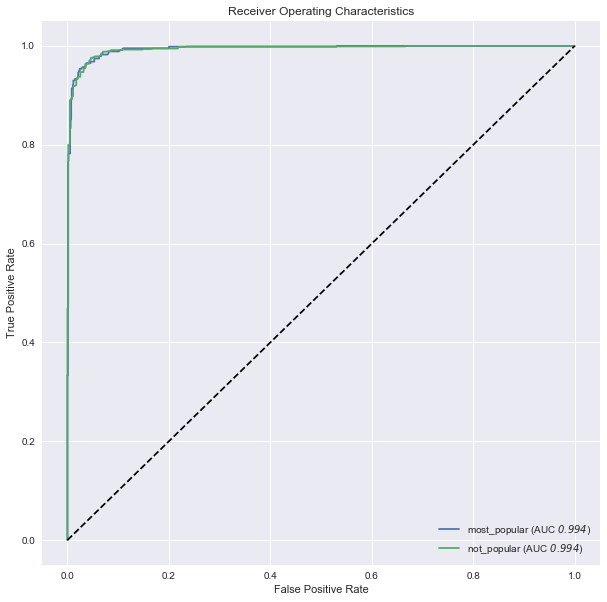

In [196]:
# ROC for Training Data
lucem_illud.plotMultiROC(logistic_l2, RU_dfTrain)

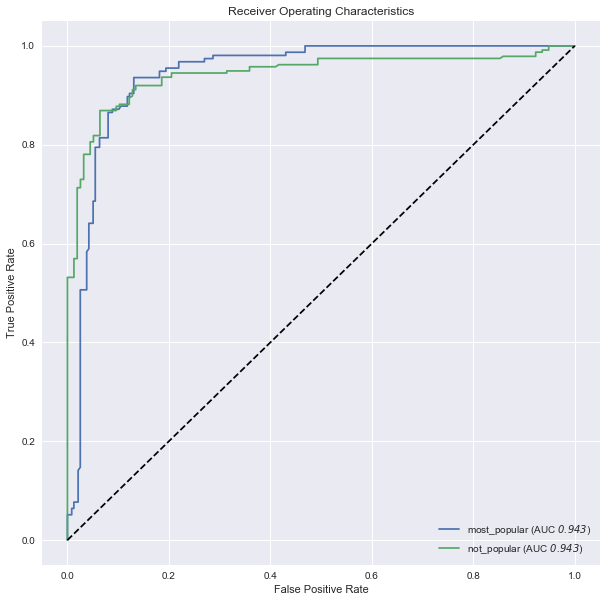

In [197]:
# ROC for Testing Data
lucem_illud.plotMultiROC(logistic_l2, RU_dfTest)

### 2b. Multinomial Naïve Bayes Classification

In [198]:
# Train the model
MultinomialNB = sklearn.naive_bayes.MultinomialNB()
MultinomialNB.fit(np.stack(RU_dfTrain['vect'], axis = 0), RU_dfTrain['category'])

RU_dfTrain['nb_predict'] = MultinomialNB.predict(np.stack(RU_dfTrain['vect'], axis=0))
RU_dfTest['nb_predict'] = MultinomialNB.predict(np.stack(RU_dfTest['vect'], axis=0))
print("Training score:")
print(MultinomialNB.score(np.stack(RU_dfTrain['vect'], axis=0), RU_dfTrain['category']))
print("Testing:")
print(MultinomialNB.score(np.stack(RU_dfTest['vect'], axis=0), RU_dfTest['category']))

Training score:
0.934561626429479
Testing:
0.8193384223918575


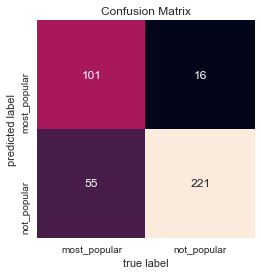

In [199]:
lucem_illud.plotConfusionMatrix(MultinomialNB, RU_dfTest)

In [200]:
print('Accuracy: ', sklearn.metrics.accuracy_score(RU_dfTest['category'], RU_dfTest['nb_predict']))
print('Precision: ', sklearn.metrics.precision_score(RU_dfTest['category'], RU_dfTest['nb_predict'], average='weighted'))
print('Recall: ', sklearn.metrics.recall_score(RU_dfTest['category'], RU_dfTest['nb_predict'], average='weighted'))
print('F-measures: ', sklearn.metrics.f1_score(RU_dfTest['category'], RU_dfTest['nb_predict'], average='weighted'))

Accuracy:  0.8193384223918575
Precision:  0.8255430172954237
Recall:  0.8193384223918575
F-measures:  0.813301276941293


In [201]:
lucem_illud.metrics.evaluateClassifier(MultinomialNB, RU_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.789963,0.787380,0.180662,0.800725,0.932489
most_popular,0.789963,0.698847,0.180662,0.863248,0.647436


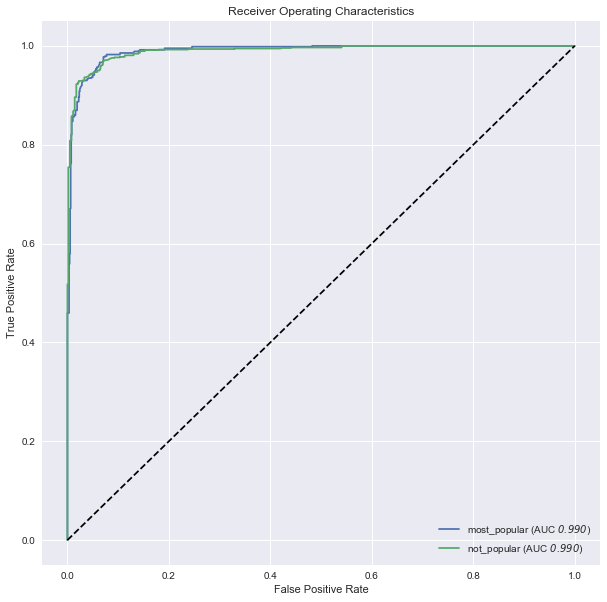

In [202]:
# ROC visualization on training dataset
lucem_illud.plotMultiROC(MultinomialNB, RU_dfTrain)

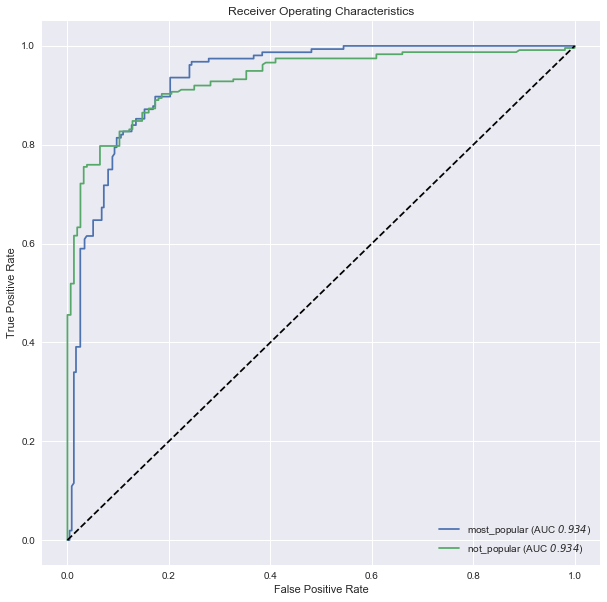

In [203]:
# ROC visualization on testing dataset
lucem_illud.plotMultiROC(MultinomialNB, RU_dfTest)

### 2c. Decision Tree

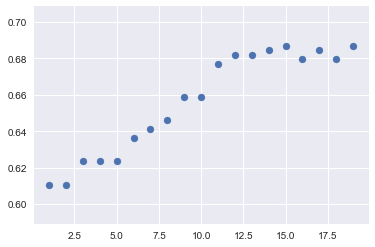

In [204]:
depthvec = []
scorevec = []
for i in range(1,20):
    tree2 = sklearn.tree.DecisionTreeClassifier(max_depth=i,random_state=0)
    tree2.fit(np.stack(RU_dfTrain['vect'], axis =0), RU_dfTrain['category'])
    score = sklearn.metrics.accuracy_score(RU_dfTest['category'], tree2.predict(np.stack(RU_dfTest['vect'], axis = 0)))
    depthvec.append(i)
    scorevec.append(score)
plt.scatter(depthvec,scorevec)
plt.show()

From the plot above, we can find the optimal layers of the decision tree. So we can choose 15 layers.

In [205]:
clf_tree = sklearn.tree.DecisionTreeClassifier(max_depth=15,random_state=0)
clf_tree.fit(np.stack(RU_dfTrain['vect'], axis =0), RU_dfTrain['category'])

RU_dfTest['decision_tree_predict'] = clf_tree.predict(np.stack(RU_dfTest['vect'], axis=0))

In [206]:
lucem_illud.evaluateClassifier(clf_tree, RU_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.609056,0.660283,0.312977,0.661017,0.987342
most_popular,0.609056,0.518361,0.312977,0.923077,0.230769


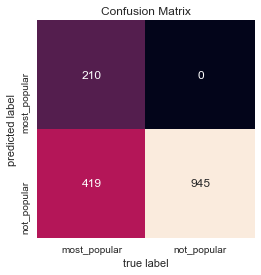

In [207]:
# Confusion Matrix for training dataset
lucem_illud.plotConfusionMatrix(clf_tree, RU_dfTrain)

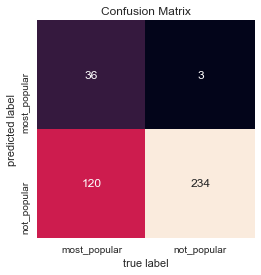

In [208]:
# Confusion Matrix for testing dataset
lucem_illud.plotConfusionMatrix(clf_tree, RU_dfTest)

In [209]:
print('Accuracy: ', sklearn.metrics.accuracy_score(RU_dfTest['category'], RU_dfTest['decision_tree_predict']))
print('Precision: ', sklearn.metrics.precision_score(RU_dfTest['category'], RU_dfTest['decision_tree_predict'], average='weighted'))
print('Recall: ', sklearn.metrics.recall_score(RU_dfTest['category'], RU_dfTest['decision_tree_predict'], average='weighted'))
print('F-measures: ', sklearn.metrics.f1_score(RU_dfTest['category'],RU_dfTest['decision_tree_predict'], average='weighted'))

Accuracy:  0.6870229007633588
Precision:  0.765040755595808
Recall:  0.6870229007633588
F-measures:  0.6241097376680745


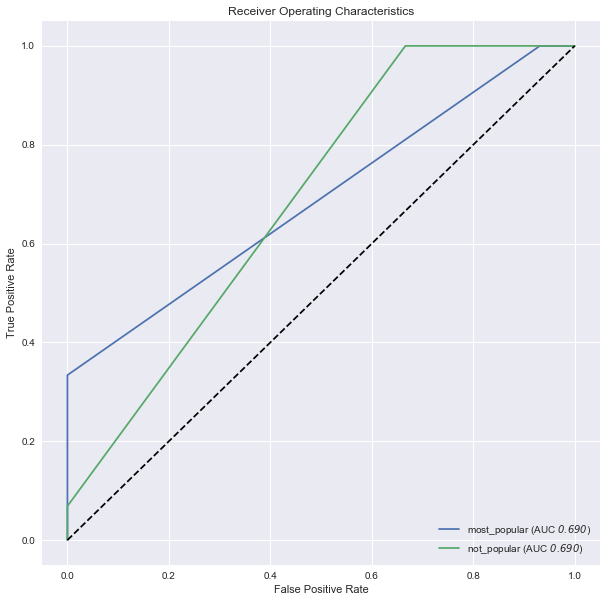

In [210]:
# ROC for training dataset
lucem_illud.plotMultiROC(clf_tree, RU_dfTrain)

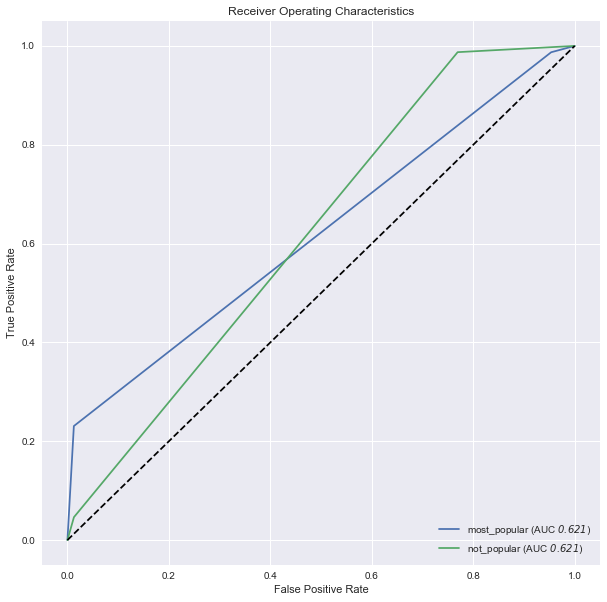

In [211]:
# ROC for testing dataset
lucem_illud.plotMultiROC(clf_tree, RU_dfTest)

The decision tree is still non-ideal.

### 2d. Bagging Trees

In [212]:
tree = sklearn.tree.DecisionTreeClassifier(max_depth=10)
bag = sklearn.ensemble.BaggingClassifier(tree, n_estimators=100, max_samples=0.8, random_state=1)
bag.fit(np.stack(RU_dfTrain['vect'], axis =0), RU_dfTrain['category'])
RU_dfTest['random_forest_predict'] = bag.predict(np.stack(RU_dfTest['vect'], axis=0))

In [213]:
print('Accuracy Score: ', sklearn.metrics.accuracy_score(RU_dfTest['category'], RU_dfTest['random_forest_predict']))
print('Precision Score: ', sklearn.metrics.precision_score(RU_dfTest['category'], RU_dfTest['random_forest_predict'], average = 'weighted'))
print('Recall: ', sklearn.metrics.recall_score(RU_dfTest['category'], RU_dfTest['random_forest_predict'], average = 'weighted'))
print('F1 Score: ', sklearn.metrics.f1_score(RU_dfTest['category'], RU_dfTest['random_forest_predict'], average = 'weighted'))

Accuracy Score:  0.6819338422391857
Precision Score:  0.7611507639383102
Recall:  0.6819338422391857
F1 Score:  0.6157910663765099


In [214]:
lucem_illud.evaluateClassifier(bag, RU_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.602645,0.656617,0.318066,0.657303,0.987342
most_popular,0.602645,0.510710,0.318066,0.918919,0.217949


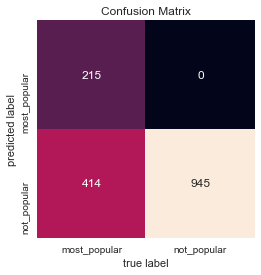

In [215]:
# Confusion Matrix with training dataset
lucem_illud.plotConfusionMatrix(bag, RU_dfTrain)

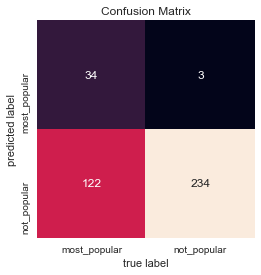

In [216]:
# Confusion Matrix with testing dataset
lucem_illud.plotConfusionMatrix(bag, RU_dfTest)

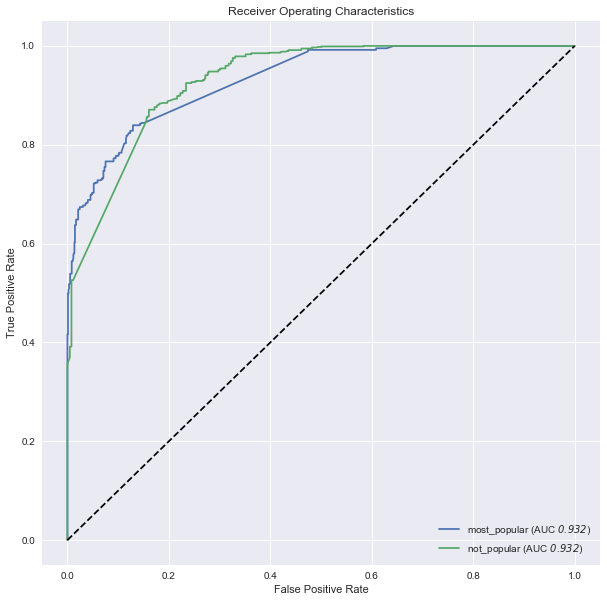

In [217]:
# ROC for training dataset
lucem_illud.plotMultiROC(bag, RU_dfTrain)

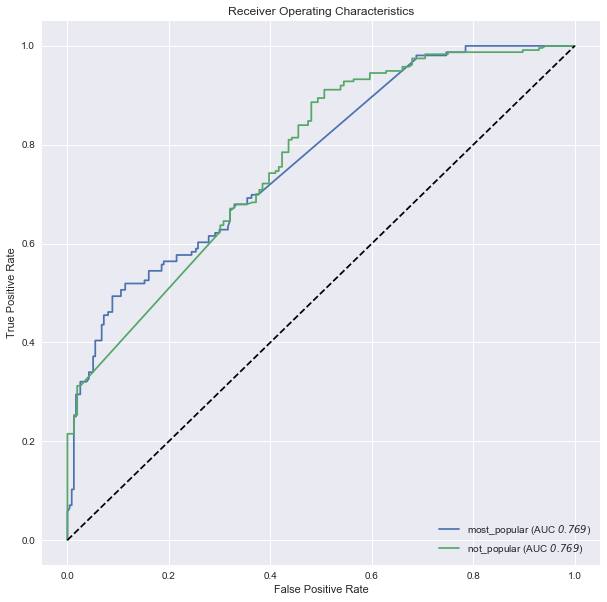

In [218]:
# ROC for testing dataset
lucem_illud.plotMultiROC(bag, RU_dfTest)

### 2e. Random Forest

In [219]:
clf_rf = sklearn.ensemble.RandomForestClassifier()
clf_rf.fit(np.stack(RU_dfTrain['vect'], axis =0), RU_dfTrain['category'])
RU_dfTest['rf_not_bagging'] = clf_rf.predict(np.stack(RU_dfTest['vect'], axis=0))

In [220]:
print('Accuracy: ', sklearn.metrics.accuracy_score(RU_dfTest['category'], RU_dfTest['rf_not_bagging']))
print('Precision: ', sklearn.metrics.precision_score(RU_dfTest['category'], RU_dfTest['rf_not_bagging'], average='weighted'))
print('Recall: ', sklearn.metrics.recall_score(RU_dfTest['category'], RU_dfTest['rf_not_bagging'], average='weighted'))
print('F1 Score: ', sklearn.metrics.f1_score(RU_dfTest['category'], RU_dfTest['rf_not_bagging'], average='weighted'))

Accuracy:  0.9541984732824428
Precision:  0.9543417208557158
Recall:  0.9541984732824428
F1 Score:  0.9540356982487651


In [221]:
lucem_illud.evaluateClassifier(clf_rf, RU_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.94888,0.941818,0.045802,0.950617,0.974684
most_popular,0.94888,0.916688,0.045802,0.960000,0.923077


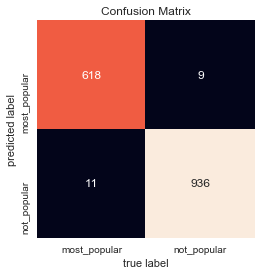

In [222]:
# Confusion Matrix for training dataset
lucem_illud.plotConfusionMatrix(clf_rf, RU_dfTrain)

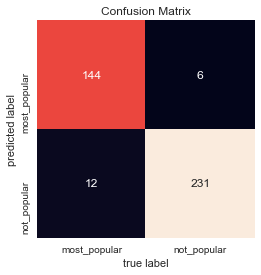

In [223]:
# Confusion Matrix for testing dataset
lucem_illud.plotConfusionMatrix(clf_rf, RU_dfTest)

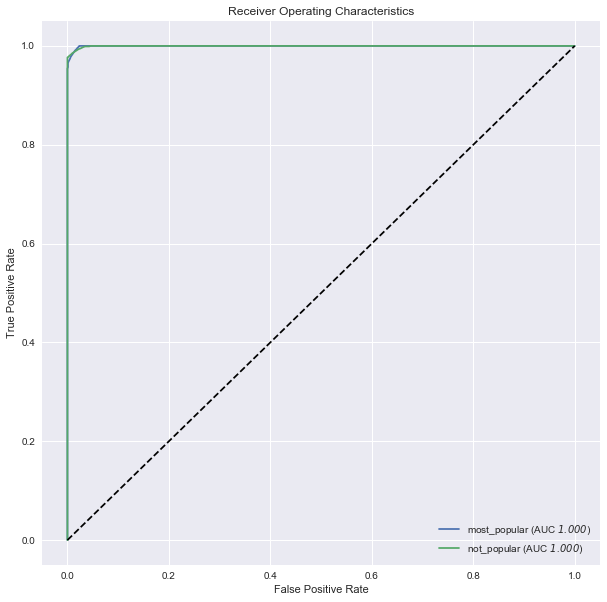

In [224]:
# ROC for training dataset
lucem_illud.plotMultiROC(clf_rf, RU_dfTrain)

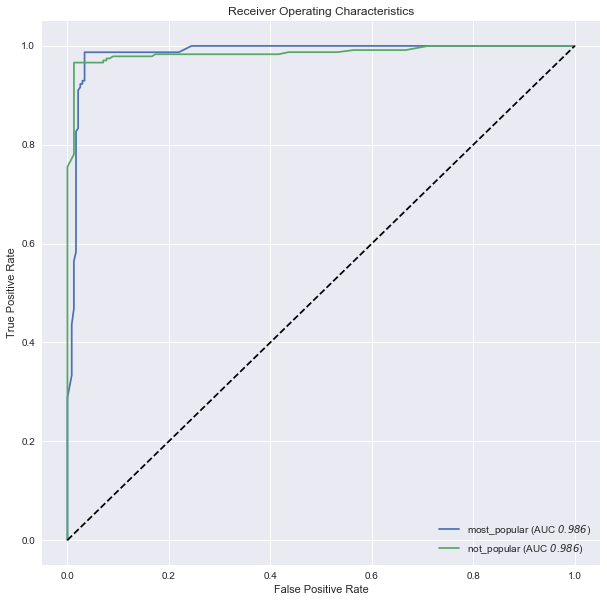

In [225]:
# ROC for testing dataset
lucem_illud.plotMultiROC(clf_rf, RU_dfTest)

### 2f. K-Nearest Neighbors

In [226]:
n_neighbors = 5
weights="uniform"
clf_knn = sklearn.neighbors.KNeighborsClassifier(n_neighbors, weights=weights)
clf_knn.fit(np.stack(RU_dfTrain['vect'], axis = 0), RU_dfTrain['category'])
RU_dfTest['knn_predict'] = clf_knn.predict(np.stack(RU_dfTest['vect'], axis=0))

In [227]:
print('Accuracy: ', sklearn.metrics.accuracy_score(RU_dfTest['category'], RU_dfTest['knn_predict']))
print('Precision: ', sklearn.metrics.precision_score(RU_dfTest['category'], RU_dfTest['knn_predict'], average='weighted'))
print('Recall: ', sklearn.metrics.recall_score(RU_dfTest['category'], RU_dfTest['knn_predict'], average='weighted'))
print('F1 Score: ', sklearn.metrics.f1_score(RU_dfTest['category'], RU_dfTest['knn_predict'], average='weighted'))

Accuracy:  0.6412213740458015
Precision:  0.7521090294165417
Recall:  0.6412213740458015
F1 Score:  0.5377649493583515


In [228]:
lucem_illud.evaluateClassifier(clf_knn, RU_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.549172,0.627556,0.358779,0.627660,0.995781
most_popular,0.549172,0.452765,0.358779,0.941176,0.102564


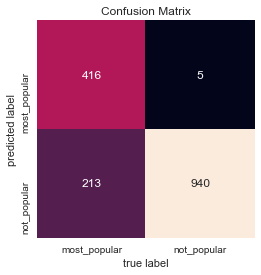

In [229]:
# Confusion Matrix with training dataset
lucem_illud.plotConfusionMatrix(clf_knn, RU_dfTrain)

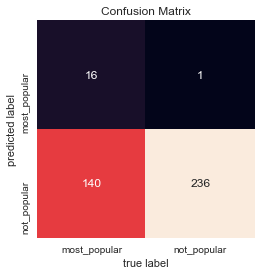

In [230]:
# Confusion Matrix with testing dataset
lucem_illud.plotConfusionMatrix(clf_knn, RU_dfTest)

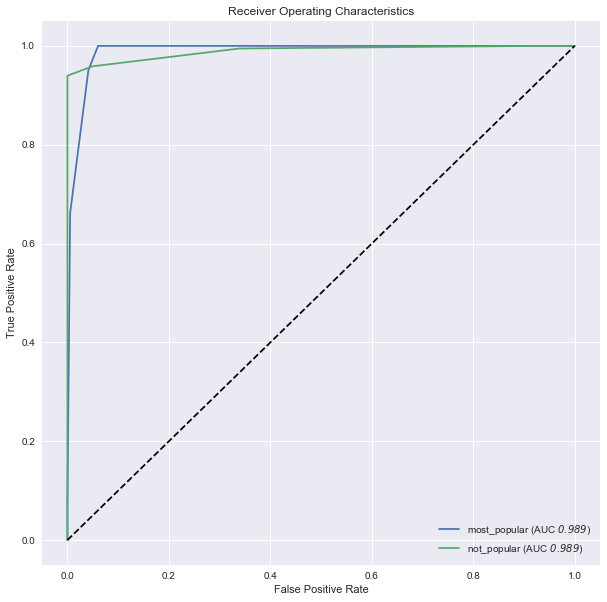

In [231]:
# ROC for training dataset
lucem_illud.plotMultiROC(clf_knn, RU_dfTrain)

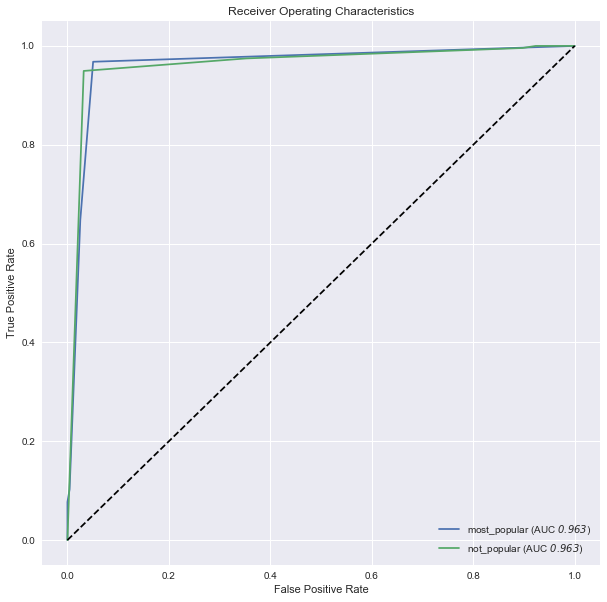

In [232]:
# ROC for testing dataset
lucem_illud.plotMultiROC(clf_knn, RU_dfTest)

However, we find that KNN does not have a good performance on classification and it may be caused the initial value of k selection.

### 2g. SVM

In [233]:
# Linear kernel
clf_svm = sklearn.svm.SVC(kernel='linear', probability = False)
clf_svm.fit(np.stack(RU_dfTrain['vect'], axis=0), RU_dfTrain['category'])
RU_dfTest['svm_predict'] = clf_svm.predict(np.stack(RU_dfTest['vect'], axis=0))

In [234]:
print('Accuracy Score: ', sklearn.metrics.accuracy_score(RU_dfTest['category'], RU_dfTest['svm_predict']))
print('Precision Score: ', sklearn.metrics.precision_score(RU_dfTest['category'], RU_dfTest['svm_predict'], average = 'weighted'))
print('Recall: ', sklearn.metrics.recall_score(RU_dfTest['category'], RU_dfTest['svm_predict'], average = 'weighted'))
print('F1 Score: ', sklearn.metrics.f1_score(RU_dfTest['category'], RU_dfTest['svm_predict'], average = 'weighted'))

Accuracy Score:  0.916030534351145
Precision Score:  0.9167605829285219
Recall:  0.916030534351145
F1 Score:  0.9153258535395219


In [235]:
lucem_illud.evaluateClassifier(clf_svm, RU_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.905185,0.895133,0.083969,0.90800,0.957806
most_popular,0.905185,0.851468,0.083969,0.93007,0.852564


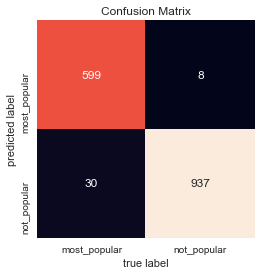

In [236]:
# Confusion Matrix for training dataset
lucem_illud.plotConfusionMatrix(clf_svm, RU_dfTrain)

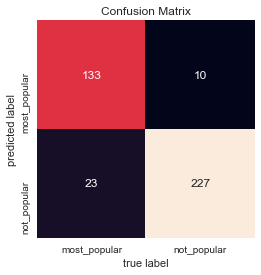

In [237]:
# Confusion Matrix with testing dataset
lucem_illud.plotConfusionMatrix(clf_svm, RU_dfTest)

### 2h. Simple Neural Nets

In [238]:
clf_nn = sklearn.neural_network.MLPClassifier()
clf_nn.fit(np.stack(RU_dfTrain['vect'], axis=0), RU_dfTrain['category'])
RU_dfTest['nn_predict'] = clf_nn.predict(np.stack(RU_dfTest['vect'], axis=0))

In [239]:
print('Accuracy: ', sklearn.metrics.accuracy_score(RU_dfTest['category'], RU_dfTest['nn_predict']))
print('Precision: ', sklearn.metrics.precision_score(RU_dfTest['category'], RU_dfTest['nn_predict'], average='weighted'))
print('Recall: ', sklearn.metrics.recall_score(RU_dfTest['category'], RU_dfTest['nn_predict'], average='weighted'))
print('F1 Score: ', sklearn.metrics.f1_score(RU_dfTest['category'], RU_dfTest['nn_predict'], average='weighted'))

Accuracy:  0.9287531806615776
Precision:  0.9287531806615776
Recall:  0.9287531806615776
F1 Score:  0.9287531806615776


In [240]:
lucem_illud.evaluateClassifier(clf_nn, RU_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.925592,0.920969,0.071247,0.940928,0.940928
most_popular,0.925592,0.864190,0.071247,0.910256,0.910256


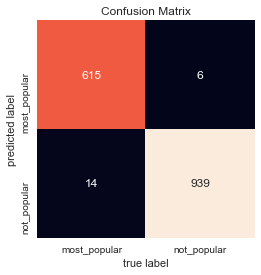

In [241]:
# Confusion Matrix with training dataset
lucem_illud.plotConfusionMatrix(clf_nn, RU_dfTrain)

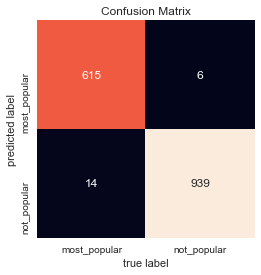

In [242]:
# Confusion Matrix with testing dataset
lucem_illud.plotConfusionMatrix(clf_nn, RU_dfTrain)

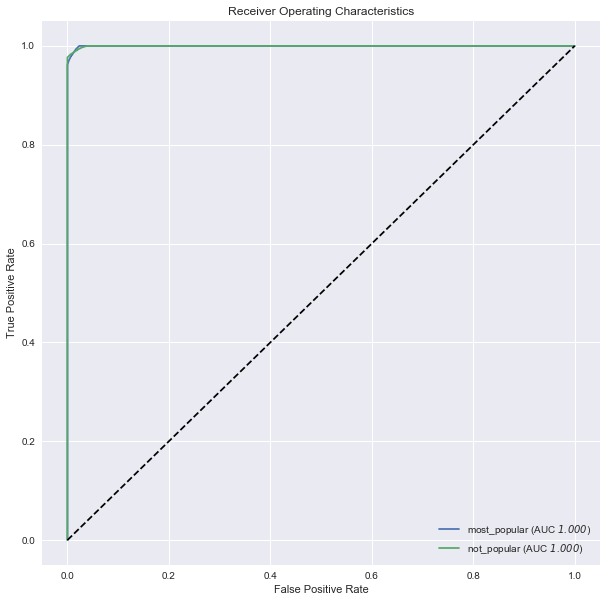

In [243]:
# ROC for training dataset
lucem_illud.plotMultiROC(clf_nn, RU_dfTrain)

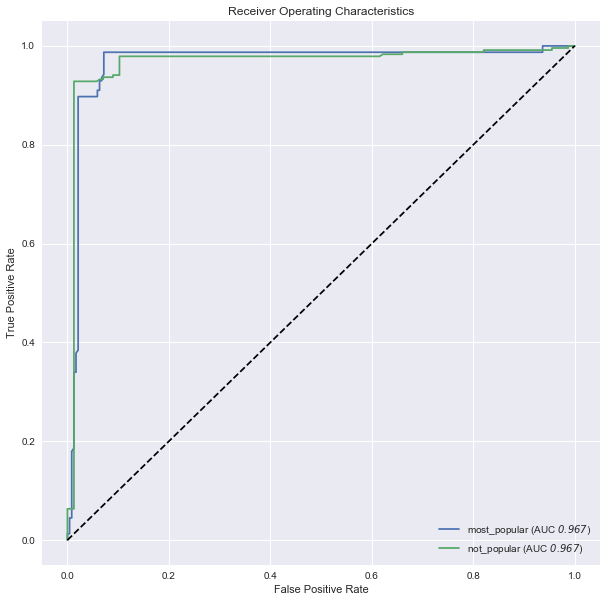

In [244]:
# ROC for Testing dataset
lucem_illud.plotMultiROC(clf_nn, RU_dfTest)

## 3. Twitter Lululemon

In [245]:
# Turn the training dataset into a tf-idf matrix
TFVectorizer = sklearn.feature_extraction.text.TfidfVectorizer(max_df=100, min_df=2, stop_words='english', norm='l2')
TFVects = TFVectorizer.fit_transform(twt_lulu['text'])
twt_lulu['vect'] = [np.array(v).flatten() for v in TFVects.todense()]

In [246]:
# split the dataset into training data and testing data
holdBackFraction = .3
TL_dfTrain, TL_dfTest = lucem_illud.trainTestSplit(twt_lulu, holdBackFraction=holdBackFraction)

### 3a. Logistic Classification

In [247]:
# Implement PCA
pca = sklearn.decomposition.PCA()
reduced_data = pca.fit_transform(np.stack(TL_dfTrain['vect'], axis=0))
TL_dfTrain['pca'] = [r for r in reduced_data]

In [248]:
# Logistic classfication without dimension reduction
logistic_full = sklearn.linear_model.LogisticRegression()
logistic_full.fit(np.stack(TL_dfTrain['vect'], axis=0), TL_dfTrain['category'])
# Training data
print(logistic_full.score(np.stack(TL_dfTrain['vect'], axis=0), TL_dfTrain['category']))
# Testing data
print(logistic_full.score(np.stack(TL_dfTest['vect'], axis=0), TL_dfTest['category']))

0.9357142857142857
0.8513888888888889


In [249]:
lucem_illud.evaluateClassifier(logistic_full, TL_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.850753,0.810794,0.148611,0.856021,0.862797
most_popular,0.850753,0.786066,0.148611,0.846154,0.838710


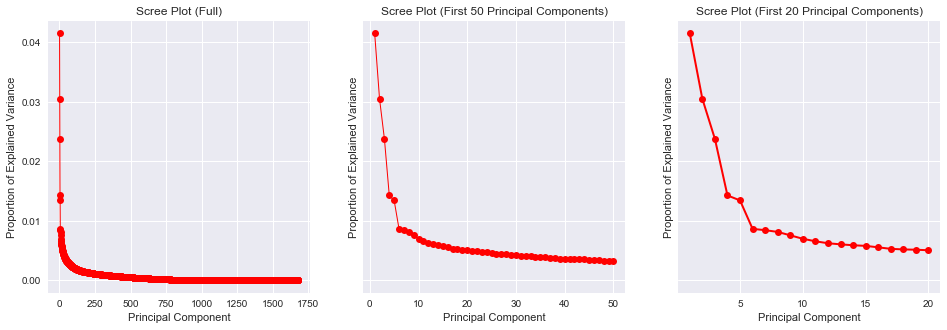

In [250]:
# Optimal number of principle components
n = len(TL_dfTrain)
# Initialize
fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize = (16, 5), sharey=True)
# 1
eigen_vals = np.arange(n) + 1
ax1.plot(eigen_vals, pca.explained_variance_ratio_, 'ro-', linewidth=1)
ax1.set_title('Scree Plot (Full)')
ax1.set_xlabel('Principal Component')
ax1.set_ylabel('Proportion of Explained Variance')
# 2
eigen_vals = np.arange(50) + 1
ax2.plot(eigen_vals, pca.explained_variance_ratio_[:50], 'ro-', linewidth=1)
ax2.set_title('Scree Plot (First 50 Principal Components)')
ax2.set_xlabel('Principal Component')
ax2.set_ylabel('Proportion of Explained Variance')
# 3
eigen_vals = np.arange(20) + 1
ax3.plot(eigen_vals, pca.explained_variance_ratio_[:20], 'ro-', linewidth=2)
ax3.set_title('Scree Plot (First 20 Principal Components)')
ax3.set_xlabel('Principal Component')
ax3.set_ylabel('Proportion of Explained Variance')
# Plot
plt.show()

According to the elbow point, I'll choose the first 6 principal components as my covariates.

In [251]:
TL_dfTrain['pca_reduced_6'] = TL_dfTrain['pca'].apply(lambda x: x[:6])

In [252]:
# Fit a logistic regression
logistic = sklearn.linear_model.LogisticRegression()
logistic.fit(np.stack(TL_dfTrain['pca_reduced_6'], axis=0), TL_dfTrain['category'])
# Performance on the training dataset
logistic.score(np.stack(TL_dfTrain['pca_reduced_6'], axis=0), TL_dfTrain['category'])

0.6214285714285714

In [253]:
# Apply the model on testing dataset

#Create vectors
TFVects_test = TFVectorizer.transform(TL_dfTest['text'])
TL_dfTest['vect'] = [np.array(v).flatten() for v in TFVects_test.todense()]

#PCA
reduced_data_test = pca.transform(np.stack(TL_dfTest['vect'], axis=0))
TL_dfTest['pca'] = [r for r in reduced_data_test]
TL_dfTest['pca_reduced_6'] = TL_dfTest['pca'].apply(lambda x: x[:6])

#Test
logistic.score(np.stack(TL_dfTest['pca_reduced_6'], axis=0), TL_dfTest['category'])

0.6333333333333333

In [254]:
# With panelty
logistic_l2= sklearn.linear_model.LogisticRegression(penalty='l2')
logistic_l2.fit(np.stack(TL_dfTrain['vect'], axis=0), TL_dfTrain['category'])

# Training data
print('Training: ', logistic_l2.score(np.stack(TL_dfTrain['vect'], axis=0), TL_dfTrain['category']))

# Testing data
print('Testing: ', logistic_l2.score(np.stack(TL_dfTest['vect'], axis=0), TL_dfTest['category']))

Training:  0.9357142857142857
Testing:  0.8513888888888889


In [255]:
lucem_illud.evaluateClassifier(logistic_l2, TL_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.850753,0.810794,0.148611,0.856021,0.862797
most_popular,0.850753,0.786066,0.148611,0.846154,0.838710


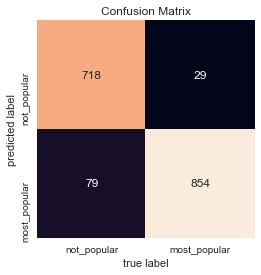

In [256]:
# Confusion Matrix for Training Data
TL_dfTest['logistic_penalty_predict'] = logistic_l2.predict(np.stack(TL_dfTest['vect'], axis=0))
lucem_illud.plotConfusionMatrix(logistic_l2, TL_dfTrain)

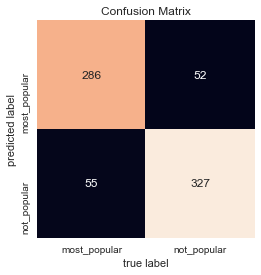

In [257]:
# Confusion Matrix for Testing Data
lucem_illud.plotConfusionMatrix(logistic_l2, TL_dfTest)

In [258]:
print('Accuracy: ', sklearn.metrics.accuracy_score(TL_dfTest['category'], TL_dfTest['logistic_penalty_predict']))
print('Precision: ', sklearn.metrics.precision_score(TL_dfTest['category'], TL_dfTest['logistic_penalty_predict'], average = 'weighted'))
print('Recall: ', sklearn.metrics.recall_score(TL_dfTest['category'], TL_dfTest['logistic_penalty_predict'], average = 'weighted'))
print('F-measures: ', sklearn.metrics.f1_score(TL_dfTest['category'], TL_dfTest['logistic_penalty_predict'], average = 'weighted'))

Accuracy:  0.8513888888888889
Precision:  0.8513477759878283
Recall:  0.8513888888888889
F-measures:  0.8513535134398214


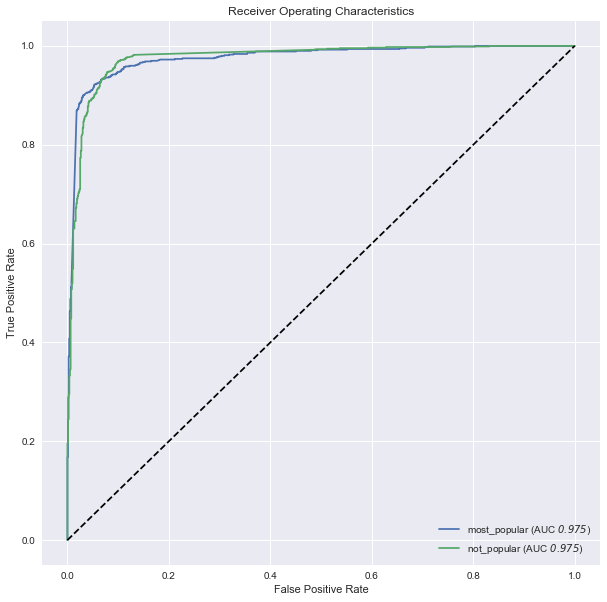

In [259]:
# ROC for Training Data
lucem_illud.plotMultiROC(logistic_l2, TL_dfTrain)

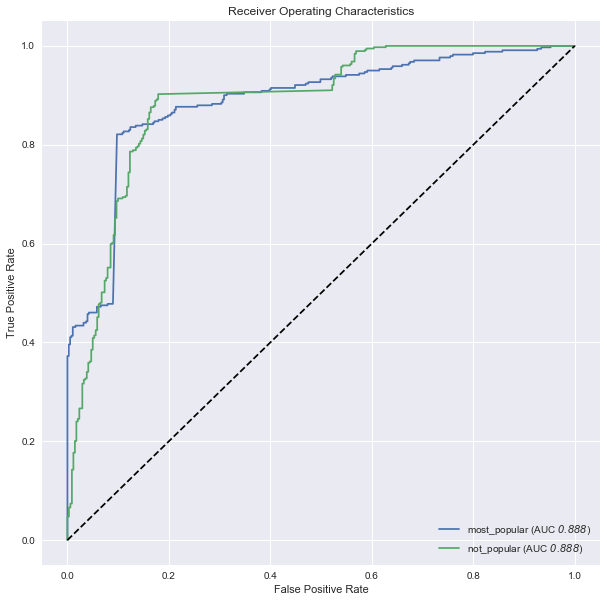

In [260]:
# ROC for Testing Data
lucem_illud.plotMultiROC(logistic_l2, TL_dfTest)

### 3b. Multinomial Naïve Bayes Classification

In [261]:
# Train the model
MultinomialNB = sklearn.naive_bayes.MultinomialNB()
MultinomialNB.fit(np.stack(TL_dfTrain['vect'], axis = 0), TL_dfTrain['category'])

TL_dfTrain['nb_predict'] = MultinomialNB.predict(np.stack(TL_dfTrain['vect'], axis=0))
TL_dfTest['nb_predict'] = MultinomialNB.predict(np.stack(TL_dfTest['vect'], axis=0))
print("Training score:")
print(MultinomialNB.score(np.stack(TL_dfTrain['vect'], axis=0), TL_dfTrain['category']))
print("Testing:")
print(MultinomialNB.score(np.stack(TL_dfTest['vect'], axis=0), TL_dfTest['category']))

Training score:
0.763095238095238
Testing:
0.7055555555555556


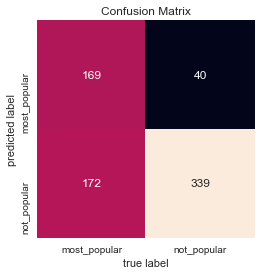

In [262]:
lucem_illud.plotConfusionMatrix(MultinomialNB, TL_dfTest)

In [263]:
print('Accuracy: ', sklearn.metrics.accuracy_score(TL_dfTest['category'], TL_dfTest['nb_predict']))
print('Precision: ', sklearn.metrics.precision_score(TL_dfTest['category'], TL_dfTest['nb_predict'], average='weighted'))
print('Recall: ', sklearn.metrics.recall_score(TL_dfTest['category'], TL_dfTest['nb_predict'], average='weighted'))
print('F-measures: ', sklearn.metrics.f1_score(TL_dfTest['category'], TL_dfTest['nb_predict'], average='weighted'))

Accuracy:  0.7055555555555556
Precision:  0.7321769034458293
Recall:  0.7055555555555556
F-measures:  0.6920574282147317


In [264]:
lucem_illud.metrics.evaluateClassifier(MultinomialNB, TL_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.69503,0.648944,0.294444,0.663405,0.894459
most_popular,0.69503,0.639638,0.294444,0.808612,0.495601


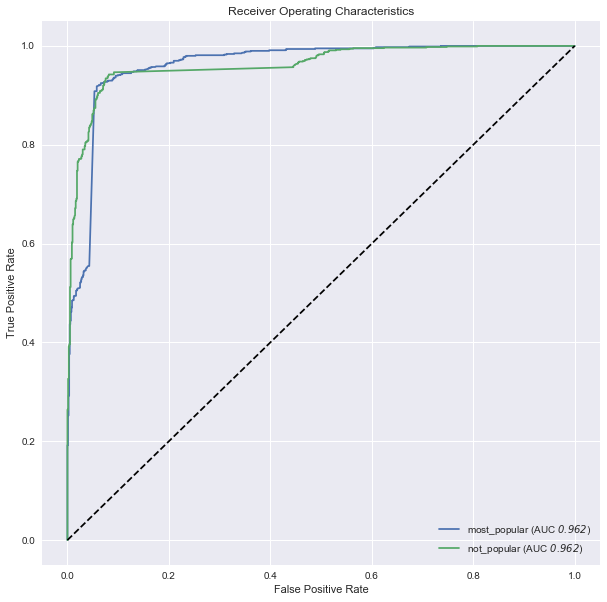

In [265]:
# ROC visualization on training dataset
lucem_illud.plotMultiROC(MultinomialNB, TL_dfTrain)

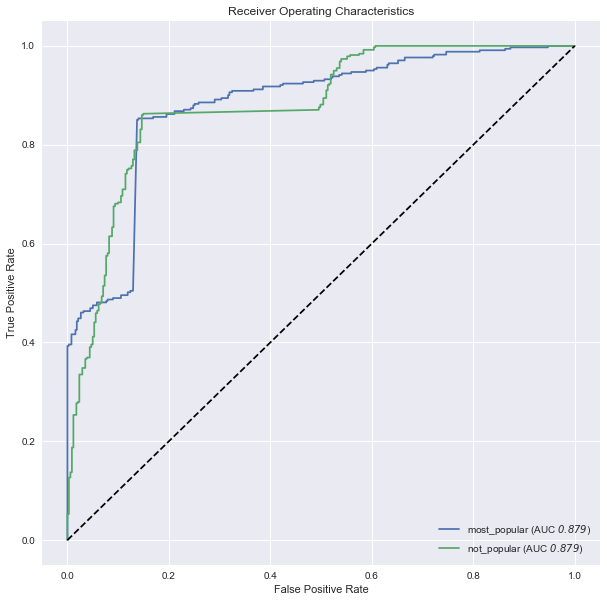

In [266]:
# ROC visualization on testing dataset
lucem_illud.plotMultiROC(MultinomialNB, TL_dfTest)

### 3c. Decision Tree

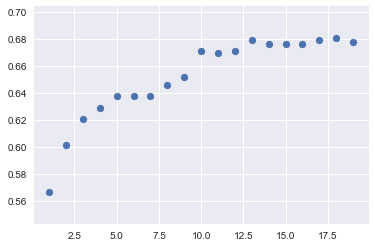

In [267]:
depthvec = []
scorevec = []
for i in range(1,20):
    tree2 = sklearn.tree.DecisionTreeClassifier(max_depth=i,random_state=0)
    tree2.fit(np.stack(TL_dfTrain['vect'], axis =0), TL_dfTrain['category'])
    score = sklearn.metrics.accuracy_score(TL_dfTest['category'], tree2.predict(np.stack(TL_dfTest['vect'], axis = 0)))
    depthvec.append(i)
    scorevec.append(score)
plt.scatter(depthvec,scorevec)
plt.show()

From the plot above, we can find the optimal layers of the decision tree. So we can choose 13 layers.

In [268]:
clf_tree = sklearn.tree.DecisionTreeClassifier(max_depth=13,random_state=0)
clf_tree.fit(np.stack(TL_dfTrain['vect'], axis =0), TL_dfTrain['category'])

TL_dfTest['decision_tree_predict'] = clf_tree.predict(np.stack(TL_dfTest['vect'], axis=0))

In [269]:
lucem_illud.evaluateClassifier(clf_tree, TL_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.662172,0.622205,0.320833,0.623746,0.984169
most_popular,0.662172,0.635946,0.320833,0.950820,0.340176


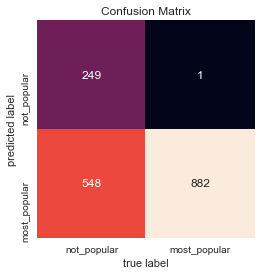

In [270]:
# Confusion Matrix for training dataset
lucem_illud.plotConfusionMatrix(clf_tree, TL_dfTrain)

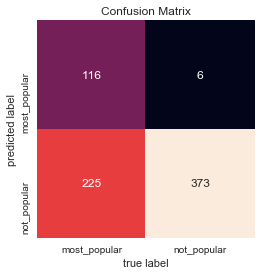

In [271]:
# Confusion Matrix for testing dataset
lucem_illud.plotConfusionMatrix(clf_tree, TL_dfTest)

In [272]:
print('Accuracy: ', sklearn.metrics.accuracy_score(TL_dfTest['category'], TL_dfTest['decision_tree_predict']))
print('Precision: ', sklearn.metrics.precision_score(TL_dfTest['category'], TL_dfTest['decision_tree_predict'], average='weighted'))
print('Recall: ', sklearn.metrics.recall_score(TL_dfTest['category'], TL_dfTest['decision_tree_predict'], average='weighted'))
print('F-measures: ', sklearn.metrics.f1_score(TL_dfTest['category'],TL_dfTest['decision_tree_predict'], average='weighted'))

Accuracy:  0.6791666666666667
Precision:  0.7786516302063344
Recall:  0.6791666666666667
F-measures:  0.6392475275468238


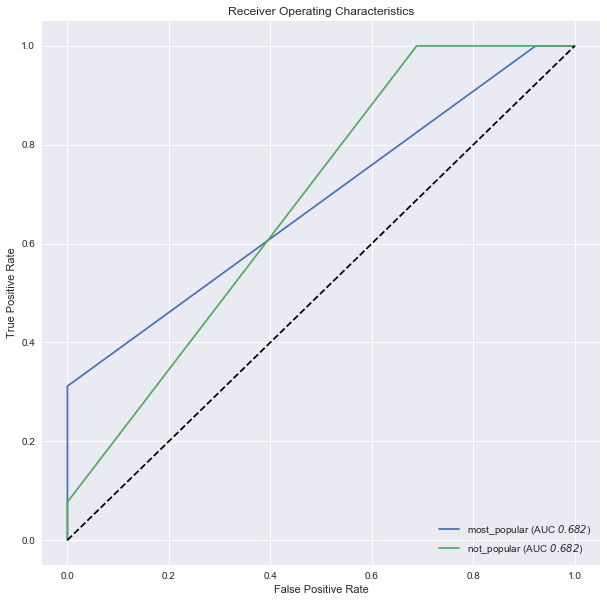

In [273]:
# ROC for training dataset
lucem_illud.plotMultiROC(clf_tree, TL_dfTrain)

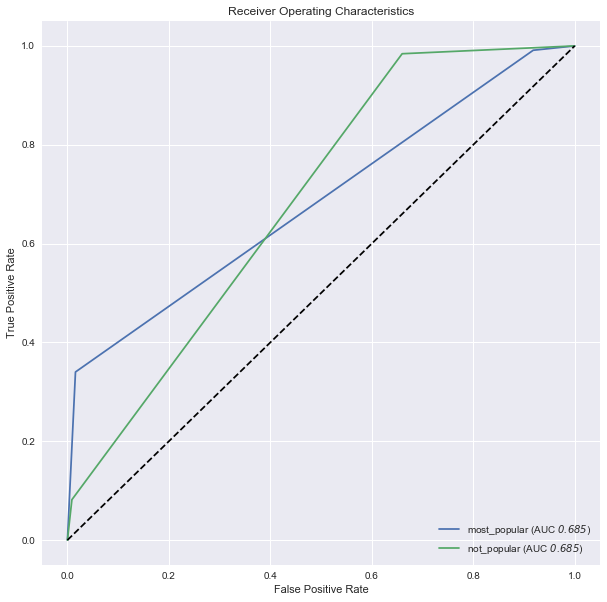

In [274]:
# ROC for testing dataset
lucem_illud.plotMultiROC(clf_tree, TL_dfTest)

The decision tree is still non-ideal.

### 3d. Bagging Trees

In [275]:
tree = sklearn.tree.DecisionTreeClassifier(max_depth=10)
bag = sklearn.ensemble.BaggingClassifier(tree, n_estimators=100, max_samples=0.8, random_state=1)
bag.fit(np.stack(TL_dfTrain['vect'], axis =0), TL_dfTrain['category'])
TL_dfTest['random_forest_predict'] = bag.predict(np.stack(TL_dfTest['vect'], axis=0))

In [276]:
print('Accuracy Score: ', sklearn.metrics.accuracy_score(TL_dfTest['category'], TL_dfTest['random_forest_predict']))
print('Precision Score: ', sklearn.metrics.precision_score(TL_dfTest['category'], TL_dfTest['random_forest_predict'], average = 'weighted'))
print('Recall: ', sklearn.metrics.recall_score(TL_dfTest['category'], TL_dfTest['random_forest_predict'], average = 'weighted'))
print('F1 Score: ', sklearn.metrics.f1_score(TL_dfTest['category'], TL_dfTest['random_forest_predict'], average = 'weighted'))

Accuracy Score:  0.6861111111111111
Precision Score:  0.776250736214253
Recall:  0.6861111111111111
F1 Score:  0.6503319987237555


In [277]:
lucem_illud.evaluateClassifier(bag, TL_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.669798,0.627697,0.313889,0.629881,0.978892
most_popular,0.669798,0.641454,0.313889,0.938931,0.360704


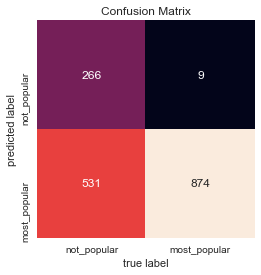

In [278]:
# Confusion Matrix with training dataset
lucem_illud.plotConfusionMatrix(bag, TL_dfTrain)

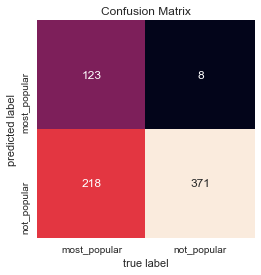

In [279]:
# Confusion Matrix with testing dataset
lucem_illud.plotConfusionMatrix(bag, TL_dfTest)

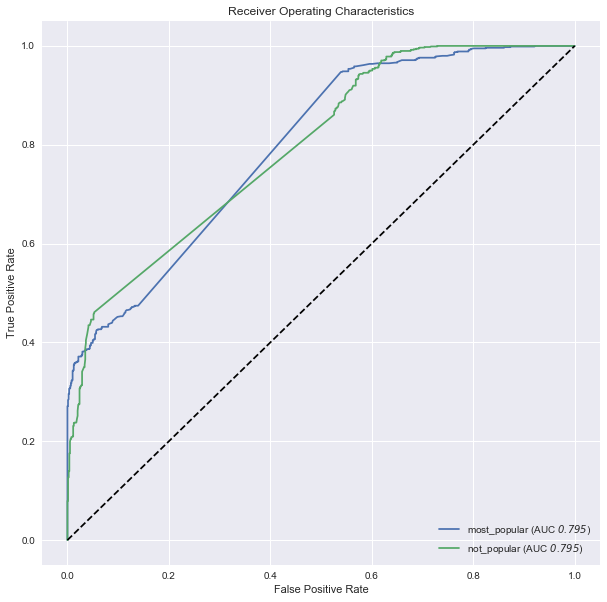

In [280]:
# ROC for training dataset
lucem_illud.plotMultiROC(bag, TL_dfTrain)

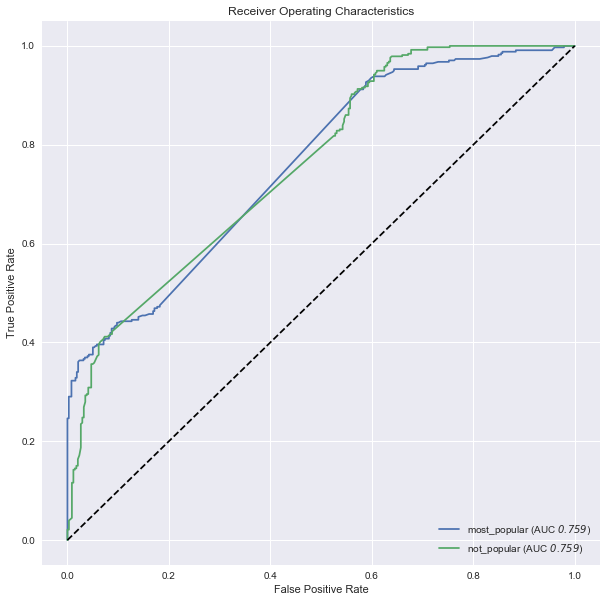

In [281]:
# ROC for testing dataset
lucem_illud.plotMultiROC(bag, TL_dfTest)

### 3e. Random Forest

In [282]:
clf_rf = sklearn.ensemble.RandomForestClassifier()
clf_rf.fit(np.stack(TL_dfTrain['vect'], axis =0), TL_dfTrain['category'])
TL_dfTest['rf_not_bagging'] = clf_rf.predict(np.stack(TL_dfTest['vect'], axis=0))

In [283]:
print('Accuracy: ', sklearn.metrics.accuracy_score(TL_dfTest['category'], TL_dfTest['rf_not_bagging']))
print('Precision: ', sklearn.metrics.precision_score(TL_dfTest['category'], TL_dfTest['rf_not_bagging'], average='weighted'))
print('Recall: ', sklearn.metrics.recall_score(TL_dfTest['category'], TL_dfTest['rf_not_bagging'], average='weighted'))
print('F1 Score: ', sklearn.metrics.f1_score(TL_dfTest['category'], TL_dfTest['rf_not_bagging'], average='weighted'))

Accuracy:  0.8027777777777778
Precision:  0.8106647809655723
Recall:  0.8027777777777778
F1 Score:  0.8025007097162078


In [284]:
lucem_illud.evaluateClassifier(clf_rf, TL_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.806049,0.776392,0.197222,0.862385,0.744063
most_popular,0.806049,0.716287,0.197222,0.753181,0.868035


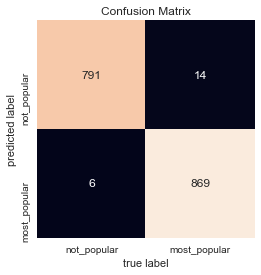

In [285]:
# Confusion Matrix for training dataset
lucem_illud.plotConfusionMatrix(clf_rf, TL_dfTrain)

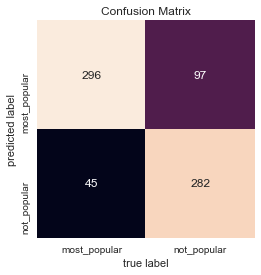

In [286]:
# Confusion Matrix for testing dataset
lucem_illud.plotConfusionMatrix(clf_rf, TL_dfTest)

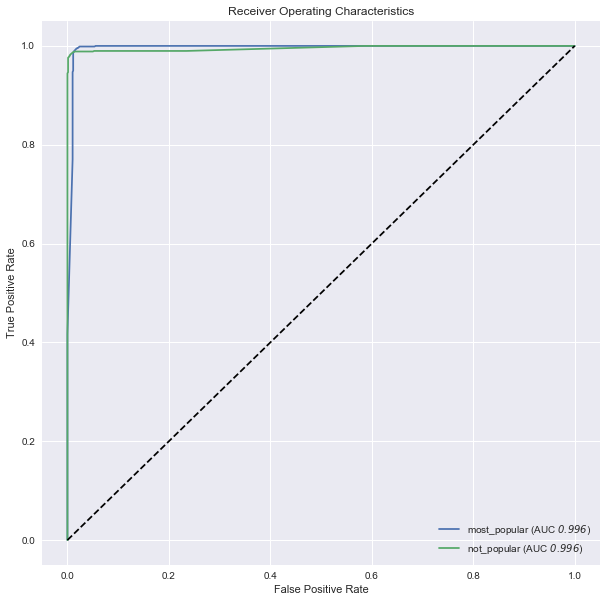

In [287]:
# ROC for training dataset
lucem_illud.plotMultiROC(clf_rf, TL_dfTrain)

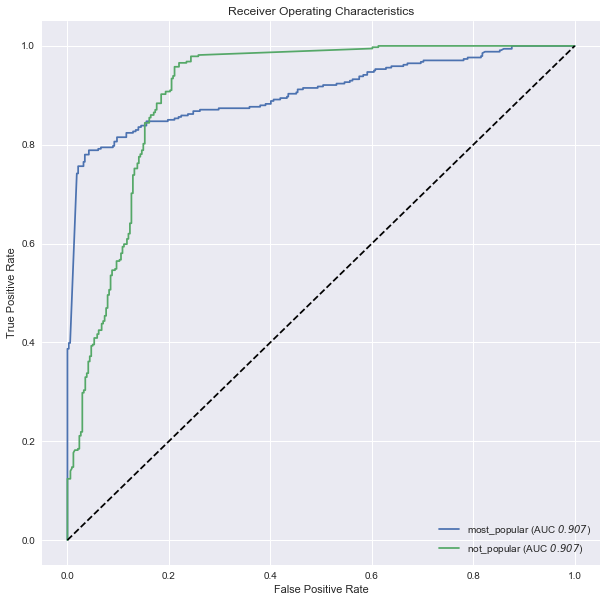

In [288]:
# ROC for testing dataset
lucem_illud.plotMultiROC(clf_rf, TL_dfTest)

### 3f. K-Nearest Neighbors

In [289]:
n_neighbors = 5
weights="uniform"
clf_knn = sklearn.neighbors.KNeighborsClassifier(n_neighbors, weights=weights)
clf_knn.fit(np.stack(TL_dfTrain['vect'], axis = 0), TL_dfTrain['category'])
TL_dfTest['knn_predict'] = clf_knn.predict(np.stack(TL_dfTest['vect'], axis=0))

In [290]:
print('Accuracy: ', sklearn.metrics.accuracy_score(TL_dfTest['category'], TL_dfTest['knn_predict']))
print('Precision: ', sklearn.metrics.precision_score(TL_dfTest['category'], TL_dfTest['knn_predict'], average='weighted'))
print('Recall: ', sklearn.metrics.recall_score(TL_dfTest['category'], TL_dfTest['knn_predict'], average='weighted'))
print('F1 Score: ', sklearn.metrics.f1_score(TL_dfTest['category'], TL_dfTest['knn_predict'], average='weighted'))

Accuracy:  0.5569444444444445
Precision:  0.7626218120512904
Recall:  0.5569444444444445
F1 Score:  0.46800025649231997


In [291]:
lucem_illud.evaluateClassifier(clf_knn, TL_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.579009,0.600021,0.443056,0.983871,0.160950
most_popular,0.579009,0.516591,0.443056,0.516717,0.997067


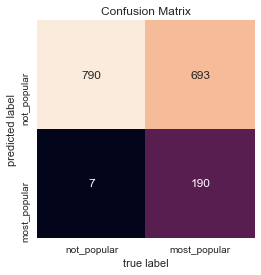

In [292]:
# Confusion Matrix with training dataset
lucem_illud.plotConfusionMatrix(clf_knn, TL_dfTrain)

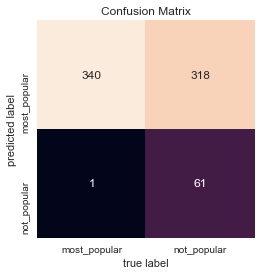

In [293]:
# Confusion Matrix with testing dataset
lucem_illud.plotConfusionMatrix(clf_knn, TL_dfTest)

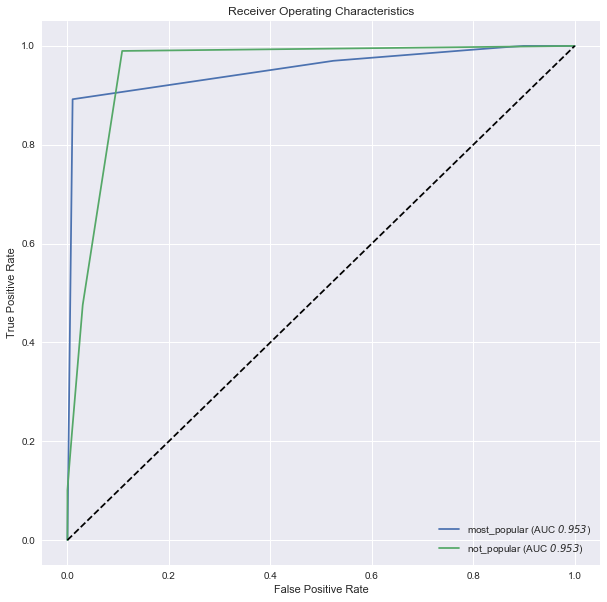

In [294]:
# ROC for training dataset
lucem_illud.plotMultiROC(clf_knn, TL_dfTrain)

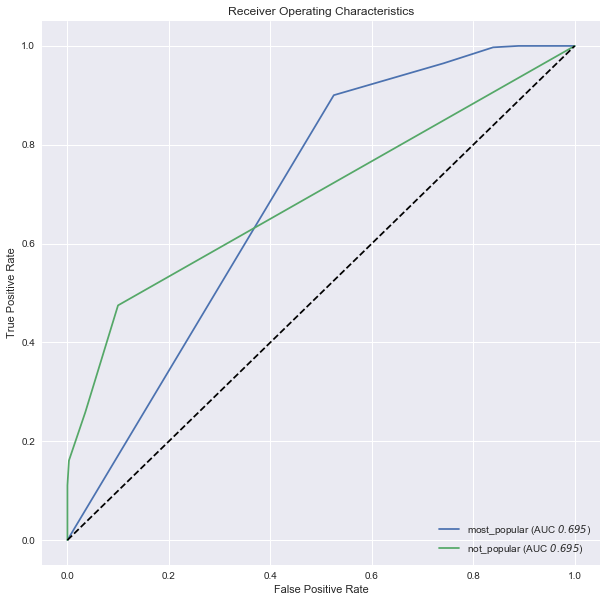

In [295]:
# ROC for testing dataset
lucem_illud.plotMultiROC(clf_knn, TL_dfTest)

However, we find that KNN does not have a good performance on classification and it may be caused the initial value of k selection.

### 3g. SVM

In [296]:
# Linear kernel
clf_svm = sklearn.svm.SVC(kernel='linear', probability = False)
clf_svm.fit(np.stack(TL_dfTrain['vect'], axis=0), TL_dfTrain['category'])
TL_dfTest['svm_predict'] = clf_svm.predict(np.stack(TL_dfTest['vect'], axis=0))

In [297]:
print('Accuracy Score: ', sklearn.metrics.accuracy_score(TL_dfTest['category'], TL_dfTest['svm_predict']))
print('Precision Score: ', sklearn.metrics.precision_score(TL_dfTest['category'], TL_dfTest['svm_predict'], average = 'weighted'))
print('Recall: ', sklearn.metrics.recall_score(TL_dfTest['category'], TL_dfTest['svm_predict'], average = 'weighted'))
print('F1 Score: ', sklearn.metrics.f1_score(TL_dfTest['category'], TL_dfTest['svm_predict'], average = 'weighted'))

Accuracy Score:  0.8319444444444445
Precision Score:  0.8335914217174055
Recall:  0.8319444444444445
F1 Score:  0.8320602417028183


In [298]:
lucem_illud.evaluateClassifier(clf_svm, TL_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.833019,0.797775,0.168056,0.860335,0.812665
most_popular,0.833019,0.755443,0.168056,0.803867,0.853372


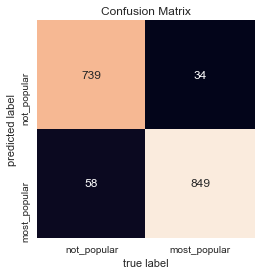

In [299]:
# Confusion Matrix for training dataset
lucem_illud.plotConfusionMatrix(clf_svm, TL_dfTrain)

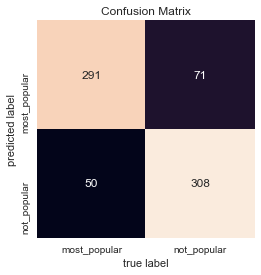

In [300]:
# Confusion Matrix with testing dataset
lucem_illud.plotConfusionMatrix(clf_svm, TL_dfTest)

### 3h. Simple Neural Nets

In [301]:
clf_nn = sklearn.neural_network.MLPClassifier()
clf_nn.fit(np.stack(TL_dfTrain['vect'], axis=0), TL_dfTrain['category'])
TL_dfTest['nn_predict'] = clf_nn.predict(np.stack(TL_dfTest['vect'], axis=0))

In [302]:
print('Accuracy: ', sklearn.metrics.accuracy_score(TL_dfTest['category'], TL_dfTest['nn_predict']))
print('Precision: ', sklearn.metrics.precision_score(TL_dfTest['category'], TL_dfTest['nn_predict'], average='weighted'))
print('Recall: ', sklearn.metrics.recall_score(TL_dfTest['category'], TL_dfTest['nn_predict'], average='weighted'))
print('F1 Score: ', sklearn.metrics.f1_score(TL_dfTest['category'], TL_dfTest['nn_predict'], average='weighted'))

Accuracy:  0.8125
Precision:  0.816038337300238
Recall:  0.8125
F1 Score:  0.8125596816976127


In [303]:
lucem_illud.evaluateClassifier(clf_nn, TL_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.814402,0.780301,0.1875,0.852601,0.778364
most_popular,0.814402,0.730265,0.1875,0.775401,0.850440


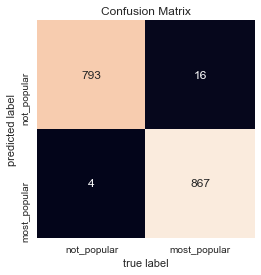

In [304]:
# Confusion Matrix with training dataset
lucem_illud.plotConfusionMatrix(clf_nn, TL_dfTrain)

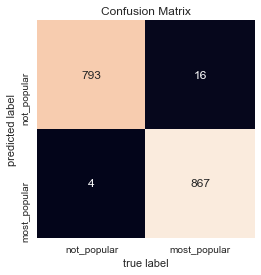

In [305]:
# Confusion Matrix with testing dataset
lucem_illud.plotConfusionMatrix(clf_nn, TL_dfTrain)

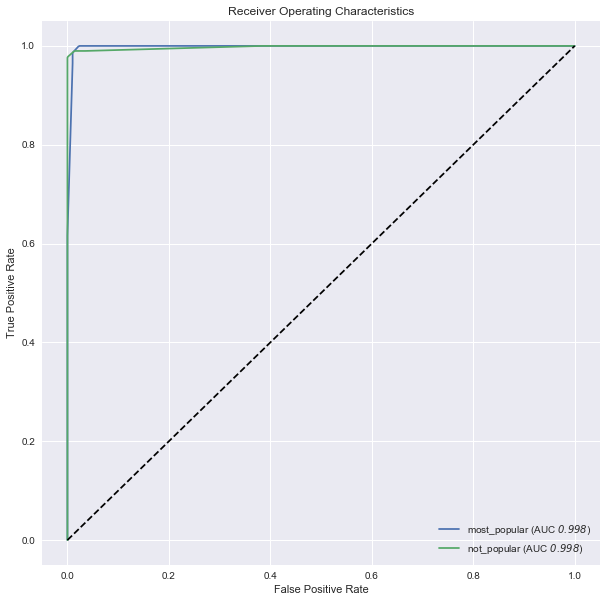

In [306]:
# ROC for training dataset
lucem_illud.plotMultiROC(clf_nn, TL_dfTrain)

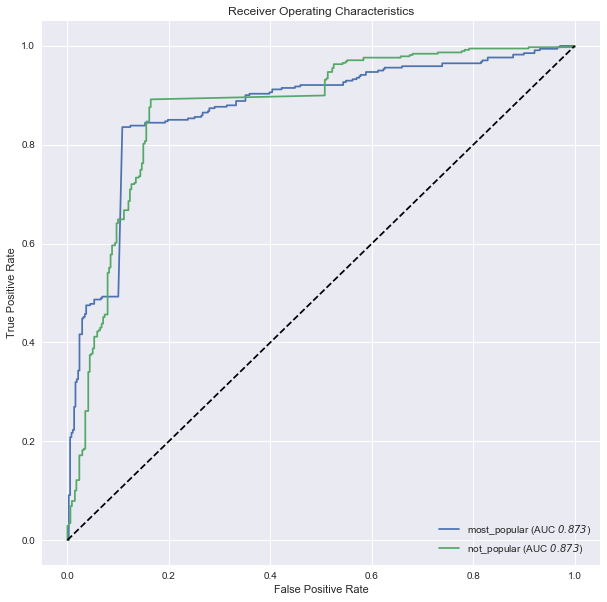

In [307]:
# ROC for Testing dataset
lucem_illud.plotMultiROC(clf_nn, TL_dfTest)

## 4. Twitter UnderArmour

In [308]:
# Turn the training dataset into a tf-idf matrix
TFVectorizer = sklearn.feature_extraction.text.TfidfVectorizer(max_df=100, min_df=2, stop_words='english', norm='l2')
TFVects = TFVectorizer.fit_transform(twt_udar['text'])
twt_udar['vect'] = [np.array(v).flatten() for v in TFVects.todense()]

In [309]:
# split the dataset into training data and testing data
holdBackFraction = .2
TU_dfTrain, TU_dfTest = lucem_illud.trainTestSplit(twt_udar, holdBackFraction=holdBackFraction)

### 4a. Logistic Classification

In [310]:
# Implement PCA
pca = sklearn.decomposition.PCA()
reduced_data = pca.fit_transform(np.stack(TU_dfTrain['vect'], axis=0))
TU_dfTrain['pca'] = [r for r in reduced_data]

In [311]:
# Logistic classfication without dimension reduction
logistic_full = sklearn.linear_model.LogisticRegression()
logistic_full.fit(np.stack(TU_dfTrain['vect'], axis=0), TU_dfTrain['category'])
# Training data
print(logistic_full.score(np.stack(TU_dfTrain['vect'], axis=0), TU_dfTrain['category']))
# Testing data
print(logistic_full.score(np.stack(TU_dfTest['vect'], axis=0), TU_dfTest['category']))

0.8869791666666667
0.7916666666666666


In [312]:
lucem_illud.evaluateClassifier(logistic_full, TU_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.793834,0.710108,0.208333,0.735192,0.897872
most_popular,0.793834,0.762352,0.208333,0.875648,0.689796


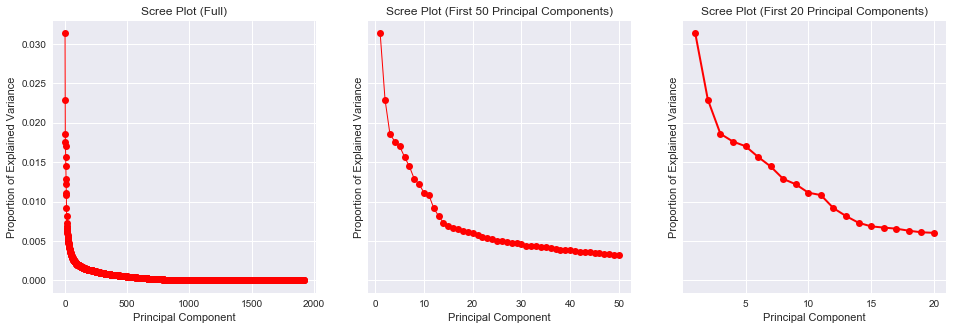

In [313]:
# Optimal number of principle components
n = len(TU_dfTrain)
# Initialize
fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize = (16, 5), sharey=True)
# 1
eigen_vals = np.arange(n) + 1
ax1.plot(eigen_vals, pca.explained_variance_ratio_, 'ro-', linewidth=1)
ax1.set_title('Scree Plot (Full)')
ax1.set_xlabel('Principal Component')
ax1.set_ylabel('Proportion of Explained Variance')
# 2
eigen_vals = np.arange(50) + 1
ax2.plot(eigen_vals, pca.explained_variance_ratio_[:50], 'ro-', linewidth=1)
ax2.set_title('Scree Plot (First 50 Principal Components)')
ax2.set_xlabel('Principal Component')
ax2.set_ylabel('Proportion of Explained Variance')
# 3
eigen_vals = np.arange(20) + 1
ax3.plot(eigen_vals, pca.explained_variance_ratio_[:20], 'ro-', linewidth=2)
ax3.set_title('Scree Plot (First 20 Principal Components)')
ax3.set_xlabel('Principal Component')
ax3.set_ylabel('Proportion of Explained Variance')
# Plot
plt.show()

According to the elbow point, I'll choose the first 15 principal components as my covariates.

In [315]:
TU_dfTrain['pca_reduced_15'] = TU_dfTrain['pca'].apply(lambda x: x[:15])

In [316]:
# Fit a logistic regression
logistic = sklearn.linear_model.LogisticRegression()
logistic.fit(np.stack(TU_dfTrain['pca_reduced_15'], axis=0), TU_dfTrain['category'])
# Performance on the training dataset
logistic.score(np.stack(TU_dfTrain['pca_reduced_15'], axis=0), TU_dfTrain['category'])

0.6463541666666667

In [317]:
# Apply the model on testing dataset

#Create vectors
TFVects_test = TFVectorizer.transform(TU_dfTest['text'])
TU_dfTest['vect'] = [np.array(v).flatten() for v in TFVects_test.todense()]

#PCA
reduced_data_test = pca.transform(np.stack(TU_dfTest['vect'], axis=0))
TU_dfTest['pca'] = [r for r in reduced_data_test]
TU_dfTest['pca_reduced_15'] = TU_dfTest['pca'].apply(lambda x: x[:15])

#Test
logistic.score(np.stack(TU_dfTest['pca_reduced_15'], axis=0), TU_dfTest['category'])

0.6166666666666667

In [318]:
# With panelty
logistic_l2= sklearn.linear_model.LogisticRegression(penalty='l2')
logistic_l2.fit(np.stack(TU_dfTrain['vect'], axis=0), TU_dfTrain['category'])

# Training data
print('Training: ', logistic_l2.score(np.stack(TU_dfTrain['vect'], axis=0), TU_dfTrain['category']))

# Testing data
print('Testing: ', logistic_l2.score(np.stack(TU_dfTest['vect'], axis=0), TU_dfTest['category']))

Training:  0.8869791666666667
Testing:  0.7916666666666666


In [319]:
lucem_illud.evaluateClassifier(logistic_l2, TU_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.793834,0.710108,0.208333,0.735192,0.897872
most_popular,0.793834,0.762352,0.208333,0.875648,0.689796


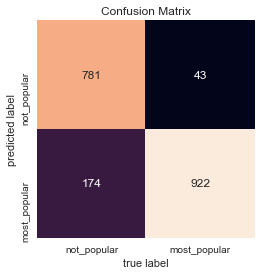

In [320]:
# Confusion Matrix for Training Data
TU_dfTest['logistic_penalty_predict'] = logistic_l2.predict(np.stack(TU_dfTest['vect'], axis=0))
lucem_illud.plotConfusionMatrix(logistic_l2, TU_dfTrain)

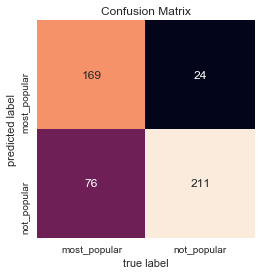

In [321]:
# Confusion Matrix for Testing Data
lucem_illud.plotConfusionMatrix(logistic_l2, TU_dfTest)

In [322]:
print('Accuracy: ', sklearn.metrics.accuracy_score(TU_dfTest['category'], TU_dfTest['logistic_penalty_predict']))
print('Precision: ', sklearn.metrics.precision_score(TU_dfTest['category'], TU_dfTest['logistic_penalty_predict'], average = 'weighted'))
print('Recall: ', sklearn.metrics.recall_score(TU_dfTest['category'], TU_dfTest['logistic_penalty_predict'], average = 'weighted'))
print('F-measures: ', sklearn.metrics.f1_score(TU_dfTest['category'], TU_dfTest['logistic_penalty_predict'], average = 'weighted'))

Accuracy:  0.7916666666666666
Precision:  0.8068827366660047
Recall:  0.7916666666666666
F-measures:  0.7896766038594099


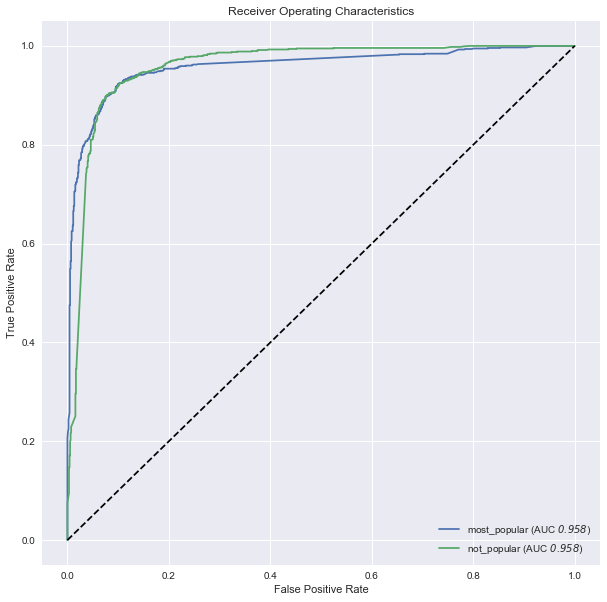

In [323]:
# ROC for Training Data
lucem_illud.plotMultiROC(logistic_l2, TU_dfTrain)

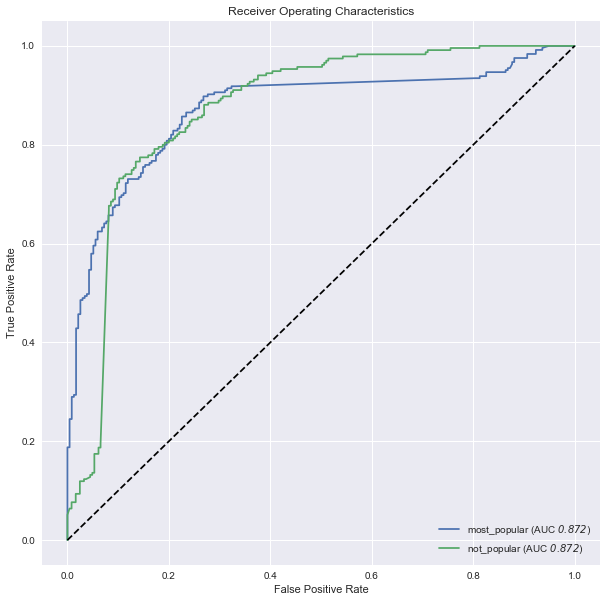

In [324]:
# ROC for Testing Data
lucem_illud.plotMultiROC(logistic_l2, TU_dfTest)

### 4b. Multinomial Naïve Bayes Classification

In [325]:
# Train the model
MultinomialNB = sklearn.naive_bayes.MultinomialNB()
MultinomialNB.fit(np.stack(TU_dfTrain['vect'], axis = 0), TU_dfTrain['category'])

TU_dfTrain['nb_predict'] = MultinomialNB.predict(np.stack(TU_dfTrain['vect'], axis=0))
TU_dfTest['nb_predict'] = MultinomialNB.predict(np.stack(TU_dfTest['vect'], axis=0))
print("Training score:")
print(MultinomialNB.score(np.stack(TU_dfTrain['vect'], axis=0), TU_dfTrain['category']))
print("Testing:")
print(MultinomialNB.score(np.stack(TU_dfTest['vect'], axis=0), TU_dfTest['category']))

Training score:
0.8677083333333333
Testing:
0.7729166666666667


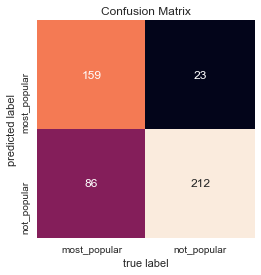

In [326]:
lucem_illud.plotConfusionMatrix(MultinomialNB, TU_dfTest)

In [327]:
print('Accuracy: ', sklearn.metrics.accuracy_score(TU_dfTest['category'], TU_dfTest['nb_predict']))
print('Precision: ', sklearn.metrics.precision_score(TU_dfTest['category'], TU_dfTest['nb_predict'], average='weighted'))
print('Recall: ', sklearn.metrics.recall_score(TU_dfTest['category'], TU_dfTest['nb_predict'], average='weighted'))
print('F-measures: ', sklearn.metrics.f1_score(TU_dfTest['category'], TU_dfTest['nb_predict'], average='weighted'))

Accuracy:  0.7729166666666667
Precision:  0.7942076449836518
Recall:  0.7729166666666667
F-measures:  0.7695851146720798


The performance of this classifier is still unsatisfactory.

In [328]:
lucem_illud.metrics.evaluateClassifier(MultinomialNB, TU_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.775554,0.689699,0.227083,0.711409,0.902128
most_popular,0.775554,0.746132,0.227083,0.873626,0.648980


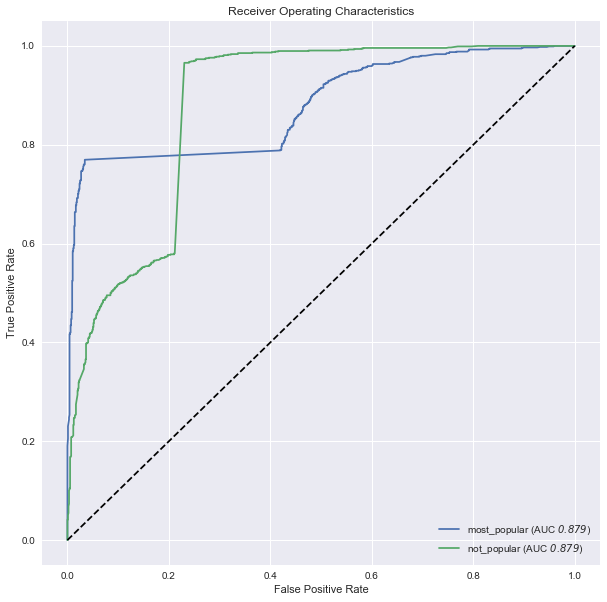

In [329]:
# ROC visualization on training dataset
lucem_illud.plotMultiROC(MultinomialNB, TU_dfTrain)

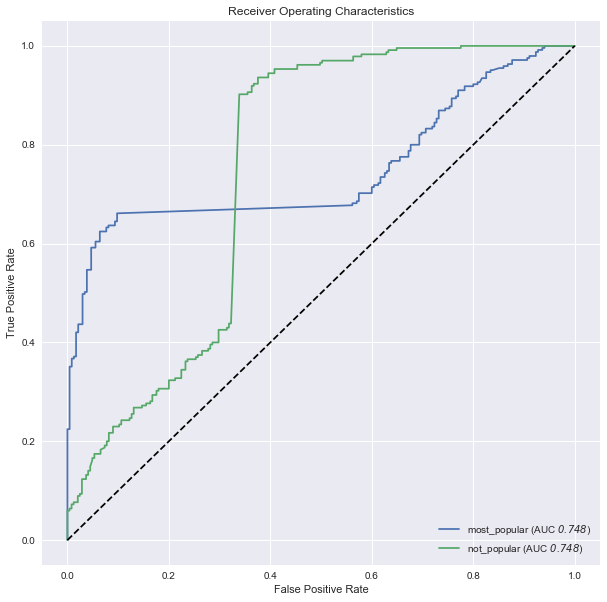

In [330]:
# ROC visualization on testing dataset
lucem_illud.plotMultiROC(MultinomialNB, TU_dfTest)

### 4c. Decision Tree

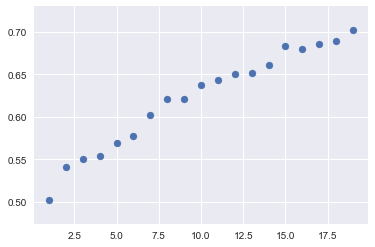

In [331]:
depthvec = []
scorevec = []
for i in range(1,20):
    tree2 = sklearn.tree.DecisionTreeClassifier(max_depth=i,random_state=0)
    tree2.fit(np.stack(TU_dfTrain['vect'], axis =0), TU_dfTrain['category'])
    score = sklearn.metrics.accuracy_score(TU_dfTest['category'], tree2.predict(np.stack(TU_dfTest['vect'], axis = 0)))
    depthvec.append(i)
    scorevec.append(score)
plt.scatter(depthvec,scorevec)
plt.show()

From the plot above, we can find the optimal layers of the decision tree. So we can choose 15 layers.

In [332]:
clf_tree = sklearn.tree.DecisionTreeClassifier(max_depth=15,random_state=0)
clf_tree.fit(np.stack(TU_dfTrain['vect'], axis =0), TU_dfTrain['category'])

TU_dfTest['decision_tree_predict'] = clf_tree.predict(np.stack(TU_dfTest['vect'], axis=0))

In [333]:
lucem_illud.evaluateClassifier(clf_tree, TU_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.687885,0.608689,0.316667,0.620991,0.906383
most_popular,0.687885,0.664845,0.316667,0.839416,0.469388


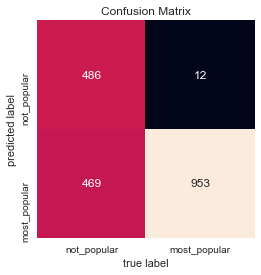

In [334]:
# Confusion Matrix for training dataset
lucem_illud.plotConfusionMatrix(clf_tree, TU_dfTrain)

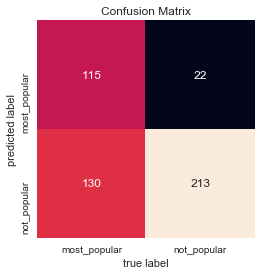

In [335]:
# Confusion Matrix for testing dataset
lucem_illud.plotConfusionMatrix(clf_tree, TU_dfTest)

In [336]:
print('Accuracy: ', sklearn.metrics.accuracy_score(TU_dfTest['category'], TU_dfTest['decision_tree_predict']))
print('Precision: ', sklearn.metrics.precision_score(TU_dfTest['category'], TU_dfTest['decision_tree_predict'], average='weighted'))
print('Recall: ', sklearn.metrics.recall_score(TU_dfTest['category'], TU_dfTest['decision_tree_predict'], average='weighted'))
print('F-measures: ', sklearn.metrics.f1_score(TU_dfTest['category'],TU_dfTest['decision_tree_predict'], average='weighted'))

Accuracy:  0.6833333333333333
Precision:  0.7324789144020485
Recall:  0.6833333333333333
F-measures:  0.6681537105140793


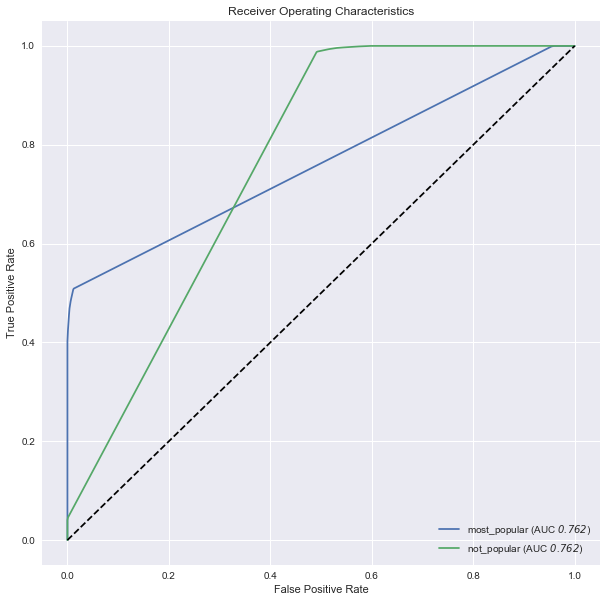

In [337]:
# ROC for training dataset
lucem_illud.plotMultiROC(clf_tree, TU_dfTrain)

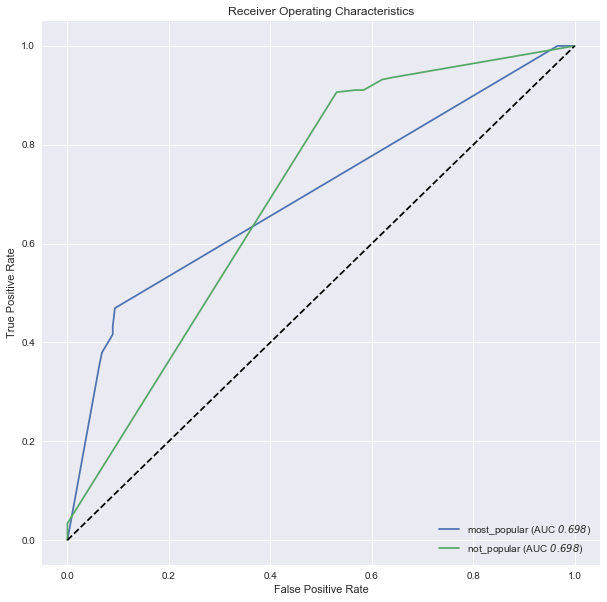

In [338]:
# ROC for testing dataset
lucem_illud.plotMultiROC(clf_tree, TU_dfTest)

The decision tree is still non-ideal.

### 4d. Bagging Trees

In [339]:
tree = sklearn.tree.DecisionTreeClassifier(max_depth=10)
bag = sklearn.ensemble.BaggingClassifier(tree, n_estimators=100, max_samples=0.8, random_state=1)
bag.fit(np.stack(TU_dfTrain['vect'], axis =0), TU_dfTrain['category'])
TU_dfTest['random_forest_predict'] = bag.predict(np.stack(TU_dfTest['vect'], axis=0))

In [340]:
print('Accuracy Score: ', sklearn.metrics.accuracy_score(TU_dfTest['category'], TU_dfTest['random_forest_predict']))
print('Precision Score: ', sklearn.metrics.precision_score(TU_dfTest['category'], TU_dfTest['random_forest_predict'], average = 'weighted'))
print('Recall: ', sklearn.metrics.recall_score(TU_dfTest['category'], TU_dfTest['random_forest_predict'], average = 'weighted'))
print('F1 Score: ', sklearn.metrics.f1_score(TU_dfTest['category'], TU_dfTest['random_forest_predict'], average = 'weighted'))

Accuracy Score:  0.6666666666666666
Precision Score:  0.7204664413966739
Recall:  0.6666666666666666
F1 Score:  0.6479652984370913


In [341]:
lucem_illud.evaluateClassifier(bag, TU_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.671559,0.595861,0.333333,0.606838,0.906383
most_popular,0.671559,0.649753,0.333333,0.829457,0.436735


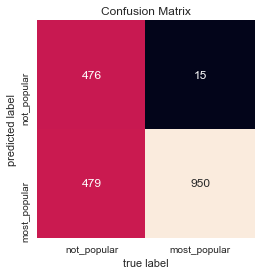

In [342]:
# Confusion Matrix with training dataset
lucem_illud.plotConfusionMatrix(bag, TU_dfTrain)

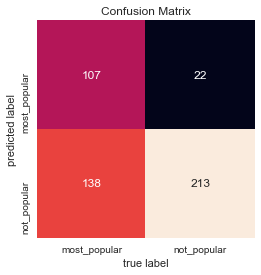

In [343]:
# Confusion Matrix with testing dataset
lucem_illud.plotConfusionMatrix(bag, TU_dfTest)

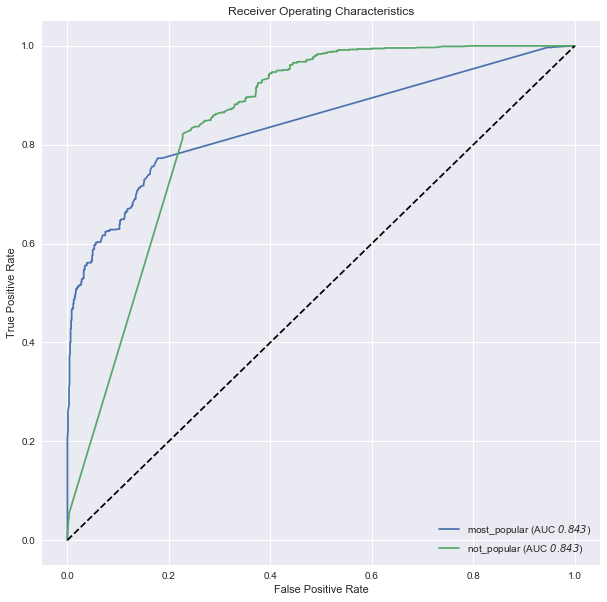

In [344]:
# ROC for training dataset
lucem_illud.plotMultiROC(bag, TU_dfTrain)

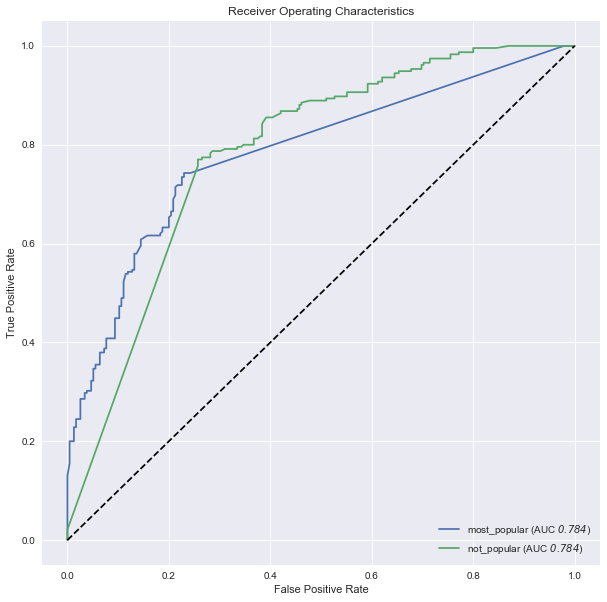

In [345]:
# ROC for testing dataset
lucem_illud.plotMultiROC(bag, TU_dfTest)

### 4e. Random Forest

In [346]:
clf_rf = sklearn.ensemble.RandomForestClassifier()
clf_rf.fit(np.stack(TU_dfTrain['vect'], axis =0), TU_dfTrain['category'])
TU_dfTest['rf_not_bagging'] = clf_rf.predict(np.stack(TU_dfTest['vect'], axis=0))

In [347]:
print('Accuracy: ', sklearn.metrics.accuracy_score(TU_dfTest['category'], TU_dfTest['rf_not_bagging']))
print('Precision: ', sklearn.metrics.precision_score(TU_dfTest['category'], TU_dfTest['rf_not_bagging'], average='weighted'))
print('Recall: ', sklearn.metrics.recall_score(TU_dfTest['category'], TU_dfTest['rf_not_bagging'], average='weighted'))
print('F1 Score: ', sklearn.metrics.f1_score(TU_dfTest['category'], TU_dfTest['rf_not_bagging'], average='weighted'))

Accuracy:  0.8041666666666667
Precision:  0.8094869825947053
Recall:  0.8041666666666667
F1 Score:  0.8036557971014492


In [348]:
lucem_illud.evaluateClassifier(clf_rf, TU_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.805384,0.728393,0.195833,0.766038,0.863830
most_popular,0.805384,0.764933,0.195833,0.851163,0.746939


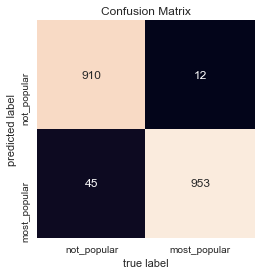

In [349]:
# Confusion Matrix for training dataset
lucem_illud.plotConfusionMatrix(clf_rf, TU_dfTrain)

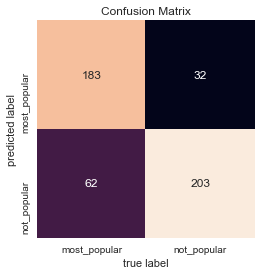

In [350]:
# Confusion Matrix for testing dataset
lucem_illud.plotConfusionMatrix(clf_rf, TU_dfTest)

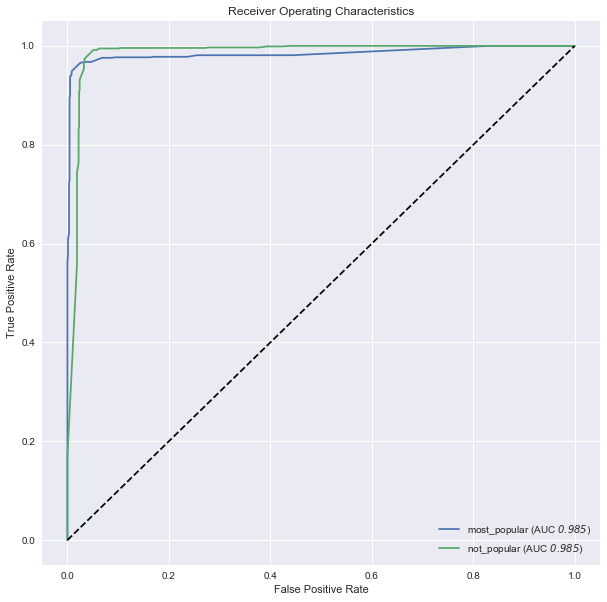

In [351]:
# ROC for training dataset
lucem_illud.plotMultiROC(clf_rf, TU_dfTrain)

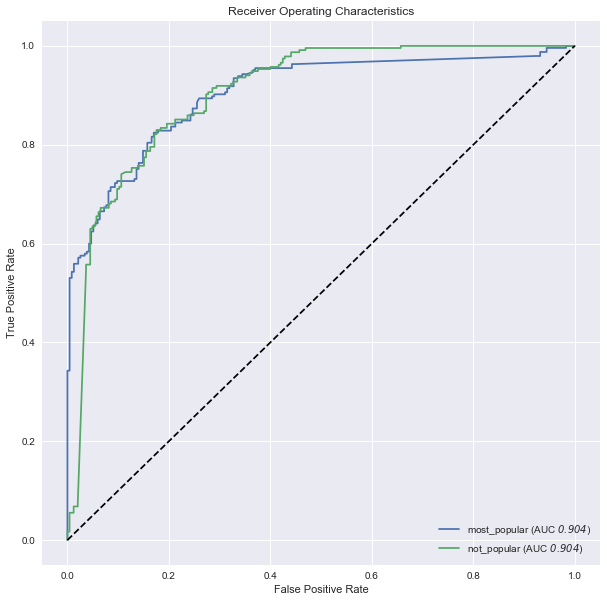

In [352]:
# ROC for testing dataset
lucem_illud.plotMultiROC(clf_rf, TU_dfTest)

### 4f. K-Nearest Neighbors

In [353]:
n_neighbors = 5
weights="uniform"
clf_knn = sklearn.neighbors.KNeighborsClassifier(n_neighbors, weights=weights)
clf_knn.fit(np.stack(TU_dfTrain['vect'], axis = 0), TU_dfTrain['category'])
TU_dfTest['knn_predict'] = clf_knn.predict(np.stack(TU_dfTest['vect'], axis=0))

In [354]:
print('Accuracy: ', sklearn.metrics.accuracy_score(TU_dfTest['category'], TU_dfTest['knn_predict']))
print('Precision: ', sklearn.metrics.precision_score(TU_dfTest['category'], TU_dfTest['knn_predict'], average='weighted'))
print('Recall: ', sklearn.metrics.recall_score(TU_dfTest['category'], TU_dfTest['knn_predict'], average='weighted'))
print('F1 Score: ', sklearn.metrics.f1_score(TU_dfTest['category'], TU_dfTest['knn_predict'], average='weighted'))

Accuracy:  0.7083333333333334
Precision:  0.8044355330940697
Recall:  0.7083333333333334
F1 Score:  0.685794763995337


In [355]:
lucem_illud.evaluateClassifier(clf_knn, TU_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.714025,0.626950,0.291667,0.628726,0.987234
most_popular,0.714025,0.714319,0.291667,0.972973,0.440816


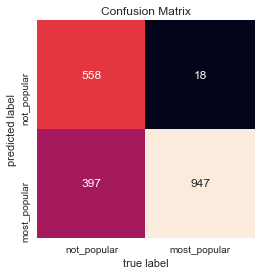

In [356]:
# Confusion Matrix with training dataset
lucem_illud.plotConfusionMatrix(clf_knn, TU_dfTrain)

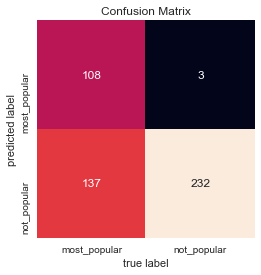

In [357]:
# Confusion Matrix with testing dataset
lucem_illud.plotConfusionMatrix(clf_knn, TU_dfTest)

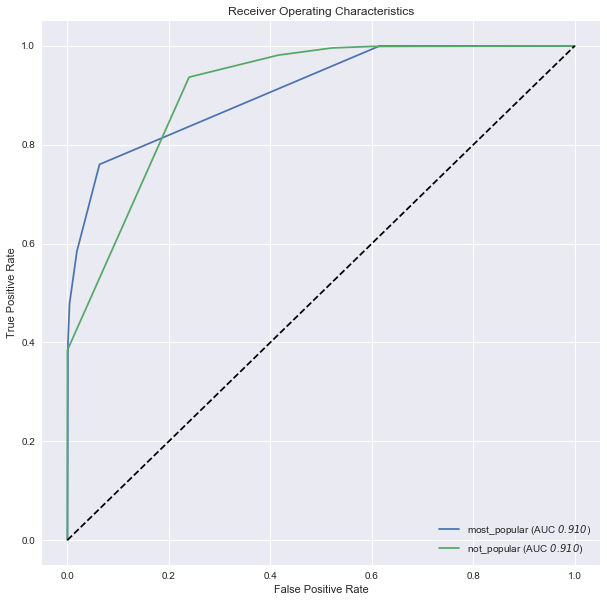

In [358]:
# ROC for training dataset
lucem_illud.plotMultiROC(clf_knn, TU_dfTrain)

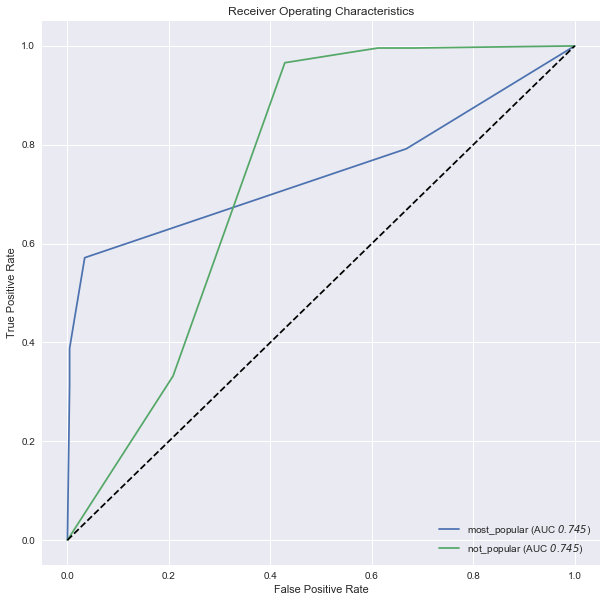

In [359]:
# ROC for testing dataset
lucem_illud.plotMultiROC(clf_knn, TU_dfTest)

However, we find that KNN does not have a good performance on classification and it may be caused the initial value of k selection.

### 4g. SVM

In [360]:
# Linear kernel
clf_svm = sklearn.svm.SVC(kernel='linear', probability = False)
clf_svm.fit(np.stack(TU_dfTrain['vect'], axis=0), TU_dfTrain['category'])
TU_dfTest['svm_predict'] = clf_svm.predict(np.stack(TU_dfTest['vect'], axis=0))

In [361]:
print('Accuracy Score: ', sklearn.metrics.accuracy_score(TU_dfTest['category'], TU_dfTest['svm_predict']))
print('Precision Score: ', sklearn.metrics.precision_score(TU_dfTest['category'], TU_dfTest['svm_predict'], average = 'weighted'))
print('Recall: ', sklearn.metrics.recall_score(TU_dfTest['category'], TU_dfTest['svm_predict'], average = 'weighted'))
print('F1 Score: ', sklearn.metrics.f1_score(TU_dfTest['category'], TU_dfTest['svm_predict'], average = 'weighted'))

Accuracy Score:  0.8
Precision Score:  0.8083381996425475
Recall:  0.8
F1 Score:  0.7990732353146122


In [362]:
lucem_illud.evaluateClassifier(clf_svm, TU_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.801563,0.721877,0.2,0.754579,0.876596
most_popular,0.801563,0.764329,0.2,0.859903,0.726531


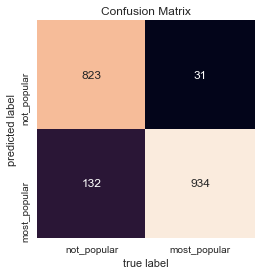

In [363]:
# Confusion Matrix for training dataset
lucem_illud.plotConfusionMatrix(clf_svm, TU_dfTrain)

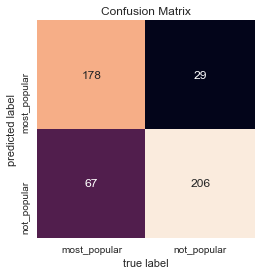

In [364]:
# Confusion Matrix with testing dataset
lucem_illud.plotConfusionMatrix(clf_svm, TU_dfTest)

### 4h. Simple Neural Nets

In [365]:
clf_nn = sklearn.neural_network.MLPClassifier()
clf_nn.fit(np.stack(TU_dfTrain['vect'], axis=0), TU_dfTrain['category'])
TU_dfTest['nn_predict'] = clf_nn.predict(np.stack(TU_dfTest['vect'], axis=0))

In [366]:
print('Accuracy: ', sklearn.metrics.accuracy_score(TU_dfTest['category'], TU_dfTest['nn_predict']))
print('Precision: ', sklearn.metrics.precision_score(TU_dfTest['category'], TU_dfTest['nn_predict'], average='weighted'))
print('Recall: ', sklearn.metrics.recall_score(TU_dfTest['category'], TU_dfTest['nn_predict'], average='weighted'))
print('F1 Score: ', sklearn.metrics.f1_score(TU_dfTest['category'], TU_dfTest['nn_predict'], average='weighted'))

Accuracy:  0.8166666666666667
Precision:  0.8183322024855454
Recall:  0.8166666666666667
F1 Score:  0.8165902658401486


In [367]:
lucem_illud.evaluateClassifier(clf_nn, TU_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.817282,0.746374,0.183333,0.792829,0.846809
most_popular,0.817282,0.772249,0.183333,0.842795,0.787755


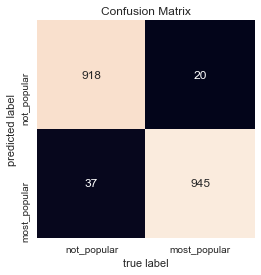

In [368]:
# Confusion Matrix with training dataset
lucem_illud.plotConfusionMatrix(clf_nn, TU_dfTrain)

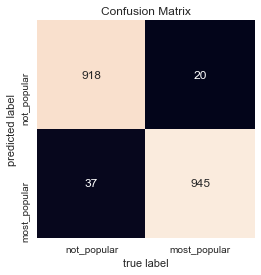

In [369]:
# Confusion Matrix with testing dataset
lucem_illud.plotConfusionMatrix(clf_nn, TU_dfTrain)

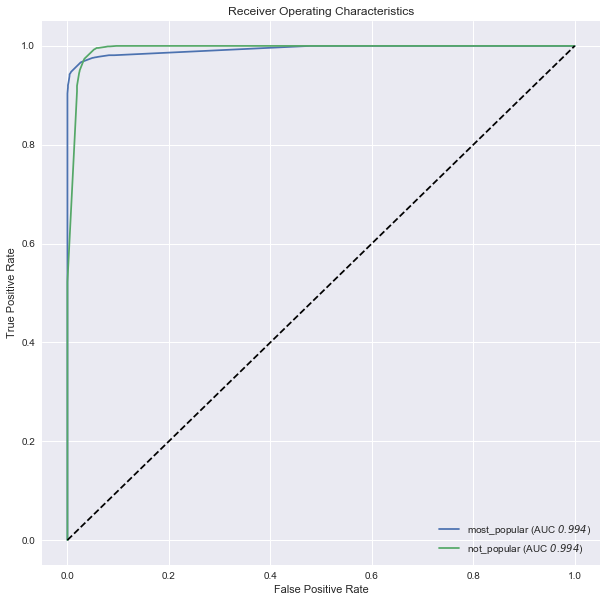

In [370]:
# ROC for training dataset
lucem_illud.plotMultiROC(clf_nn, TU_dfTrain)

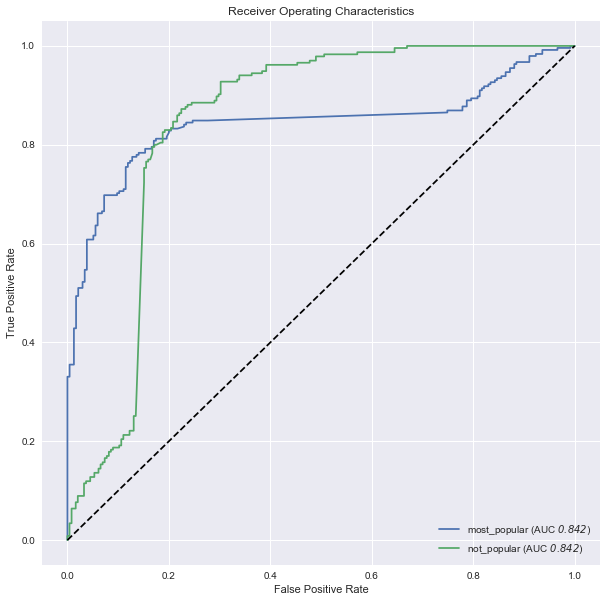

In [371]:
# ROC for Testing dataset
lucem_illud.plotMultiROC(clf_nn, TU_dfTest)

## 5. Instagram Lululemon

In [372]:
# Turn the training dataset into a tf-idf matrix
TFVectorizer = sklearn.feature_extraction.text.TfidfVectorizer(max_df=100, min_df=2, stop_words='english', norm='l2')
TFVects = TFVectorizer.fit_transform(ins_lulu['text'])
ins_lulu['vect'] = [np.array(v).flatten() for v in TFVects.todense()]

In [373]:
# split the dataset into training data and testing data
holdBackFraction = .2
IL_dfTrain, IL_dfTest = lucem_illud.trainTestSplit(ins_lulu, holdBackFraction=holdBackFraction)

### 5a. Logistic Classification

In [374]:
# Implement PCA
pca = sklearn.decomposition.PCA()
reduced_data = pca.fit_transform(np.stack(IL_dfTrain['vect'], axis=0))
IL_dfTrain['pca'] = [r for r in reduced_data]

In [375]:
# Logistic classfication without dimension reduction
logistic_full = sklearn.linear_model.LogisticRegression()
logistic_full.fit(np.stack(IL_dfTrain['vect'], axis=0), IL_dfTrain['category'])
# Training data
print(logistic_full.score(np.stack(IL_dfTrain['vect'], axis=0), IL_dfTrain['category']))
# Testing data
print(logistic_full.score(np.stack(IL_dfTest['vect'], axis=0), IL_dfTest['category']))

0.9211899791231732
0.6826722338204593


In [376]:
lucem_illud.evaluateClassifier(logistic_full, IL_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.68549,0.650236,0.317328,0.732057,0.614458
most_popular,0.68549,0.604446,0.317328,0.644444,0.756522


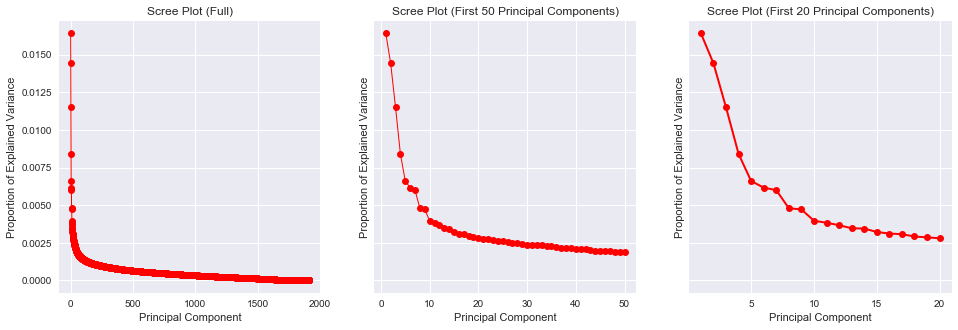

In [377]:
# Optimal number of principle components
n = len(IL_dfTrain)
# Initialize
fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize = (16, 5), sharey=True)
# 1
eigen_vals = np.arange(n) + 1
ax1.plot(eigen_vals, pca.explained_variance_ratio_, 'ro-', linewidth=1)
ax1.set_title('Scree Plot (Full)')
ax1.set_xlabel('Principal Component')
ax1.set_ylabel('Proportion of Explained Variance')
# 2
eigen_vals = np.arange(50) + 1
ax2.plot(eigen_vals, pca.explained_variance_ratio_[:50], 'ro-', linewidth=1)
ax2.set_title('Scree Plot (First 50 Principal Components)')
ax2.set_xlabel('Principal Component')
ax2.set_ylabel('Proportion of Explained Variance')
# 3
eigen_vals = np.arange(20) + 1
ax3.plot(eigen_vals, pca.explained_variance_ratio_[:20], 'ro-', linewidth=2)
ax3.set_title('Scree Plot (First 20 Principal Components)')
ax3.set_xlabel('Principal Component')
ax3.set_ylabel('Proportion of Explained Variance')
# Plot
plt.show()

According to the elbow point, I'll choose the first 10 principal components as my covariates.

In [378]:
IL_dfTrain['pca_reduced_10'] = IL_dfTrain['pca'].apply(lambda x: x[:10])

In [379]:
# Fit a logistic regression
logistic = sklearn.linear_model.LogisticRegression()
logistic.fit(np.stack(IL_dfTrain['pca_reduced_10'], axis=0), IL_dfTrain['category'])
# Performance on the training dataset
logistic.score(np.stack(IL_dfTrain['pca_reduced_10'], axis=0), IL_dfTrain['category'])

0.6346555323590815

In [380]:
# Apply the model on testing dataset

#Create vectors
TFVects_test = TFVectorizer.transform(IL_dfTest['text'])
IL_dfTest['vect'] = [np.array(v).flatten() for v in TFVects_test.todense()]

#PCA
reduced_data_test = pca.transform(np.stack(IL_dfTest['vect'], axis=0))
IL_dfTest['pca'] = [r for r in reduced_data_test]
IL_dfTest['pca_reduced_10'] = IL_dfTest['pca'].apply(lambda x: x[:10])

#Test
logistic.score(np.stack(IL_dfTest['pca_reduced_10'], axis=0), IL_dfTest['category'])

0.6346555323590815

In [381]:
# With panelty
logistic_l2= sklearn.linear_model.LogisticRegression(penalty='l2')
logistic_l2.fit(np.stack(IL_dfTrain['vect'], axis=0), IL_dfTrain['category'])

# Training data
print('Training: ', logistic_l2.score(np.stack(IL_dfTrain['vect'], axis=0), IL_dfTrain['category']))

# Testing data
print('Testing: ', logistic_l2.score(np.stack(IL_dfTest['vect'], axis=0), IL_dfTest['category']))

Training:  0.9211899791231732
Testing:  0.6826722338204593


In [382]:
lucem_illud.evaluateClassifier(logistic_l2, IL_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.68549,0.650236,0.317328,0.732057,0.614458
most_popular,0.68549,0.604446,0.317328,0.644444,0.756522


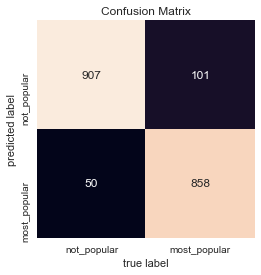

In [383]:
# Confusion Matrix for Training Data
IL_dfTest['logistic_penalty_predict'] = logistic_l2.predict(np.stack(IL_dfTest['vect'], axis=0))
lucem_illud.plotConfusionMatrix(logistic_l2, IL_dfTrain)

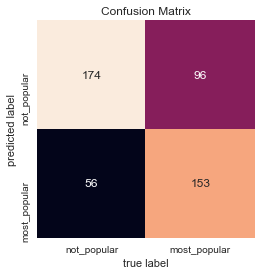

In [384]:
# Confusion Matrix for Testing Data
lucem_illud.plotConfusionMatrix(logistic_l2, IL_dfTest)

In [385]:
print('Accuracy: ', sklearn.metrics.accuracy_score(IL_dfTest['category'], IL_dfTest['logistic_penalty_predict']))
print('Precision: ', sklearn.metrics.precision_score(IL_dfTest['category'], IL_dfTest['logistic_penalty_predict'], average = 'weighted'))
print('Recall: ', sklearn.metrics.recall_score(IL_dfTest['category'], IL_dfTest['logistic_penalty_predict'], average = 'weighted'))
print('F-measures: ', sklearn.metrics.f1_score(IL_dfTest['category'], IL_dfTest['logistic_penalty_predict'], average = 'weighted'))

Accuracy:  0.6826722338204593
Precision:  0.6899885571460124
Recall:  0.6826722338204593
F-measures:  0.6815082367742111


The logistic regression model with L1 regularization did not make it improvement in accuracy and precision on testing data.

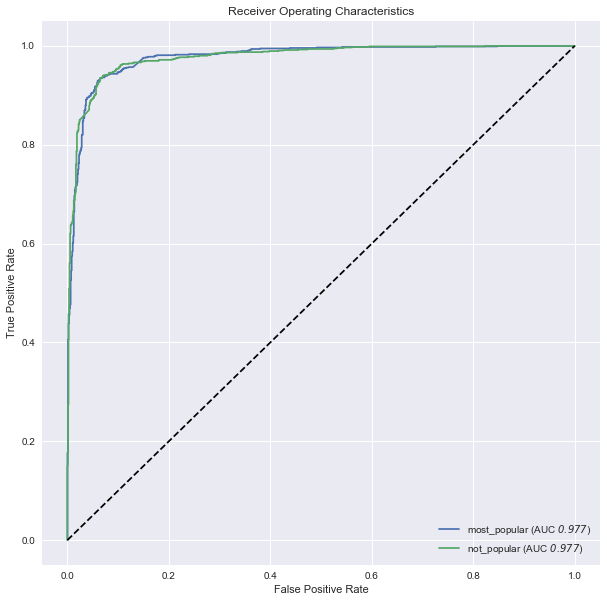

In [386]:
# ROC for Training Data
lucem_illud.plotMultiROC(logistic_l2, IL_dfTrain)

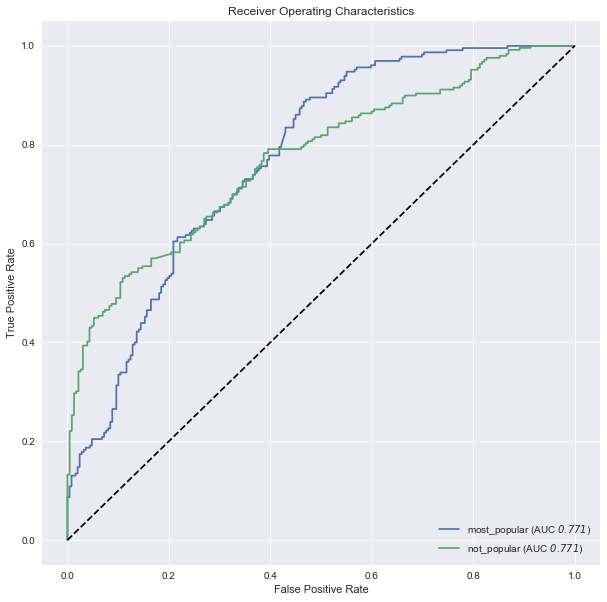

In [387]:
# ROC for Testing Data
lucem_illud.plotMultiROC(logistic_l2, IL_dfTest)

### 5b. Multinomial Naïve Bayes Classification

In [388]:
# Train the model
MultinomialNB = sklearn.naive_bayes.MultinomialNB()
MultinomialNB.fit(np.stack(IL_dfTrain['vect'], axis = 0), IL_dfTrain['category'])

IL_dfTrain['nb_predict'] = MultinomialNB.predict(np.stack(IL_dfTrain['vect'], axis=0))
IL_dfTest['nb_predict'] = MultinomialNB.predict(np.stack(IL_dfTest['vect'], axis=0))
print("Training score:")
print(MultinomialNB.score(np.stack(IL_dfTrain['vect'], axis=0), IL_dfTrain['category']))
print("Testing:")
print(MultinomialNB.score(np.stack(IL_dfTest['vect'], axis=0), IL_dfTest['category']))

Training score:
0.8569937369519833
Testing:
0.6951983298538622


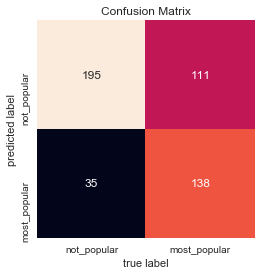

In [389]:
lucem_illud.plotConfusionMatrix(MultinomialNB, IL_dfTest)

In [390]:
print('Accuracy: ', sklearn.metrics.accuracy_score(IL_dfTest['category'], IL_dfTest['nb_predict']))
print('Precision: ', sklearn.metrics.precision_score(IL_dfTest['category'], IL_dfTest['nb_predict'], average='weighted'))
print('Recall: ', sklearn.metrics.recall_score(IL_dfTest['category'], IL_dfTest['nb_predict'], average='weighted'))
print('F-measures: ', sklearn.metrics.f1_score(IL_dfTest['category'], IL_dfTest['nb_predict'], average='weighted'))

Accuracy:  0.6951983298538622
Precision:  0.7206532461537115
Recall:  0.6951983298538622
F-measures:  0.6893608075936891


In [391]:
lucem_illud.metrics.evaluateClassifier(MultinomialNB, IL_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.701021,0.673825,0.304802,0.797688,0.554217
most_popular,0.701021,0.613350,0.304802,0.637255,0.847826


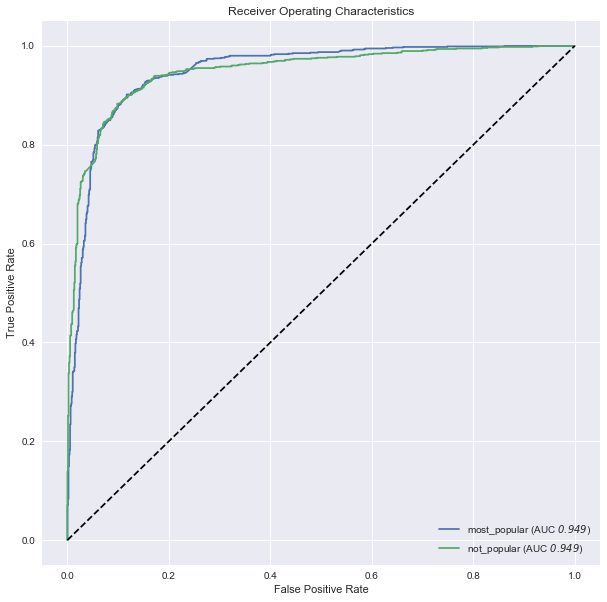

In [392]:
# ROC visualization on training dataset
lucem_illud.plotMultiROC(MultinomialNB, IL_dfTrain)

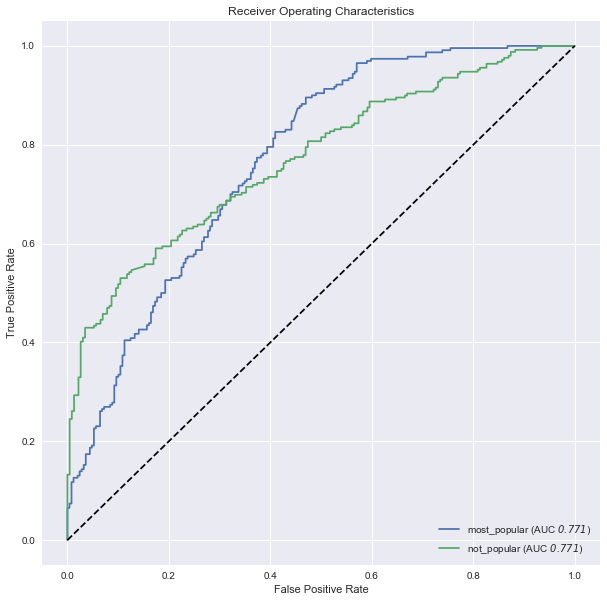

In [393]:
# ROC visualization on testing dataset
lucem_illud.plotMultiROC(MultinomialNB, IL_dfTest)

### 5c. Decision Tree

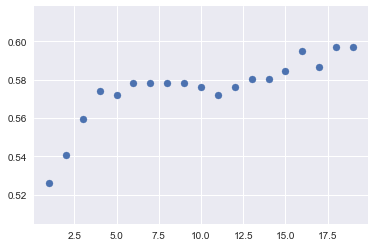

In [394]:
depthvec = []
scorevec = []
for i in range(1,20):
    tree2 = sklearn.tree.DecisionTreeClassifier(max_depth=i,random_state=0)
    tree2.fit(np.stack(IL_dfTrain['vect'], axis =0), IL_dfTrain['category'])
    score = sklearn.metrics.accuracy_score(IL_dfTest['category'], tree2.predict(np.stack(IL_dfTest['vect'], axis = 0)))
    depthvec.append(i)
    scorevec.append(score)
plt.scatter(depthvec,scorevec)
plt.show()

From the plot above, we can find the optimal layers of the decision tree. So we can choose 16 layers.

In [395]:
clf_tree = sklearn.tree.DecisionTreeClassifier(max_depth=16,random_state=0)
clf_tree.fit(np.stack(IL_dfTrain['vect'], axis =0), IL_dfTrain['category'])

IL_dfTest['decision_tree_predict'] = clf_tree.predict(np.stack(IL_dfTest['vect'], axis=0))

In [396]:
lucem_illud.evaluateClassifier(clf_tree, IL_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.608119,0.606150,0.40501,0.831325,0.277108
most_popular,0.608119,0.541481,0.40501,0.545455,0.939130


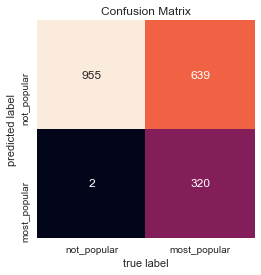

In [397]:
# Confusion Matrix for training dataset
lucem_illud.plotConfusionMatrix(clf_tree, IL_dfTrain)

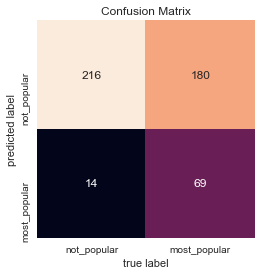

In [398]:
# Confusion Matrix for testing dataset
lucem_illud.plotConfusionMatrix(clf_tree, IL_dfTest)

In [399]:
print('Accuracy: ', sklearn.metrics.accuracy_score(IL_dfTest['category'], IL_dfTest['decision_tree_predict']))
print('Precision: ', sklearn.metrics.precision_score(IL_dfTest['category'], IL_dfTest['decision_tree_predict'], average='weighted'))
print('Recall: ', sklearn.metrics.recall_score(IL_dfTest['category'], IL_dfTest['decision_tree_predict'], average='weighted'))
print('F-measures: ', sklearn.metrics.f1_score(IL_dfTest['category'],IL_dfTest['decision_tree_predict'], average='weighted'))

Accuracy:  0.5949895615866388
Precision:  0.6940595938508255
Recall:  0.5949895615866388
F-measures:  0.5474364190572746


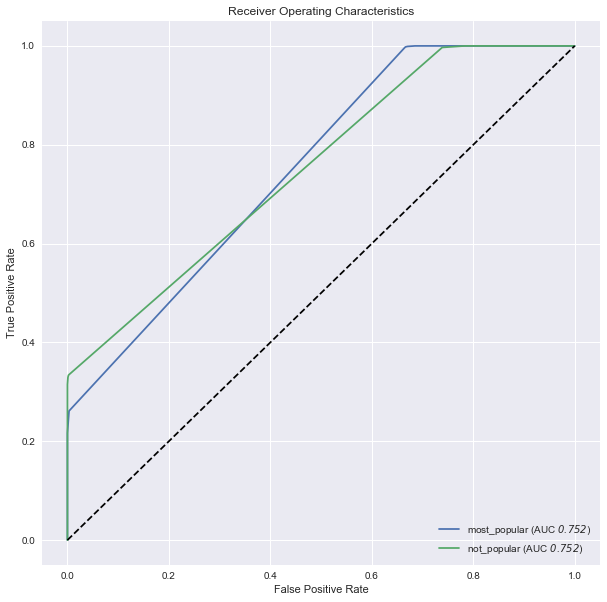

In [400]:
# ROC for training dataset
lucem_illud.plotMultiROC(clf_tree, IL_dfTrain)

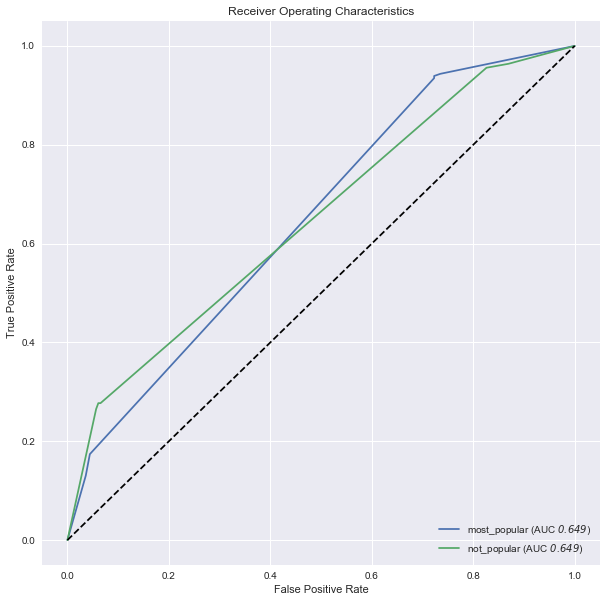

In [401]:
# ROC for testing dataset
lucem_illud.plotMultiROC(clf_tree, IL_dfTest)

The decision tree is still non-ideal.

### 5d. Bagging Trees

In [404]:
tree = sklearn.tree.DecisionTreeClassifier(max_depth=10)
bag = sklearn.ensemble.BaggingClassifier(tree, n_estimators=100, max_samples=0.8, random_state=1)
bag.fit(np.stack(IL_dfTrain['vect'], axis =0), IL_dfTrain['category'])
IL_dfTest['random_forest_predict'] = bag.predict(np.stack(IL_dfTest['vect'], axis=0))

In [405]:
print('Accuracy Score: ', sklearn.metrics.accuracy_score(IL_dfTest['category'], IL_dfTest['random_forest_predict']))
print('Precision Score: ', sklearn.metrics.precision_score(IL_dfTest['category'], IL_dfTest['random_forest_predict'], average = 'weighted'))
print('Recall: ', sklearn.metrics.recall_score(IL_dfTest['category'], IL_dfTest['random_forest_predict'], average = 'weighted'))
print('F1 Score: ', sklearn.metrics.f1_score(IL_dfTest['category'], IL_dfTest['random_forest_predict'], average = 'weighted'))

Accuracy Score:  0.6200417536534447
Precision Score:  0.7062294186786
Recall:  0.6200417536534447
F1 Score:  0.5848703783910091


In [406]:
lucem_illud.evaluateClassifier(bag, IL_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.631884,0.626017,0.379958,0.838384,0.333333
most_popular,0.631884,0.557385,0.379958,0.563158,0.930435


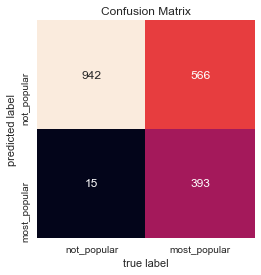

In [407]:
# Confusion Matrix with training dataset
lucem_illud.plotConfusionMatrix(bag, IL_dfTrain)

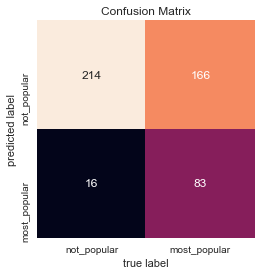

In [408]:
# Confusion Matrix with testing dataset
lucem_illud.plotConfusionMatrix(bag, IL_dfTest)

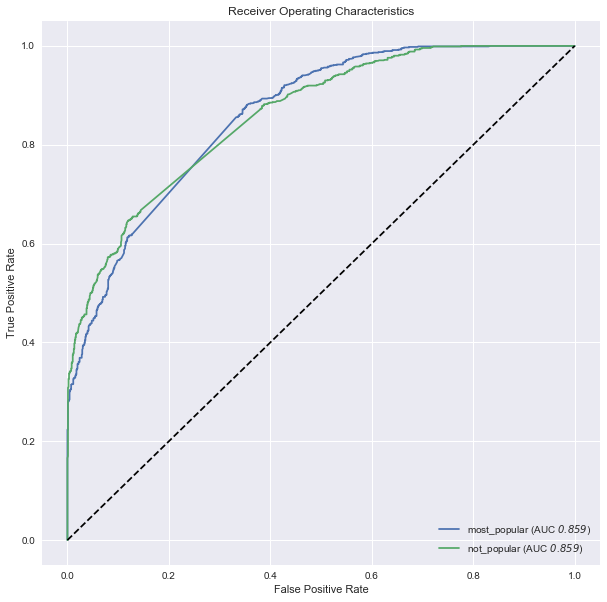

In [409]:
# ROC for training dataset
lucem_illud.plotMultiROC(bag, IL_dfTrain)

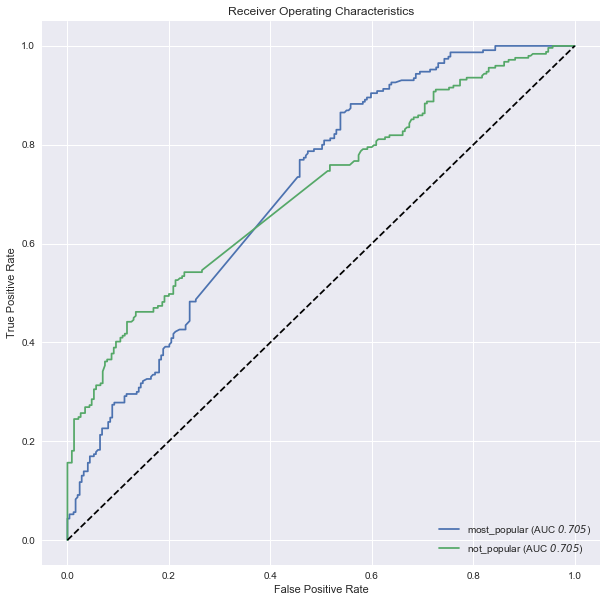

In [410]:
# ROC for testing dataset
lucem_illud.plotMultiROC(bag, IL_dfTest)

### 5e. Random Forest

In [411]:
clf_rf = sklearn.ensemble.RandomForestClassifier()
clf_rf.fit(np.stack(IL_dfTrain['vect'], axis =0), IL_dfTrain['category'])
IL_dfTest['rf_not_bagging'] = clf_rf.predict(np.stack(IL_dfTest['vect'], axis=0))

In [412]:
print('Accuracy: ', sklearn.metrics.accuracy_score(IL_dfTest['category'], IL_dfTest['rf_not_bagging']))
print('Precision: ', sklearn.metrics.precision_score(IL_dfTest['category'], IL_dfTest['rf_not_bagging'], average='weighted'))
print('Recall: ', sklearn.metrics.recall_score(IL_dfTest['category'], IL_dfTest['rf_not_bagging'], average='weighted'))
print('F1 Score: ', sklearn.metrics.f1_score(IL_dfTest['category'], IL_dfTest['rf_not_bagging'], average='weighted'))

Accuracy:  0.697286012526096
Precision:  0.6998615799410862
Recall:  0.697286012526096
F1 Score:  0.6972305986762204


In [413]:
lucem_illud.evaluateClassifier(clf_rf, IL_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.698551,0.658658,0.302714,0.728070,0.666667
most_popular,0.698551,0.618333,0.302714,0.669323,0.730435


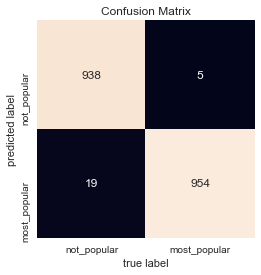

In [414]:
# Confusion Matrix for training dataset
lucem_illud.plotConfusionMatrix(clf_rf, IL_dfTrain)

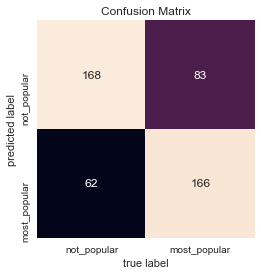

In [415]:
# Confusion Matrix for testing dataset
lucem_illud.plotConfusionMatrix(clf_rf, IL_dfTest)

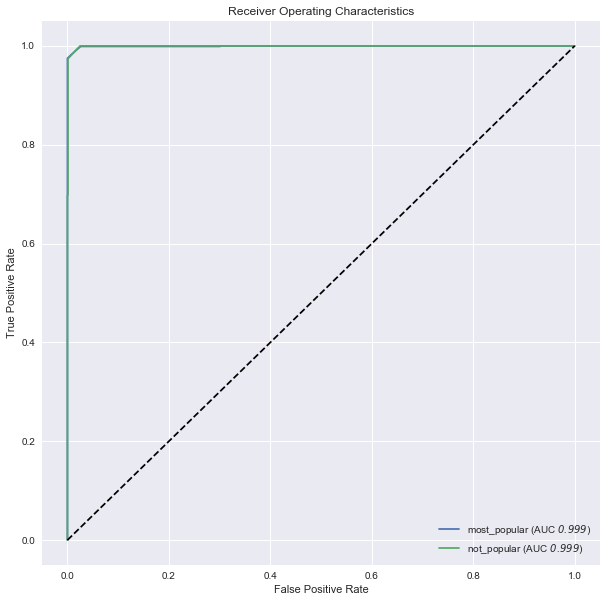

In [416]:
# ROC for training dataset
lucem_illud.plotMultiROC(clf_rf, IL_dfTrain)

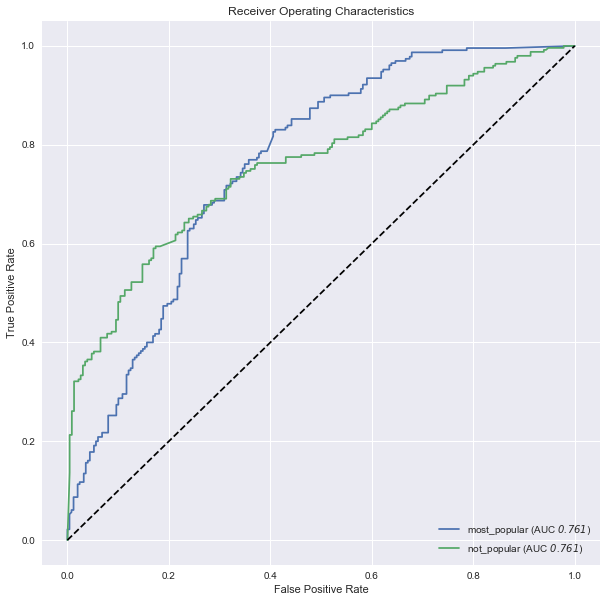

In [417]:
# ROC for testing dataset
lucem_illud.plotMultiROC(clf_rf, IL_dfTest)

### 5f. K-Nearest Neighbors

In [418]:
n_neighbors = 5
weights="uniform"
clf_knn = sklearn.neighbors.KNeighborsClassifier(n_neighbors, weights=weights)
clf_knn.fit(np.stack(IL_dfTrain['vect'], axis = 0), IL_dfTrain['category'])
IL_dfTest['knn_predict'] = clf_knn.predict(np.stack(IL_dfTest['vect'], axis=0))

In [419]:
print('Accuracy: ', sklearn.metrics.accuracy_score(IL_dfTest['category'], IL_dfTest['knn_predict']))
print('Precision: ', sklearn.metrics.precision_score(IL_dfTest['category'], IL_dfTest['knn_predict'], average='weighted'))
print('Recall: ', sklearn.metrics.recall_score(IL_dfTest['category'], IL_dfTest['knn_predict'], average='weighted'))
print('F1 Score: ', sklearn.metrics.f1_score(IL_dfTest['category'], IL_dfTest['knn_predict'], average='weighted'))

Accuracy:  0.5720250521920668
Precision:  0.5710052649168899
Recall:  0.5720250521920668
F1 Score:  0.5691019965560103


In [420]:
lucem_illud.evaluateClassifier(clf_knn, IL_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.568779,0.558048,0.427975,0.578571,0.650602
most_popular,0.568779,0.520413,0.427975,0.562814,0.486957


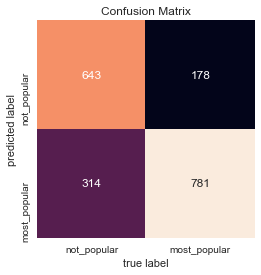

In [421]:
# Confusion Matrix with training dataset
lucem_illud.plotConfusionMatrix(clf_knn, IL_dfTrain)

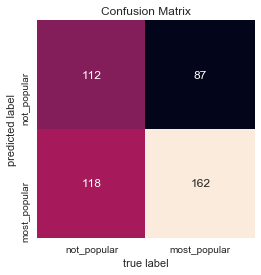

In [422]:
# Confusion Matrix with testing dataset
lucem_illud.plotConfusionMatrix(clf_knn, IL_dfTest)

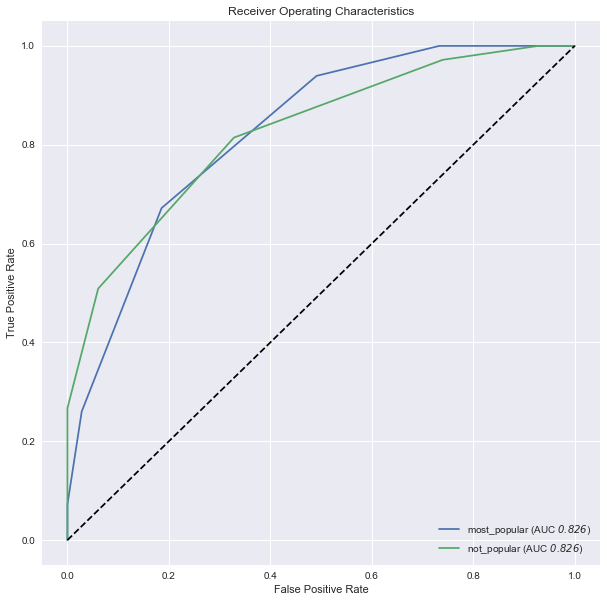

In [423]:
# ROC for training dataset
lucem_illud.plotMultiROC(clf_knn, IL_dfTrain)

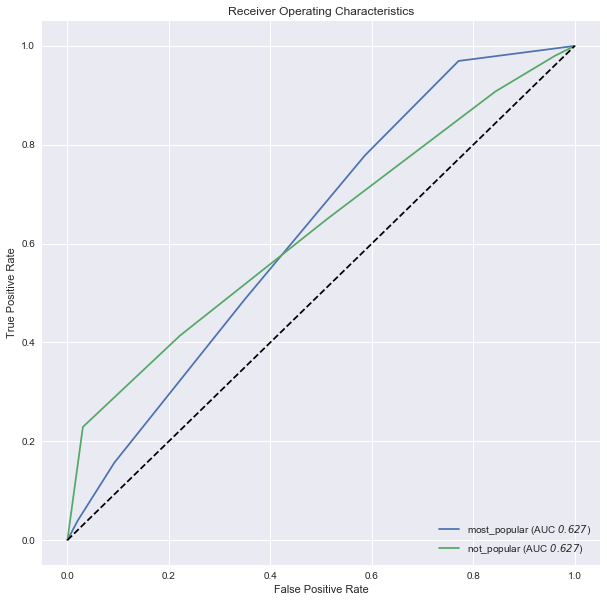

In [424]:
# ROC for testing dataset
lucem_illud.plotMultiROC(clf_knn, IL_dfTest)

However, we find that KNN does not have a good performance on classification and it may be caused the initial value of k selection.

### 5g. SVM

In [425]:
# Linear kernel
clf_svm = sklearn.svm.SVC(kernel='linear', probability = False)
clf_svm.fit(np.stack(IL_dfTrain['vect'], axis=0), IL_dfTrain['category'])
IL_dfTest['svm_predict'] = clf_svm.predict(np.stack(IL_dfTest['vect'], axis=0))

In [426]:
print('Accuracy Score: ', sklearn.metrics.accuracy_score(IL_dfTest['category'], IL_dfTest['svm_predict']))
print('Precision Score: ', sklearn.metrics.precision_score(IL_dfTest['category'], IL_dfTest['svm_predict'], average = 'weighted'))
print('Recall: ', sklearn.metrics.recall_score(IL_dfTest['category'], IL_dfTest['svm_predict'], average = 'weighted'))
print('F1 Score: ', sklearn.metrics.f1_score(IL_dfTest['category'], IL_dfTest['svm_predict'], average = 'weighted'))

Accuracy Score:  0.6743215031315241
Precision Score:  0.6797251291376649
Recall:  0.6743215031315241
F1 Score:  0.673596876432677


In [427]:
lucem_illud.evaluateClassifier(clf_svm, IL_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.676628,0.641330,0.325678,0.716279,0.618474
most_popular,0.676628,0.597721,0.325678,0.640152,0.734783


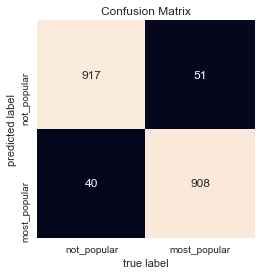

In [428]:
# Confusion Matrix for training dataset
lucem_illud.plotConfusionMatrix(clf_svm, IL_dfTrain)

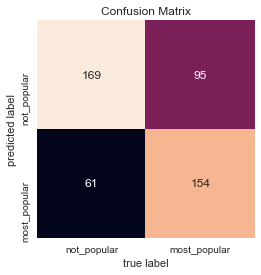

In [429]:
# Confusion Matrix with testing dataset
lucem_illud.plotConfusionMatrix(clf_svm, IL_dfTest)

### 5h. Simple Neural Nets

In [430]:
clf_nn = sklearn.neural_network.MLPClassifier()
clf_nn.fit(np.stack(IL_dfTrain['vect'], axis=0), IL_dfTrain['category'])
IL_dfTest['nn_predict'] = clf_nn.predict(np.stack(IL_dfTest['vect'], axis=0))

In [431]:
print('Accuracy: ', sklearn.metrics.accuracy_score(IL_dfTest['category'], IL_dfTest['nn_predict']))
print('Precision: ', sklearn.metrics.precision_score(IL_dfTest['category'], IL_dfTest['nn_predict'], average='weighted'))
print('Recall: ', sklearn.metrics.recall_score(IL_dfTest['category'], IL_dfTest['nn_predict'], average='weighted'))
print('F1 Score: ', sklearn.metrics.f1_score(IL_dfTest['category'], IL_dfTest['nn_predict'], average='weighted'))

Accuracy:  0.6784968684759917
Precision:  0.6811817618196546
Recall:  0.6784968684759917
F1 Score:  0.6784043826558769


In [432]:
lucem_illud.evaluateClassifier(clf_nn, IL_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.679815,0.642308,0.321503,0.709251,0.646586
most_popular,0.679815,0.601831,0.321503,0.650794,0.713043


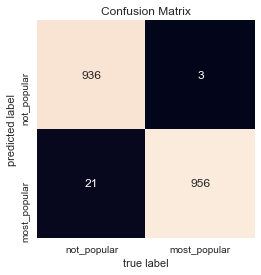

In [433]:
# Confusion Matrix with training dataset
lucem_illud.plotConfusionMatrix(clf_nn, IL_dfTrain)

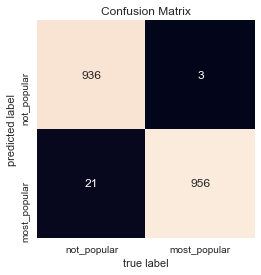

In [434]:
# Confusion Matrix with testing dataset
lucem_illud.plotConfusionMatrix(clf_nn, IL_dfTrain)

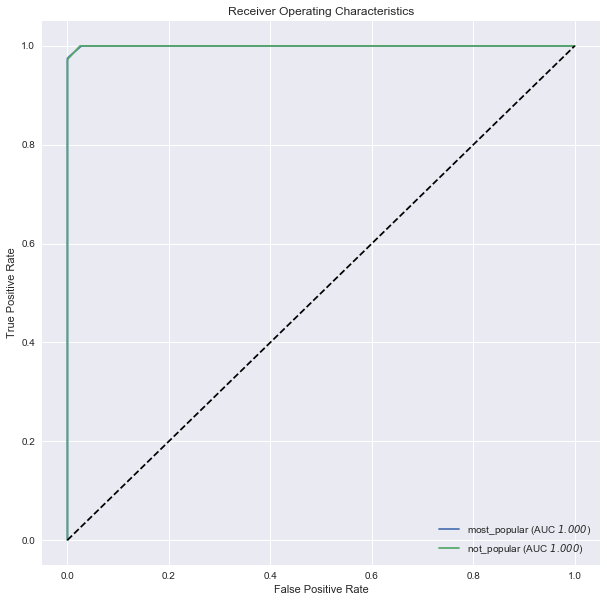

In [435]:
# ROC for training dataset
lucem_illud.plotMultiROC(clf_nn, IL_dfTrain)

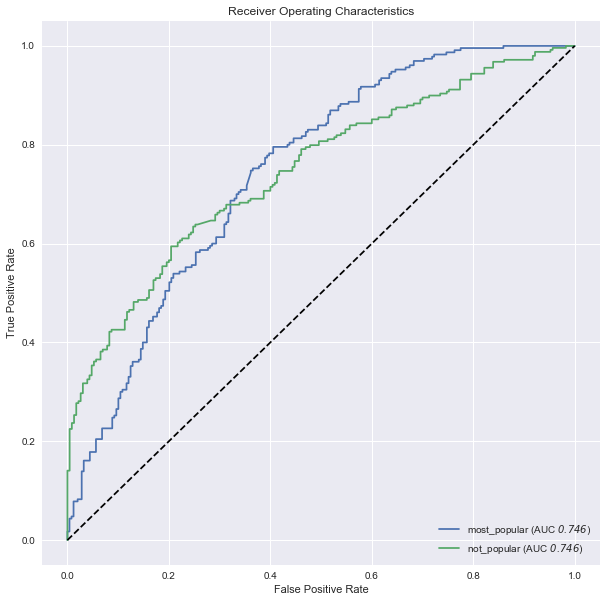

In [436]:
# ROC for Testing dataset
lucem_illud.plotMultiROC(clf_nn, IL_dfTest)

## 6. Instagram UnderArmour

In [437]:
# Turn the training dataset into a tf-idf matrix
TFVectorizer = sklearn.feature_extraction.text.TfidfVectorizer(max_df=100, min_df=2, stop_words='english', norm='l2')
TFVects = TFVectorizer.fit_transform(ins_udar['text'])
ins_udar['vect'] = [np.array(v).flatten() for v in TFVects.todense()]

In [438]:
# split the dataset into training data and testing data
holdBackFraction = .2
IU_dfTrain, IU_dfTest = lucem_illud.trainTestSplit(ins_udar, holdBackFraction=holdBackFraction)

### 6a. Logistic Classification

In [439]:
# Implement PCA
pca = sklearn.decomposition.PCA()
reduced_data = pca.fit_transform(np.stack(IU_dfTrain['vect'], axis=0))
IU_dfTrain['pca'] = [r for r in reduced_data]

In [440]:
# Logistic classfication without dimension reduction
logistic_full = sklearn.linear_model.LogisticRegression()
logistic_full.fit(np.stack(IU_dfTrain['vect'], axis=0), IU_dfTrain['category'])
# Training data
print(logistic_full.score(np.stack(IU_dfTrain['vect'], axis=0), IU_dfTrain['category']))
# Testing data
print(logistic_full.score(np.stack(IU_dfTest['vect'], axis=0), IU_dfTest['category']))

0.9130208333333333
0.7916666666666666


In [441]:
lucem_illud.evaluateClassifier(logistic_full, IU_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.788836,0.709381,0.208333,0.791469,0.748879
most_popular,0.788836,0.747923,0.208333,0.791822,0.828794


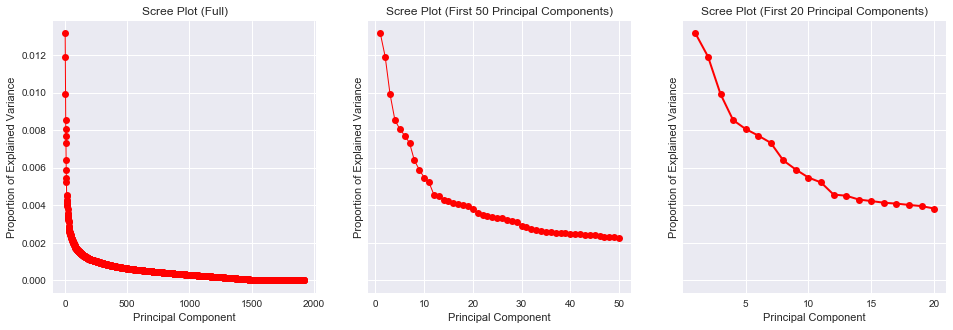

In [442]:
# Optimal number of principle components
n = len(IU_dfTrain)
# Initialize
fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize = (16, 5), sharey=True)
# 1
eigen_vals = np.arange(n) + 1
ax1.plot(eigen_vals, pca.explained_variance_ratio_, 'ro-', linewidth=1)
ax1.set_title('Scree Plot (Full)')
ax1.set_xlabel('Principal Component')
ax1.set_ylabel('Proportion of Explained Variance')
# 2
eigen_vals = np.arange(50) + 1
ax2.plot(eigen_vals, pca.explained_variance_ratio_[:50], 'ro-', linewidth=1)
ax2.set_title('Scree Plot (First 50 Principal Components)')
ax2.set_xlabel('Principal Component')
ax2.set_ylabel('Proportion of Explained Variance')
# 3
eigen_vals = np.arange(20) + 1
ax3.plot(eigen_vals, pca.explained_variance_ratio_[:20], 'ro-', linewidth=2)
ax3.set_title('Scree Plot (First 20 Principal Components)')
ax3.set_xlabel('Principal Component')
ax3.set_ylabel('Proportion of Explained Variance')
# Plot
plt.show()

According to the elbow point, I'll choose the first 10 principal components as my covariates.

In [443]:
IU_dfTrain['pca_reduced_10'] = IU_dfTrain['pca'].apply(lambda x: x[:10])

In [444]:
# Fit a logistic regression
logistic = sklearn.linear_model.LogisticRegression()
logistic.fit(np.stack(IU_dfTrain['pca_reduced_10'], axis=0), IU_dfTrain['category'])
# Performance on the training dataset
logistic.score(np.stack(IU_dfTrain['pca_reduced_10'], axis=0), IU_dfTrain['category'])

0.6791666666666667

In [445]:
# Apply the model on testing dataset

#Create vectors
TFVects_test = TFVectorizer.transform(IU_dfTest['text'])
IU_dfTest['vect'] = [np.array(v).flatten() for v in TFVects_test.todense()]

#PCA
reduced_data_test = pca.transform(np.stack(IU_dfTest['vect'], axis=0))
IU_dfTest['pca'] = [r for r in reduced_data_test]
IU_dfTest['pca_reduced_10'] = IU_dfTest['pca'].apply(lambda x: x[:10])

#Test
logistic.score(np.stack(IU_dfTest['pca_reduced_10'], axis=0), IU_dfTest['category'])

0.6833333333333333

In [446]:
# With panelty
logistic_l2= sklearn.linear_model.LogisticRegression(penalty='l2')
logistic_l2.fit(np.stack(IU_dfTrain['vect'], axis=0), IU_dfTrain['category'])

# Training data
print('Training: ', logistic_l2.score(np.stack(IU_dfTrain['vect'], axis=0), IU_dfTrain['category']))

# Testing data
print('Testing: ', logistic_l2.score(np.stack(IU_dfTest['vect'], axis=0), IU_dfTest['category']))

Training:  0.9130208333333333
Testing:  0.7916666666666666


In [447]:
lucem_illud.evaluateClassifier(logistic_l2, IU_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.788836,0.709381,0.208333,0.791469,0.748879
most_popular,0.788836,0.747923,0.208333,0.791822,0.828794


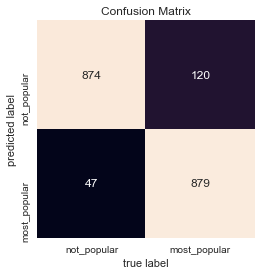

In [448]:
# Confusion Matrix for Training Data
IU_dfTest['logistic_penalty_predict'] = logistic_l2.predict(np.stack(IU_dfTest['vect'], axis=0))
lucem_illud.plotConfusionMatrix(logistic_l2, IU_dfTrain)

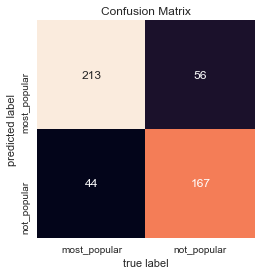

In [449]:
# Confusion Matrix for Testing Data
lucem_illud.plotConfusionMatrix(logistic_l2, IU_dfTest)

In [450]:
print('Accuracy: ', sklearn.metrics.accuracy_score(IU_dfTest['category'], IU_dfTest['logistic_penalty_predict']))
print('Precision: ', sklearn.metrics.precision_score(IU_dfTest['category'], IU_dfTest['logistic_penalty_predict'], average = 'weighted'))
print('Recall: ', sklearn.metrics.recall_score(IU_dfTest['category'], IU_dfTest['logistic_penalty_predict'], average = 'weighted'))
print('F-measures: ', sklearn.metrics.f1_score(IU_dfTest['category'], IU_dfTest['logistic_penalty_predict'], average = 'weighted'))

Accuracy:  0.7916666666666666
Precision:  0.7916578574910293
Recall:  0.7916666666666666
F-measures:  0.7911629081903828


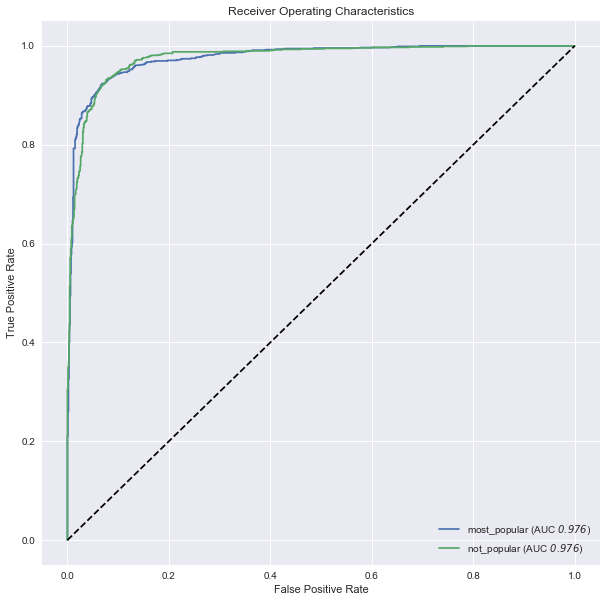

In [451]:
# ROC for Training Data
lucem_illud.plotMultiROC(logistic_l2, IU_dfTrain)

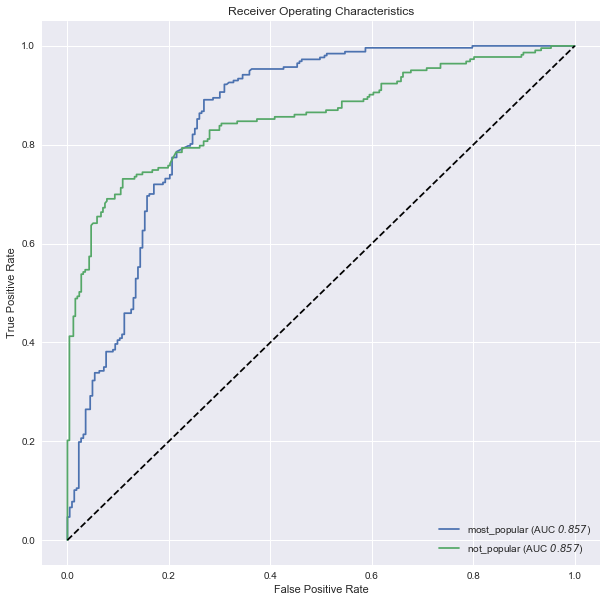

In [452]:
# ROC for Testing Data
lucem_illud.plotMultiROC(logistic_l2, IU_dfTest)

### 2b. Multinomial Naïve Bayes Classification

In [453]:
# Train the model
MultinomialNB = sklearn.naive_bayes.MultinomialNB()
MultinomialNB.fit(np.stack(IU_dfTrain['vect'], axis = 0), IU_dfTrain['category'])

IU_dfTrain['nb_predict'] = MultinomialNB.predict(np.stack(IU_dfTrain['vect'], axis=0))
IU_dfTest['nb_predict'] = MultinomialNB.predict(np.stack(IU_dfTest['vect'], axis=0))
print("Training score:")
print(MultinomialNB.score(np.stack(IU_dfTrain['vect'], axis=0), IU_dfTrain['category']))
print("Testing:")
print(MultinomialNB.score(np.stack(IU_dfTest['vect'], axis=0), IU_dfTest['category']))

Training score:
0.8723958333333334
Testing:
0.8020833333333334


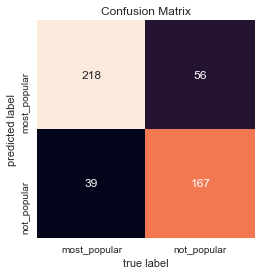

In [454]:
lucem_illud.plotConfusionMatrix(MultinomialNB, IU_dfTest)

In [455]:
print('Accuracy: ', sklearn.metrics.accuracy_score(IU_dfTest['category'], IU_dfTest['nb_predict']))
print('Precision: ', sklearn.metrics.precision_score(IU_dfTest['category'], IU_dfTest['nb_predict'], average='weighted'))
print('Recall: ', sklearn.metrics.recall_score(IU_dfTest['category'], IU_dfTest['nb_predict'], average='weighted'))
print('F-measures: ', sklearn.metrics.f1_score(IU_dfTest['category'], IU_dfTest['nb_predict'], average='weighted'))

Accuracy:  0.8020833333333334
Precision:  0.8026166790683391
Recall:  0.8020833333333334
F-measures:  0.8013300651012517


In [456]:
lucem_illud.metrics.evaluateClassifier(MultinomialNB, IU_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.798564,0.723768,0.197917,0.81068,0.748879
most_popular,0.798564,0.756134,0.197917,0.79562,0.848249


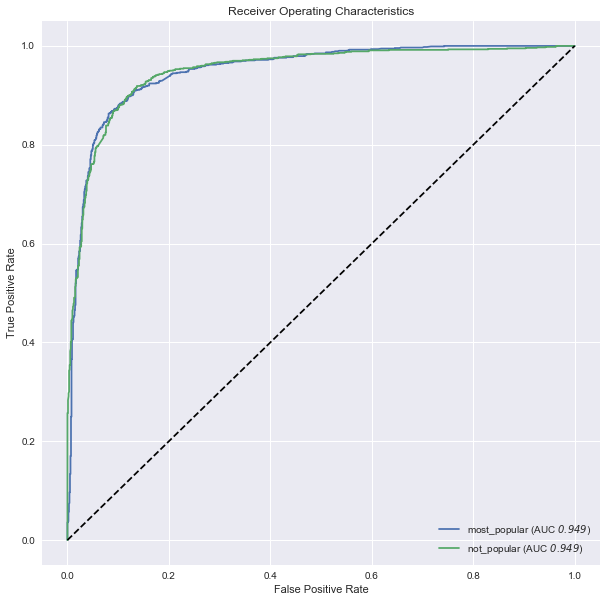

In [457]:
# ROC visualization on training dataset
lucem_illud.plotMultiROC(MultinomialNB, IU_dfTrain)

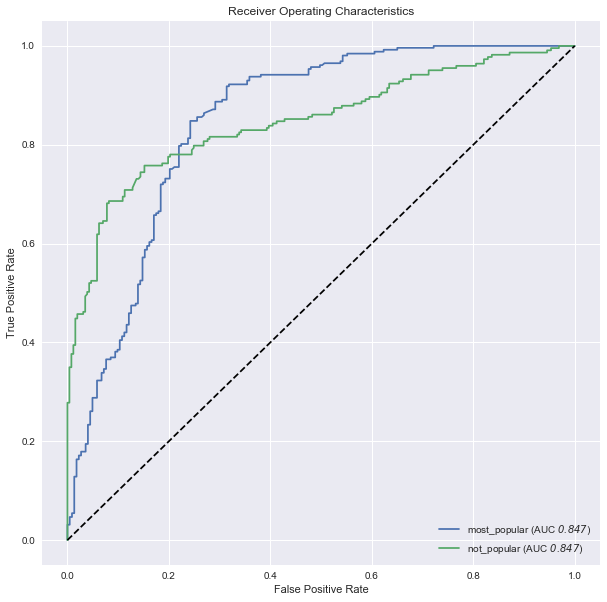

In [458]:
# ROC visualization on testing dataset
lucem_illud.plotMultiROC(MultinomialNB, IU_dfTest)

### 2c. Decision Tree

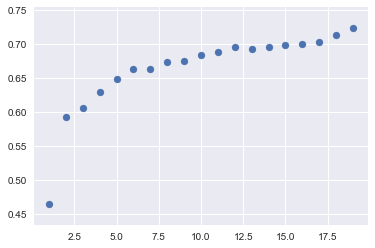

In [459]:
depthvec = []
scorevec = []
for i in range(1,20):
    tree2 = sklearn.tree.DecisionTreeClassifier(max_depth=i,random_state=0)
    tree2.fit(np.stack(IU_dfTrain['vect'], axis =0), IU_dfTrain['category'])
    score = sklearn.metrics.accuracy_score(IU_dfTest['category'], tree2.predict(np.stack(IU_dfTest['vect'], axis = 0)))
    depthvec.append(i)
    scorevec.append(score)
plt.scatter(depthvec,scorevec)
plt.show()

From the plot above, we can find the optimal layers of the decision tree. So we can choose 12 layers.

In [460]:
clf_tree = sklearn.tree.DecisionTreeClassifier(max_depth=12,random_state=0)
clf_tree.fit(np.stack(IU_dfTrain['vect'], axis =0), IU_dfTrain['category'])

IU_dfTest['decision_tree_predict'] = clf_tree.predict(np.stack(IU_dfTest['vect'], axis=0))

In [461]:
lucem_illud.evaluateClassifier(clf_tree, IU_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.675612,0.633248,0.304167,0.896907,0.390135
most_popular,0.675612,0.640648,0.304167,0.644909,0.961089


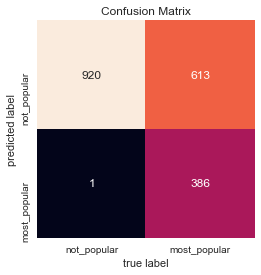

In [462]:
# Confusion Matrix for training dataset
lucem_illud.plotConfusionMatrix(clf_tree, IU_dfTrain)

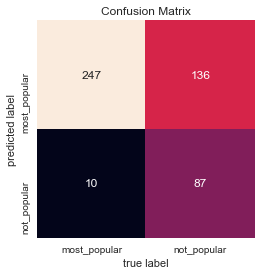

In [463]:
# Confusion Matrix for testing dataset
lucem_illud.plotConfusionMatrix(clf_tree, IU_dfTest)

In [464]:
print('Accuracy: ', sklearn.metrics.accuracy_score(IU_dfTest['category'], IU_dfTest['decision_tree_predict']))
print('Precision: ', sklearn.metrics.precision_score(IU_dfTest['category'], IU_dfTest['decision_tree_predict'], average='weighted'))
print('Recall: ', sklearn.metrics.recall_score(IU_dfTest['category'], IU_dfTest['decision_tree_predict'], average='weighted'))
print('F-measures: ', sklearn.metrics.f1_score(IU_dfTest['category'],IU_dfTest['decision_tree_predict'], average='weighted'))

Accuracy:  0.6958333333333333
Precision:  0.761982965913883
Recall:  0.6958333333333333
F-measures:  0.6658919270833332


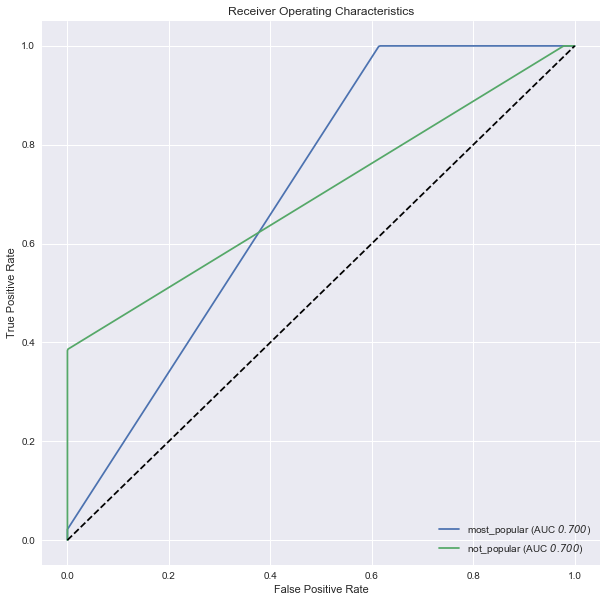

In [465]:
# ROC for training dataset
lucem_illud.plotMultiROC(clf_tree, IU_dfTrain)

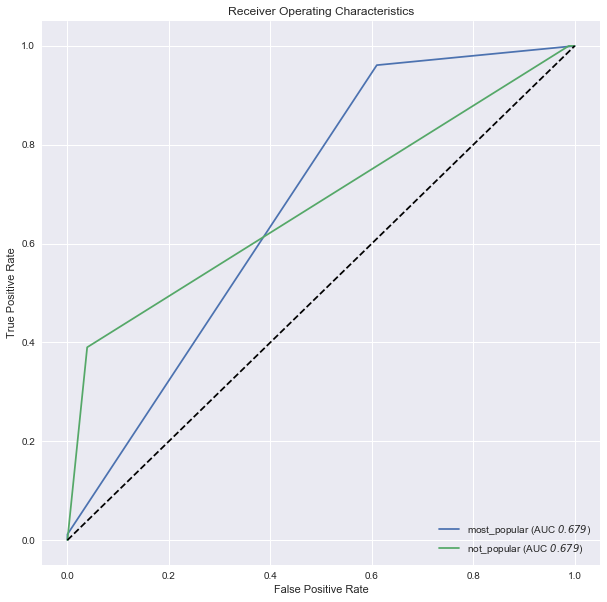

In [466]:
# ROC for testing dataset
lucem_illud.plotMultiROC(clf_tree, IU_dfTest)

The decision tree is still non-ideal.

### 2d. Bagging Trees

In [467]:
tree = sklearn.tree.DecisionTreeClassifier(max_depth=10)
bag = sklearn.ensemble.BaggingClassifier(tree, n_estimators=100, max_samples=0.8, random_state=1)
bag.fit(np.stack(IU_dfTrain['vect'], axis =0), IU_dfTrain['category'])
IU_dfTest['random_forest_predict'] = bag.predict(np.stack(IU_dfTest['vect'], axis=0))

In [468]:
print('Accuracy Score: ', sklearn.metrics.accuracy_score(IU_dfTest['category'], IU_dfTest['random_forest_predict']))
print('Precision Score: ', sklearn.metrics.precision_score(IU_dfTest['category'], IU_dfTest['random_forest_predict'], average = 'weighted'))
print('Recall: ', sklearn.metrics.recall_score(IU_dfTest['category'], IU_dfTest['random_forest_predict'], average = 'weighted'))
print('F1 Score: ', sklearn.metrics.f1_score(IU_dfTest['category'], IU_dfTest['random_forest_predict'], average = 'weighted'))

Accuracy Score:  0.7166666666666667
Precision Score:  0.7529220657276994
Recall:  0.7166666666666667
F1 Score:  0.6994572158365261


In [469]:
lucem_illud.evaluateClassifier(bag, IU_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.700703,0.646835,0.283333,0.848000,0.475336
most_popular,0.700703,0.660442,0.283333,0.670423,0.926070


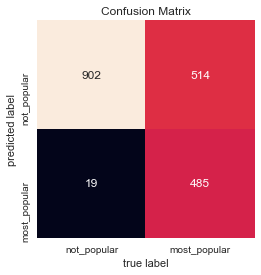

In [470]:
# Confusion Matrix with training dataset
lucem_illud.plotConfusionMatrix(bag, IU_dfTrain)

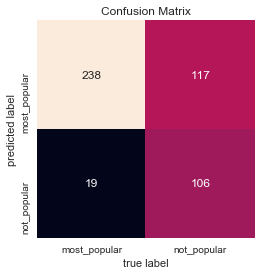

In [471]:
# Confusion Matrix with testing dataset
lucem_illud.plotConfusionMatrix(bag, IU_dfTest)

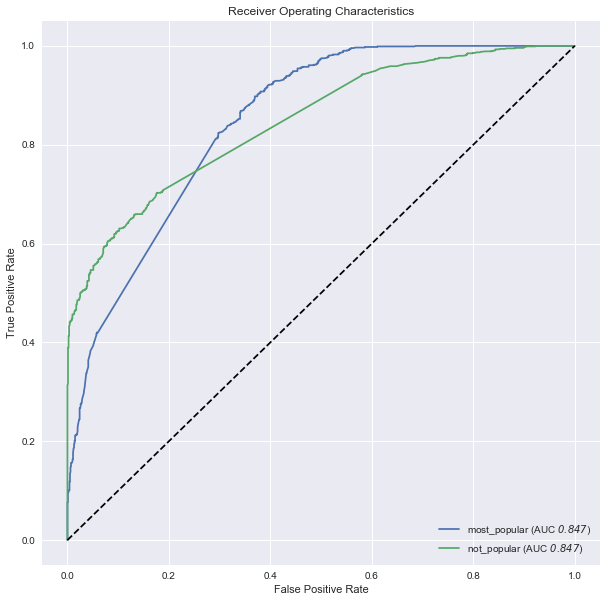

In [472]:
# ROC for training dataset
lucem_illud.plotMultiROC(bag, IU_dfTrain)

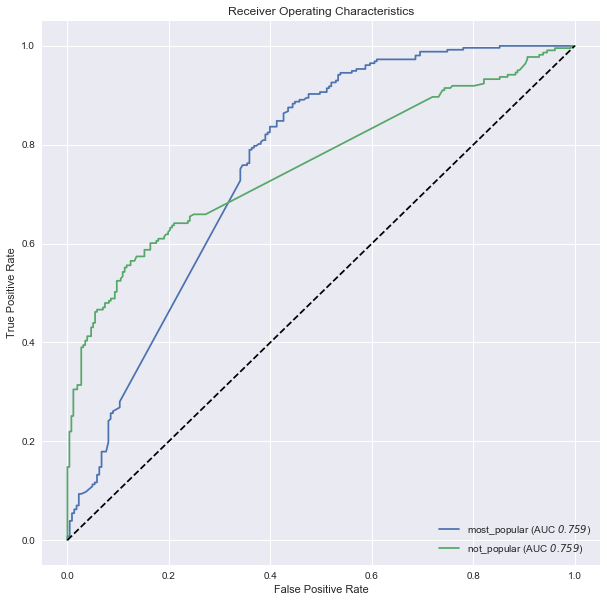

In [473]:
# ROC for testing dataset
lucem_illud.plotMultiROC(bag, IU_dfTest)

### 2e. Random Forest

In [474]:
clf_rf = sklearn.ensemble.RandomForestClassifier()
clf_rf.fit(np.stack(IU_dfTrain['vect'], axis =0), IU_dfTrain['category'])
IU_dfTest['rf_not_bagging'] = clf_rf.predict(np.stack(IU_dfTest['vect'], axis=0))

In [475]:
print('Accuracy: ', sklearn.metrics.accuracy_score(IU_dfTest['category'], IU_dfTest['rf_not_bagging']))
print('Precision: ', sklearn.metrics.precision_score(IU_dfTest['category'], IU_dfTest['rf_not_bagging'], average='weighted'))
print('Recall: ', sklearn.metrics.recall_score(IU_dfTest['category'], IU_dfTest['rf_not_bagging'], average='weighted'))
print('F1 Score: ', sklearn.metrics.f1_score(IU_dfTest['category'], IU_dfTest['rf_not_bagging'], average='weighted'))

Accuracy:  0.7604166666666666
Precision:  0.768475233954885
Recall:  0.7604166666666666
F1 Score:  0.7603802714710857


In [476]:
lucem_illud.evaluateClassifier(clf_rf, IU_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.7644,0.665407,0.239583,0.709302,0.820628
most_popular,0.7644,0.736823,0.239583,0.819820,0.708171


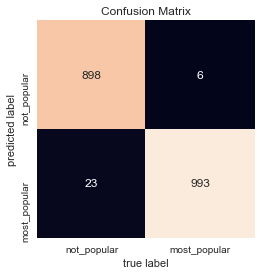

In [477]:
# Confusion Matrix for training dataset
lucem_illud.plotConfusionMatrix(clf_rf, IU_dfTrain)

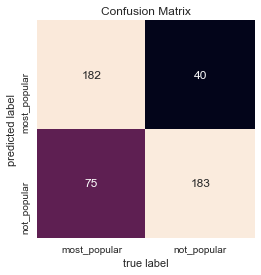

In [478]:
# Confusion Matrix for testing dataset
lucem_illud.plotConfusionMatrix(clf_rf, IU_dfTest)

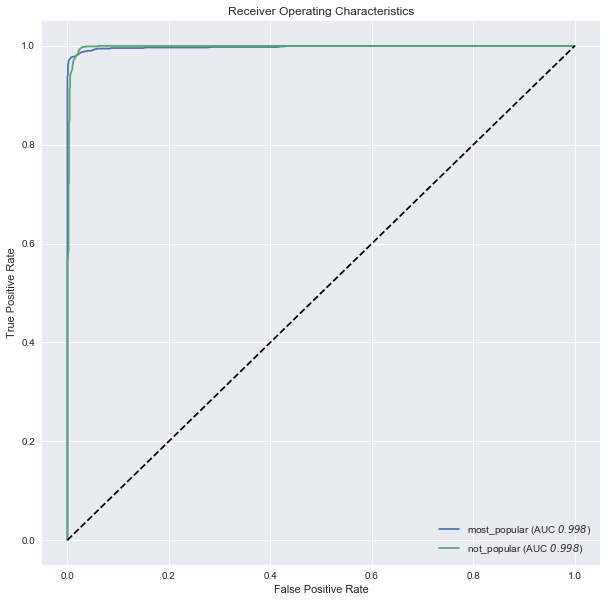

In [479]:
# ROC for training dataset
lucem_illud.plotMultiROC(clf_rf, IU_dfTrain)

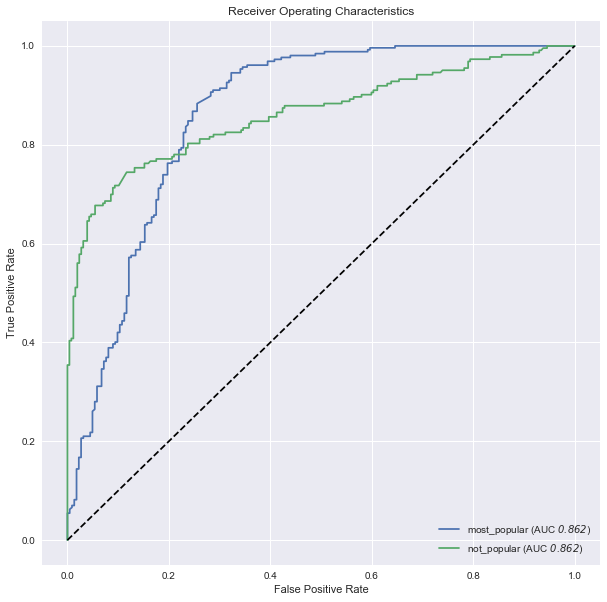

In [480]:
# ROC for testing dataset
lucem_illud.plotMultiROC(clf_rf, IU_dfTest)

### 2f. K-Nearest Neighbors

In [481]:
n_neighbors = 5
weights="uniform"
clf_knn = sklearn.neighbors.KNeighborsClassifier(n_neighbors, weights=weights)
clf_knn.fit(np.stack(IU_dfTrain['vect'], axis = 0), IU_dfTrain['category'])
IU_dfTest['knn_predict'] = clf_knn.predict(np.stack(IU_dfTest['vect'], axis=0))

In [482]:
print('Accuracy: ', sklearn.metrics.accuracy_score(IU_dfTest['category'], IU_dfTest['knn_predict']))
print('Precision: ', sklearn.metrics.precision_score(IU_dfTest['category'], IU_dfTest['knn_predict'], average='weighted'))
print('Recall: ', sklearn.metrics.recall_score(IU_dfTest['category'], IU_dfTest['knn_predict'], average='weighted'))
print('F1 Score: ', sklearn.metrics.f1_score(IU_dfTest['category'], IU_dfTest['knn_predict'], average='weighted'))

Accuracy:  0.5958333333333333
Precision:  0.6539009389671361
Recall:  0.5958333333333333
F1 Score:  0.5721540094325379


In [483]:
lucem_illud.evaluateClassifier(clf_knn, IU_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.613373,0.530244,0.404167,0.540845,0.860987
most_popular,0.613373,0.614634,0.404167,0.752000,0.365759


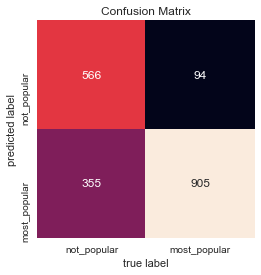

In [484]:
# Confusion Matrix with training dataset
lucem_illud.plotConfusionMatrix(clf_knn, IU_dfTrain)

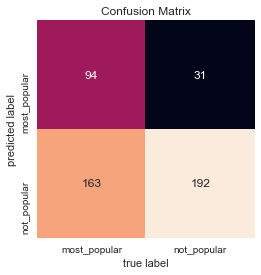

In [485]:
# Confusion Matrix with testing dataset
lucem_illud.plotConfusionMatrix(clf_knn, IU_dfTest)

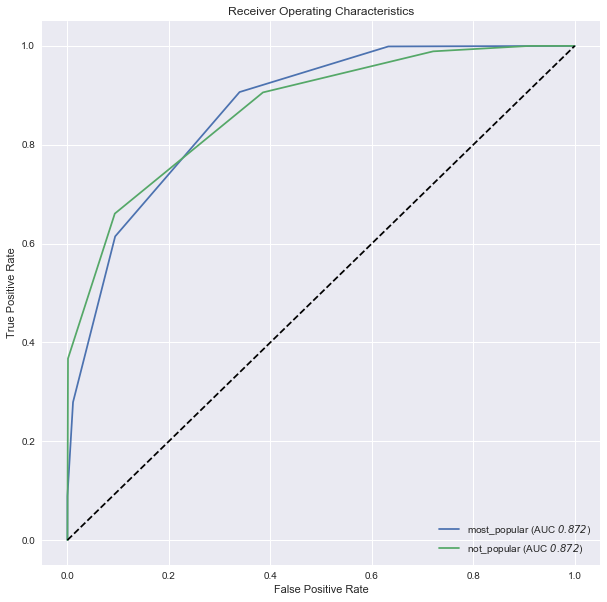

In [486]:
# ROC for training dataset
lucem_illud.plotMultiROC(clf_knn, IU_dfTrain)

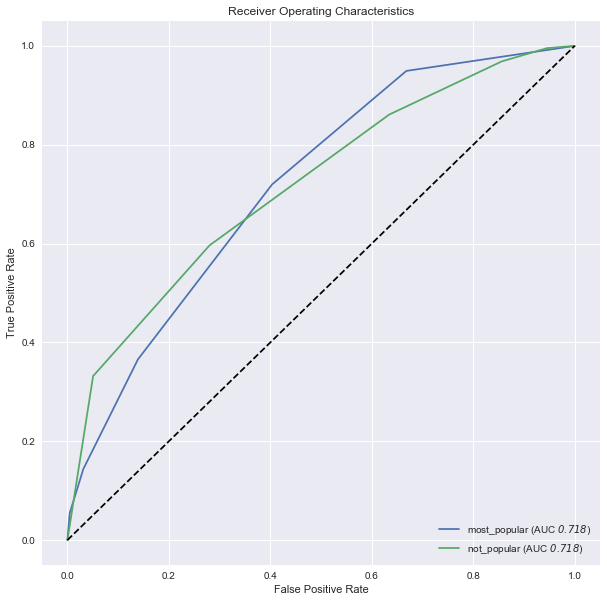

In [487]:
# ROC for testing dataset
lucem_illud.plotMultiROC(clf_knn, IU_dfTest)

However, we find that KNN does not have a good performance on classification and it may be caused the initial value of k selection.

### 2g. SVM

In [488]:
# Linear kernel
clf_svm = sklearn.svm.SVC(kernel='linear', probability = False)
clf_svm.fit(np.stack(IU_dfTrain['vect'], axis=0), IU_dfTrain['category'])
IU_dfTest['svm_predict'] = clf_svm.predict(np.stack(IU_dfTest['vect'], axis=0))

In [489]:
print('Accuracy Score: ', sklearn.metrics.accuracy_score(IU_dfTest['category'], IU_dfTest['svm_predict']))
print('Precision Score: ', sklearn.metrics.precision_score(IU_dfTest['category'], IU_dfTest['svm_predict'], average = 'weighted'))
print('Recall: ', sklearn.metrics.recall_score(IU_dfTest['category'], IU_dfTest['svm_predict'], average = 'weighted'))
print('F1 Score: ', sklearn.metrics.f1_score(IU_dfTest['category'], IU_dfTest['svm_predict'], average = 'weighted'))

Accuracy Score:  0.7916666666666666
Precision Score:  0.7914783048016214
Recall:  0.7916666666666666
F1 Score:  0.7914481351981352


In [490]:
lucem_illud.evaluateClassifier(clf_svm, IU_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.789726,0.707635,0.208333,0.783410,0.762332
most_popular,0.789726,0.750370,0.208333,0.798479,0.817121


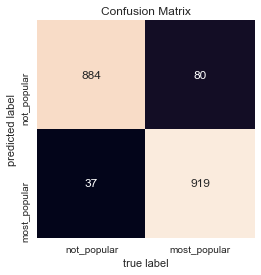

In [491]:
# Confusion Matrix for training dataset
lucem_illud.plotConfusionMatrix(clf_svm, IU_dfTrain)

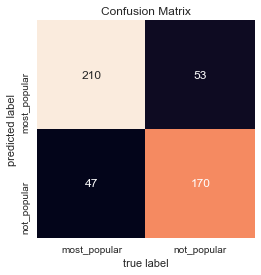

In [492]:
# Confusion Matrix with testing dataset
lucem_illud.plotConfusionMatrix(clf_svm, IU_dfTest)

### 2h. Simple Neural Nets

In [493]:
clf_nn = sklearn.neural_network.MLPClassifier()
clf_nn.fit(np.stack(IU_dfTrain['vect'], axis=0), IU_dfTrain['category'])
IU_dfTest['nn_predict'] = clf_nn.predict(np.stack(IU_dfTest['vect'], axis=0))

In [494]:
print('Accuracy: ', sklearn.metrics.accuracy_score(IU_dfTest['category'], IU_dfTest['nn_predict']))
print('Precision: ', sklearn.metrics.precision_score(IU_dfTest['category'], IU_dfTest['nn_predict'], average='weighted'))
print('Recall: ', sklearn.metrics.recall_score(IU_dfTest['category'], IU_dfTest['nn_predict'], average='weighted'))
print('F1 Score: ', sklearn.metrics.f1_score(IU_dfTest['category'], IU_dfTest['nn_predict'], average='weighted'))

Accuracy:  0.7791666666666667
Precision:  0.7824093608376309
Recall:  0.7791666666666667
F1 Score:  0.7794352690077786


In [495]:
lucem_illud.evaluateClassifier(clf_nn, IU_dfTest)

,AUC,Average_Precision,Error_Rate,Precision,Recall
Category,,,,,
not_popular,0.781019,0.687491,0.220833,0.740741,0.807175
most_popular,0.781019,0.749155,0.220833,0.818565,0.754864


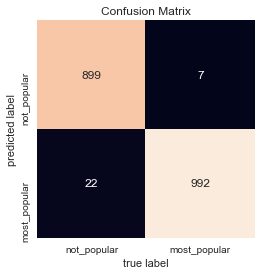

In [496]:
# Confusion Matrix with training dataset
lucem_illud.plotConfusionMatrix(clf_nn, IU_dfTrain)

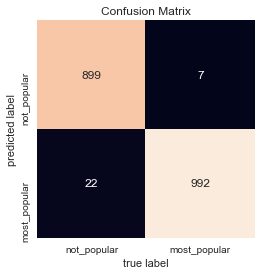

In [497]:
# Confusion Matrix with testing dataset
lucem_illud.plotConfusionMatrix(clf_nn, IU_dfTrain)

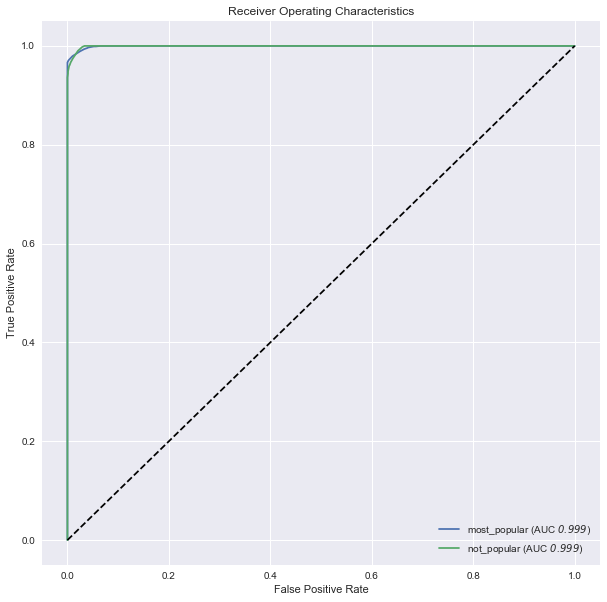

In [498]:
# ROC for training dataset
lucem_illud.plotMultiROC(clf_nn, IU_dfTrain)

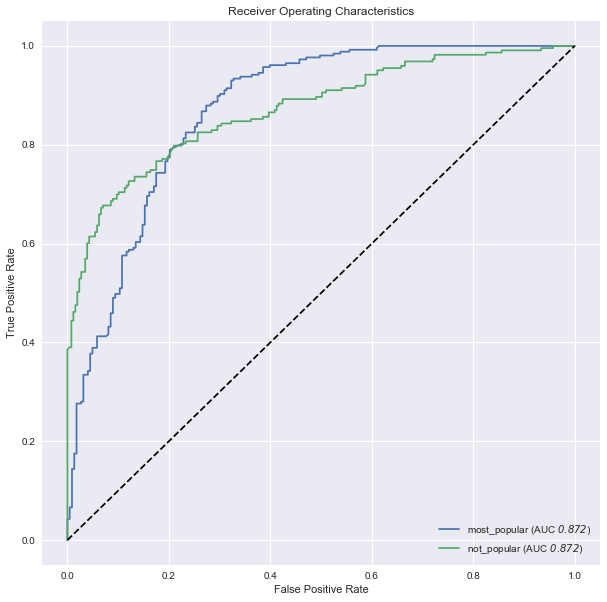

In [499]:
# ROC for Testing dataset
lucem_illud.plotMultiROC(clf_nn, IU_dfTest)